# Apple Stock Price Prediction by using Recurrent Neural Network

_Author: Clara Le_

_Date: 22/11/2023_


In [3]:
# Python ≥3.5 is required
import sys
#assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
#assert sklearn.__version__ >= "0.20"

# Import necessary packages
import numpy as np
import os, time
import pandas as pd

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
mpl.rc('figure', dpi=100)
import seaborn as sns; sns.set()


In [4]:
import tensorflow as tf
tf.test.gpu_device_name()
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 5989965720075412075
 xla_global_id: -1]

In [5]:
# Import tensorflow and keras
import tensorflow as tf

## Load, investigate, manipulate and display the data


In [6]:
# Load training data
train_data = pd.read_csv("/content/train_data.csv")
train_data

,Unnamed: 0,date,open,high,low,close,volume,tic,day
0,0,2010-01-04,7.622500,7.660714,7.585000,6.478998,493729600,AAPL,0
1,0,2010-01-04,56.630001,57.869999,56.560001,41.817791,5277400,AMGN,0
2,0,2010-01-04,40.810001,41.099998,40.389999,33.300182,6894300,AXP,0
3,0,2010-01-04,55.720001,56.389999,54.799999,43.777565,6186700,BA,0
4,0,2010-01-04,57.650002,59.189999,57.509998,40.523602,7325600,CAT,0
...,...,...,...,...,...,...,...,...,...
88248,3018,2021-12-29,504.779999,507.220001,502.000000,493.460846,1573900,UNH,2
88249,3018,2021-12-29,217.759995,218.940002,217.330002,214.826096,3223100,V,2
88250,3018,2021-12-29,52.770000,52.880001,52.340000,46.245869,15109500,VZ,2
88251,3018,2021-12-29,51.450001,52.310001,51.279999,46.588161,5117300,WBA,2


In [7]:
# Only take Apple stock to train models
apple_train = train_data[train_data['tic'] == "AAPL"].reset_index(drop = True)
apple_train

,Unnamed: 0,date,open,high,low,close,volume,tic,day
0,0,2010-01-04,7.622500,7.660714,7.585000,6.478998,493729600,AAPL,0
1,1,2010-01-05,7.664286,7.699643,7.616071,6.490201,601904800,AAPL,1
2,2,2010-01-06,7.656429,7.686786,7.526786,6.386962,552160000,AAPL,2
3,3,2010-01-07,7.562500,7.571429,7.466071,6.375156,477131200,AAPL,3
4,4,2010-01-08,7.510714,7.571429,7.466429,6.417541,447610800,AAPL,4
...,...,...,...,...,...,...,...,...,...
3014,3014,2021-12-22,173.039993,175.860001,172.149994,173.655869,92135300,AAPL,2
3015,3015,2021-12-23,175.850006,176.850006,175.270004,174.288635,68356600,AAPL,3
3016,3016,2021-12-27,177.089996,180.419998,177.070007,178.292862,74919600,AAPL,0
3017,3017,2021-12-28,180.160004,181.330002,178.529999,177.264618,79144300,AAPL,1


In [8]:
# Only consider column for Close price of Apple stocks
apple_train_close = apple_train[['date','close']]
apple_train_close

,date,close
0,2010-01-04,6.478998
1,2010-01-05,6.490201
2,2010-01-06,6.386962
3,2010-01-07,6.375156
4,2010-01-08,6.417541
...,...,...
3014,2021-12-22,173.655869
3015,2021-12-23,174.288635
3016,2021-12-27,178.292862
3017,2021-12-28,177.264618


In [9]:
# Split training dataset to validation set and training set
apple_val_close = apple_train_close.iloc[-500:,:].reset_index(drop = True)
apple_val_close.shape

(500, 2)

In [10]:
# Update apple_train_close dataset
apple_train_close = apple_train_close.iloc[0:-500,:]
apple_train_close.shape

(2519, 2)

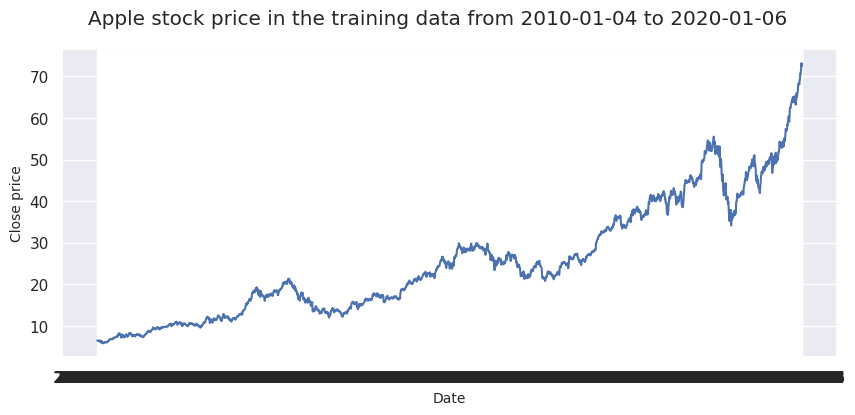

In [11]:
import matplotlib.dates as mdates
from matplotlib.ticker import AutoMinorLocator

# Set date as index of the training data
apple_train_ts = apple_train_close.set_index('date')

# Plotting the graph of close price in training data
fig, axs = plt.subplots(figsize=(10, 4))
axs.plot(apple_train_ts.index, apple_train_ts.close)
fig.suptitle('Apple stock price in the training data from 2010-01-04 to 2020-01-06')
axs.set_xlabel('Date', fontsize = 10)
axs.set_ylabel('Close price', fontsize = 10)
plt.show()

In [12]:
# Take residual (percentage change) of close price in the training data
apple_train_ts_diff = np.diff(np.log(apple_train_ts.close))*100
apple_train_ts_diff

array([ 0.17276033, -1.60346372, -0.18502401, ...,  2.25600543,
       -0.97693457,  0.79363656])

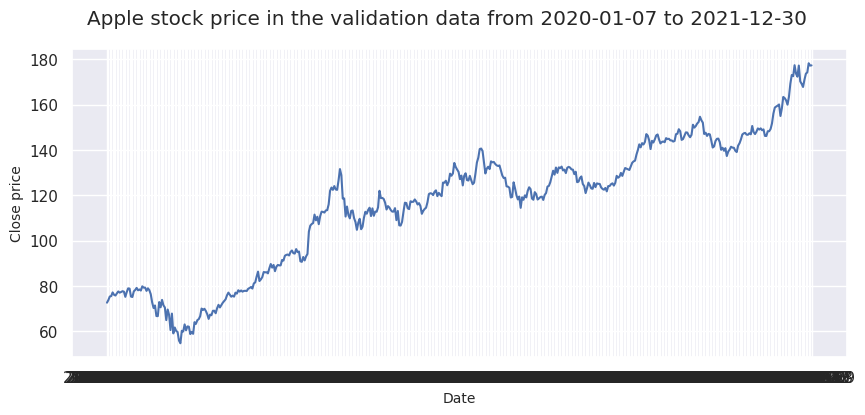

In [13]:
# Set date as index of the validation data
apple_val_ts = apple_val_close.set_index('date')

# Plotting the graph of close price in validation data
fig, axs = plt.subplots(figsize=(10, 4))
axs.plot(apple_val_ts.index, apple_val_ts.close)
fig.suptitle('Apple stock price in the validation data from 2020-01-07 to 2021-12-30')
axs.set_xlabel('Date', fontsize = 10)
axs.set_ylabel('Close price', fontsize = 10)
plt.show()

In [14]:
# Take residual (percentage change) of close price in the validation data
apple_val_ts_diff = np.diff(np.log(apple_val_ts.close))*100
apple_val_ts_diff

array([ 1.59583704e+00,  2.10181365e+00,  2.25825717e-01,  2.11390680e+00,
       -1.35949664e+00, -4.29477351e-01,  1.24485734e+00,  1.10102455e+00,
       -6.79995759e-01,  3.56308504e-01,  4.80438704e-01, -2.88631713e-01,
       -2.98461789e+00,  2.78965569e+00,  2.07161717e+00, -1.44994390e-01,
       -4.53518583e+00, -2.75004527e-01,  3.24802450e+00,  8.12168272e-01,
        1.16288379e+00, -1.36860390e+00,  4.73849792e-01, -6.05166392e-01,
        2.34703489e+00, -7.14663600e-01,  2.46226650e-02, -1.84803754e+00,
        1.43790585e+00, -1.03122231e+00, -2.28947764e+00, -4.86655789e+00,
       -3.44592233e+00,  1.57392159e+00, -6.76027749e+00, -5.84805597e-02,
        8.90181115e+00, -3.22747599e+00,  4.53411247e+00, -3.29747002e+00,
       -1.33692965e+00, -8.23946809e+00,  6.95458370e+00, -3.53481589e+00,
       -1.03977587e+01,  1.13157217e+01, -1.37707720e+01,  4.30307158e+00,
       -2.47844662e+00, -7.69157961e-01, -6.55903993e+00, -2.14729342e+00,
        9.56059066e+00, -

In [15]:
# Dataframe of residual in close price of Apple stock in training data
apple_train_ts_df = pd.DataFrame(apple_train_ts_diff)
apple_train_ts_df.index = np.array(apple_train_close.date[1:])
apple_train_ts_df.columns = ["close"]
apple_train_ts_df

,close
2010-01-05,0.172760
2010-01-06,-1.603464
2010-01-07,-0.185024
2010-01-08,0.662648
2010-01-11,-0.886059
...,...
2019-12-30,0.591751
2019-12-31,0.727993
2020-01-02,2.256005
2020-01-03,-0.976935


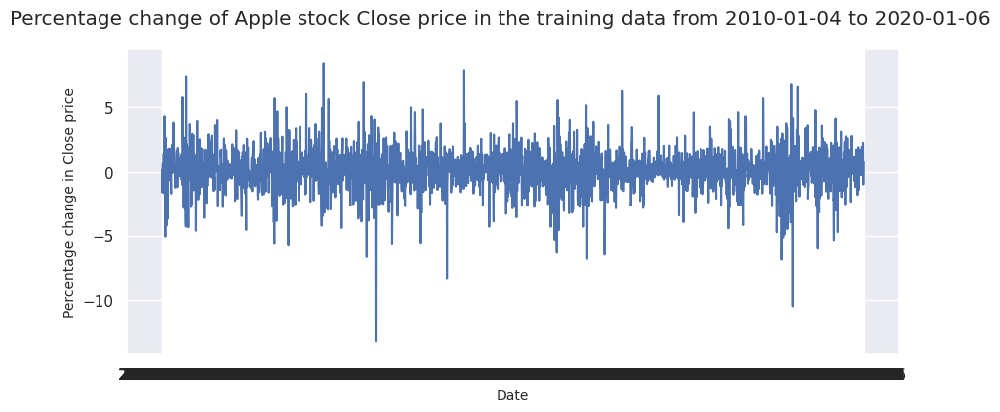

In [16]:
# Plotting the graph of residual in Apple stock price in the training data
fig, axs = plt.subplots(figsize=(10, 4))
axs.plot(apple_train_ts_df.index, apple_train_ts_df.close)
fig.suptitle("Percentage change of Apple stock Close price in the training data from 2010-01-04 to 2020-01-06")
axs.set_xlabel('Date', fontsize = 10)
axs.set_ylabel('Percentage change in Close price', fontsize = 10)
plt.show()


In [17]:
# Dataframe of residual in close price of Apple stock in training data
apple_val_ts_df = pd.DataFrame(apple_val_ts_diff)
apple_val_ts_df.index = np.array(apple_val_close.date[1:])
apple_val_ts_df.columns = ["close"]
apple_val_ts_df

,close
2020-01-08,1.595837
2020-01-09,2.101814
2020-01-10,0.225826
2020-01-13,2.113907
2020-01-14,-1.359497
...,...
2021-12-22,1.520279
2021-12-23,0.363717
2021-12-27,2.271474
2021-12-28,-0.578386


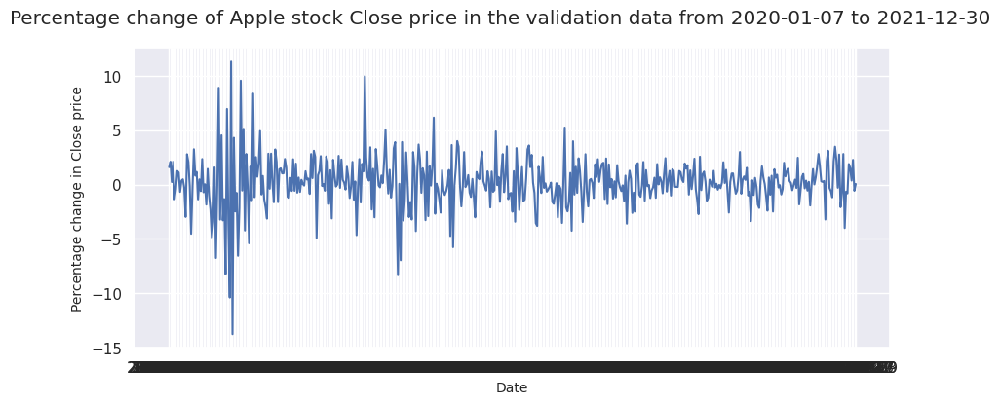

In [18]:
# Plotting the graph of residual in Apple stock price in the training data
fig, axs = plt.subplots(figsize=(10, 4))
axs.plot(apple_val_ts_df.index, apple_val_ts_df.close)
fig.suptitle("Percentage change of Apple stock Close price in the validation data from 2020-01-07 to 2021-12-30")
axs.set_xlabel('Date', fontsize = 10)
axs.set_ylabel('Percentage change in Close price', fontsize = 10)
plt.show()

In [19]:
# Load testing dataset
test_data = pd.read_csv("/content/test_data.csv")
test_data

,Unnamed: 0,date,open,high,low,close,volume,tic,day
0,0,2022-01-03,177.830002,182.880005,177.710007,179.953903,104487900,AAPL,0
1,0,2022-01-03,223.630005,226.970001,222.029999,212.387787,2742800,AMGN,0
2,0,2022-01-03,164.509995,168.399994,164.399994,163.636108,3236400,AXP,0
3,0,2022-01-03,204.000000,210.550003,203.339996,207.860001,9060200,BA,0
4,0,2022-01-03,207.330002,208.600006,205.800003,198.188660,2055600,CAT,0
...,...,...,...,...,...,...,...,...,...
13135,437,2023-09-29,509.850006,509.880005,503.799988,504.190002,3006200,UNH,4
13136,437,2023-09-29,232.839996,233.029999,229.649994,229.521347,6044200,V,4
13137,437,2023-09-29,32.619999,32.750000,32.369999,31.732670,19759400,VZ,4
13138,437,2023-09-29,21.000000,22.430000,20.879999,21.725780,25659100,WBA,4


In [20]:
# Only take Apple stock in the testing set to evaluate models
apple_test = test_data[test_data['tic'] == "AAPL"].reset_index(drop = True)
apple_test

,Unnamed: 0,date,open,high,low,close,volume,tic,day
0,0,2022-01-03,177.830002,182.880005,177.710007,179.953903,104487900,AAPL,0
1,1,2022-01-04,182.630005,182.940002,179.119995,177.669983,99310400,AAPL,1
2,2,2022-01-05,179.610001,180.169998,174.639999,172.943985,94537600,AAPL,2
3,3,2022-01-06,172.699997,175.300003,171.639999,170.056961,96904000,AAPL,3
4,4,2022-01-07,172.889999,174.139999,171.029999,170.225067,86709100,AAPL,4
...,...,...,...,...,...,...,...,...,...
433,433,2023-09-25,174.199997,176.970001,174.149994,175.848328,46172700,AAPL,0
434,434,2023-09-26,174.820007,175.199997,171.660004,171.733749,64588900,AAPL,1
435,435,2023-09-27,172.619995,173.039993,169.050003,170.205750,66921800,AAPL,2
436,436,2023-09-28,169.339996,172.029999,167.619995,170.465424,56294400,AAPL,3


In [21]:
# Only consider column for "closed price" of Apple stocks
apple_test_close = apple_test[['date','close']]
apple_test_close

,date,close
0,2022-01-03,179.953903
1,2022-01-04,177.669983
2,2022-01-05,172.943985
3,2022-01-06,170.056961
4,2022-01-07,170.225067
...,...,...
433,2023-09-25,175.848328
434,2023-09-26,171.733749
435,2023-09-27,170.205750
436,2023-09-28,170.465424


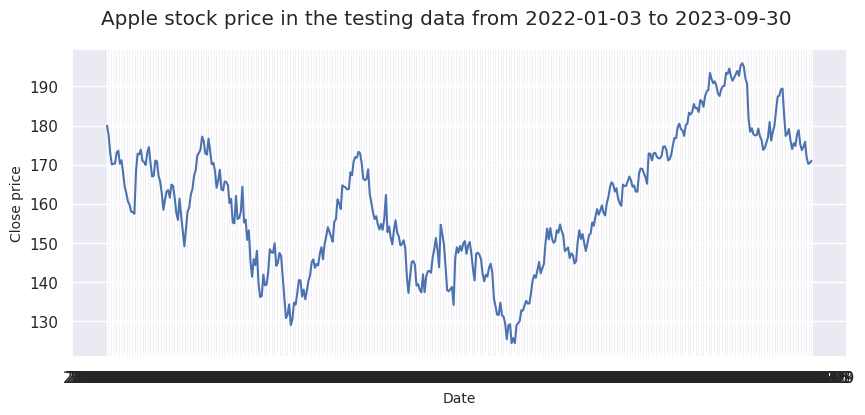

In [22]:
# Set 'date' as index of the testing dataset
apple_test_ts = apple_test_close.set_index('date')

# Plotting the graph of close price in the testing data
fig, axs = plt.subplots(figsize=(10, 4))
axs.plot(apple_test_ts.index, apple_test_ts.close)
fig.suptitle('Apple stock price in the testing data from 2022-01-03 to 2023-09-30')
axs.set_xlabel('Date', fontsize = 10)
axs.set_ylabel('Close price', fontsize = 10)
plt.show()


In [23]:
# Take residual of Apple stock's close price in the testing data
apple_test_ts_diff = np.diff(np.log(apple_test_ts.close))*100
apple_test_ts_diff

array([-1.27729239e+00, -2.69600450e+00, -1.68343099e+00,  9.88039796e-02,
        1.16165277e-02,  1.66443636e+00,  2.56695205e-01, -1.92113157e+00,
        5.09751275e-01, -1.90748803e+00, -2.12488555e+00, -1.04010561e+00,
       -1.28472723e+00, -4.87623740e-01, -1.14500310e+00, -5.63374336e-02,
       -2.94744910e-01,  6.74506703e+00,  2.57903377e+00, -9.73013143e-02,
        7.01942877e-01, -1.68611670e+00, -1.68066869e-01, -4.24347730e-01,
        1.82983011e+00,  8.25961771e-01, -2.38818749e+00, -2.04256261e+00,
        1.42215906e-01,  2.28885075e+00, -1.38977662e-01, -2.14987309e+00,
       -9.39983423e-01, -1.79728549e+00, -2.62044875e+00,  1.65426312e+00,
        1.28821308e+00,  1.63659506e-01, -1.16961166e+00,  2.03791800e+00,
       -1.98325076e-01, -1.85799259e+00, -2.40032245e+00, -1.17448341e+00,
        3.43989759e+00, -2.75625894e+00, -2.41991613e+00, -2.69217116e+00,
        2.92456271e+00,  2.86023404e+00,  6.43343922e-01,  2.07030668e+00,
        8.50152739e-01,  

In [24]:
# Dataframe of residual in Apple stock's close price in the testing data
apple_test_ts_df = pd.DataFrame(apple_test_ts_diff)
apple_test_ts_df.index = np.array(apple_test_close.date[1:])
apple_test_ts_df.columns = ["close"]
apple_test_ts_df

,close
2022-01-04,-1.277292
2022-01-05,-2.696005
2022-01-06,-1.683431
2022-01-07,0.098804
2022-01-10,0.011617
...,...
2023-09-25,0.735325
2023-09-26,-2.367654
2023-09-27,-0.893731
2023-09-28,0.152449


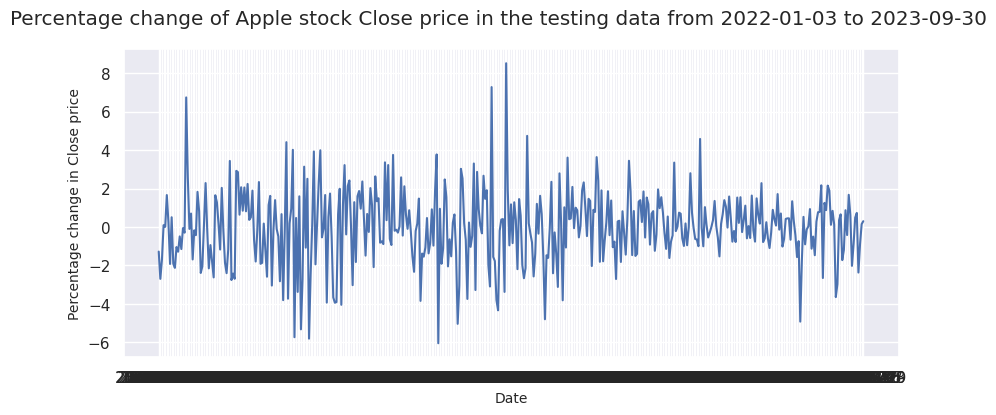

In [25]:
# Plotting the graph of residual in Apple stock price in the training data
fig, axs = plt.subplots(figsize=(10, 4))
axs.plot(apple_test_ts_df.index, apple_test_ts_df.close)
fig.suptitle('Percentage change of Apple stock Close price in the testing data from 2022-01-03 to 2023-09-30')
axs.set_xlabel('Date', fontsize = 10)
axs.set_ylabel('Percentage change in Close price', fontsize = 10)
plt.show()

In [26]:
# Convert column 'close' price into an array (training data)
train_set = np.reshape(apple_train_ts_df.close.values, (-1,1))
train_set.shape

(2518, 1)

In [27]:
# Convert column 'close' price into an array (validation data)
val_set = np.reshape(apple_val_ts_df.close.values, (-1,1))
val_set.shape

(499, 1)

In [28]:
# Create a function split_data_time_step() to split dataset based on time_step
def split_data_time_step(time_step, data):
  X_train = []
  y_train = []

  for i in range(time_step, len(data)):
    X_train.append(data[i-time_step:i,0])
    y_train.append(data[i,0])

  X_train, y_train = np.array(X_train), np.array(y_train)
  return X_train, y_train

In [33]:
# Create X_train, y_train with time_step = 1
X_train_1, y_train_1 = split_data_time_step(1, train_set)
X_train_1

array([[ 0.17276033],
       [-1.60346372],
       [-0.18502401],
       ...,
       [ 0.72799322],
       [ 2.25600543],
       [-0.97693457]])

In [34]:
# Check y_train with time-step = 1
y_train_1

array([-1.60346372, -0.18502401,  0.66264771, ...,  2.25600543,
       -0.97693457,  0.79363656])

In [33]:
# Convert column 'close' price into an array (testing data)
test_set = np.reshape(apple_test_ts_df.close.values, (-1,1))
test_set.shape

(437, 1)

In [36]:
# Create X_train, y_train with time_step 1
X_test_1, y_test_1 = split_data_time_step(1, test_set)

In [37]:
# Create X_val, y_val with time_step 1
X_val_1, y_val_1 = split_data_time_step(1, val_set)

In [38]:
# Reshape array of X_train_1, y_train_1
X_train_1 = np.reshape(X_train_1, (X_train_1.shape[0], X_train_1.shape[1],1))
y_train_1 = np.reshape(y_train_1, (y_train_1.shape[0],1))

In [39]:
# Reshape array of X_test_1, y_test_1
X_test_1 = np.reshape(X_test_1, (X_test_1.shape[0], X_test_1.shape[1],1))
y_test_1 = np.reshape(y_test_1, (y_test_1.shape[0],1))

In [40]:
# Reshape array of X_val_1, y_val_1
X_val_1 = np.reshape(X_val_1, (X_val_1.shape[0], X_val_1.shape[1],1))
y_val_1 = np.reshape(y_val_1, (y_val_1.shape[0],1))

In [41]:
# Split the training data into training set and validation set (including the last 500 days)
print("The shape of X_train is: ", X_train_1.shape)
print("The shape of y_train is: ", y_train_1.shape)
print("The shape of X_test is: ", X_test_1.shape)
print("The shape of y_test is: ", y_test_1.shape)
print("The shape of X_val is: ", X_val_1.shape)
print("The shape of y_val is: ", y_val_1.shape)


The shape of X_train is:  (2517, 1, 1)
The shape of y_train is:  (2517, 1)
The shape of X_test is:  (436, 1, 1)
The shape of y_test is:  (436, 1)
The shape of X_val is:  (498, 1, 1)
The shape of y_val is:  (498, 1)


## Baseline RNN model


In [52]:
# Specify parameters for baseline RNN models
from tensorflow import keras
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

optimizer_bs = keras.optimizers.legacy.Adam
learningrate_bs = 0.01
batch_size_bs = 30
n_epoch_bs = 100

Epoch 1/100
84/84 [==============================] - 6s 9ms/step - loss: 2.6782 - val_loss: 5.6034
Epoch 2/100
84/84 [==============================] - 1s 6ms/step - loss: 2.6493 - val_loss: 5.7221
Epoch 3/100
84/84 [==============================] - 0s 4ms/step - loss: 2.6598 - val_loss: 5.4728
Epoch 4/100
84/84 [==============================] - 0s 4ms/step - loss: 2.6467 - val_loss: 5.9592
Epoch 5/100
84/84 [==============================] - 0s 4ms/step - loss: 2.6535 - val_loss: 5.6215
Epoch 6/100
84/84 [==============================] - 0s 4ms/step - loss: 2.6514 - val_loss: 5.6772
Epoch 7/100
84/84 [==============================] - 0s 4ms/step - loss: 2.6440 - val_loss: 5.5744
Epoch 8/100
84/84 [==============================] - 0s 4ms/step - loss: 2.6429 - val_loss: 5.6919


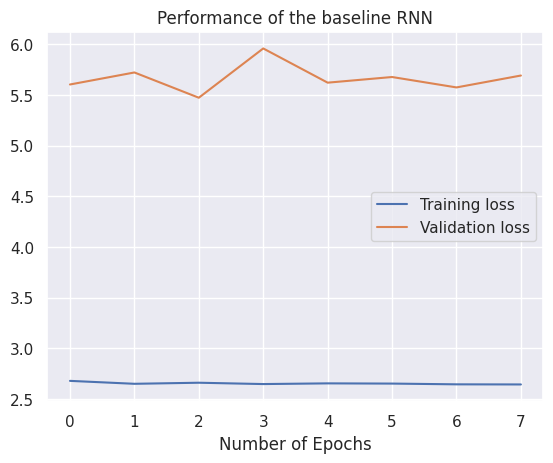

In [43]:
# Baseline RNN model with 1 hidden layer
rnn_bs = keras.models.Sequential()
rnn_bs.add(keras.layers.Input((X_train_1.shape[1],1)))
rnn_bs.add(keras.layers.SimpleRNN(units = 50, activation = "tanh", return_sequences = False))
rnn_bs.add(keras.layers.Dense(1))

rnn_bs.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")

history_bs = rnn_bs.fit(X_train_1, y_train_1, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1, y_val_1),callbacks=early_stopping)

# Performance plot of the baseline RNN model with 1 hidden layer
pd.DataFrame(history_bs.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the baseline RNN')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [44]:
# Make prediction for the baseline RNN model with 1 hidden layer
y_pred_train_1 = rnn_bs.predict(X_train_1)

79/79 [==============================] - 0s 2ms/step


16/16 [==============================] - 0s 2ms/step


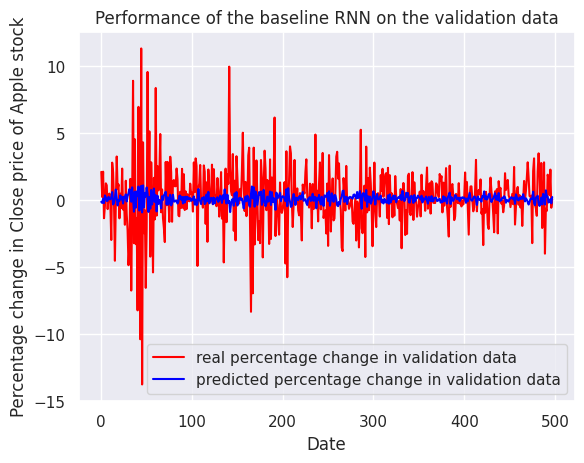

In [45]:
# Function which plots difference in close price between real prices and prediction
def plot_predictions(test, predicted):
    plt.plot(test, color="red", label="real percentage change in validation data")
    plt.plot(predicted, color="blue", label="predicted percentage change in validation data")
    plt.title("Performance of the baseline RNN on the validation data")
    plt.xlabel("Date")
    plt.ylabel("Percentage change in Close price of Apple stock")
    plt.legend()
    plt.show()

plot_predictions(y_val_1, rnn_bs.predict(X_val_1))

In [46]:
# Tranform percentage change of y_val_1 to close price
y_val_backtransform = np.exp(np.cumsum(apple_val_ts_diff/100)) * apple_val_ts.close[0]
y_val_backtransform = np.insert(y_val_backtransform, 0, apple_val_ts.close[0])

In [47]:
# Tranform back percentage change to price of prediction (rnn_bs.predict(X_val_1))
y_pred_1_backtransform = np.exp(np.cumsum(rnn_bs.predict(X_val_1)/100)) * apple_val_ts.close[0]
y_pred_1_backtransform = np.insert(y_pred_1_backtransform, 0, apple_val_ts.close[0])

16/16 [==============================] - 0s 2ms/step


In [58]:
# Function which plots difference in close price between real prices and prediction
def plot_real_price(test, predicted):
    plt.plot(test, color="red", label="real price in validation data")
    plt.plot(predicted, color="blue", label="predicted price in validation data")
    plt.title("Performance of the RNN model on the validation data")
    plt.xlabel("Date")
    plt.ylabel("Close price of Apple stock")
    plt.legend()
    plt.show()

plot_real_price(y_val_backtransform, y_pred_1_backtransform)

## Data Pre-processing


In [49]:
# Make a dataframe of training data, validation data and testing data for pre-processing
train = pd.concat([pd.DataFrame(np.reshape(X_train_1, (-1, X_train_1.shape[1]))),pd.DataFrame(y_train_1)], axis =1)
val = pd.concat([pd.DataFrame(np.reshape(X_val_1, (-1, X_val_1.shape[1]))),pd.DataFrame(y_val_1)], axis =1)
test = pd.concat([pd.DataFrame(np.reshape(X_test_1, (-1, X_test_1.shape[1]))),pd.DataFrame(y_test_1)], axis =1)

In [50]:
# Perform standard scaling for training data, time_step = 1
from sklearn.preprocessing import StandardScaler, MinMaxScaler

standard_scaler = StandardScaler()

train_std = standard_scaler.fit_transform(train)

X_train_1_standardscaler = np.reshape(train_std[:,0:-1], (-1, X_train_1.shape[1]))
y_train_1_standardscaler = np.array(train_std[:,-1])

# Check statistics summary of X_train_1 after using Standard scaler
pd.DataFrame(X_train_1_standardscaler).describe()

,0
count,2.517000e+03
mean,1.340913e-17
std,1.000199e+00
min,-8.181098e+00
25%,-4.765728e-01
50%,-1.007401e-03
75%,5.429029e-01
max,5.176968e+00


In [51]:
# Check statistics summary of y_train_1 after using Standard scaler
pd.DataFrame(y_train_1_standardscaler).describe()

,0
count,2.517000e+03
mean,1.623210e-17
std,1.000199e+00
min,-8.180953e+00
25%,-4.767074e-01
50%,-1.159272e-03
75%,5.427314e-01
max,5.176629e+00


In [52]:
# Perform maxmin scaling for training data
maxmin_scaler = MinMaxScaler()

train_maxmin = maxmin_scaler.fit_transform(train)

X_train_1_minmaxscaler = np.reshape(train_maxmin[:,0:-1], (-1, X_train_1.shape[1]))
y_train_1_minmaxscaler = np.array(train_maxmin[:,-1])

# Check statistics summary of X_train_1 after using Maxmin scaler
pd.DataFrame(X_train_1_minmaxscaler).describe()

,0
count,2517.000000
mean,0.612446
std,0.074876
min,0.000000
25%,0.576769
50%,0.612371
75%,0.653089
max,1.000000


In [53]:
# Check statistics summary of y_train_1 after using Maxmin scaler
pd.DataFrame(y_train_1_minmaxscaler).describe()

,0
count,2517.000000
mean,0.612458
std,0.074879
min,0.000000
25%,0.576769
50%,0.612371
75%,0.653089
max,1.000000


In [54]:
# Transform validation and testing set

## Standard scaler
test_std = standard_scaler.transform(test)
val_std = standard_scaler.transform(val)

X_test_1_standardscaler = np.reshape(test_std[:,0:-1], (-1, X_test_1.shape[1]))
y_test_1_standardscaler = np.array(test_std[:,-1])

X_val_1_standardscaler = np.reshape(val_std[:,0:-1], (-1, X_val_1.shape[1]))
y_val_1_standardscaler = np.array(val_std[:,-1])

## Max-min scaler
test_minmax = maxmin_scaler.transform(test)
val_minmax = maxmin_scaler.transform(val)

X_test_1_minmaxscaler = np.reshape(test_minmax[:,0:-1], (-1, X_test_1.shape[1]))
y_test_1_minmaxscaler = np.array(test_minmax[:,-1])

X_val_1_minmaxscaler = np.reshape(val_minmax[:,0:-1], (-1, X_val_1.shape[1]))
y_val_1_minmaxscaler = np.array(val_minmax[:,-1])


In [55]:
# Check statistics summary of X_test_1, X_val_1 after using Maxmin scaler
display(pd.DataFrame(X_test_1_minmaxscaler).describe())
display(pd.DataFrame(X_val_1_minmaxscaler).describe())

,0
count,436.000000
mean,0.607451
std,0.088644
min,0.329233
25%,0.558344
50%,0.609501
75%,0.659653
max,1.000988


,0
count,498.000000
mean,0.616279
std,0.109430
min,-0.026847
25%,0.569024
50%,0.615097
75%,0.674150
max,1.129711


In [56]:
# Check statistics summary of y_test_1, y_val_1 after using Maxmin scaler
display(pd.DataFrame(y_test_1_minmaxscaler).describe())
display(pd.DataFrame(y_val_1_minmaxscaler).describe())

,0
count,436.000000
mean,0.607619
std,0.088603
min,0.329233
25%,0.558688
50%,0.609825
75%,0.659653
max,1.000988


,0
count,498.000000
mean,0.616136
std,0.109391
min,-0.026847
25%,0.569024
50%,0.614924
75%,0.673449
max,1.129711


In [57]:
# Check statistics summary of X_test_1, X_val_1 after using Standard scaler
display(pd.DataFrame(X_test_1_standardscaler).describe())
display(pd.DataFrame(X_val_1_standardscaler).describe())

,0
count,436.000000
mean,-0.066721
std,1.184117
min,-3.783177
25%,-0.722707
50%,-0.039340
75%,0.630593
max,5.190165


,0
count,498.000000
mean,0.051194
std,1.461778
min,-8.539718
25%,-0.580043
50%,0.035412
75%,0.824240
max,6.909651


In [58]:
# Check statistics summary of y_test_1, y_val_1 after using Standard scaler
display(pd.DataFrame(y_test_1_standardscaler).describe())
display(pd.DataFrame(y_val_1_standardscaler).describe())

,0
count,436.000000
mean,-0.064636
std,1.183520
min,-3.783192
25%,-0.718233
50%,-0.035163
75%,0.630418
max,5.189825


,0
count,498.000000
mean,0.049129
std,1.461204
min,-8.539560
25%,-0.580174
50%,0.032941
75%,0.814701
max,6.909248


## Baseline RNN model with scaled datasets


Epoch 1/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0202 - val_loss: 2.1854
Epoch 2/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0144 - val_loss: 2.1582
Epoch 3/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0094 - val_loss: 2.0994
Epoch 4/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0046 - val_loss: 2.0894
Epoch 5/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0070 - val_loss: 2.1507
Epoch 6/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0081 - val_loss: 2.1418
Epoch 7/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0060 - val_loss: 2.1194
Epoch 8/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0008 - val_loss: 2.1033
Epoch 9/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0070 - val_loss: 2.1407


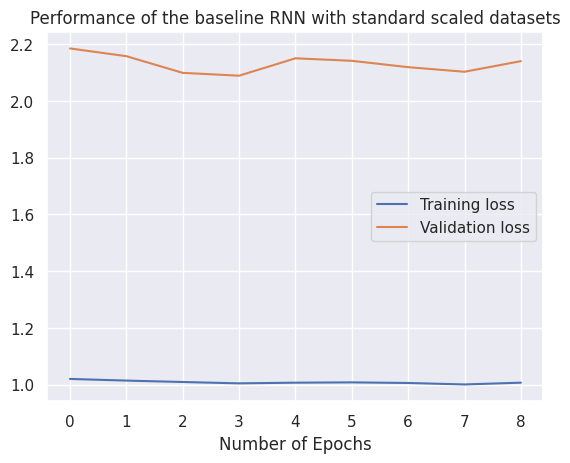

In [59]:
# Baseline RNN model with 1 hidden layer, standard scaled datasets
rnn_bs_std = keras.models.Sequential()
rnn_bs_std.add(keras.layers.Input((X_train_1.shape[1],1)))
rnn_bs_std.add(keras.layers.SimpleRNN(units = 50, activation = "tanh", return_sequences = False))
rnn_bs_std.add(keras.layers.Dense(1))

rnn_bs_std.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")

history_bs_std = rnn_bs_std.fit(X_train_1_standardscaler, y_train_1_standardscaler, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1_standardscaler, y_val_1_standardscaler),callbacks=early_stopping)

# Performance plot of the baseline model
pd.DataFrame(history_bs_std.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the baseline RNN with standard scaled datasets')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

16/16 [==============================] - 0s 3ms/step


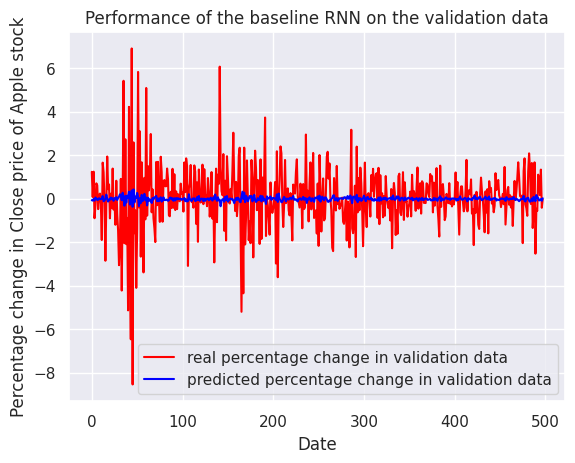

In [60]:
# Plot difference in close price between real prices and prediction, standard scaled datasets
plot_predictions(y_val_1_standardscaler, rnn_bs_std.predict(X_val_1_standardscaler))

Epoch 1/100
84/84 [==============================] - 2s 9ms/step - loss: 0.0329 - val_loss: 0.0150
Epoch 2/100
84/84 [==============================] - 0s 6ms/step - loss: 0.0061 - val_loss: 0.0139
Epoch 3/100
84/84 [==============================] - 0s 5ms/step - loss: 0.0060 - val_loss: 0.0128
Epoch 4/100
84/84 [==============================] - 0s 5ms/step - loss: 0.0058 - val_loss: 0.0123
Epoch 5/100
84/84 [==============================] - 0s 4ms/step - loss: 0.0057 - val_loss: 0.0137
Epoch 6/100
84/84 [==============================] - 0s 4ms/step - loss: 0.0059 - val_loss: 0.0122
Epoch 7/100
84/84 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0127
Epoch 8/100
84/84 [==============================] - 1s 8ms/step - loss: 0.0058 - val_loss: 0.0127
Epoch 9/100
84/84 [==============================] - 0s 5ms/step - loss: 0.0059 - val_loss: 0.0124
Epoch 10/100
84/84 [==============================] - 0s 4ms/step - loss: 0.0058 - val_loss: 0.0126
Epoch 11/

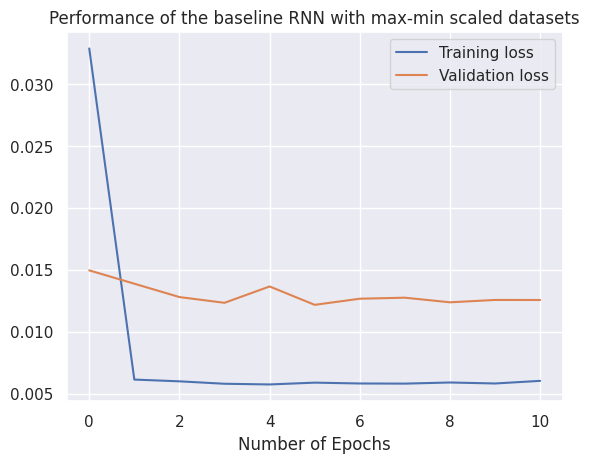

In [61]:
# Baseline RNN model with 1 hidden layer, maxmin scaled datasets
rnn_bs_mm = keras.models.Sequential()
rnn_bs_mm.add(keras.layers.Input((X_train_1.shape[1],1)))
rnn_bs_mm.add(keras.layers.SimpleRNN(units = 50, activation = "tanh", return_sequences = False))
rnn_bs_mm.add(keras.layers.Dense(1))

rnn_bs_mm.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")

history_bs_mm = rnn_bs_mm.fit(X_train_1_minmaxscaler, y_train_1_minmaxscaler, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1_minmaxscaler, y_val_1_minmaxscaler),callbacks=early_stopping)

# Performance plot of the baseline model
pd.DataFrame(history_bs_mm.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the baseline RNN with max-min scaled datasets')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

16/16 [==============================] - 0s 2ms/step


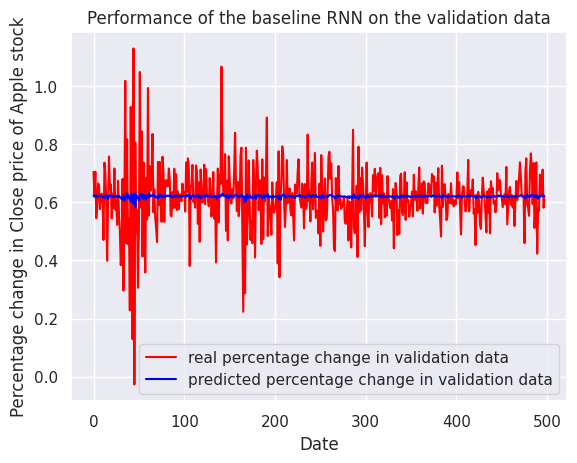

In [62]:
# Plot difference in close price between real prices and prediction, maxmin scaled datasets
plot_predictions(y_val_1_minmaxscaler, rnn_bs_mm.predict(X_val_1_minmaxscaler))

In [63]:
# Inverse transform the data (after Max-min scaling)
temp_pred = np.zeros(shape=(len(X_val_1_minmaxscaler), val.shape[1]))
temp_pred[:,-1] = y_val_1_minmaxscaler
y_val_inv = maxmin_scaler.inverse_transform(temp_pred)[:,-1]

temp_pred_1 = np.zeros(shape=(len(X_val_1_minmaxscaler), val.shape[1]))
temp_pred_1[:,-1] = rnn_bs_mm.predict(X_val_1_minmaxscaler)[:,0]
y_val_pred_inv = maxmin_scaler.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 0s 2ms/step


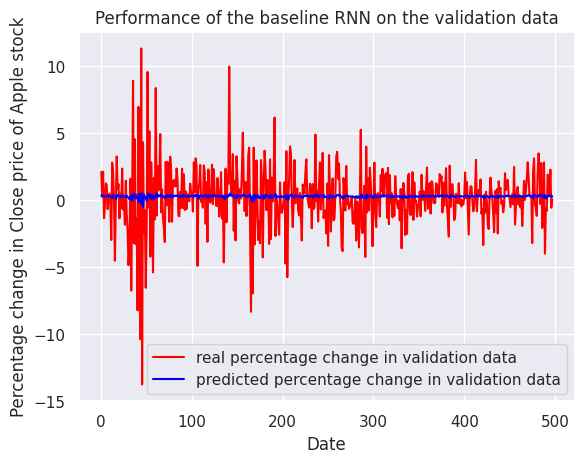

In [64]:
# Plot difference in percentages change, after inverse transform
plot_predictions(y_val_inv, y_val_pred_inv)

In [65]:
# Tranform back percentage change to close price, (after Max-min scaling)
y_pred_1_backtransform = np.exp(np.cumsum(y_val_inv/100)) * apple_val_ts.close[1]
y_pred_1_backtransform = np.insert(y_pred_1_backtransform, 0, apple_val_ts.close[1])
y_pred_1_backtransform

array([ 73.84436798,  75.41286469,  75.58335876,  77.19812775,
        76.15572357,  75.82935333,  76.77922058,  77.62924957,
        77.10316467,  77.37837982,  77.75102997,  77.52693939,
        75.24724579,  77.37593842,  78.99559021,  78.88113403,
        75.38363647,  75.17661285,  77.6584549 ,  78.29174042,
        79.20749664,  78.13084412,  78.5019455 ,  78.02831268,
        79.88132477,  79.31247711,  79.33200836,  77.8793869 ,
        79.00730896,  78.19675446,  76.42679596,  72.79649353,
        70.33071136,  71.44641876,  66.7760849 ,  66.73704529,
        72.95029449,  70.63343048,  73.90974426,  71.51233673,
        70.5626297 ,  64.98171997,  69.66178131,  67.24237823,
        60.60189056,  67.86248016,  59.13219833,  61.73223877,
        60.22104263,  59.75962448,  55.96574783,  54.77680969,
        60.27231216,  59.94028473,  63.09452438,  60.4822731 ,
        62.20830917,  62.08135223,  58.81481171,  59.79624176,
        58.93688202,  64.07839203,  63.33620834,  64.95

In [66]:
# Tranform back percentage change to close price, (after Max-min scaling)
y_pred_2_backtransform = np.exp(np.cumsum(y_val_pred_inv/100)) * apple_val_ts.close[1]
y_pred_2_backtransform = np.insert(y_pred_2_backtransform, 0, apple_val_ts.close[1])
y_pred_2_backtransform

array([ 73.84436798,  74.08699943,  74.34246165,  74.55107822,
        74.80842112,  74.97147272,  75.16313116,  75.40127583,
        75.63646585,  75.82234046,  76.03876086,  76.25924572,
        76.45837354,  76.56992396,  76.84987184,  77.11413203,
        77.31975247,  77.37381246,  77.57625783,  77.87000219,
        78.10505018,  78.35033196,  78.52080298,  78.74829753,
        78.94416069,  79.22235752,  79.41594779,  79.63282153,
        79.78979478,  80.04778524,  80.23314125,  80.3757008 ,
        80.4181265 ,  80.51786157,  80.78183744,  80.7405969 ,
        80.95854982,  81.35104871,  81.46043209,  81.79580794,
        81.90306475,  82.08235231,  81.96827544,  82.3450956 ,
        82.44369128,  82.21487885,  82.62530059,  82.1982183 ,
        82.53206891,  82.67169712,  82.87191309,  82.83914007,
        82.99156807,  83.398703  ,  83.60787513,  83.96338956,
        84.0351811 ,  84.34301596,  84.56599301,  84.58651564,
        84.86607973,  85.04790811,  85.45536151,  85.64

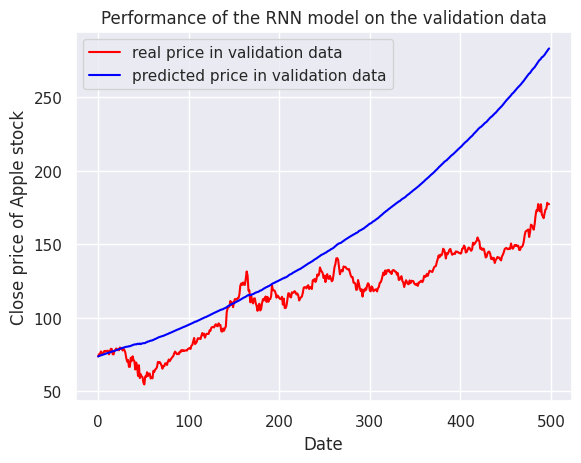

In [67]:
# Performance plot of close prices, (Max-min scaling method)
plot_real_price(y_pred_1_backtransform, y_pred_2_backtransform)

In [68]:
# Inverse transform the datasets (after Standard scaling)
temp_pred = np.zeros(shape=(len(X_val_1_standardscaler), val.shape[1]))
temp_pred[:,-1] = y_val_1_standardscaler
y_val_inv_std = standard_scaler.inverse_transform(temp_pred)[:,-1]

temp_pred_1 = np.zeros(shape=(len(X_val_1_standardscaler), val.shape[1]))
temp_pred_1[:,-1] = rnn_bs_std.predict(X_val_1_standardscaler)[:,0]
y_val_pred_inv_std = standard_scaler.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 0s 2ms/step


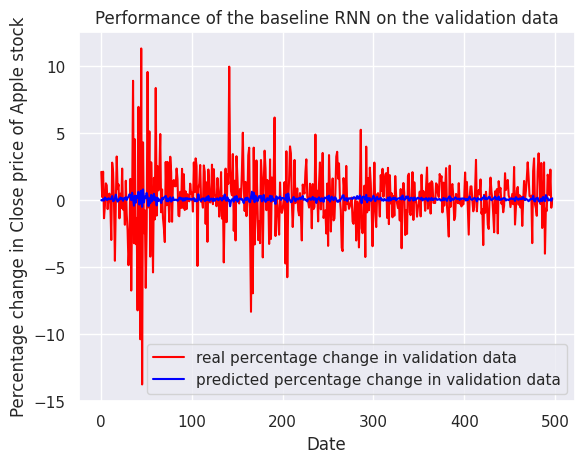

In [69]:
# Plot difference in percentage changes, after inverse transform
plot_predictions(y_val_inv_std, y_val_pred_inv_std)

In [70]:
# Tranform back percentage change to close price (standard scale)
y_pred_3_backtransform = np.exp(np.cumsum(y_val_pred_inv_std/100)) * apple_val_ts.close[1]
y_pred_3_backtransform = np.insert(y_pred_3_backtransform, 0, apple_val_ts.close[1])
y_pred_3_backtransform

array([ 73.84436798,  73.83616659,  73.803989  ,  73.86066288,
        73.82790054,  73.96192294,  74.05026224,  74.05868599,
        74.07393102,  74.1746431 ,  74.22535874,  74.27017838,
        74.35203016,  74.57107618,  74.50557245,  74.47454898,
        74.54964449,  74.84993118,  74.93175496,  74.8438507 ,
        74.87310597,  74.88555311,  75.02195882,  75.06757738,
        75.16592465,  75.12131431,  75.22517646,  75.29273626,
        75.45462108,  75.45387629,  75.57412973,  75.75981823,
        76.08189116,  76.3307967 ,  76.32339131,  76.73718822,
        76.81024603,  76.48406734,  76.72250748,  76.57009686,
        76.8125868 ,  76.95085057,  77.4265689 ,  77.16616412,
        77.42344528,  77.96911845,  77.57425248,  78.19096226,
        78.04686427,  78.24896443,  78.35998144,  78.77585513,
        78.96158993,  78.60641586,  78.70666175,  78.5218341 ,
        78.82162005,  78.75115622,  78.83360806,  79.19655524,
        79.18476046,  79.33325207,  79.01402325,  79.14

In [71]:
# Tranform back percentage change to close price (standard scale)
y_pred_1_std_backtransform = np.exp(np.cumsum(y_val_inv_std/100)) * apple_val_ts.close[1]
y_pred_1_std_backtransform = np.insert(y_pred_1_std_backtransform, 0, apple_val_ts.close[1])
y_pred_1_std_backtransform

array([ 73.84436798,  75.41286469,  75.58335876,  77.19812775,
        76.15572357,  75.82935333,  76.77922058,  77.62924957,
        77.10316467,  77.37837982,  77.75102997,  77.52693939,
        75.24724579,  77.37593842,  78.99559021,  78.88113403,
        75.38363647,  75.17661285,  77.6584549 ,  78.29174042,
        79.20749664,  78.13084412,  78.5019455 ,  78.02831268,
        79.88132477,  79.31247711,  79.33200836,  77.8793869 ,
        79.00730896,  78.19675446,  76.42679596,  72.79649353,
        70.33071136,  71.44641876,  66.7760849 ,  66.73704529,
        72.95029449,  70.63343048,  73.90974426,  71.51233673,
        70.5626297 ,  64.98171997,  69.66178131,  67.24237823,
        60.60189056,  67.86248016,  59.13219833,  61.73223877,
        60.22104263,  59.75962448,  55.96574783,  54.77680969,
        60.27231216,  59.94028473,  63.09452438,  60.4822731 ,
        62.20830917,  62.08135223,  58.81481171,  59.79624176,
        58.93688202,  64.07839203,  63.33620834,  64.95

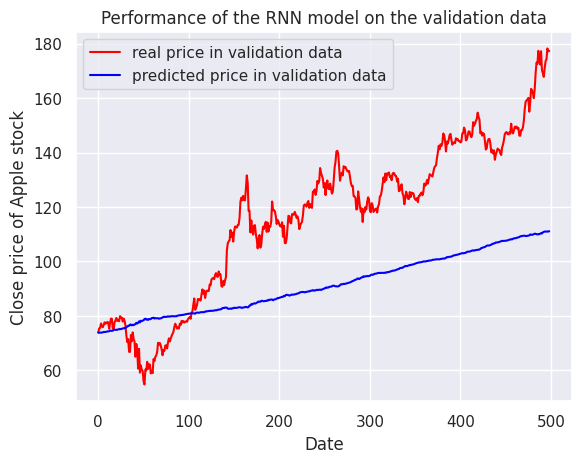

In [72]:
# Performance plot of close prices, (Standard scaling method)
plot_real_price(y_pred_1_std_backtransform, y_pred_3_backtransform)

In [73]:
from sklearn.metrics import mean_squared_error

# MSE of max-min scaled dataset
mean_squared_error(y_val_1_minmaxscaler, rnn_bs_mm.predict(X_val_1_minmaxscaler))

16/16 [==============================] - 0s 2ms/step


0.012169547286174557

In [74]:
from sklearn.metrics import mean_squared_error

# MSE of standard scaled dataset
mean_squared_error(y_val_1_standardscaler, rnn_bs_std.predict(X_val_1_standardscaler))

16/16 [==============================] - 0s 2ms/step


2.089367209655731

In [75]:
# MSE of close price (Standard scaling)
mean_squared_error(y_pred_1_std_backtransform, y_pred_3_backtransform)

998.5593838058288

In [76]:
# MSE of close price (Max-min scaling)
mean_squared_error(y_pred_1_backtransform, y_pred_2_backtransform)

2690.826804390563

## LSTM with Standard scaled datasets (1 hidden layer)


Epoch 1/100
84/84 [==============================] - 4s 10ms/step - loss: 1.0044 - val_loss: 2.1163
Epoch 2/100
84/84 [==============================] - 0s 6ms/step - loss: 1.0049 - val_loss: 2.1596
Epoch 3/100
84/84 [==============================] - 0s 6ms/step - loss: 1.0014 - val_loss: 2.1386
Epoch 4/100
84/84 [==============================] - 0s 6ms/step - loss: 1.0010 - val_loss: 2.1429
Epoch 5/100
84/84 [==============================] - 0s 6ms/step - loss: 1.0008 - val_loss: 2.1386
Epoch 6/100
84/84 [==============================] - 0s 6ms/step - loss: 1.0012 - val_loss: 2.1405


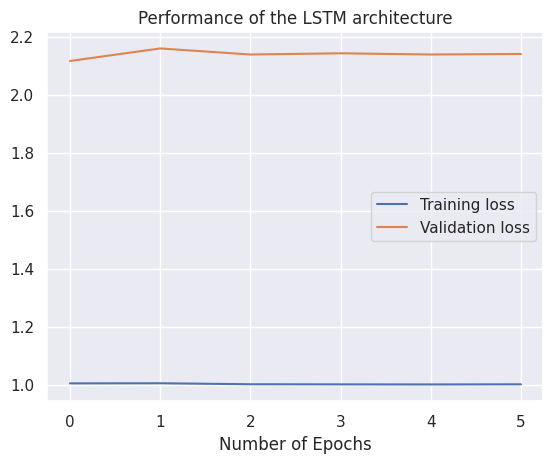

In [77]:
# LSTM architecture with 1 hidden layer
lstm_bs = keras.models.Sequential()
lstm_bs.add(keras.layers.LSTM(units=50, return_sequences=False, input_shape=(X_train_1_standardscaler.shape[1],1)))
lstm_bs.add(keras.layers.Dense(units=1))

lstm_bs.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_lstm_bs = lstm_bs.fit(X_train_1_standardscaler, y_train_1_standardscaler, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1_standardscaler, y_val_1_standardscaler),callbacks=early_stopping)

# Performance plot of the LSTM architecture with 1 hidden layer
pd.DataFrame(history_lstm_bs.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the LSTM architecture')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [78]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_1_standardscaler), val.shape[1]))
temp_pred_1[:,-1] = lstm_bs.predict(X_val_1_standardscaler)[:,0]
y_val_pred_lstm_inv = standard_scaler.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 0s 2ms/step


16/16 [==============================] - 0s 2ms/step


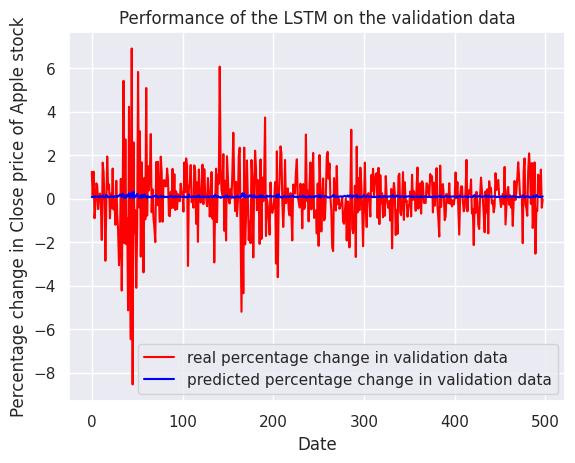

In [79]:
# Plot of percentage changes in close price
plt.plot(y_val_1_standardscaler, color="red", label="real percentage change in validation data")
plt.plot(lstm_bs.predict(X_val_1_standardscaler), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

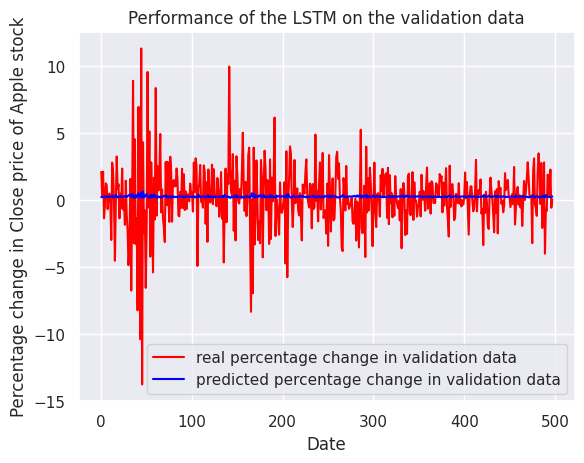

In [80]:
# Plot of percentage change in close price, after inverse transform
plt.plot(y_val_inv_std, color="red", label="real percentage change in validation data")
plt.plot(y_val_pred_lstm_inv, color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [81]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv)
y_pred_lstm_backtransform = np.exp(np.cumsum(y_val_pred_lstm_inv/100)) * apple_val_ts.close[1]
y_pred_lstm_backtransform = np.insert(y_pred_lstm_backtransform, 0, apple_val_ts.close[1])
y_pred_lstm_backtransform

array([ 73.84436798,  74.00705232,  74.1629197 ,  74.3488711 ,
        74.50529385,  74.7234653 ,  74.92321247,  75.09368463,
        75.2668543 ,  75.47306369,  75.65992159,  75.84501016,
        76.04497408,  76.30482952,  76.45652392,  76.61797429,
        76.81715456,  77.11755616,  77.32060376,  77.46890911,
        77.65249697,  77.83053384,  78.05864497,  78.24972288,
        78.46253506,  78.62434005,  78.84048246,  79.04207189,
        79.28475633,  79.46196317,  79.6872991 ,  79.94250898,
        80.26361325,  80.54955429,  80.72736433,  81.09940778,
        81.3084624 ,  81.43593957,  81.72043058,  81.86413148,
        82.15192716,  82.3919611 ,  82.80706646,  82.93900128,
        83.23681397,  83.70239958,  83.83910208,  84.36683888,
        84.51728353,  84.79283374,  85.02718413,  85.41385085,
        85.68372867,  85.81881432,  86.05100578,  86.19748813,
        86.52609614,  86.69777621,  86.92447243,  87.2885298 ,
        87.47980632,  87.73817831,  87.87563953,  88.12

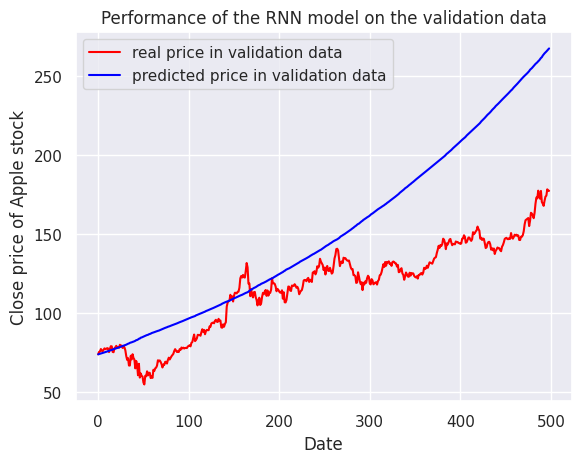

In [82]:
# Performance plot of LSTM (1 hidden layer)
plot_real_price(y_pred_1_std_backtransform,y_pred_lstm_backtransform)

In [83]:
# MSE of standard scaled dataset
mean_squared_error(y_val_1_standardscaler, lstm_bs.predict(X_val_1_standardscaler))

16/16 [==============================] - 0s 2ms/step


2.1163345559707865

In [84]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_std, y_val_pred_lstm_inv)

5.58051483456443

In [85]:
# MSE of close prices
mean_squared_error(y_pred_1_std_backtransform,y_pred_lstm_backtransform)

2196.5794553406854

## LSTM architecture with 4 hidden layers


Epoch 1/100
84/84 [==============================] - 7s 25ms/step - loss: 1.0018 - val_loss: 2.1322
Epoch 2/100
84/84 [==============================] - 1s 11ms/step - loss: 1.0017 - val_loss: 2.1316
Epoch 3/100
84/84 [==============================] - 1s 10ms/step - loss: 1.0013 - val_loss: 2.1310
Epoch 4/100
84/84 [==============================] - 1s 11ms/step - loss: 1.0020 - val_loss: 2.1339
Epoch 5/100
84/84 [==============================] - 1s 9ms/step - loss: 1.0005 - val_loss: 2.1309
Epoch 6/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0015 - val_loss: 2.1331
Epoch 7/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0006 - val_loss: 2.1376
Epoch 8/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0007 - val_loss: 2.1311
Epoch 9/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0015 - val_loss: 2.1316
Epoch 10/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0012 - val_loss: 2.1326


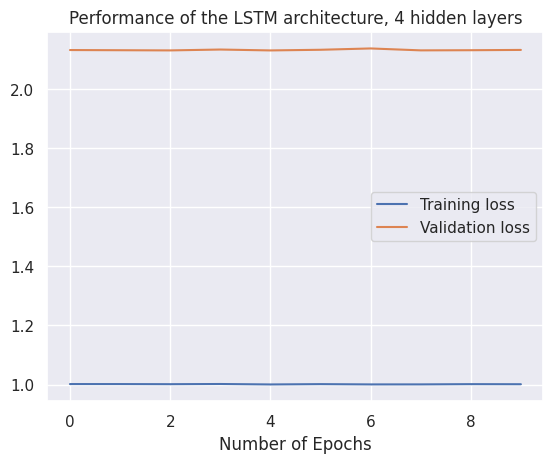

In [86]:
# LSTM architecture
lstm_bs_4 = keras.models.Sequential()
lstm_bs_4.add(keras.layers.LSTM(units=50, return_sequences=True, input_shape=(X_train_1_standardscaler.shape[1],1)))
lstm_bs_4.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4.add(keras.layers.LSTM(units=50, return_sequences=False))
lstm_bs_4.add(keras.layers.Dense(units=1))

lstm_bs_4.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_lstm_bs_4 = lstm_bs_4.fit(X_train_1_standardscaler, y_train_1_standardscaler, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1_standardscaler, y_val_1_standardscaler),callbacks=early_stopping)

# Performance plot of the LSTM (4 hidden layers)
pd.DataFrame(history_lstm_bs_4.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the LSTM architecture, 4 hidden layers')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [87]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_1_standardscaler), val.shape[1]))
temp_pred_1[:,-1] = lstm_bs_4.predict(X_val_1_standardscaler)[:,0]
y_val_pred_lstm_inv_4 = standard_scaler.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 1s 4ms/step


16/16 [==============================] - 0s 3ms/step


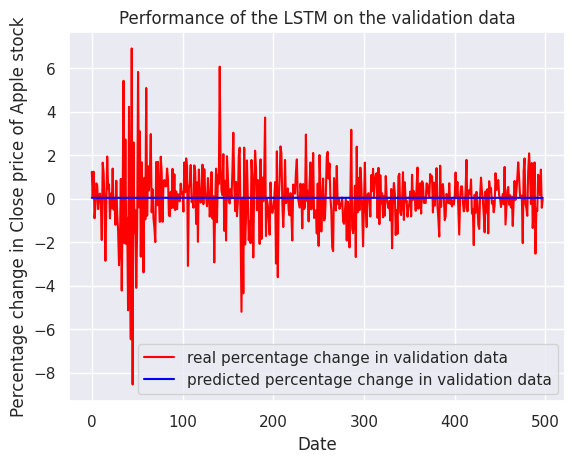

In [88]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_1_standardscaler, color="red", label="real percentage change in validation data")
plt.plot(lstm_bs_4.predict(X_val_1_standardscaler), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

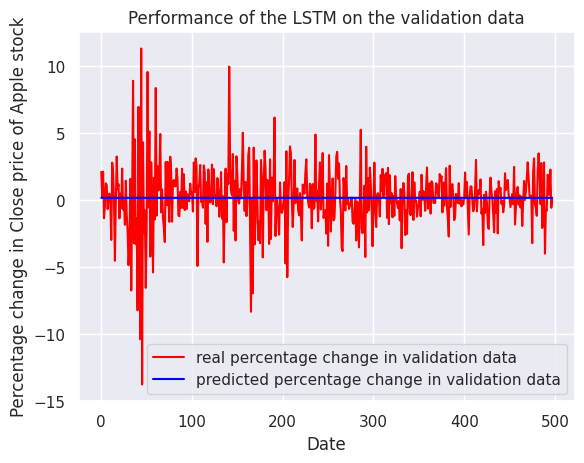

In [89]:
# Plot percentage changes in close price, after inverse transform
plt.plot(y_val_inv_std, color="red", label="real percentage change in validation data")
plt.plot(y_val_pred_lstm_inv_4, color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [90]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_4)
y_pred_lstm_backtransform_4 = np.exp(np.cumsum(y_val_pred_lstm_inv_4/100)) * apple_val_ts.close[1]
y_pred_lstm_backtransform_4 = np.insert(y_pred_lstm_backtransform_4, 0, apple_val_ts.close[1])
y_pred_lstm_backtransform_4

array([ 73.84436798,  73.96547279,  74.08677971,  74.20827244,
        74.32997765,  74.4518578 ,  74.57394451,  74.69624335,
        74.81874175,  74.94142826,  75.06432344,  75.18742104,
        75.31071495,  75.43419127,  75.55791177,  75.68183016,
        75.80593586,  75.93021259,  76.05472465,  76.17946609,
        76.30439482,  76.42953095,  76.55485371,  76.68039557,
        76.80613535,  76.93210285,  77.05825456,  77.18461863,
        77.31117591,  77.43796513,  77.56494397,  77.69212151,
        77.81948794,  77.94707402,  78.07490711,  78.20288666,
        78.33112713,  78.45963982,  78.58827712,  78.71718307,
        78.84624207,  78.9755278 ,  79.10497244,  79.23474235,
        79.36464806,  79.49471451,  79.62515045,  79.75562025,
        79.88643932,  80.01742176,  80.1486323 ,  80.28001264,
        80.411643  ,  80.54357311,  80.67564811,  80.80798212,
        80.94046167,  81.07321325,  81.20615947,  81.33928245,
        81.47267938,  81.60627084,  81.7401534 ,  81.87

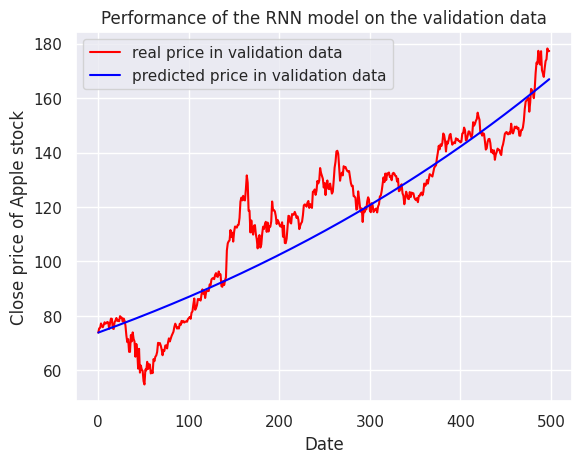

In [91]:
# Performane plot of LSTM (4 hidden layers)
plot_real_price(y_pred_1_std_backtransform,y_pred_lstm_backtransform_4)

In [92]:
# MSE of standard scaled dataset
mean_squared_error(y_val_1_standardscaler, lstm_bs_4.predict(X_val_1_standardscaler))

16/16 [==============================] - 0s 3ms/step


2.1308935453688824

In [93]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_std, y_val_pred_lstm_inv_4)

5.6189051051778955

In [94]:
# MSE of close prices
mean_squared_error(y_pred_1_std_backtransform,y_pred_lstm_backtransform_4)

121.07238159529372

## LSTM architecture with 4 hidden layers and a Dropout layer


Epoch 1/100
84/84 [==============================] - 10s 22ms/step - loss: 1.0040 - val_loss: 2.1331
Epoch 2/100
84/84 [==============================] - 1s 8ms/step - loss: 0.9990 - val_loss: 2.1308
Epoch 3/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0016 - val_loss: 2.1313
Epoch 4/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0034 - val_loss: 2.1323
Epoch 5/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0016 - val_loss: 2.1322
Epoch 6/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0001 - val_loss: 2.1425
Epoch 7/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0017 - val_loss: 2.1339


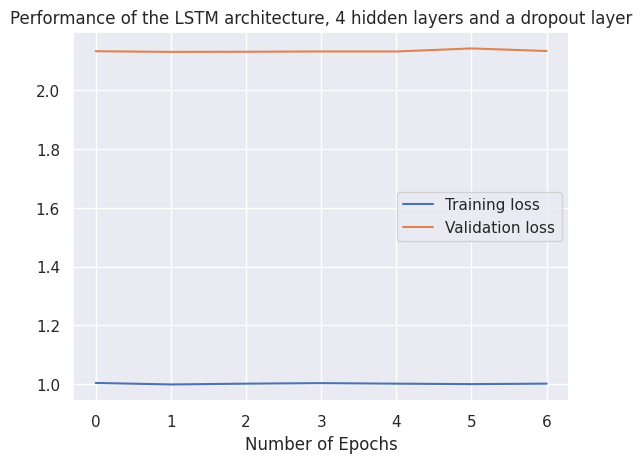

In [95]:
# LSTM architecture
lstm_bs_4_2 = keras.models.Sequential()
lstm_bs_4_2.add(keras.layers.LSTM(units=50, return_sequences=True, input_shape=(X_train_1_standardscaler.shape[1],1)))
lstm_bs_4_2.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4_2.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4_2.add(keras.layers.LSTM(units=50, return_sequences=False))
lstm_bs_4_2.add(keras.layers.Dropout(0.2))
lstm_bs_4_2.add(keras.layers.Dense(units=1))

lstm_bs_4_2.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_lstm_bs_4_2 = lstm_bs_4_2.fit(X_train_1_standardscaler, y_train_1_standardscaler, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1_standardscaler, y_val_1_standardscaler),callbacks=early_stopping)

# Performance plot of the LSTM (4 hidden layers, 1 dropout)
pd.DataFrame(history_lstm_bs_4_2.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the LSTM architecture, 4 hidden layers and a dropout layer')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [96]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_1_standardscaler), val.shape[1]))
temp_pred_1[:,-1] = lstm_bs_4_2.predict(X_val_1_standardscaler)[:,0]
y_val_pred_lstm_inv_4_2 = standard_scaler.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 1s 3ms/step


16/16 [==============================] - 0s 3ms/step


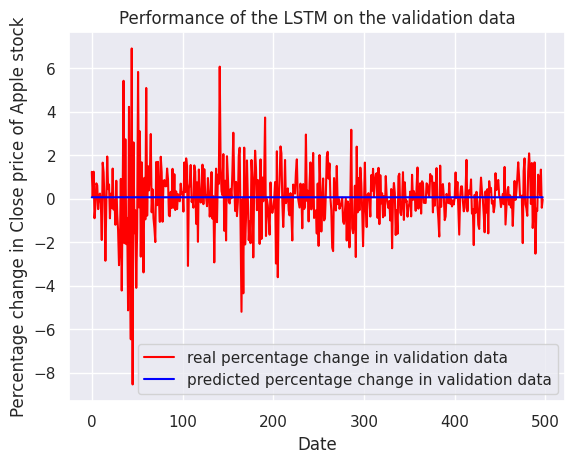

In [97]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_1_standardscaler, color="red", label="real percentage change in validation data")
plt.plot(lstm_bs_4_2.predict(X_val_1_standardscaler), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

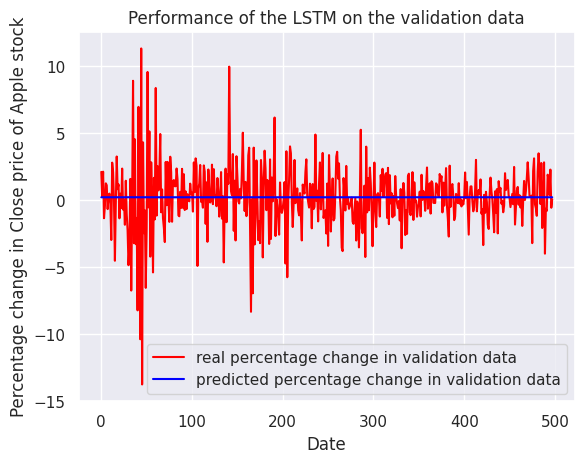

In [98]:
# Plot percentage changes in close price, after inverse transform
plt.plot(y_val_inv_std, color="red", label="real percentage change in validation data")
plt.plot(y_val_pred_lstm_inv_4_2, color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [99]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_4_2)
y_pred_lstm_backtransform_4_2 = np.exp(np.cumsum(y_val_pred_lstm_inv_4_2/100)) * apple_val_ts.close[1]
y_pred_lstm_backtransform_4_2 = np.insert(y_pred_lstm_backtransform_4_2, 0, apple_val_ts.close[1])
y_pred_lstm_backtransform_4_2

array([ 73.84436798,  73.99554787,  74.14684829,  74.29918682,
        74.45110365,  74.60471827,  74.75826602,  74.91145291,
        75.06501031,  75.21960937,  75.37409854,  75.5288543 ,
        75.68424537,  75.84107106,  75.99589303,  76.15129499,
        76.30790643,  76.46662197,  76.62393662,  76.78019513,
        76.9377009 ,  77.09538675,  77.25446119,  77.4130804 ,
        77.57248334,  77.73100409,  77.89110877,  78.05122575,
        78.21247832,  78.37266463,  78.53422831,  78.69666764,
        78.86047538,  79.02407212,  79.18586518,  79.35133989,
        79.51449476,  79.67518022,  79.84037694,  80.00276161,
        80.16866664,  80.33406829,  80.50237829,  80.6654505 ,
        80.8328285 ,  81.00270627,  81.16604731,  81.3372132 ,
        81.502717  ,  81.67137944,  81.83962485,  82.01057931,
        82.18014581,  82.34610738,  82.51564401,  82.68328397,
        82.8551367 ,  83.02426779,  83.19504115,  83.3684178 ,
        83.53907085,  83.71147725,  83.88074482,  84.05

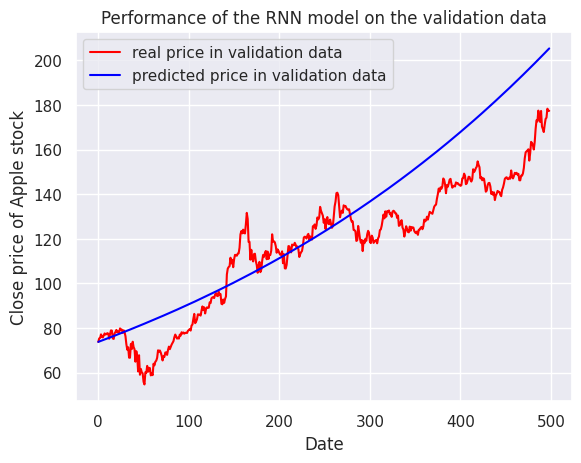

In [100]:
# Performance plot of LSTM 4 hidden layers, 1 dropout
plot_real_price(y_pred_1_std_backtransform,y_pred_lstm_backtransform_4_2)

In [101]:
# MSE of standard scaled dataset
mean_squared_error(y_val_1_standardscaler, lstm_bs_4_2.predict(X_val_1_standardscaler))

16/16 [==============================] - 0s 4ms/step


2.1307710179036294

In [102]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_std, y_val_pred_lstm_inv_4_2)

5.6185820152696575

In [103]:
# MSE of close prices
mean_squared_error(y_pred_1_std_backtransform,y_pred_lstm_backtransform_4_2)

395.5166661151886

## GRU architecture with Standard scaled datasets (1 hidden layer)


Epoch 1/100
84/84 [==============================] - 3s 10ms/step - loss: 1.0087 - val_loss: 2.1056
Epoch 2/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0089 - val_loss: 2.1098
Epoch 3/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0042 - val_loss: 2.1732
Epoch 4/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0018 - val_loss: 2.1629
Epoch 5/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0020 - val_loss: 2.1440
Epoch 6/100
84/84 [==============================] - 0s 4ms/step - loss: 1.0005 - val_loss: 2.1433


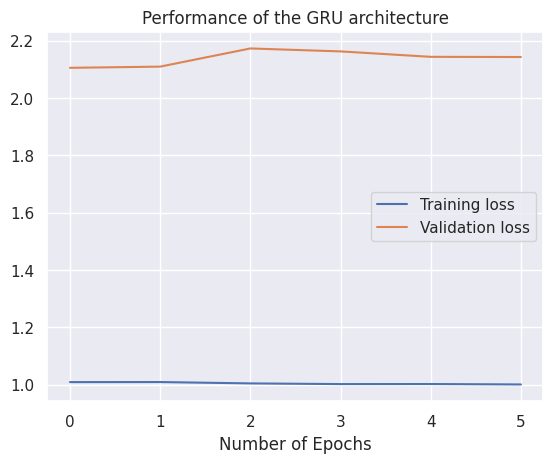

In [104]:
# The GRU architecture
rnn_gru_bs = keras.models.Sequential()
rnn_gru_bs.add(keras.layers.GRU(units=50, return_sequences=False, input_shape=(X_train_1_standardscaler.shape[1],1), activation='tanh'))
rnn_gru_bs.add(keras.layers.Dense(units=1))
rnn_gru_bs.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_gru_bs = rnn_gru_bs.fit(X_train_1_standardscaler, y_train_1_standardscaler, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1_standardscaler, y_val_1_standardscaler),callbacks=early_stopping)

# Performance plot of the GRU 1 hidden layer
pd.DataFrame(history_gru_bs.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the GRU architecture')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [105]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_1_standardscaler), val.shape[1]))
temp_pred_1[:,-1] = rnn_gru_bs.predict(X_val_1_standardscaler)[:,0]
y_val_pred_gru_inv = standard_scaler.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 0s 2ms/step


16/16 [==============================] - 0s 2ms/step


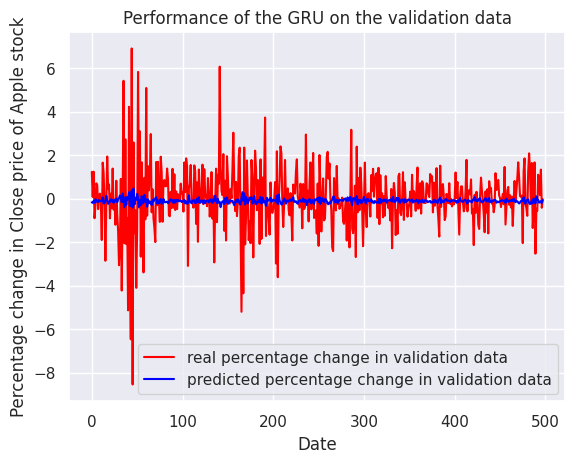

In [106]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_1_standardscaler, color="red", label="real percentage change in validation data")
plt.plot(rnn_gru_bs.predict(X_val_1_standardscaler), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the GRU on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

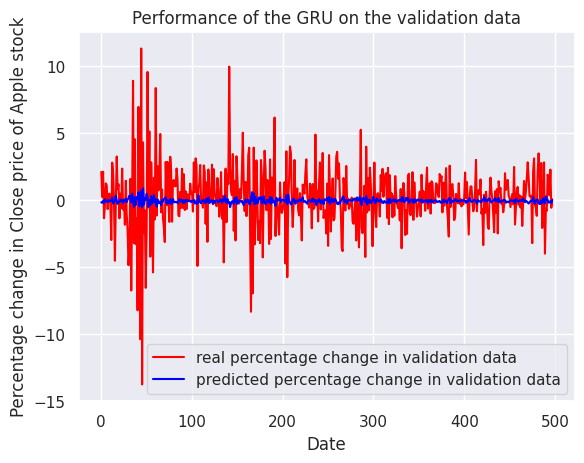

In [107]:
# Plot percentage changes in close price, after inverse transform
plt.plot(y_val_inv_std, color="red", label="real percentage change in validation data")
plt.plot(y_val_pred_gru_inv, color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the GRU on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [108]:
# Tranform back percentage change to price of prediction (y_val_pred_gru_inv)
y_pred_gru_backtransform = np.exp(np.cumsum(y_val_pred_gru_inv/100)) * apple_val_ts.close[1]
y_pred_gru_backtransform = np.insert(y_pred_gru_backtransform, 0, apple_val_ts.close[1])
y_pred_gru_backtransform

array([73.84436798, 73.71505465, 73.55949757, 73.5070846 , 73.35134929,
       73.39313318, 73.37921242, 73.26961263, 73.1680452 , 73.16901784,
       73.10938864, 73.04272783, 73.02058757, 73.15997747, 72.97175091,
       72.8192949 , 72.78883862, 73.01828886, 72.99535663, 72.7863547 ,
       72.7013748 , 72.597228  , 72.63912666, 72.57326694, 72.56982106,
       72.40445727, 72.40746128, 72.36739044, 72.43778022, 72.31926596,
       72.34096118, 72.43769982, 72.68466044, 72.85071569, 72.7242998 ,
       73.0732682 , 73.03765985, 72.66234915, 72.81546112, 72.55366728,
       72.71068223, 72.75075046, 73.17106386, 72.83265528, 73.00428719,
       73.51785414, 73.11684662, 73.74881335, 73.49267646, 73.60240875,
       73.60872824, 73.9515898 , 74.04180137, 73.65259804, 73.64595004,
       73.3594293 , 73.57299136, 73.38254851, 73.35533925, 73.6354705 ,
       73.50337957, 73.55058253, 73.18118365, 73.2111674 , 73.03545946,
       72.9553997 , 72.8095098 , 72.53330635, 72.54828158, 72.46

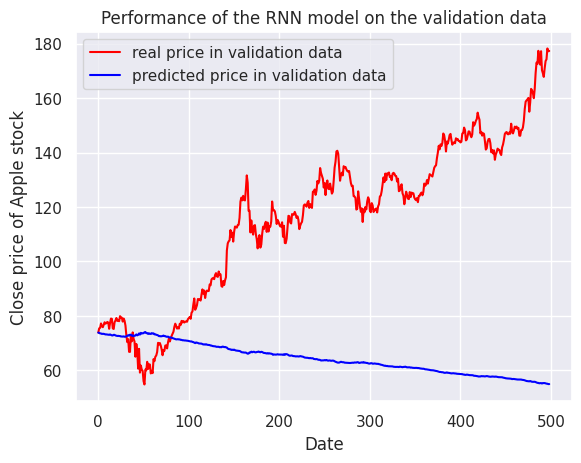

In [109]:
# Performance plot of GRU 1 hidden layer
plot_real_price(y_pred_1_std_backtransform,y_pred_gru_backtransform)

In [110]:
# MSE of standard scaled dataset
mean_squared_error(y_val_1_standardscaler, rnn_gru_bs.predict(X_val_1_standardscaler))

16/16 [==============================] - 0s 2ms/step


2.1055895788410584

In [111]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_std, y_val_pred_gru_inv)

5.5521816468364635

In [112]:
# MSE of close prices
mean_squared_error(y_pred_1_std_backtransform,y_pred_gru_backtransform)

3875.3275365334507

## GRU architecture with 4 hidden layers


Epoch 1/100
84/84 [==============================] - 8s 20ms/step - loss: 1.0044 - val_loss: 2.1296
Epoch 2/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0021 - val_loss: 2.1275
Epoch 3/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0017 - val_loss: 2.1327
Epoch 4/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0016 - val_loss: 2.1389
Epoch 5/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0011 - val_loss: 2.1317
Epoch 6/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0013 - val_loss: 2.1347
Epoch 7/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0010 - val_loss: 2.1348


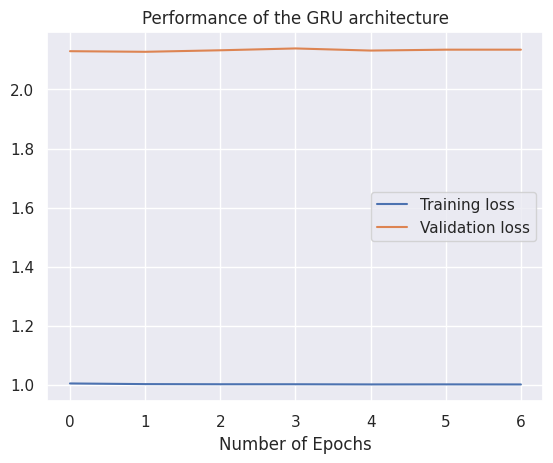

In [113]:
# The GRU architecture
rnn_gru_bs_4 = keras.models.Sequential()
rnn_gru_bs_4.add(keras.layers.GRU(units=50, return_sequences=True, input_shape=(X_train_1_standardscaler.shape[1],1), activation='tanh'))
rnn_gru_bs_4.add(keras.layers.GRU(units=50, return_sequences=True, activation='tanh'))
rnn_gru_bs_4.add(keras.layers.GRU(units=50, return_sequences=True, activation='tanh'))
rnn_gru_bs_4.add(keras.layers.GRU(units=50, return_sequences=False, activation='tanh'))
rnn_gru_bs_4.add(keras.layers.Dense(units=1))
rnn_gru_bs_4.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_gru_bs_4 = rnn_gru_bs_4.fit(X_train_1_standardscaler, y_train_1_standardscaler, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1_standardscaler, y_val_1_standardscaler),callbacks=early_stopping)

# Performance plot of the GRU 4 hidden layers
pd.DataFrame(history_gru_bs_4.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the GRU architecture')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [114]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_1_standardscaler), val.shape[1]))
temp_pred_1[:,-1] = rnn_gru_bs_4.predict(X_val_1_standardscaler)[:,0]
y_val_pred_gru_inv_4 = standard_scaler.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 1s 3ms/step


16/16 [==============================] - 0s 3ms/step


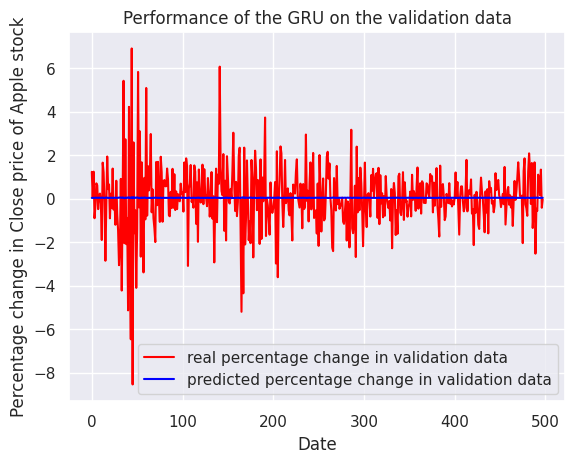

In [115]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_1_standardscaler, color="red", label="real percentage change in validation data")
plt.plot(rnn_gru_bs_4.predict(X_val_1_standardscaler), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the GRU on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

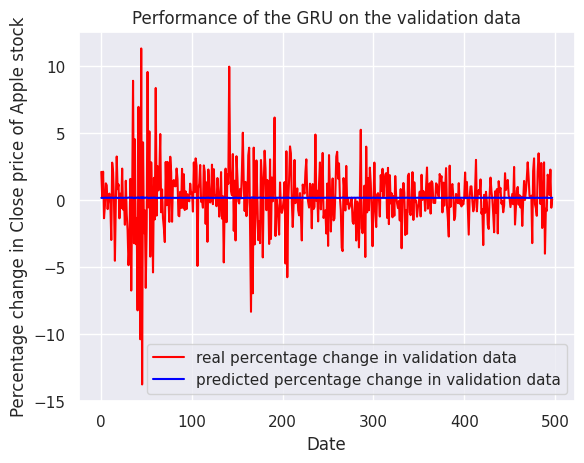

In [116]:
# Plot percentage changes in in close price, after inverse transform
plt.plot(y_val_inv_std, color="red", label="real percentage change in validation data")
plt.plot(y_val_pred_gru_inv_4, color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the GRU on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [117]:
# Tranform back percentage change to price of prediction (y_val_pred_gru_inv_4)
y_pred_gru_backtransform_4 = np.exp(np.cumsum(y_val_pred_gru_inv_4/100)) * apple_val_ts.close[1]
y_pred_gru_backtransform_4 = np.insert(y_pred_gru_backtransform_4, 0, apple_val_ts.close[1])
y_pred_gru_backtransform_4

array([ 73.84436798,  73.96144687,  74.07725997,  74.1987468 ,
        74.31489695,  74.4416029 ,  74.5656723 ,  74.68492275,
        74.80478871,  74.93023195,  75.05272283,  75.17503875,
        75.29989768,  75.43338191,  75.54952636,  75.66791399,
        75.7931483 ,  75.93240207,  76.05847667,  76.17428471,
        76.29741604,  76.41968313,  76.55000655,  76.67478293,
        76.80312642,  76.92266741,  77.05177181,  77.17876502,
        77.31191982,  77.43497473,  77.56594889,  77.70119858,
        77.84502253,  77.98451817,  78.10822801,  78.25881344,
        78.38806029,  78.49315709,  78.63309827,  78.74919067,
        78.88981848,  79.02425085,  79.18116471,  79.29177128,
        79.43415359,  79.59816893,  79.7001389 ,  79.87339225,
        79.99196397,  80.13207469,  80.26674524,  80.42084718,
        80.56059798,  80.66720814,  80.80205981,  80.91970027,
        81.06734301,  81.19208844,  81.32666175,  81.47899724,
        81.60799275,  81.74743132,  81.85824133,  81.99

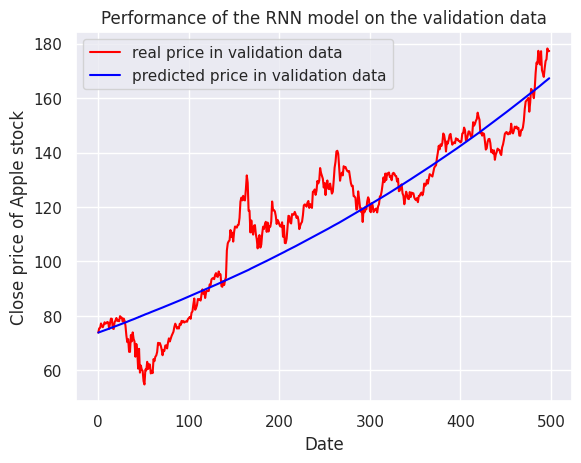

In [118]:
# Performance plot of GRU 4 hidden layers
plot_real_price(y_pred_1_std_backtransform,y_pred_gru_backtransform_4)

In [119]:
# MSE of standard scaled dataset
mean_squared_error(y_val_1_standardscaler, rnn_gru_bs_4.predict(X_val_1_standardscaler))

16/16 [==============================] - 0s 3ms/step


2.1275390224962076

In [120]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_std, y_val_pred_gru_inv_4)

5.6100596395113085

In [121]:
# MSE of close prices
mean_squared_error(y_pred_1_std_backtransform,y_pred_gru_backtransform_4)

121.33663092982407

## GRU architecture with 4 hidden layers and a dropout layer


Epoch 1/100
84/84 [==============================] - 12s 20ms/step - loss: 1.0064 - val_loss: 2.1252
Epoch 2/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0050 - val_loss: 2.1422
Epoch 3/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0012 - val_loss: 2.1310
Epoch 4/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0042 - val_loss: 2.1344
Epoch 5/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0024 - val_loss: 2.1313
Epoch 6/100
84/84 [==============================] - 1s 7ms/step - loss: 1.0009 - val_loss: 2.1336


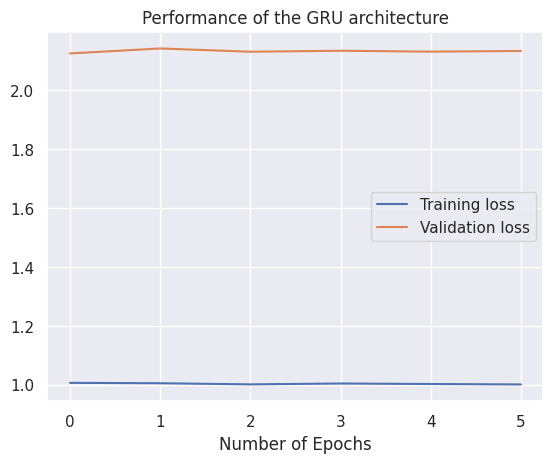

In [122]:
# The GRU architecture
rnn_gru_bs_4_2 = keras.models.Sequential()
rnn_gru_bs_4_2.add(keras.layers.GRU(units=50, return_sequences=True, input_shape=(X_train_1_standardscaler.shape[1],1), activation='tanh'))
rnn_gru_bs_4_2.add(keras.layers.GRU(units=50, return_sequences=True, activation='tanh'))
rnn_gru_bs_4_2.add(keras.layers.GRU(units=50, return_sequences=True, activation='tanh'))
rnn_gru_bs_4_2.add(keras.layers.GRU(units=50, return_sequences=False, activation='tanh'))
rnn_gru_bs_4_2.add(keras.layers.Dropout(0.2))
rnn_gru_bs_4_2.add(keras.layers.Dense(units=1))
rnn_gru_bs_4_2.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_gru_bs_4_2 = rnn_gru_bs_4_2.fit(X_train_1_standardscaler, y_train_1_standardscaler, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_1_standardscaler, y_val_1_standardscaler),callbacks=early_stopping)

# Performance plot of the GRU 4 hidden layers, 1 dropout
pd.DataFrame(history_gru_bs_4_2.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the GRU architecture')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [123]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_1_standardscaler), val.shape[1]))
temp_pred_1[:,-1] = rnn_gru_bs_4_2.predict(X_val_1_standardscaler)[:,0]
y_val_pred_gru_inv_4_2 = standard_scaler.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 3s 4ms/step


16/16 [==============================] - 0s 4ms/step


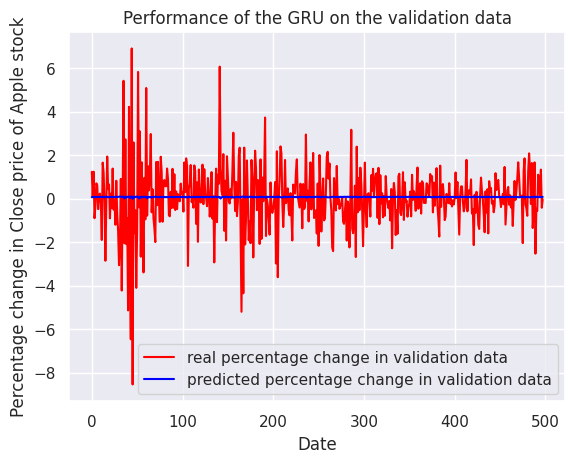

In [124]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_1_standardscaler, color="red", label="real percentage change in validation data")
plt.plot(rnn_gru_bs_4_2.predict(X_val_1_standardscaler), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the GRU on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

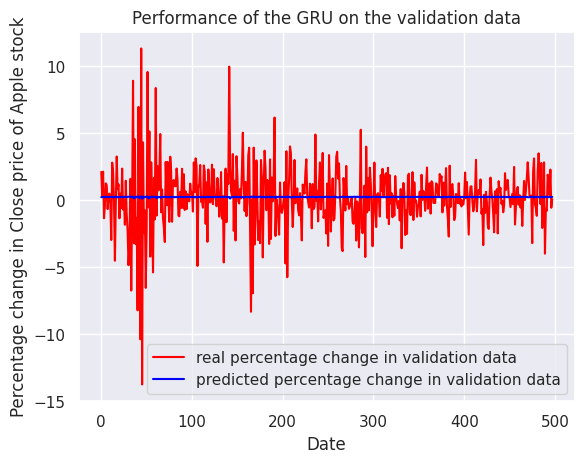

In [125]:
# Plot percentage changes in close price, after inverse transform
plt.plot(y_val_inv_std, color="red", label="real percentage change in validation data")
plt.plot(y_val_pred_gru_inv_4_2, color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the GRU on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [126]:
# Tranform back percentage change to price of prediction (y_val_pred_gru_inv_4_2)
y_pred_gru_backtransform_4_2 = np.exp(np.cumsum(y_val_pred_gru_inv_4_2/100)) * apple_val_ts.close[1]
y_pred_gru_backtransform_4_2 = np.insert(y_pred_gru_backtransform_4_2, 0, apple_val_ts.close[1])
y_pred_gru_backtransform_4_2

array([ 73.84436798,  74.00393511,  74.1602532 ,  74.32908078,
        74.48599655,  74.66346239,  74.83696798,  75.00106211,
        75.16646142,  75.34239622,  75.51315934,  75.68357461,
        75.85871334,  76.04558056,  76.20081088,  76.36199699,
        76.53792867,  76.73065723,  76.90814572,  77.06125911,
        77.23309312,  77.40299843,  77.58745499,  77.76259191,
        77.9442196 ,  78.10693832,  78.28993245,  78.46934083,
        78.65842186,  78.82953292,  79.01580042,  79.20796512,
        79.40814833,  79.60521892,  79.77739619,  79.98210689,
        80.16587951,  80.26565881,  80.46417755,  80.61201712,
        80.81161497,  81.00404584,  81.21322912,  81.33617852,
        81.53830478,  81.74950272,  81.82582551,  82.03678374,
        82.18987409,  82.39049649,  82.58381735,  82.7954747 ,
        82.99625276,  83.09220541,  83.2859891 ,  83.43267174,
        83.6419875 ,  83.81250691,  84.00595847,  84.2193888 ,
        84.40091108,  84.60242727,  84.71396035,  84.91

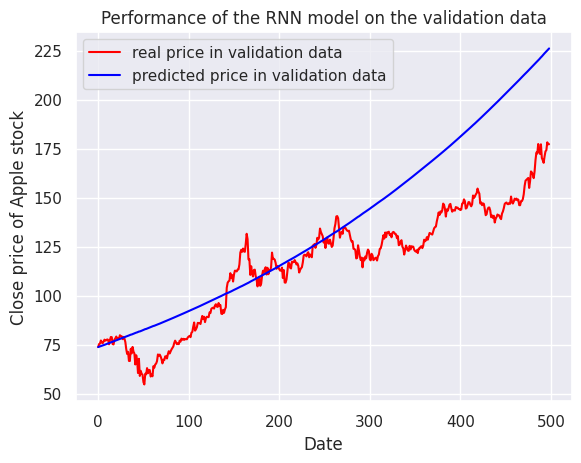

In [127]:
# Performance plot of GRU 4 hidden layers, 1 dropout
plot_real_price(y_pred_1_std_backtransform,y_pred_gru_backtransform_4_2)

In [128]:
# MSE of standard scaled dataset
mean_squared_error(y_val_1_standardscaler, rnn_gru_bs_4_2.predict(X_val_1_standardscaler))

16/16 [==============================] - 0s 3ms/step


2.1251740125219536

In [129]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_std, y_val_pred_gru_inv_4_2)

5.60382339807775

In [130]:
# MSE of close prices
mean_squared_error(y_pred_1_std_backtransform,y_pred_gru_backtransform_4_2)

802.2012984151435

In [131]:
# Model description of LSTM 4 hidden layers
lstm_bs_4.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 1, 50)             10400     
                                                                 
 lstm_2 (LSTM)               (None, 1, 50)             20200     
                                                                 
 lstm_3 (LSTM)               (None, 1, 50)             20200     
                                                                 
 lstm_4 (LSTM)               (None, 50)                20200     
                                                                 
 dense_4 (Dense)             (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [133]:
# Model description of standard RNN 1 hidden layer
rnn_bs_std.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_1 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dense_1 (Dense)             (None, 1)                 51        
                                                                 
Total params: 2651 (10.36 KB)
Trainable params: 2651 (10.36 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


## Hyperparameter Tuning


### 1. Time-step tuning


#### Time-step = 10


In [134]:
# Split datasets with time-step 10
X_train_10, y_train_10 = split_data_time_step(10, train_set)
X_val_10, y_val_10 = split_data_time_step(10, val_set)

In [135]:
# Create X_test, y_test with time_step 10
X_test_10, y_test_10 = split_data_time_step(10, test_set)

In [136]:
# Reshape array of X_train_1, y_train_1
X_train_10 = np.reshape(X_train_10, (X_train_10.shape[0], X_train_10.shape[1],1))
y_train_10 = np.reshape(y_train_10, (y_train_10.shape[0],1))
X_val_10 = np.reshape(X_val_10, (X_val_10.shape[0], X_val_10.shape[1],1))
y_val_10 = np.reshape(y_val_10, (y_val_10.shape[0],1))

In [137]:
# Reshape array of X_test_1, y_test_1
X_test_10 = np.reshape(X_test_10, (X_test_10.shape[0], X_test_10.shape[1],1))
y_test_10 = np.reshape(y_test_10, (y_test_10.shape[0],1))

In [138]:
print("The shape of X_train is: ", X_train_10.shape)
print("The shape of y_train is: ", y_train_10.shape)
print("The shape of X_test is: ", X_test_10.shape)
print("The shape of y_test is: ", y_test_10.shape)
print("The shape of X_val is: ", X_val_10.shape)
print("The shape of y_val is: ", y_val_10.shape)

The shape of X_train is:  (2508, 10, 1)
The shape of y_train is:  (2508, 1)
The shape of X_test is:  (427, 10, 1)
The shape of y_test is:  (427, 1)
The shape of X_val is:  (489, 10, 1)
The shape of y_val is:  (489, 1)


In [139]:
# Make a dataframe of training data, validation data and testing data for pre-processing
train_10 = pd.concat([pd.DataFrame(np.reshape(X_train_10, (-1, X_train_10.shape[1]))),pd.DataFrame(y_train_10)], axis =1)
val_10 = pd.concat([pd.DataFrame(np.reshape(X_val_10, (-1, X_val_10.shape[1]))),pd.DataFrame(y_val_10)], axis =1)
test_10 = pd.concat([pd.DataFrame(np.reshape(X_test_10, (-1, X_test_10.shape[1]))),pd.DataFrame(y_test_10)], axis =1)

In [140]:
# Perform standard scaling
std_scaler_10 = StandardScaler()
train_std_10 = std_scaler_10.fit_transform(train_10)

X_train_10_std = np.reshape(train_std_10[:,0:-1], (-1, X_train_10.shape[1]))
y_train_10_std = np.array(train_std_10[:,-1])

# Check statistics summary of X_train_10
pd.DataFrame(X_train_10_std).describe()

,0,1,2,3,4,5,6,7,8,9
count,2.508000e+03,2.508000e+03,2.508000e+03,2.508000e+03,2.508000e+03,2.508000e+03,2.508000e+03,2.508000e+03,2.508000e+03,2.508000e+03
mean,2.124829e-17,1.629035e-17,8.499315e-18,1.629035e-17,-7.791039e-18,5.666210e-18,7.082763e-18,-1.629035e-17,7.791039e-18,1.345725e-17
std,1.000199e+00,1.000199e+00,1.000199e+00,1.000199e+00,1.000199e+00,1.000199e+00,1.000199e+00,1.000199e+00,1.000199e+00,1.000199e+00
min,-8.172826e+00,-8.172681e+00,-8.173816e+00,-8.173933e+00,-8.172296e+00,-8.173088e+00,-8.174311e+00,-8.174949e+00,-8.173053e+00,-8.174475e+00
25%,-4.792999e-01,-4.792036e-01,-4.765689e-01,-4.766405e-01,-4.768457e-01,-4.754129e-01,-4.755025e-01,-4.753842e-01,-4.759292e-01,-4.761757e-01
50%,-9.946672e-04,-2.118709e-03,-1.691997e-03,-5.867806e-04,-9.059976e-04,-1.114111e-03,-1.229939e-03,-1.065004e-03,-1.490749e-03,-1.664761e-03
75%,5.434598e-01,5.435496e-01,5.435761e-01,5.435106e-01,5.451589e-01,5.449898e-01,5.446171e-01,5.427374e-01,5.439671e-01,5.438764e-01
max,5.173805e+00,5.173865e+00,5.173293e+00,5.173255e+00,5.171697e+00,5.171858e+00,5.171937e+00,5.172610e+00,5.170274e+00,5.170890e+00


In [141]:
# Check statistics summary of y_train_10
pd.DataFrame(y_train_10_std).describe()

,0
count,2.508000e+03
mean,1.133242e-17
std,1.000199e+00
min,-8.184376e+00
25%,-4.759347e-01
50%,-7.985731e-04
75%,5.433606e-01
max,5.178571e+00


In [142]:
# Transform validation and testing set using standard scaler
test_10_std = std_scaler_10.transform(test_10)
val_10_std = std_scaler_10.transform(val_10)

X_test_10_std = np.reshape(test_10_std[:,0:-1], (-1, X_test_10.shape[1]))
y_test_10_std = np.array(test_10_std[:,-1])

X_val_10_std = np.reshape(val_10_std[:,0:-1], (-1, X_val_10.shape[1]))
y_val_10_std = np.array(val_10_std[:,-1])


In [143]:
# Check statistics summary of X_test_10, X_val_10
display(pd.DataFrame(X_test_10_std).describe())
display(pd.DataFrame(X_val_10_std).describe())

,0,1,2,3,4,5,6,7,8,9
count,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000
mean,-0.061955,-0.057604,-0.053624,-0.054177,-0.055912,-0.055430,-0.057200,-0.060823,-0.060019,-0.060717
std,1.189860,1.190301,1.187767,1.188242,1.188256,1.188430,1.187715,1.189904,1.188447,1.188540
min,-3.778670,-3.778553,-3.779503,-3.779594,-3.779008,-3.779486,-3.780281,-3.780487,-3.779985,-3.780736
25%,-0.723672,-0.716707,-0.715422,-0.715495,-0.715643,-0.715902,-0.716398,-0.718409,-0.716772,-0.717055
50%,-0.039094,-0.036888,-0.031145,-0.031214,-0.038060,-0.031737,-0.032166,-0.038539,-0.039222,-0.039402
75%,0.645025,0.647638,0.646875,0.646810,0.646336,0.646174,0.643287,0.643515,0.642615,0.642540
max,5.186990,5.187050,5.186478,5.186440,5.184880,5.185042,5.185122,5.185797,5.183456,5.184074


,0,1,2,3,4,5,6,7,8,9
count,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000
mean,0.050916,0.052538,0.044064,0.042891,0.038876,0.042760,0.044791,0.043852,0.044615,0.044576
std,1.464471,1.465765,1.469458,1.469643,1.468537,1.468820,1.469352,1.469201,1.469672,1.469854
min,-8.531139,-8.530991,-8.532142,-8.532261,-8.530538,-8.531355,-8.532614,-8.533287,-8.531277,-8.532754
25%,-0.584668,-0.584571,-0.590689,-0.590761,-0.590939,-0.585888,-0.586371,-0.586263,-0.586773,-0.587037
50%,0.035114,0.035207,0.032857,0.032123,0.027901,0.031590,0.031833,0.032001,0.031295,0.031126
75%,0.807327,0.807415,0.806096,0.806032,0.802787,0.805370,0.805584,0.805829,0.815709,0.815660
max,6.905004,6.905053,6.904554,6.904526,6.902554,6.902838,6.903086,6.903930,6.901045,6.901925


In [144]:
# Check statistics summary of y_test_10, y_val_10
display(pd.DataFrame(y_test_10_std).describe())
display(pd.DataFrame(y_val_10_std).describe())

,0
count,427.000000
mean,-0.056738
std,1.188775
min,-3.784848
25%,-0.710731
50%,-0.032043
75%,0.644254
max,5.191772


,0
count,489.000000
mean,0.045117
std,1.471785
min,-8.543127
25%,-0.586942
50%,0.031369
75%,0.817603
max,6.911886


Epoch 1/100
84/84 [==============================] - 7s 24ms/step - loss: 1.0053 - val_loss: 2.1686
Epoch 2/100
84/84 [==============================] - 1s 11ms/step - loss: 1.0019 - val_loss: 2.1623
Epoch 3/100
84/84 [==============================] - 1s 12ms/step - loss: 1.0011 - val_loss: 2.1666
Epoch 4/100
84/84 [==============================] - 1s 12ms/step - loss: 1.0020 - val_loss: 2.1627
Epoch 5/100
84/84 [==============================] - 1s 12ms/step - loss: 1.0016 - val_loss: 2.1621
Epoch 6/100
84/84 [==============================] - 1s 9ms/step - loss: 1.0009 - val_loss: 2.1632
Epoch 7/100
84/84 [==============================] - 1s 9ms/step - loss: 1.0013 - val_loss: 2.1648
Epoch 8/100
84/84 [==============================] - 1s 8ms/step - loss: 1.0036 - val_loss: 2.1639
Epoch 9/100
84/84 [==============================] - 1s 9ms/step - loss: 1.0016 - val_loss: 2.1631
Epoch 10/100
84/84 [==============================] - 1s 9ms/step - loss: 1.0025 - val_loss: 2.1637


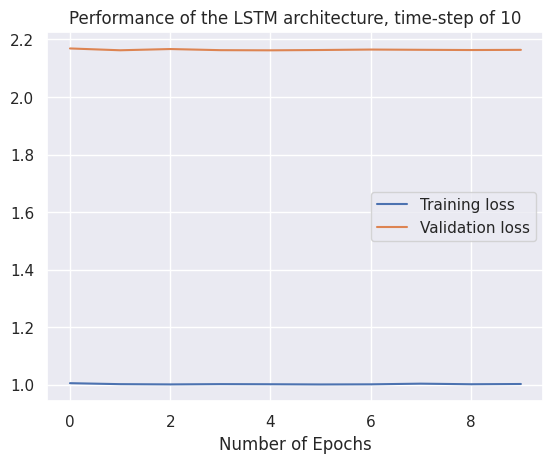

In [145]:
# LSTM architecture
lstm_bs_4_2_10 = keras.models.Sequential()
lstm_bs_4_2_10.add(keras.layers.LSTM(units=50, return_sequences=True, input_shape=(X_train_10_std.shape[1],1)))
lstm_bs_4_2_10.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4_2_10.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4_2_10.add(keras.layers.LSTM(units=50, return_sequences=False))
lstm_bs_4_2_10.add(keras.layers.Dense(units=1))

lstm_bs_4_2_10.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_lstm_bs_4_2_10 = lstm_bs_4_2_10.fit(X_train_10_std, y_train_10_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_10_std, y_val_10_std),callbacks=early_stopping)

# Performance plot of the LSTM 4 hidden layers, timestep = 10
pd.DataFrame(history_lstm_bs_4_2_10.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the LSTM architecture, time-step of 10')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [146]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_10_std), val_10.shape[1]))
temp_pred_1[:,-1] = lstm_bs_4_2_10.predict(X_val_10_std)[:,0]
y_val_pred_lstm_inv_4_2_10 = std_scaler_10.inverse_transform(temp_pred_1)[:,-1]

16/16 [==============================] - 1s 4ms/step


16/16 [==============================] - 0s 4ms/step


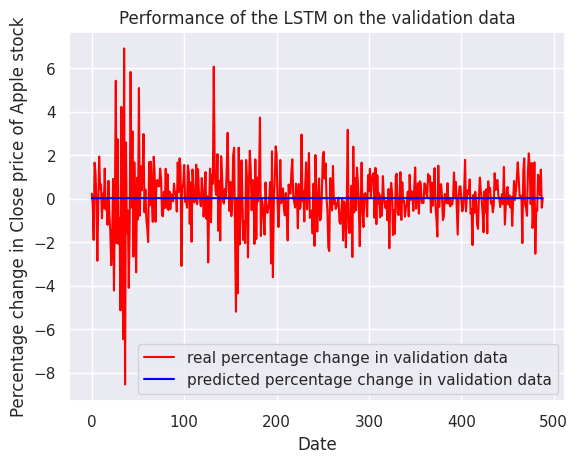

In [147]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_10_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_bs_4_2_10.predict(X_val_10_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [148]:
# Inverse transform the datasets
temp_pred = np.zeros(shape=(len(X_val_10_std), val_10.shape[1]))
temp_pred[:,-1] = y_val_10_std
y_val_inv_10 = std_scaler_10.inverse_transform(temp_pred)[:,-1]

In [57]:
# Function to plot performance
def plot_lstm(real, prediction):
  plt.plot(real, color="red", label="real percentage change in validation data")
  plt.plot(prediction, color="blue", label="predicted percentage change in validation data")
  plt.title("Performance of the LSTM on the validation data")
  plt.xlabel("Date")
  plt.ylabel("Percentage change in Close price of Apple stock")
  plt.legend()
  plt.show()

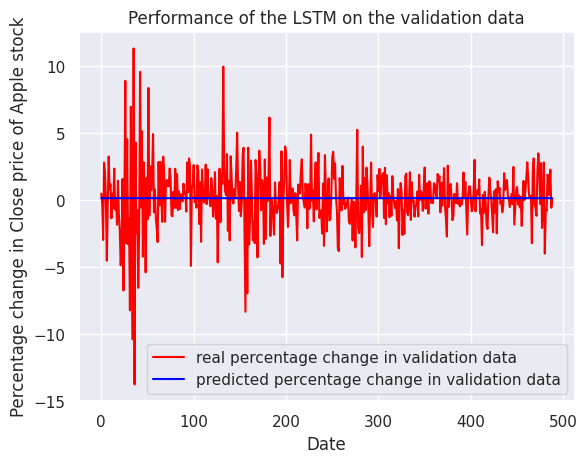

In [150]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_10, y_val_pred_lstm_inv_4_2_10)

In [151]:
# MSE of standard scaled dataset
mean_squared_error(y_val_10_std, lstm_bs_4_2_10.predict(X_val_10_std))

16/16 [==============================] - 0s 5ms/step


2.162123709727439

In [152]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_4_2_10)
y_pred_lstm_10_backtransform = np.exp(np.cumsum(y_val_pred_lstm_inv_4_2_10/100)) * apple_val_ts.close[10]
y_pred_lstm_10_backtransform = np.insert(y_pred_lstm_10_backtransform, 0, apple_val_ts.close[10])
y_pred_lstm_10_backtransform

array([ 77.37837982,  77.48384192,  77.58938798,  77.69497296,
        77.80076802,  77.90665673,  78.0127648 ,  78.11893932,
        78.22515983,  78.33158078,  78.43828736,  78.54505569,
        78.65181048,  78.7586375 ,  78.8657991 ,  78.97298802,
        79.08024549,  79.18767368,  79.29555073,  79.40365197,
        79.51176444,  79.62000415,  79.72836342,  79.83714995,
        79.94635129,  80.05585968,  80.165351  ,  80.27492571,
        80.38435456,  80.49350218,  80.60224001,  80.71089023,
        80.81983151,  80.92960233,  81.04006951,  81.15059332,
        81.26177002,  81.37313944,  81.48395303,  81.59484175,
        81.70529655,  81.81598012,  81.92701726,  82.03886213,
        82.15045859,  82.26215839,  82.37409687,  82.48515326,
        82.59694664,  82.70862267,  82.82085227,  82.93360568,
        83.04711182,  83.16096781,  83.27416291,  83.38733603,
        83.50017917,  83.6134651 ,  83.72681855,  83.84040507,
        83.95462245,  84.06909443,  84.1841045 ,  84.29

In [153]:
# Tranform back percentage change to price (y_val_inv_10)
y_lstm_10_backtransform = np.exp(np.cumsum(y_val_inv_10/100)) * apple_val_ts.close[10]
y_lstm_10_backtransform = np.insert(y_lstm_10_backtransform, 0, apple_val_ts.close[10])
y_lstm_10_backtransform

array([ 77.37837982,  77.75102997,  77.52693939,  75.24724579,
        77.37593842,  78.99559021,  78.88113403,  75.38363647,
        75.17661285,  77.6584549 ,  78.29174042,  79.20749664,
        78.13084412,  78.5019455 ,  78.02831268,  79.88132477,
        79.31247711,  79.33200836,  77.8793869 ,  79.00730896,
        78.19675446,  76.42679596,  72.79649353,  70.33071136,
        71.44641876,  66.7760849 ,  66.73704529,  72.95029449,
        70.63343048,  73.90974426,  71.51233673,  70.5626297 ,
        64.98171997,  69.66178131,  67.24237823,  60.60189056,
        67.86248016,  59.13219833,  61.73223877,  60.22104263,
        59.75962448,  55.96574783,  54.77680969,  60.27231216,
        59.94028473,  63.09452438,  60.4822731 ,  62.20830917,
        62.08135223,  58.81481171,  59.79624176,  58.93688202,
        64.07839203,  63.33620834,  64.95727539,  65.4260025 ,
        66.71017456,  70.07925415,  69.43961334,  69.99137878,
        69.04167938,  67.60857391,  65.51879883,  67.40

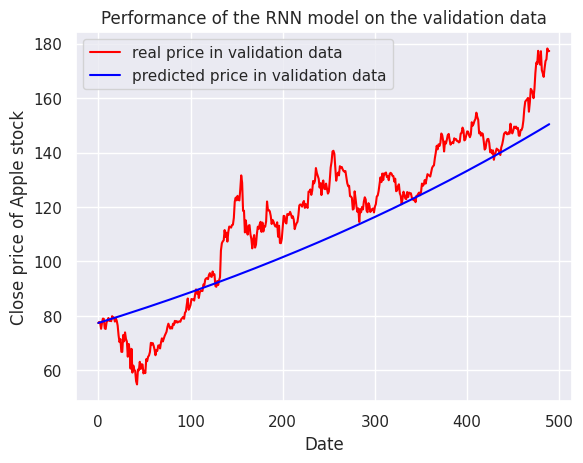

In [154]:
# Performance plot of LSTM, timestep = 10
plot_real_price(y_lstm_10_backtransform,y_pred_lstm_10_backtransform)

In [155]:
# MSE of percentage changes, after inverse transform
mean_squared_error(y_val_inv_10, y_val_pred_lstm_inv_4_2_10)

5.696678489697558

In [156]:
# MSE of close prices
mean_squared_error(y_lstm_10_backtransform,y_pred_lstm_10_backtransform)

195.94446795196907

#### Time-step = 30


In [29]:
# Split datasets with time-step 30
X_train_30, y_train_30 = split_data_time_step(30, train_set)
X_val_30, y_val_30 = split_data_time_step(30, val_set)

In [34]:
# Create X_test, y_test with time_step 30
X_test_30, y_test_30 = split_data_time_step(30, test_set)

In [35]:
# Reshape array of X_train_30, y_train_30
X_train_30 = np.reshape(X_train_30, (X_train_30.shape[0], X_train_30.shape[1],1))
y_train_30 = np.reshape(y_train_30, (y_train_30.shape[0],1))
X_val_30 = np.reshape(X_val_30, (X_val_30.shape[0], X_val_30.shape[1],1))
y_val_30 = np.reshape(y_val_30, (y_val_30.shape[0],1))

In [36]:
# Reshape array of X_test_30, y_test_30
X_test_30 = np.reshape(X_test_30, (X_test_30.shape[0], X_test_30.shape[1],1))
y_test_30 = np.reshape(y_test_30, (y_test_30.shape[0],1))

In [37]:
print("The shape of X_train is: ", X_train_30.shape)
print("The shape of y_train is: ", y_train_30.shape)
print("The shape of X_test is: ", X_test_30.shape)
print("The shape of y_test is: ", y_test_30.shape)
print("The shape of X_val is: ", X_val_30.shape)
print("The shape of y_val is: ", y_val_30.shape)

The shape of X_train is:  (2488, 30, 1)
The shape of y_train is:  (2488, 1)
The shape of X_test is:  (407, 30, 1)
The shape of y_test is:  (407, 1)
The shape of X_val is:  (469, 30, 1)
The shape of y_val is:  (469, 1)


In [38]:
# Make a dataframe of training data, validation data and testing data for pre-processing
train_30 = pd.concat([pd.DataFrame(np.reshape(X_train_30, (-1, X_train_30.shape[1]))),pd.DataFrame(y_train_30)], axis =1)
val_30 = pd.concat([pd.DataFrame(np.reshape(X_val_30, (-1, X_val_30.shape[1]))),pd.DataFrame(y_val_30)], axis =1)
test_30 = pd.concat([pd.DataFrame(np.reshape(X_test_30, (-1, X_test_30.shape[1]))),pd.DataFrame(y_test_30)], axis =1)

In [40]:
# Perform standard scaling for X_train
from sklearn.preprocessing import StandardScaler
std_scaler_30 = StandardScaler()
train_std_30 = std_scaler_30.fit_transform(train_30)

X_train_30_std = np.reshape(train_std_30[:,0:-1], (-1, X_train_30.shape[1]))
y_train_30_std = np.array(train_std_30[:,-1])

# Check statistics summary of X_train_30
pd.DataFrame(X_train_30_std).describe()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
count,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2488.000000,2.488000e+03,2.488000e+03,...,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03,2.488000e+03
mean,-8.567637e-18,2.713085e-17,-1.427940e-17,-1.642131e-17,5.711758e-18,-1.285146e-17,1.285146e-17,0.000000,2.855879e-18,-2.213306e-17,...,-4.997789e-18,-1.499337e-17,2.356100e-17,-1.927718e-17,-3.569849e-18,-6.425728e-18,-4.283819e-18,-5.711758e-18,1.142352e-17,1.213749e-17
std,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201,1.000201e+00,1.000201e+00,...,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00,1.000201e+00
min,-8.153746e+00,-8.153416e+00,-8.155546e+00,-8.154396e+00,-8.153764e+00,-8.153953e+00,-8.155066e+00,-8.154514,-8.152284e+00,-8.154488e+00,...,-8.208674e+00,-8.209769e+00,-8.218587e+00,-8.219916e+00,-8.218768e+00,-8.219067e+00,-8.219461e+00,-8.220778e+00,-8.218550e+00,-8.218435e+00
25%,-4.789273e-01,-4.787634e-01,-4.774901e-01,-4.778695e-01,-4.792466e-01,-4.780233e-01,-4.748653e-01,-0.477675,-4.790114e-01,-4.779863e-01,...,-4.755600e-01,-4.751758e-01,-4.757251e-01,-4.754120e-01,-4.757552e-01,-4.755152e-01,-4.758047e-01,-4.756291e-01,-4.758278e-01,-4.754537e-01
50%,-1.391694e-03,-1.472967e-03,-1.847369e-03,-2.086765e-03,-1.964553e-03,-2.277521e-03,-2.505674e-03,-0.002108,-1.806813e-03,-2.205078e-03,...,-2.486831e-03,-3.190981e-03,-3.328770e-03,-2.915491e-03,-3.262489e-03,-3.301342e-03,-3.272701e-03,-3.006013e-03,-3.352823e-03,-3.050041e-03
75%,5.420338e-01,5.421755e-01,5.419182e-01,5.426302e-01,5.429689e-01,5.431895e-01,5.430206e-01,0.542866,5.430382e-01,5.425101e-01,...,5.429994e-01,5.422755e-01,5.427604e-01,5.419851e-01,5.425107e-01,5.415174e-01,5.412416e-01,5.403528e-01,5.410958e-01,5.404833e-01
max,5.163468e+00,5.163509e+00,5.164247e+00,5.162744e+00,5.162927e+00,5.162151e+00,5.162484e+00,5.163168,5.162246e+00,5.162609e+00,...,5.192143e+00,5.193611e+00,5.197043e+00,5.198559e+00,5.196757e+00,5.197392e+00,5.197179e+00,5.198448e+00,5.196471e+00,5.197402e+00


In [41]:
# Check statistics summary of y_train_30
pd.DataFrame(y_train_30_std).describe()

,0
count,2.488000e+03
mean,2.427497e-17
std,1.000201e+00
min,-8.218601e+00
25%,-4.757473e-01
50%,-3.039641e-03
75%,5.401730e-01
max,5.197015e+00


In [42]:
# Transform validation and testing set using standard scaler
test_30_std = std_scaler_30.transform(test_30)
val_30_std = std_scaler_30.transform(val_30)

X_test_30_std = np.reshape(test_30_std[:,0:-1], (-1, X_test_30.shape[1]))
y_test_30_std = np.array(test_30_std[:,-1])

X_val_30_std = np.reshape(val_30_std[:,0:-1], (-1, X_val_30.shape[1]))
y_val_30_std = np.array(val_30_std[:,-1])


In [43]:
# Check statistics summary of X_test_30, X_val_30
display(pd.DataFrame(X_test_30_std).describe())
display(pd.DataFrame(X_val_30_std).describe())

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
count,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,...,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000
mean,-0.061831,-0.059325,-0.054482,-0.051218,-0.047734,-0.052297,-0.053146,-0.051573,-0.045108,-0.043654,...,-0.058780,-0.056835,-0.054703,-0.057115,-0.058474,-0.060236,-0.060658,-0.060371,-0.058954,-0.058327
std,1.195966,1.195346,1.193009,1.191896,1.193667,1.196370,1.196040,1.196323,1.196370,1.197876,...,1.191378,1.192518,1.192620,1.194485,1.194468,1.193330,1.193290,1.193481,1.191772,1.191845
min,-3.769275,-3.769040,-3.770226,-3.769949,-3.769465,-3.769847,-3.770484,-3.769889,-3.768696,-3.770055,...,-3.796678,-3.796929,-3.801714,-3.802106,-3.801930,-3.801921,-3.802256,-3.802721,-3.801877,-3.801494
25%,-0.721011,-0.713990,-0.712416,-0.706370,-0.705989,-0.712884,-0.713189,-0.712564,-0.705717,-0.706486,...,-0.713849,-0.713510,-0.704547,-0.715215,-0.715717,-0.715493,-0.715786,-0.715657,-0.704851,-0.704279
50%,-0.056557,-0.056402,-0.049655,-0.049822,-0.049464,-0.050009,-0.050243,-0.049611,-0.038115,-0.038755,...,-0.021835,-0.021364,-0.014241,-0.013830,-0.014487,-0.014215,-0.014498,-0.014233,-0.014577,-0.013963
75%,0.647188,0.647327,0.647093,0.646489,0.657322,0.656745,0.656589,0.657228,0.669834,0.677319,...,0.658075,0.671221,0.670519,0.671076,0.670269,0.658032,0.657757,0.658151,0.657597,0.658252
max,5.176624,5.176665,5.177406,5.175900,5.176083,5.175307,5.175641,5.176325,5.175400,5.175765,...,5.205382,5.206853,5.210297,5.211816,5.210011,5.210646,5.210433,5.211705,5.209724,5.210656


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
count,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,...,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000,469.000000
mean,0.036816,0.035750,0.034773,0.037679,0.037471,0.039084,0.039739,0.039172,0.033809,0.036905,...,0.043302,0.045957,0.041207,0.040144,0.039199,0.038873,0.041538,0.042261,0.047332,0.045290
std,1.472916,1.472386,1.472264,1.473906,1.473446,1.472759,1.472827,1.472526,1.475036,1.476238,...,1.482906,1.484836,1.490329,1.490803,1.490576,1.490190,1.490502,1.490794,1.490416,1.490224
min,-8.511269,-8.510931,-8.513139,-8.511917,-8.511274,-8.511446,-8.512598,-8.512050,-8.509735,-8.512008,...,-8.568441,-8.569605,-8.578752,-8.580158,-8.578931,-8.579254,-8.579653,-8.581040,-8.578699,-8.578606
25%,-0.589113,-0.588947,-0.589448,-0.589805,-0.589428,-0.588440,-0.588732,-0.588105,-0.589175,-0.589921,...,-0.596551,-0.596190,-0.598050,-0.597763,-0.598291,-0.598059,-0.598350,-0.598198,-0.596838,-0.596260
50%,0.029995,0.030147,0.029780,0.029299,0.029655,0.032992,0.033432,0.034065,0.033694,0.033732,...,0.030354,0.030835,0.029548,0.026052,0.025387,0.025662,0.029295,0.030237,0.031450,0.030497
75%,0.769640,0.765193,0.764984,0.768941,0.769272,0.768690,0.768546,0.769186,0.769305,0.771920,...,0.807373,0.808567,0.807991,0.808577,0.807740,0.808069,0.818688,0.819113,0.827410,0.819173
max,6.890851,6.890855,6.891965,6.890117,6.890242,6.889391,6.889911,6.890612,6.889282,6.889977,...,6.930370,6.932171,6.937192,6.939077,6.936892,6.937648,6.937459,6.939064,6.936541,6.937578


In [44]:
# Check statistics summary of y_test_30, y_val_30
display(pd.DataFrame(y_test_30_std).describe())
display(pd.DataFrame(y_val_30_std).describe())

,0
count,407.000000
mean,-0.061644
std,1.189794
min,-3.801733
25%,-0.704569
50%,-0.014264
75%,0.647364
max,5.210269


,0
count,469.000000
mean,0.046414
std,1.489806
min,-8.578766
25%,-0.591222
50%,0.030195
75%,0.818858
max,6.937163


Epoch 1/100
83/83 [==============================] - 8s 27ms/step - loss: 1.0130 - val_loss: 2.2178
Epoch 2/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0034 - val_loss: 2.2201
Epoch 3/100
83/83 [==============================] - 1s 11ms/step - loss: 1.0046 - val_loss: 2.2180
Epoch 4/100
83/83 [==============================] - 1s 10ms/step - loss: 1.0009 - val_loss: 2.2218
Epoch 5/100
83/83 [==============================] - 1s 11ms/step - loss: 1.0018 - val_loss: 2.2197
Epoch 6/100
83/83 [==============================] - 1s 10ms/step - loss: 1.0024 - val_loss: 2.2170
Epoch 7/100
83/83 [==============================] - 1s 10ms/step - loss: 1.0012 - val_loss: 2.2184
Epoch 8/100
83/83 [==============================] - 1s 10ms/step - loss: 1.0008 - val_loss: 2.2169
Epoch 9/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0012 - val_loss: 2.2148
Epoch 10/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0011 - val_loss: 2.2161

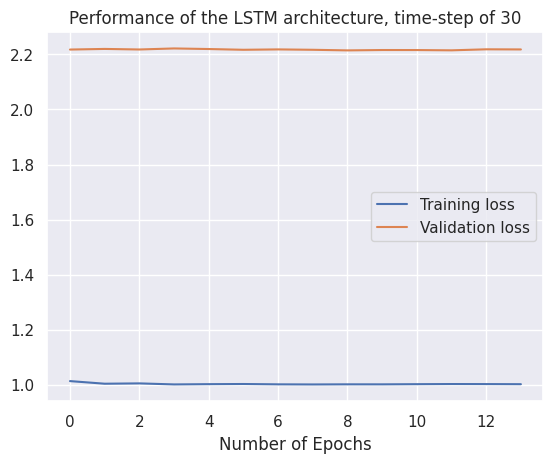

In [168]:
# LSTM architecture
lstm_bs_4_2_30 = keras.models.Sequential()
lstm_bs_4_2_30.add(keras.layers.LSTM(units=50, return_sequences=True, input_shape=(X_train_30_std.shape[1],1)))
lstm_bs_4_2_30.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4_2_30.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4_2_30.add(keras.layers.LSTM(units=50, return_sequences=False))
lstm_bs_4_2_30.add(keras.layers.Dense(units=1))

lstm_bs_4_2_30.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_lstm_bs_4_2_30 = lstm_bs_4_2_30.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

# Performance plot of LSTM 4, timestep = 30
pd.DataFrame(history_lstm_bs_4_2_30.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the LSTM architecture, time-step of 30')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [169]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_bs_4_2_30.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_4_2_30 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 5ms/step


15/15 [==============================] - 0s 5ms/step


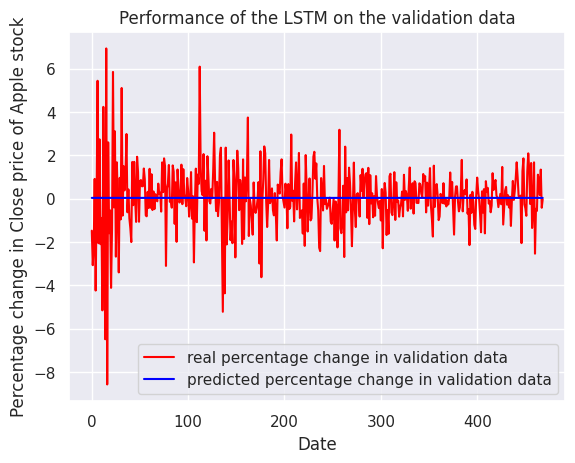

In [170]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_bs_4_2_30.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [45]:
# Inverse transform the datasets
temp_pred = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred[:,-1] = y_val_30_std
y_val_inv_30 = std_scaler_30.inverse_transform(temp_pred)[:,-1]

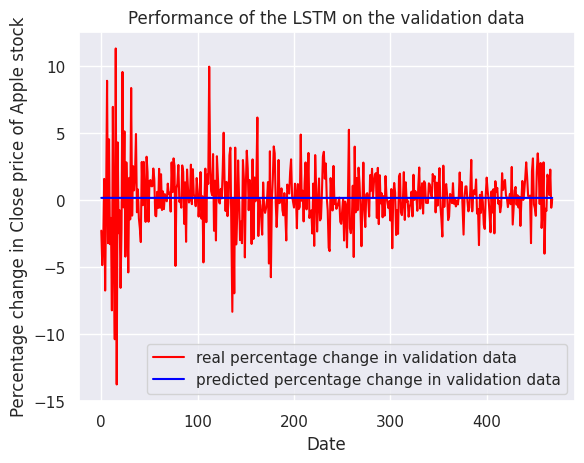

In [172]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_4_2_30)

In [173]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_bs_4_2_30.predict(X_val_30_std))

15/15 [==============================] - 0s 5ms/step


2.214761012843238

In [174]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_4_2_30)
y_pred_lstm_30_backtransform = np.exp(np.cumsum(y_val_pred_lstm_inv_4_2_30/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform = np.insert(y_pred_lstm_30_backtransform, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform

array([ 78.19675446,  78.32083987,  78.44539613,  78.57083441,
        78.697416  ,  78.82450385,  78.95243282,  79.08070471,
        79.20779091,  79.33374505,  79.45856373,  79.58268504,
        79.70658348,  79.83128273,  79.95630303,  80.08168079,
        80.20850447,  80.33543233,  80.46313615,  80.5908452 ,
        80.7183788 ,  80.8457184 ,  80.97353959,  81.10209904,
        81.23015428,  81.35752765,  81.48420919,  81.61064844,
        81.73708409,  81.86371664,  81.99105897,  82.119214  ,
        82.2482294 ,  82.37753997,  82.50695258,  82.63640888,
        82.76596229,  82.89560114,  83.02524687,  83.15499456,
        83.28495747,  83.41538675,  83.54655289,  83.67882395,
        83.81188205,  83.9455368 ,  84.07944332,  84.21335957,
        84.34745465,  84.48149916,  84.61537768,  84.74919791,
        84.88307531,  85.01702255,  85.15104886,  85.28524387,
        85.41958464,  85.55410323,  85.68888252,  85.82412481,
        85.9599009 ,  86.09620513,  86.23288016,  86.36

In [46]:
# Tranform back percentage change to price (y_val_inv_30)
y_lstm_30_backtransform = np.exp(np.cumsum(y_val_inv_30/100)) * apple_val_ts.close[30]
y_lstm_30_backtransform = np.insert(y_lstm_30_backtransform, 0, apple_val_ts.close[30])
y_lstm_30_backtransform

array([ 78.19675446,  76.42679596,  72.79649353,  70.33071136,
        71.44641876,  66.7760849 ,  66.73704529,  72.95029449,
        70.63343048,  73.90974426,  71.51233673,  70.5626297 ,
        64.98171997,  69.66178131,  67.24237823,  60.60189056,
        67.86248016,  59.13219833,  61.73223877,  60.22104263,
        59.75962448,  55.96574783,  54.77680969,  60.27231216,
        59.94028473,  63.09452438,  60.4822731 ,  62.20830917,
        62.08135223,  58.81481171,  59.79624176,  58.93688202,
        64.07839203,  63.33620834,  64.95727539,  65.4260025 ,
        66.71017456,  70.07925415,  69.43961334,  69.99137878,
        69.04167938,  67.60857391,  65.51879883,  67.40596771,
        67.14473724,  69.08317566,  69.13200378,  68.01141357,
        70.24526215,  71.72714996,  70.57239532,  71.57093048,
        72.64512634,  73.3946228 ,  74.15386963,  75.91886139,
        77.11346436,  76.23221588,  75.31177521,  75.77443695,
        75.32645416,  77.10122681,  76.65569305,  78.14

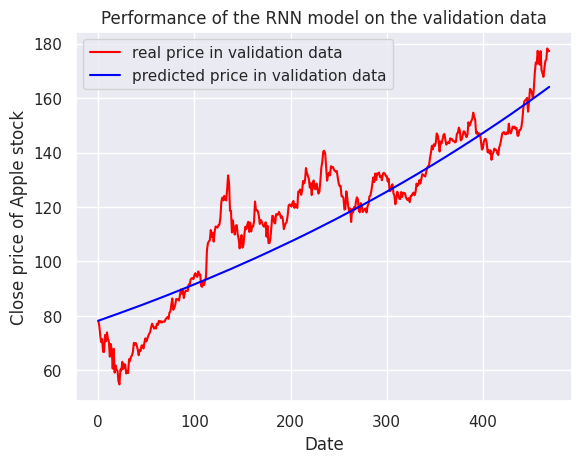

In [176]:
# Performance plot of LSTM, time-step = 30
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform)

In [177]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_4_2_30)

5.789635780210687

In [178]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform)

131.6976781833666

#### Time-step = 50


In [179]:
# Split datasets with time-step 50
X_train_50, y_train_50 = split_data_time_step(50, train_set)
X_val_50, y_val_50 = split_data_time_step(50, val_set)

In [180]:
# Create X_test, y_test with time_step 50
X_test_50, y_test_50 = split_data_time_step(50, test_set)

In [181]:
# Reshape array of X_train_50, y_train_50
X_train_50 = np.reshape(X_train_50, (X_train_50.shape[0], X_train_50.shape[1],1))
y_train_50 = np.reshape(y_train_50, (y_train_50.shape[0],1))
X_val_50 = np.reshape(X_val_50, (X_val_50.shape[0], X_val_50.shape[1],1))
y_val_50 = np.reshape(y_val_50, (y_val_50.shape[0],1))

In [182]:
# Reshape array of X_test_50, y_test_50
X_test_50 = np.reshape(X_test_50, (X_test_50.shape[0], X_test_50.shape[1],1))
y_test_50 = np.reshape(y_test_50, (y_test_50.shape[0],1))

In [183]:
print("The shape of X_train is: ", X_train_50.shape)
print("The shape of y_train is: ", y_train_50.shape)
print("The shape of X_test is: ", X_test_50.shape)
print("The shape of y_test is: ", y_test_50.shape)
print("The shape of X_val is: ", X_val_50.shape)
print("The shape of y_val is: ", y_val_50.shape)

The shape of X_train is:  (2468, 50, 1)
The shape of y_train is:  (2468, 1)
The shape of X_test is:  (387, 50, 1)
The shape of y_test is:  (387, 1)
The shape of X_val is:  (449, 50, 1)
The shape of y_val is:  (449, 1)


In [184]:
# Make a dataframe of training data, validation data and testing data for pre-processing
train_50 = pd.concat([pd.DataFrame(np.reshape(X_train_50, (-1, X_train_50.shape[1]))),pd.DataFrame(y_train_50)], axis =1)
val_50 = pd.concat([pd.DataFrame(np.reshape(X_val_50, (-1, X_val_50.shape[1]))),pd.DataFrame(y_val_50)], axis =1)
test_50 = pd.concat([pd.DataFrame(np.reshape(X_test_50, (-1, X_test_50.shape[1]))),pd.DataFrame(y_test_50)], axis =1)

In [185]:
# Perform standard scaling for X_train
std_scaler_50 = StandardScaler()
train_std_50 = std_scaler_50.fit_transform(train_50)

X_train_50_std = np.reshape(train_std_50[:,0:-1], (-1, X_train_50.shape[1]))
y_train_50_std = np.array(train_std_50[:,-1])

# Check statistics summary of X_train_50
pd.DataFrame(X_train_50_std).describe()

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
count,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,...,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,2468.000000,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03,2.468000e+03
mean,1.151609e-17,1.583462e-17,2.879022e-18,-7.197556e-18,-1.439511e-18,1.439511e-18,1.007658e-17,5.758045e-18,-5.758045e-18,-7.917312e-18,...,-2.663096e-17,1.439511e-17,-1.727413e-17,1.943340e-17,0.000000,-1.799389e-17,-1.223585e-17,2.087291e-17,-1.079633e-17,7.197556e-18
std,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,...,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00
min,-8.135664e+00,-8.135662e+00,-8.137344e+00,-8.137176e+00,-8.132979e+00,-8.133779e+00,-8.132717e+00,-8.129598e+00,-8.129989e+00,-8.132289e+00,...,-8.199797e+00,-8.199722e+00,-8.206564e+00,-8.206574e+00,-8.206208,-8.206311e+00,-8.206254e+00,-8.206157e+00,-8.205176e+00,-8.204153e+00
25%,-4.775488e-01,-4.775467e-01,-4.774722e-01,-4.777386e-01,-4.776244e-01,-4.770418e-01,-4.774321e-01,-4.775754e-01,-4.778868e-01,-4.766366e-01,...,-4.771496e-01,-4.769416e-01,-4.768168e-01,-4.768258e-01,-0.476848,-4.766529e-01,-4.767200e-01,-4.767713e-01,-4.771508e-01,-4.771810e-01
50%,-2.325986e-04,-2.305136e-04,-7.430498e-04,-8.020473e-04,-2.907999e-04,-5.076750e-04,-1.111980e-03,-1.458210e-03,-1.514427e-03,-1.897228e-03,...,-3.710768e-03,-3.746950e-03,-3.195267e-03,-2.951656e-03,-0.002997,-3.036802e-03,-3.111507e-03,-3.171861e-03,-3.789937e-03,-3.729503e-03
75%,5.412686e-01,5.412707e-01,5.418823e-01,5.428502e-01,5.433651e-01,5.431872e-01,5.430120e-01,5.424339e-01,5.421331e-01,5.418786e-01,...,5.396944e-01,5.399199e-01,5.409620e-01,5.409531e-01,0.540880,5.411142e-01,5.410308e-01,5.409600e-01,5.413762e-01,5.416419e-01
max,5.154597e+00,5.154600e+00,5.154518e+00,5.153933e+00,5.152492e+00,5.152644e+00,5.150601e+00,5.148060e+00,5.147807e+00,5.148639e+00,...,5.188442e+00,5.188747e+00,5.193983e+00,5.193975e+00,5.193669,5.194082e+00,5.193924e+00,5.193764e+00,5.191720e+00,5.191583e+00


In [186]:
# Check statistics summary of y_train_50
pd.DataFrame(y_train_50_std).describe()

,0
count,2.468000e+03
mean,-1.007658e-17
std,1.000203e+00
min,-8.204117e+00
25%,-4.774006e-01
50%,-3.712346e-03
75%,5.413886e-01
max,5.191176e+00


In [187]:
# Transform validation and testing set using standard scaler
test_50_std = std_scaler_50.transform(test_50)
val_50_std = std_scaler_50.transform(val_50)

X_test_50_std = np.reshape(test_50_std[:,0:-1], (-1, X_test_50.shape[1]))
y_test_50_std = np.array(test_50_std[:,-1])

X_val_50_std = np.reshape(val_50_std[:,0:-1], (-1, X_val_50.shape[1]))
y_val_50_std = np.array(val_50_std[:,-1])


In [188]:
# Check statistics summary of X_test_50, X_val_50
display(pd.DataFrame(X_test_50_std).describe())
display(pd.DataFrame(X_val_50_std).describe())

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
count,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,...,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000,387.000000
mean,-0.044097,-0.043051,-0.038823,-0.035735,-0.034414,-0.035696,-0.037037,-0.037274,-0.035220,-0.038887,...,-0.050131,-0.046924,-0.042462,-0.041863,-0.041457,-0.045949,-0.040450,-0.040426,-0.038418,-0.042526
std,1.208303,1.207791,1.205018,1.203836,1.203395,1.203675,1.203010,1.202510,1.201066,1.202283,...,1.200997,1.202130,1.201904,1.201203,1.200897,1.196221,1.193210,1.193083,1.190091,1.186512
min,-3.760066,-3.760065,-3.761219,-3.761300,-3.758959,-3.759445,-3.759405,-3.758150,-3.758496,-3.759765,...,-3.791942,-3.791791,-3.794657,-3.794666,-3.794521,-3.794454,-3.794468,-3.794456,-3.794471,-3.793829
25%,-0.717972,-0.711131,-0.709821,-0.703708,-0.702665,-0.702932,-0.703606,-0.703653,-0.696003,-0.704515,...,-0.690746,-0.690542,-0.681757,-0.681766,-0.676040,-0.675853,-0.669980,-0.670028,-0.661526,-0.661156
50%,-0.047745,-0.047743,-0.048154,-0.037280,-0.036519,-0.036739,-0.037569,-0.037900,-0.038206,-0.049753,...,-0.012202,-0.010631,0.008892,0.008883,0.008837,0.009050,0.011764,0.011703,0.010829,0.011141
75%,0.709254,0.709256,0.708640,0.708306,0.708751,0.708585,0.707581,0.706932,0.706633,0.706417,...,0.658630,0.671388,0.672549,0.672540,0.672460,0.660158,0.660072,0.659999,0.658979,0.648674
max,5.167727,5.167729,5.167649,5.167063,5.165617,5.165770,5.163724,5.161177,5.160924,5.161759,...,5.201669,5.201974,5.207222,5.207214,5.206907,5.207320,5.207162,5.207002,5.204955,5.204817


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
count,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,...,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000
mean,0.039098,0.038965,0.035857,0.035455,0.032578,0.034173,0.034534,0.032046,0.033604,0.031658,...,0.061511,0.067431,0.073872,0.063397,0.067089,0.084213,0.070659,0.090045,0.086359,0.089277
std,1.496719,1.496642,1.495766,1.495680,1.494088,1.493570,1.493155,1.492240,1.493511,1.494768,...,1.448077,1.449409,1.434884,1.421521,1.417573,1.384216,1.346310,1.282821,1.278412,1.276064
min,-8.492463,-8.492462,-8.494186,-8.493999,-8.489650,-8.490475,-8.489330,-8.486059,-8.486454,-8.488838,...,-8.559227,-8.559158,-8.566324,-8.566334,-8.565950,-8.566067,-8.566004,-5.213860,-5.213554,-5.212790
25%,-0.619105,-0.619103,-0.619879,-0.620138,-0.619129,-0.616969,-0.617663,-0.617747,-0.618060,-0.621009,...,-0.581408,-0.567663,-0.567620,-0.567629,-0.562561,-0.556221,-0.556286,-0.556327,-0.557073,-0.541485
50%,0.031514,0.031516,0.030818,0.030523,0.021711,0.021496,0.030194,0.020297,0.019991,0.019613,...,0.036813,0.044353,0.044948,0.037609,0.037562,0.045106,0.045030,0.049290,0.048407,0.048716
75%,0.803280,0.803282,0.772150,0.771813,0.769138,0.768976,0.767958,0.767284,0.770076,0.769876,...,0.807788,0.808582,0.809866,0.809293,0.809207,0.810015,0.809928,0.809852,0.808798,0.809040
max,6.878484,6.878487,6.878613,6.877930,6.875758,6.876033,6.873588,6.870312,6.870077,6.871316,...,6.925038,6.925373,6.932176,6.932168,6.931775,6.932254,6.092269,6.092093,6.089846,6.089631


In [189]:
# Check statistics summary of y_test_50, y_val_50
display(pd.DataFrame(y_test_50_std).describe())
display(pd.DataFrame(y_val_50_std).describe())

,0
count,387.000000
mean,-0.046839
std,1.183151
min,-3.793940
25%,-0.661370
50%,0.010905
75%,0.645884
max,5.204410


,0
count,449.000000
mean,0.090166
std,1.275693
min,-5.212853
25%,-0.541702
50%,0.048479
75%,0.808778
max,6.089194


Epoch 1/100
83/83 [==============================] - 9s 29ms/step - loss: 1.0149 - val_loss: 1.6402
Epoch 2/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0019 - val_loss: 1.6550
Epoch 3/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0023 - val_loss: 1.6376
Epoch 4/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0005 - val_loss: 1.6252
Epoch 5/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0024 - val_loss: 1.6292
Epoch 6/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0009 - val_loss: 1.6379
Epoch 7/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0017 - val_loss: 1.6311
Epoch 8/100
83/83 [==============================] - 1s 13ms/step - loss: 1.0010 - val_loss: 1.6312
Epoch 9/100
83/83 [==============================] - 1s 13ms/step - loss: 1.0005 - val_loss: 1.6318


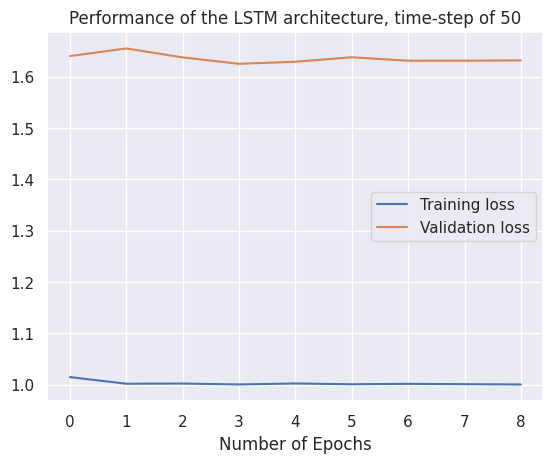

In [190]:
# LSTM architecture
lstm_bs_4_2_50 = keras.models.Sequential()
lstm_bs_4_2_50.add(keras.layers.LSTM(units=50, return_sequences=True, input_shape=(X_train_50_std.shape[1],1)))
lstm_bs_4_2_50.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4_2_50.add(keras.layers.LSTM(units=50, return_sequences=True))
lstm_bs_4_2_50.add(keras.layers.LSTM(units=50, return_sequences=False))
lstm_bs_4_2_50.add(keras.layers.Dense(units=1))

lstm_bs_4_2_50.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_lstm_bs_4_2_50 = lstm_bs_4_2_50.fit(X_train_50_std, y_train_50_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_50_std, y_val_50_std),callbacks=early_stopping)

# Performance plot of the LSTM 4 hidden layer, time-step = 50
pd.DataFrame(history_lstm_bs_4_2_50.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the LSTM architecture, time-step of 50')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [191]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_50_std), val_50.shape[1]))
temp_pred_1[:,-1] = lstm_bs_4_2_50.predict(X_val_50_std)[:,0]
y_val_pred_lstm_inv_4_2_50 = std_scaler_50.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 2s 8ms/step


15/15 [==============================] - 0s 7ms/step


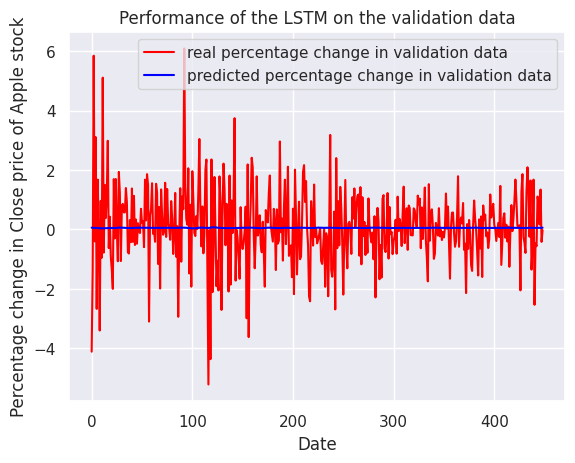

In [192]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_50_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_bs_4_2_50.predict(X_val_50_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [193]:
# Inverse transform the datasets
temp_pred = np.zeros(shape=(len(X_val_50_std), val_50.shape[1]))
temp_pred[:,-1] = y_val_50_std
y_val_inv_50 = std_scaler_50.inverse_transform(temp_pred)[:,-1]

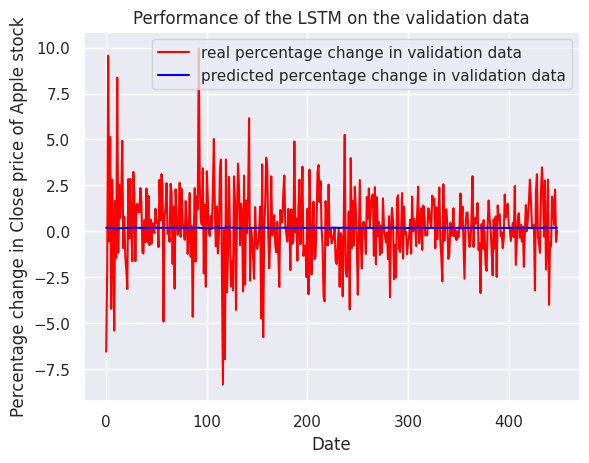

In [194]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_50, y_val_pred_lstm_inv_4_2_50)

In [195]:
# MSE of standard scaled dataset
mean_squared_error(y_val_50_std, lstm_bs_4_2_50.predict(X_val_50_std))

15/15 [==============================] - 0s 7ms/step


1.625161425878352

In [196]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_4_2_50)
y_pred_lstm_50_backtransform = np.exp(np.cumsum(y_val_pred_lstm_inv_4_2_50/100)) * apple_val_ts.close[50]
y_pred_lstm_50_backtransform = np.insert(y_pred_lstm_50_backtransform, 0, apple_val_ts.close[50])
y_pred_lstm_50_backtransform

array([ 59.75962448,  59.87541372,  59.98899437,  60.10060166,
        60.20792067,  60.3114632 ,  60.41246317,  60.51330145,
        60.61384143,  60.71316237,  60.81184871,  60.90972499,
        61.00721061,  61.10416938,  61.20245945,  61.30343052,
        61.40750908,  61.51389213,  61.62128224,  61.72902833,
        61.83635228,  61.94284186,  62.04882022,  62.15581543,
        62.26425705,  62.37501721,  62.48858581,  62.6058356 ,
        62.72738319,  62.85143277,  62.97581449,  63.09940709,
        63.22096057,  63.33965426,  63.45543434,  63.56878552,
        63.68035102,  63.79092746,  63.90146495,  64.01265436,
        64.12464504,  64.23776898,  64.35211073,  64.46839554,
        64.58693034,  64.70807727,  64.83139971,  64.95623521,
        65.08157816,  65.20666491,  65.33115268,  65.45475898,
        65.5775742 ,  65.69982616,  65.82196395,  65.94367606,
        66.064897  ,  66.1854728 ,  66.30545234,  66.4261507 ,
        66.54726771,  66.66788759,  66.78737833,  66.90

In [197]:
# Tranform back percentage change to price (y_val_inv_50)
y_lstm_50_backtransform = np.exp(np.cumsum(y_val_inv_50/100)) * apple_val_ts.close[50]
y_lstm_50_backtransform = np.insert(y_lstm_50_backtransform, 0, apple_val_ts.close[50])
y_lstm_50_backtransform

array([ 59.75962448,  55.96574783,  54.77680969,  60.27231216,
        59.94028473,  63.09452438,  60.4822731 ,  62.20830917,
        62.08135223,  58.81481171,  59.79624176,  58.93688202,
        64.07839203,  63.33620834,  64.95727539,  65.4260025 ,
        66.71017456,  70.07925415,  69.43961334,  69.99137878,
        69.04167938,  67.60857391,  65.51879883,  67.40596771,
        67.14473724,  69.08317566,  69.13200378,  68.01141357,
        70.24526215,  71.72714996,  70.57239532,  71.57093048,
        72.64512634,  73.3946228 ,  74.15386963,  75.91886139,
        77.11346436,  76.23221588,  75.31177521,  75.77443695,
        75.32645416,  77.10122681,  76.65569305,  78.14652252,
        77.56391144,  78.06330109,  77.53451538,  77.87234497,
        77.90661621,  77.83073425,  78.78788757,  79.1526413 ,
        79.58837891,  78.90294647,  81.15016937,  81.62997437,
        84.20768738,  86.37414551,  82.22729492,  82.93719482,
        83.96289063,  86.18809509,  86.06814575,  86.10

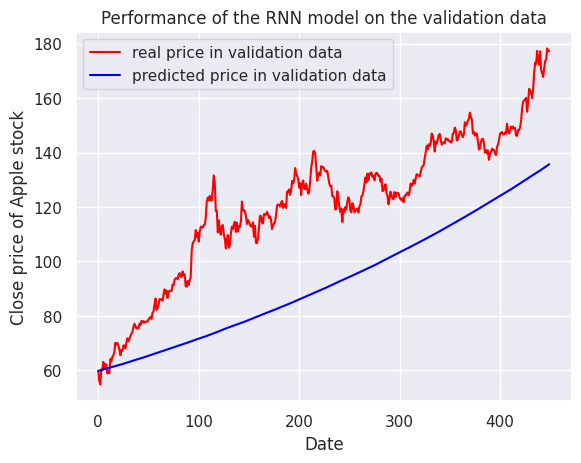

In [198]:
# Performance plot of LSTM 4 hidden layers, timestep = 50
plot_real_price(y_lstm_50_backtransform,y_pred_lstm_50_backtransform)

In [199]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_50, y_val_pred_lstm_inv_4_2_50)

4.261256893503548

In [200]:
# MSE of close prices
mean_squared_error(y_lstm_50_backtransform,y_pred_lstm_50_backtransform)

933.5094966070966

#### Time-step = 100


In [201]:
# Split datasets with time-step 100
X_train_100, y_train_100 = split_data_time_step(100, train_set)
X_val_100, y_val_100 = split_data_time_step(100, val_set)

In [202]:
# Create X_test, y_test with time_step 100
X_test_100, y_test_100 = split_data_time_step(100, test_set)

In [203]:
# Reshape array of X_train_100, y_train_100
X_train_100 = np.reshape(X_train_100, (X_train_100.shape[0], X_train_100.shape[1],1))
y_train_100 = np.reshape(y_train_100, (y_train_100.shape[0],1))
X_val_100 = np.reshape(X_val_100, (X_val_100.shape[0], X_val_100.shape[1],1))
y_val_100 = np.reshape(y_val_100, (y_val_100.shape[0],1))

In [204]:
# Reshape array of X_test_100, y_test_1000
X_test_100 = np.reshape(X_test_100, (X_test_100.shape[0], X_test_100.shape[1],1))
y_test_100 = np.reshape(y_test_100, (y_test_100.shape[0],1))

In [205]:
print("The shape of X_train is: ", X_train_100.shape)
print("The shape of y_train is: ", y_train_100.shape)
print("The shape of X_test is: ", X_test_100.shape)
print("The shape of y_test is: ", y_test_100.shape)
print("The shape of X_val is: ", X_val_100.shape)
print("The shape of y_val is: ", y_val_100.shape)

The shape of X_train is:  (2418, 100, 1)
The shape of y_train is:  (2418, 1)
The shape of X_test is:  (337, 100, 1)
The shape of y_test is:  (337, 1)
The shape of X_val is:  (399, 100, 1)
The shape of y_val is:  (399, 1)


In [206]:
# Make a dataframe of training data, validation data and testing data for pre-processing
train_100 = pd.concat([pd.DataFrame(np.reshape(X_train_100, (-1, X_train_100.shape[1]))),pd.DataFrame(y_train_100)], axis =1)
val_100 = pd.concat([pd.DataFrame(np.reshape(X_val_100, (-1, X_val_100.shape[1]))),pd.DataFrame(y_val_100)], axis =1)
test_100 = pd.concat([pd.DataFrame(np.reshape(X_test_100, (-1, X_test_100.shape[1]))),pd.DataFrame(y_test_100)], axis =1)

In [207]:
# Perform standard scaling for X_train
std_scaler_100 = StandardScaler()
train_std_100 = std_scaler_100.fit_transform(train_100)

X_train_100_std = np.reshape(train_std_100[:,0:-1], (-1, X_train_100.shape[1]))
y_train_100_std = np.array(train_std_100[:,-1])

# Check statistics summary of X_train_100
pd.DataFrame(X_train_100_std).describe()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
count,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,...,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,2418.000000,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03,2.418000e+03
mean,-1.028494e-17,3.232411e-17,1.469278e-17,5.877111e-18,-1.469278e-17,-1.616206e-17,-2.938556e-18,1.469278e-18,-1.469278e-18,-2.938556e-18,...,8.815667e-18,-3.305875e-17,-3.673194e-18,7.346389e-19,0.000000,8.081028e-18,-3.673194e-18,-2.056989e-17,1.028494e-17,8.815667e-18
std,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,...,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,1.000207,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00,1.000207e+00
min,-8.122223e+00,-8.115359e+00,-8.117212e+00,-8.114725e+00,-8.113288e+00,-8.114101e+00,-8.114996e+00,-8.115685e+00,-8.100394e+00,-8.101237e+00,...,-8.249993e+00,-8.252623e+00,-8.251462e+00,-8.252124e+00,-8.252630,-8.266792e+00,-8.268451e+00,-8.269869e+00,-8.267858e+00,-8.267162e+00
25%,-4.772785e-01,-4.762979e-01,-4.764864e-01,-4.769395e-01,-4.771368e-01,-4.770809e-01,-4.766903e-01,-4.763773e-01,-4.754638e-01,-4.753905e-01,...,-4.797685e-01,-4.771566e-01,-4.774433e-01,-4.769097e-01,-0.476727,-4.757005e-01,-4.754786e-01,-4.752962e-01,-4.758799e-01,-4.786039e-01
50%,2.286870e-03,2.972975e-03,2.694310e-03,2.176848e-03,1.876949e-03,1.651900e-03,1.176937e-03,1.465924e-03,2.511129e-03,1.697298e-03,...,-4.360474e-04,-8.385498e-04,-1.213898e-03,-1.338964e-03,-0.002157,-3.271312e-03,-2.935370e-03,-2.655880e-03,-3.204348e-03,-3.069443e-03
75%,5.383223e-01,5.387288e-01,5.385540e-01,5.396630e-01,5.399414e-01,5.397554e-01,5.396118e-01,5.396621e-01,5.397628e-01,5.392539e-01,...,5.431157e-01,5.428599e-01,5.431175e-01,5.429339e-01,0.543974,5.437235e-01,5.422031e-01,5.418590e-01,5.416720e-01,5.417699e-01
max,5.150498e+00,5.147466e+00,5.148185e+00,5.145568e+00,5.144167e+00,5.144315e+00,5.143964e+00,5.145014e+00,5.137033e+00,5.136096e+00,...,5.227013e+00,5.228022e+00,5.226674e+00,5.226745e+00,5.225566,5.232720e+00,5.234319e+00,5.235675e+00,5.233190e+00,5.232969e+00


In [208]:
# Check statistics summary of y_train_100
pd.DataFrame(y_train_100_std).describe()

,0
count,2.418000e+03
mean,5.142472e-18
std,1.000207e+00
min,-8.274782e+00
25%,-4.783358e-01
50%,-2.319754e-03
75%,5.423354e-01
max,5.239022e+00


In [209]:
# Transform validation and testing set using standard scaler
test_100_std = std_scaler_100.transform(test_100)
val_100_std = std_scaler_100.transform(val_100)

X_test_100_std = np.reshape(test_100_std[:,0:-1], (-1, X_test_100.shape[1]))
y_test_100_std = np.array(test_100_std[:,-1])

X_val_100_std = np.reshape(val_100_std[:,0:-1], (-1, X_val_100.shape[1]))
y_val_100_std = np.array(val_100_std[:,-1])


In [210]:
# Check statistics summary of X_test_100, X_val_100
display(pd.DataFrame(X_test_100_std).describe())
display(pd.DataFrame(X_val_100_std).describe())

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
count,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,...,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000,337.000000
mean,-0.059453,-0.058102,-0.051618,-0.048983,-0.050436,-0.051212,-0.054795,-0.054240,-0.047160,-0.048869,...,-0.016489,-0.019597,-0.016854,-0.025421,-0.017276,-0.012896,-0.011526,-0.022891,-0.021692,-0.021484
std,1.275714,1.274492,1.272050,1.270322,1.270177,1.270307,1.269146,1.269340,1.266296,1.266178,...,1.166731,1.163653,1.162953,1.162172,1.145434,1.144028,1.144519,1.140192,1.138249,1.138175
min,-3.752400,-3.748795,-3.749801,-3.748995,-3.748492,-3.748988,-3.749704,-3.749820,-3.742192,-3.743066,...,-3.812913,-3.814345,-3.814010,-3.814431,-3.815158,-3.822302,-3.822888,-3.823394,-3.822862,-3.822468
25%,-0.890678,-0.889206,-0.837232,-0.830519,-0.830640,-0.830926,-0.831522,-0.831255,-0.806609,-0.807504,...,-0.644693,-0.645270,-0.636226,-0.645773,-0.637360,-0.627916,-0.627731,-0.639148,-0.628113,-0.627936
50%,-0.076769,-0.075904,-0.055265,-0.052145,-0.056168,-0.077319,-0.077884,-0.077519,-0.055446,-0.056346,...,-0.006748,-0.007153,0.011561,-0.007740,-0.008657,0.009336,0.009675,-0.009169,-0.009908,-0.009773
75%,0.754339,0.754585,0.754452,0.753525,0.753064,0.752894,0.737759,0.738232,0.752564,0.751658,...,0.656844,0.656619,0.656121,0.650845,0.649895,0.649812,0.650305,0.635234,0.634281,0.634373
max,5.163611,5.160569,5.161290,5.158668,5.157264,5.157413,5.157063,5.158115,5.150110,5.149173,...,5.240327,5.241340,5.239989,5.240061,5.238882,5.246056,5.247659,5.249017,5.246528,5.246306


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
count,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,...,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000
mean,0.053080,0.051350,0.047344,0.046617,0.046219,0.048296,0.050456,0.047985,0.043313,0.043807,...,0.073253,0.073622,0.067897,0.063672,0.062647,0.063583,0.067367,0.067550,0.070261,0.069641
std,1.561289,1.559525,1.558772,1.558171,1.557771,1.557185,1.557560,1.557600,1.556864,1.556644,...,1.198419,1.199665,1.206341,1.205493,1.205486,1.208470,1.209154,1.209391,1.210696,1.210824
min,-8.478552,-8.471422,-8.473344,-8.470720,-8.469207,-8.470046,-8.470955,-8.471691,-8.455775,-8.456616,...,-5.240482,-5.242300,-5.241699,-5.242198,-5.242854,-5.252256,-5.253187,-5.253986,-5.252978,-5.252487
25%,-0.631293,-0.630014,-0.630415,-0.630809,-0.630974,-0.619411,-0.619998,-0.619704,-0.629383,-0.630279,...,-0.529449,-0.529994,-0.533892,-0.534135,-0.537445,-0.539406,-0.539199,-0.539030,-0.539593,-0.539421
50%,0.024642,0.024129,0.015518,0.014875,0.014573,0.022681,0.023422,0.022499,0.015188,0.022607,...,0.048599,0.048210,0.047825,0.040242,0.039323,0.038274,0.046005,0.046295,0.049891,0.050023
75%,0.871897,0.861675,0.850800,0.849836,0.849355,0.849191,0.848664,0.849151,0.848709,0.847802,...,0.764955,0.764759,0.764241,0.760316,0.759361,0.763210,0.767258,0.767696,0.771552,0.771634
max,6.872110,6.867794,6.868847,6.865568,6.863799,6.864071,6.863791,6.865067,6.854067,6.853118,...,6.130509,6.131762,6.130246,6.130366,6.129142,6.137725,6.139543,6.141084,6.138298,6.138016


In [211]:
# Check statistics summary of y_test_100, y_val_100
display(pd.DataFrame(y_test_100_std).describe())
display(pd.DataFrame(y_val_100_std).describe())

,0
count,337.000000
mean,-0.024431
std,1.136820
min,-3.825587
25%,-0.627819
50%,-0.009030
75%,0.602538
max,5.252373


,0
count,399.000000
mean,0.068634
std,1.211644
min,-5.257054
25%,-0.539215
50%,0.046468
75%,0.773169
max,6.144985


Epoch 1/100
81/81 [==============================] - 8s 37ms/step - loss: 1.0087 - val_loss: 1.4644
Epoch 2/100
81/81 [==============================] - 2s 23ms/step - loss: 1.0008 - val_loss: 1.4650
Epoch 3/100
81/81 [==============================] - 2s 21ms/step - loss: 0.9986 - val_loss: 1.4855
Epoch 4/100
81/81 [==============================] - 1s 18ms/step - loss: 1.0049 - val_loss: 1.4765
Epoch 5/100
81/81 [==============================] - 1s 18ms/step - loss: 1.0022 - val_loss: 1.4727
Epoch 6/100
81/81 [==============================] - 1s 18ms/step - loss: 1.0013 - val_loss: 1.4695


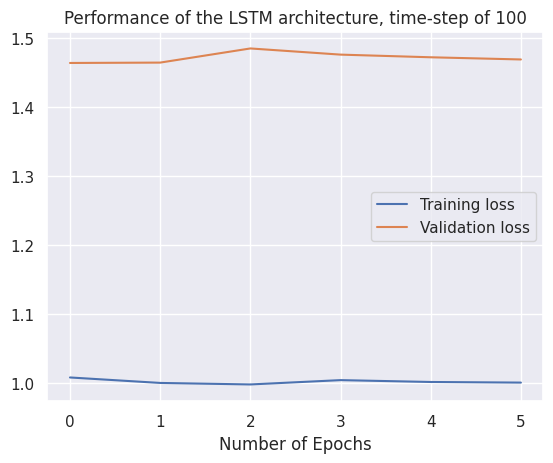

In [212]:
# LSTM architecture
lstm_bs_4_2_100 = keras.models.Sequential()
lstm_bs_4_2_100.add(keras.layers.LSTM(units=100, return_sequences=True, input_shape=(X_train_100_std.shape[1],1)))
lstm_bs_4_2_100.add(keras.layers.LSTM(units=100, return_sequences=True))
lstm_bs_4_2_100.add(keras.layers.LSTM(units=100, return_sequences=True))
lstm_bs_4_2_100.add(keras.layers.LSTM(units=100, return_sequences=False))
lstm_bs_4_2_100.add(keras.layers.Dense(units=1))

lstm_bs_4_2_100.compile(optimizer=optimizer_bs(learning_rate=learningrate_bs), loss = "mean_squared_error")
history_lstm_bs_4_2_100 = lstm_bs_4_2_100.fit(X_train_100_std, y_train_100_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_100_std, y_val_100_std),callbacks=early_stopping)

# Performance plot of the LSTM 4 hidden layers, timestep = 100
pd.DataFrame(history_lstm_bs_4_2_100.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'Performance of the LSTM architecture, time-step of 100')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

In [213]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_100_std), val_100.shape[1]))
temp_pred_1[:,-1] = lstm_bs_4_2_100.predict(X_val_100_std)[:,0]
y_val_pred_lstm_inv_4_2_100 = std_scaler_100.inverse_transform(temp_pred_1)[:,-1]

13/13 [==============================] - 2s 16ms/step


13/13 [==============================] - 0s 12ms/step


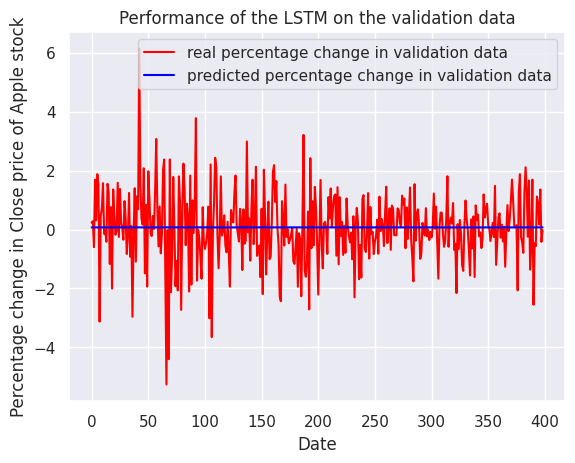

In [214]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_100_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_bs_4_2_100.predict(X_val_100_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [215]:
# Inverse transform the datasets
temp_pred = np.zeros(shape=(len(X_val_100_std), val_100.shape[1]))
temp_pred[:,-1] = y_val_100_std
y_val_inv_100 = std_scaler_100.inverse_transform(temp_pred)[:,-1]

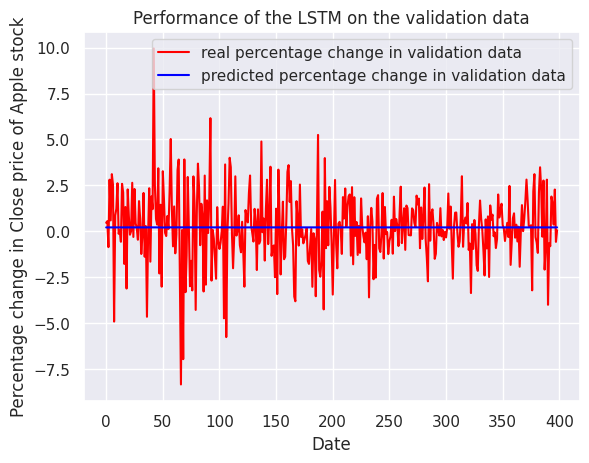

In [216]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_100, y_val_pred_lstm_inv_4_2_100)

In [217]:
# MSE of standard scaled dataset
mean_squared_error(y_val_100_std, lstm_bs_4_2_100.predict(X_val_100_std))

13/13 [==============================] - 0s 9ms/step


1.4644263765308598

In [218]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_4_2_100)
y_pred_lstm_100_backtransform = np.exp(np.cumsum(y_val_pred_lstm_inv_4_2_100/100)) * apple_val_ts.close[100]
y_pred_lstm_100_backtransform = np.insert(y_pred_lstm_100_backtransform, 0, apple_val_ts.close[100])
y_pred_lstm_100_backtransform

array([ 78.78788757,  78.95276515,  79.11818848,  79.28410133,
        79.45032459,  79.61685372,  79.78374153,  79.95103598,
        80.11875171,  80.28665171,  80.4544615 ,  80.6223364 ,
        80.79072444,  80.95980775,  81.1294117 ,  81.29929659,
        81.46952935,  81.64034706,  81.81168573,  81.98333842,
        82.15516447,  82.3273281 ,  82.50010297,  82.67350948,
        82.84734972,  83.0215625 ,  83.19608957,  83.3708574 ,
        83.54577979,  83.72073061,  83.89564634,  84.07073194,
        84.24628924,  84.42242195,  84.59909252,  84.77641457,
        84.95441304,  85.13292674,  85.31177197,  85.49093896,
        85.67071253,  85.85116723,  86.0321326 ,  86.21336437,
        86.39546896,  86.57865505,  86.76195547,  86.94405034,
        87.12459512,  87.30397397,  87.48310813,  87.66293594,
        87.84452583,  88.02848692,  88.21465138,  88.40226482,
        88.59050606,  88.77878708,  88.96695032,  89.15536981,
        89.3442264 ,  89.53310451,  89.72157399,  89.90

In [219]:
# Tranform back percentage change to price (y_val_inv_100)
y_lstm_100_backtransform = np.exp(np.cumsum(y_val_inv_100/100)) * apple_val_ts.close[100]
y_lstm_100_backtransform = np.insert(y_lstm_100_backtransform, 0, apple_val_ts.close[100])
y_lstm_100_backtransform

array([ 78.78788757,  79.1526413 ,  79.58837891,  78.90294647,
        81.15016937,  81.62997437,  84.20768738,  86.37414551,
        82.22729492,  82.93719482,  83.96289063,  86.18809509,
        86.06814575,  86.10242462,  85.61037445,  87.8502655 ,
        89.72541046,  88.14157867,  89.31170654,  86.56752777,
        88.56263733,  89.30189514,  89.13300323,  89.13300323,
        91.51733398,  91.23337555,  93.35818481,  93.75965881,
        93.92366791,  93.49038696,  95.03751373,  95.69112396,
        94.51364899,  94.32270813,  96.31044769,  94.98120117,
        95.24803925,  90.91267395,  90.68745422,  92.83678436,
        91.31169891,  93.06199646,  94.18806458, 104.0484848 ,
       106.67025757, 107.38261414, 107.77183533, 111.53191376,
       108.99616241, 110.58041382, 107.29175568, 110.85751343,
       112.8194046 , 112.7188797 , 112.42456818, 113.36140442,
       113.50363922, 116.02223206, 122.00113678, 123.46031189,
       122.44748688, 124.11264801, 122.62895203, 122.43

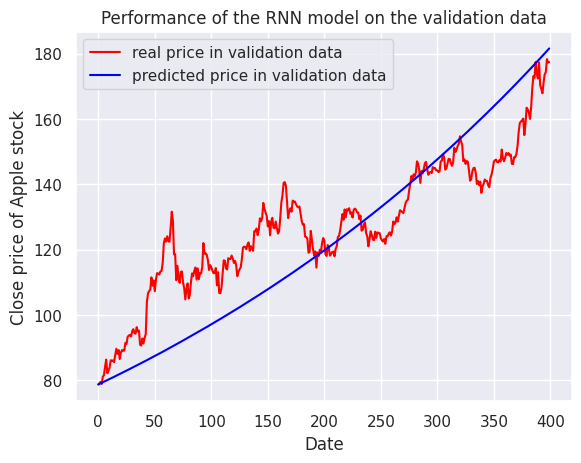

In [220]:
# Performance plot of LSTM 4 hidden layers, timestep = 100
plot_real_price(y_lstm_100_backtransform,y_pred_lstm_100_backtransform)

In [221]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_100, y_val_pred_lstm_inv_4_2_100)

3.7727492282109845

In [222]:
# MSE of close prices
mean_squared_error(y_lstm_100_backtransform,y_pred_lstm_100_backtransform)

212.74019087137142

### 2. Optimizer and activation function tuning


In [226]:
# time_step = 30
# Define function to build models (tuning optimizer and activation function, learning rate)
def create_gru(optimizer_tune, actfn):
  lstm_30 = keras.models.Sequential()
  lstm_30.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn, input_shape=(X_train_30_std.shape[1],1)))
  lstm_30.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn))
  lstm_30.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn))
  lstm_30.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn))
  lstm_30.add(keras.layers.Dense(units=1))

  lstm_30.compile(optimizer=optimizer_tune, loss = "mean_squared_error")
  history_lstm_30 = lstm_30.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)
  return history_lstm_30, lstm_30

In [235]:
# Create a list of optimizers, learning rates
actfn_list = ['tanh', 'relu', 'LeakyReLU', 'elu', 'selu']
lr = [0.001, 0.01]

Epoch 1/100
83/83 [==============================] - 7s 27ms/step - loss: 1.0021 - val_loss: 2.2178
Epoch 2/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0018 - val_loss: 2.2159
Epoch 3/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0016 - val_loss: 2.2184
Epoch 4/100
83/83 [==============================] - 1s 15ms/step - loss: 1.0021 - val_loss: 2.2166
Epoch 5/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0016 - val_loss: 2.2180
Epoch 6/100
83/83 [==============================] - 1s 11ms/step - loss: 1.0003 - val_loss: 2.2211
Epoch 7/100
15/15 [==============================] - 1s 5ms/step


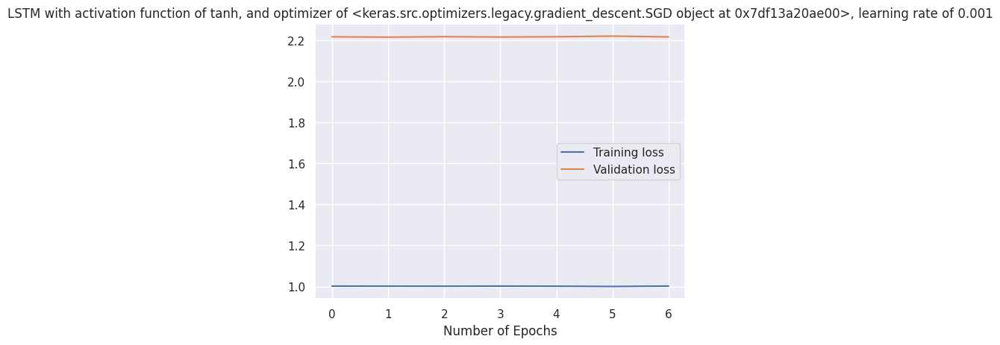

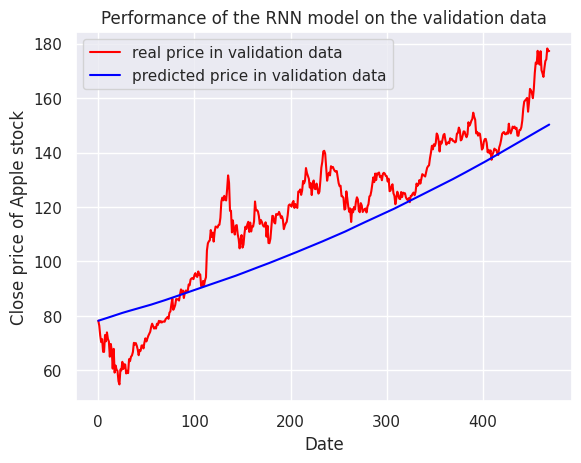

Model: "sequential_70"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_253 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_254 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_255 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_256 (LSTM)             (None, 50)                20200     
                                                                 
 dense_70 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 8s 30ms/step - loss: 1.0019 - val_loss: 2.2147
Epoch 2/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0015 - val_loss: 2.2173
Epoch 3/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0007 - val_loss: 2.2174
Epoch 4/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0005 - val_loss: 2.2154
Epoch 5/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0008 - val_loss: 2.2148
Epoch 6/100
15/15 [==============================] - 1s 6ms/step


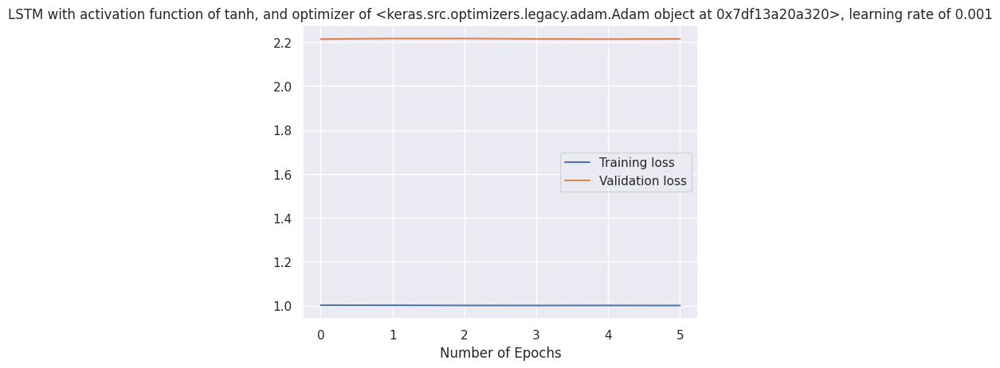

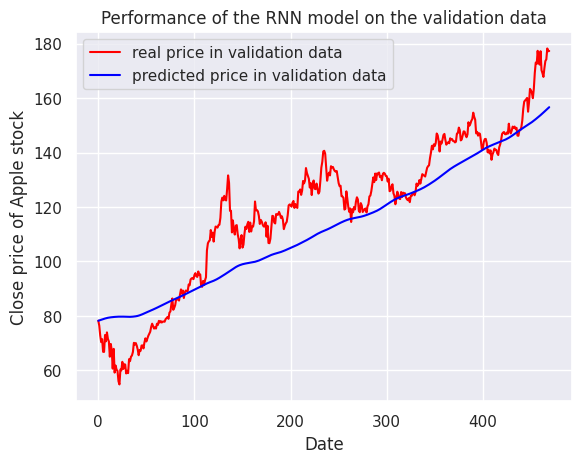

Model: "sequential_71"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_257 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_258 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_259 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_260 (LSTM)             (None, 50)                20200     
                                                                 
 dense_71 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 8s 29ms/step - loss: 1.0026 - val_loss: 2.2168
Epoch 2/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0010 - val_loss: 2.2156
Epoch 3/100
83/83 [==============================] - 1s 17ms/step - loss: 1.0006 - val_loss: 2.2159
Epoch 4/100
83/83 [==============================] - 1s 17ms/step - loss: 1.0005 - val_loss: 2.2167
Epoch 5/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0009 - val_loss: 2.2138
Epoch 6/100
83/83 [==============================] - 1s 13ms/step - loss: 1.0031 - val_loss: 2.2169
Epoch 7/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0002 - val_loss: 2.2210
Epoch 8/100
83/83 [==============================] - 1s 15ms/step - loss: 1.0007 - val_loss: 2.2183
Epoch 9/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0001 - val_loss: 2.2170
Epoch 10/100
15/15 [==============================] - 1s 5ms/step


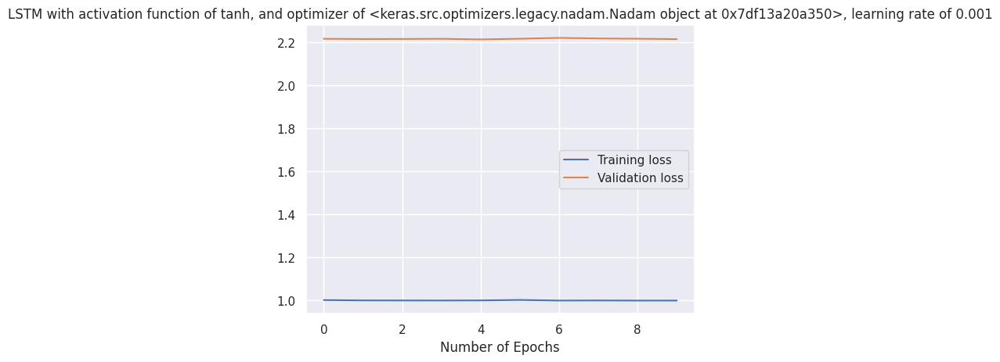

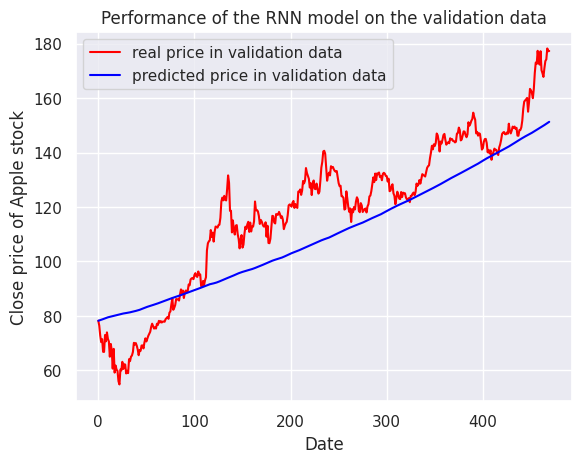

Model: "sequential_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_261 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_262 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_263 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_264 (LSTM)             (None, 50)                20200     
                                                                 
 dense_72 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 8s 32ms/step - loss: 1.0161 - val_loss: 2.2149
Epoch 2/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0079 - val_loss: 2.2194
Epoch 3/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0055 - val_loss: 2.2146
Epoch 4/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0120 - val_loss: 2.2144
Epoch 5/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0037 - val_loss: 2.2213
Epoch 6/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0037 - val_loss: 2.2220
Epoch 7/100
83/83 [==============================] - 1s 13ms/step - loss: 1.0078 - val_loss: 2.2214
Epoch 8/100
83/83 [==============================] - 1s 13ms/step - loss: 1.0042 - val_loss: 2.2273
Epoch 9/100
15/15 [==============================] - 1s 5ms/step


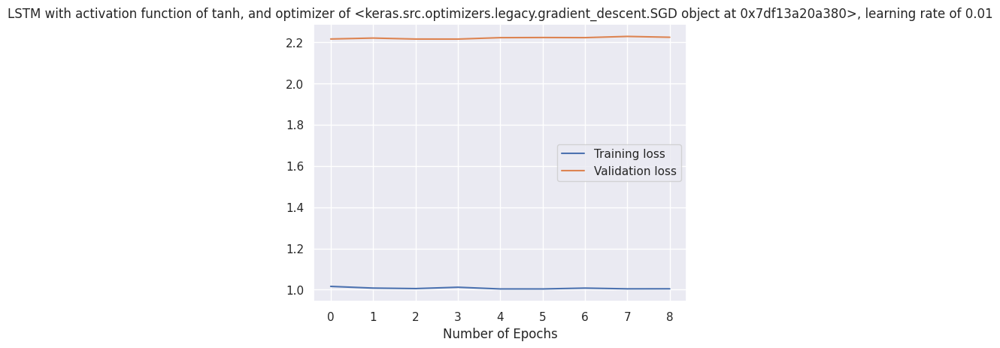

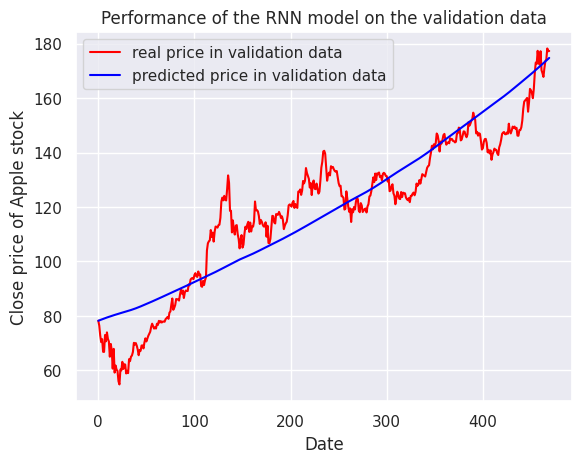

Model: "sequential_73"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_265 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_266 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_267 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_268 (LSTM)             (None, 50)                20200     
                                                                 
 dense_73 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 8s 28ms/step - loss: 1.0088 - val_loss: 2.2182
Epoch 2/100
83/83 [==============================] - 1s 13ms/step - loss: 1.0022 - val_loss: 2.2153
Epoch 3/100
83/83 [==============================] - 1s 12ms/step - loss: 1.0011 - val_loss: 2.2166
Epoch 4/100
83/83 [==============================] - 1s 13ms/step - loss: 1.0020 - val_loss: 2.2172
Epoch 5/100
83/83 [==============================] - 1s 15ms/step - loss: 1.0047 - val_loss: 2.2162
Epoch 6/100
83/83 [==============================] - 1s 17ms/step - loss: 1.0009 - val_loss: 2.2163
Epoch 7/100
15/15 [==============================] - 1s 6ms/step


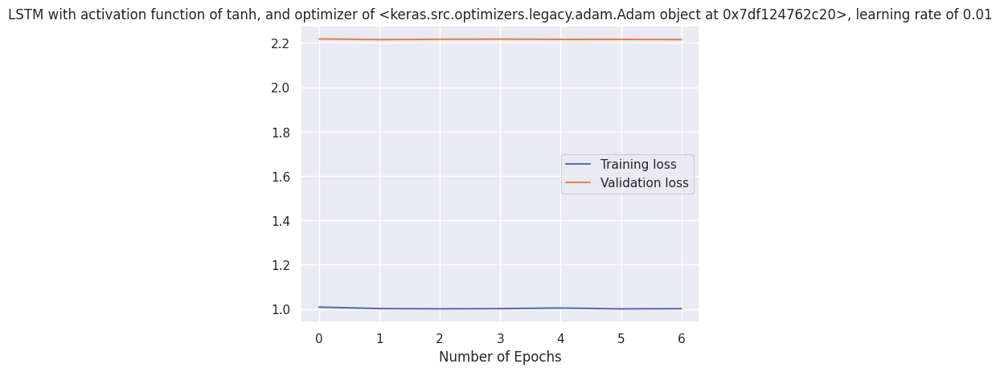

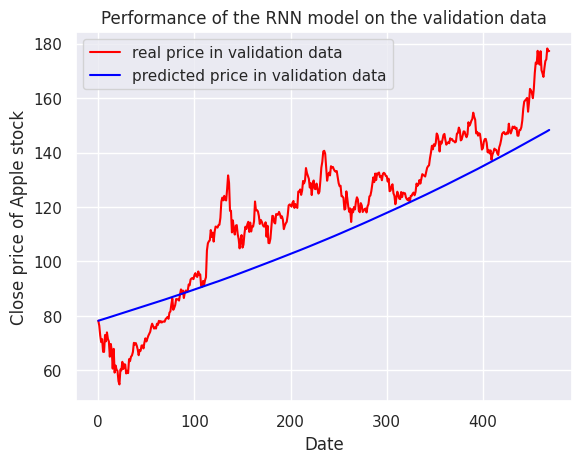

Model: "sequential_74"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_269 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_270 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_271 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_272 (LSTM)             (None, 50)                20200     
                                                                 
 dense_74 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 9s 37ms/step - loss: 1.0082 - val_loss: 2.2162
Epoch 2/100
83/83 [==============================] - 1s 15ms/step - loss: 1.0018 - val_loss: 2.2186
Epoch 3/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0014 - val_loss: 2.2147
Epoch 4/100
83/83 [==============================] - 1s 15ms/step - loss: 1.0010 - val_loss: 2.2171
Epoch 5/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0015 - val_loss: 2.2186
Epoch 6/100
83/83 [==============================] - 1s 14ms/step - loss: 1.0011 - val_loss: 2.2224
Epoch 7/100
83/83 [==============================] - 1s 15ms/step - loss: 1.0013 - val_loss: 2.2179
Epoch 8/100
15/15 [==============================] - 1s 6ms/step


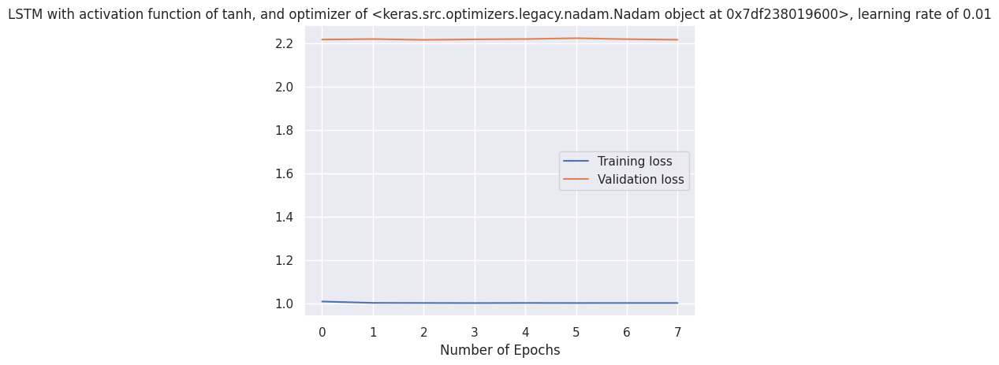

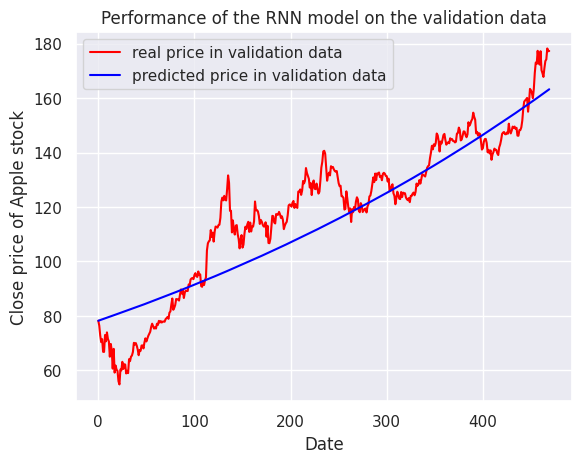

Model: "sequential_75"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_273 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_274 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_275 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_276 (LSTM)             (None, 50)                20200     
                                                                 
 dense_75 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 21s 207ms/step - loss: 1.0013 - val_loss: 2.2177
Epoch 2/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0003 - val_loss: 2.2169
Epoch 3/100
83/83 [==============================] - 17s 205ms/step - loss: 1.0005 - val_loss: 2.2161
Epoch 4/100
83/83 [==============================] - 17s 201ms/step - loss: 1.0003 - val_loss: 2.2168
Epoch 5/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0003 - val_loss: 2.2169
Epoch 6/100
83/83 [==============================] - 17s 206ms/step - loss: 1.0003 - val_loss: 2.2165
Epoch 7/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0003 - val_loss: 2.2165
Epoch 8/100
15/15 [==============================] - 1s 21ms/step


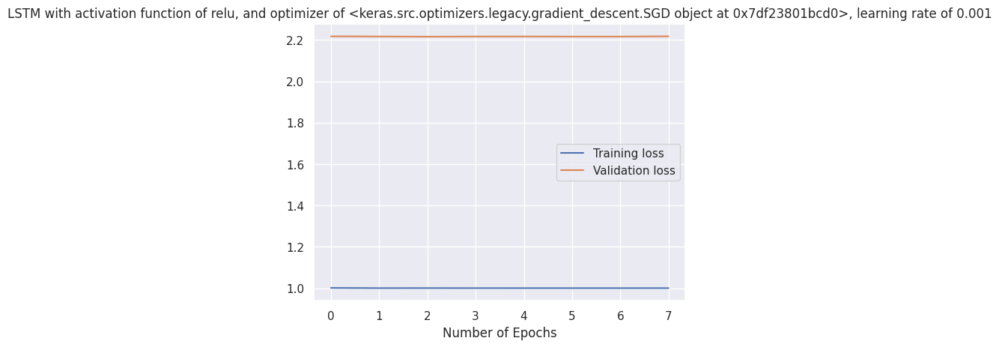

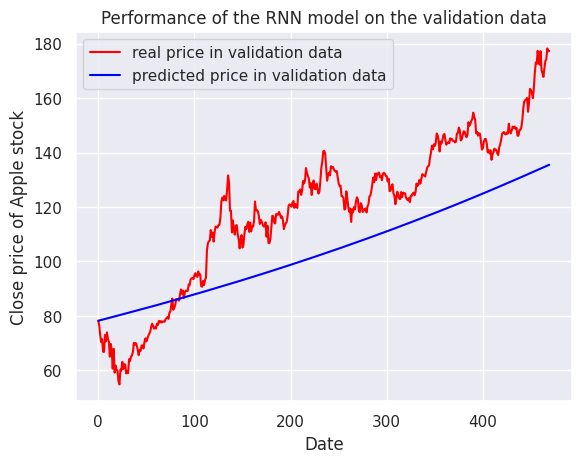

Model: "sequential_76"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_277 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_278 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_279 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_280 (LSTM)             (None, 50)                20200     
                                                                 
 dense_76 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 22s 208ms/step - loss: 1.0010 - val_loss: 2.2174
Epoch 2/100
83/83 [==============================] - 18s 218ms/step - loss: 1.0006 - val_loss: 2.2173
Epoch 3/100
83/83 [==============================] - 17s 205ms/step - loss: 1.0003 - val_loss: 2.2170
Epoch 4/100
83/83 [==============================] - 17s 200ms/step - loss: 1.0004 - val_loss: 2.2169
Epoch 5/100
83/83 [==============================] - 18s 214ms/step - loss: 1.0001 - val_loss: 2.2168
Epoch 6/100
83/83 [==============================] - 17s 199ms/step - loss: 1.0002 - val_loss: 2.2173
Epoch 7/100
83/83 [==============================] - 17s 204ms/step - loss: 1.0003 - val_loss: 2.2166
Epoch 8/100
83/83 [==============================] - 18s 218ms/step - loss: 1.0003 - val_loss: 2.2178
Epoch 9/100
83/83 [==============================] - 17s 204ms/step - loss: 1.0002 - val_loss: 2.2196
Epoch 10/100
83/83 [==============================] - 18s 216ms/step - loss: 1.000

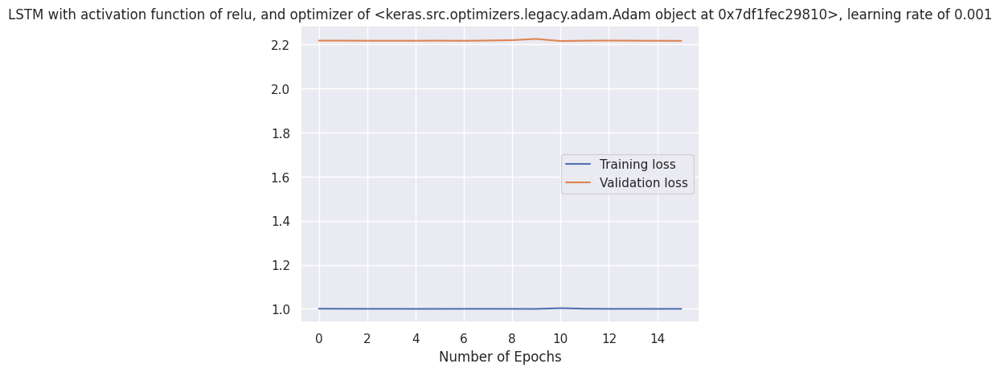

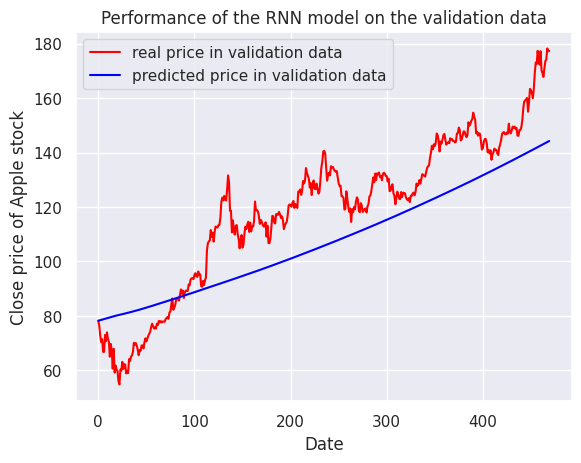

Model: "sequential_77"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_281 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_282 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_283 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_284 (LSTM)             (None, 50)                20200     
                                                                 
 dense_77 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 24s 228ms/step - loss: 1.0012 - val_loss: 2.2173
Epoch 2/100
83/83 [==============================] - 18s 220ms/step - loss: 1.0003 - val_loss: 2.2169
Epoch 3/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0003 - val_loss: 2.2171
Epoch 4/100
83/83 [==============================] - 17s 210ms/step - loss: 1.0011 - val_loss: 2.2179
Epoch 5/100
83/83 [==============================] - 19s 226ms/step - loss: 1.0003 - val_loss: 2.2174
Epoch 6/100
83/83 [==============================] - 17s 207ms/step - loss: 1.0002 - val_loss: 2.2161
Epoch 7/100
83/83 [==============================] - 18s 221ms/step - loss: 1.0005 - val_loss: 2.2165
Epoch 8/100
83/83 [==============================] - 17s 209ms/step - loss: 1.0004 - val_loss: 2.2177
Epoch 9/100
83/83 [==============================] - 18s 213ms/step - loss: 1.0003 - val_loss: 2.2181
Epoch 10/100
83/83 [==============================] - 18s 217ms/step - loss: 1.000

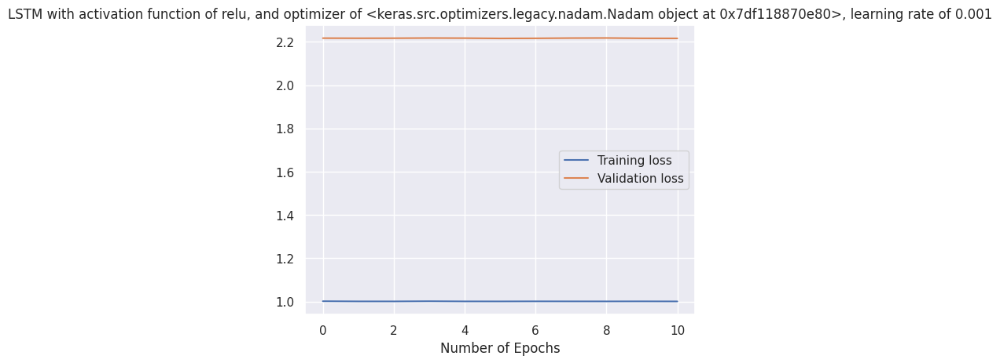

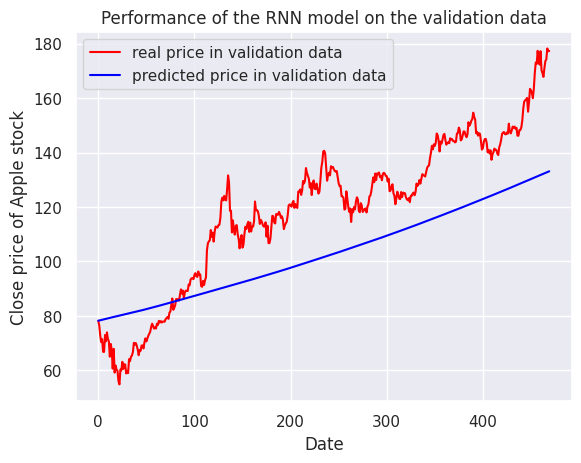

Model: "sequential_78"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_285 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_286 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_287 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_288 (LSTM)             (None, 50)                20200     
                                                                 
 dense_78 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 22s 224ms/step - loss: 1.0042 - val_loss: 2.2277
Epoch 2/100
83/83 [==============================] - 17s 207ms/step - loss: 1.0027 - val_loss: 2.2177
Epoch 3/100
83/83 [==============================] - 17s 209ms/step - loss: 1.0040 - val_loss: 2.2151
Epoch 4/100
83/83 [==============================] - 18s 220ms/step - loss: 1.0058 - val_loss: 2.2159
Epoch 5/100
83/83 [==============================] - 17s 208ms/step - loss: 1.0036 - val_loss: 2.2213
Epoch 6/100
83/83 [==============================] - 19s 225ms/step - loss: 1.0031 - val_loss: 2.2229
Epoch 7/100
83/83 [==============================] - 17s 209ms/step - loss: 1.0035 - val_loss: 2.2170
Epoch 8/100
15/15 [==============================] - 1s 21ms/step


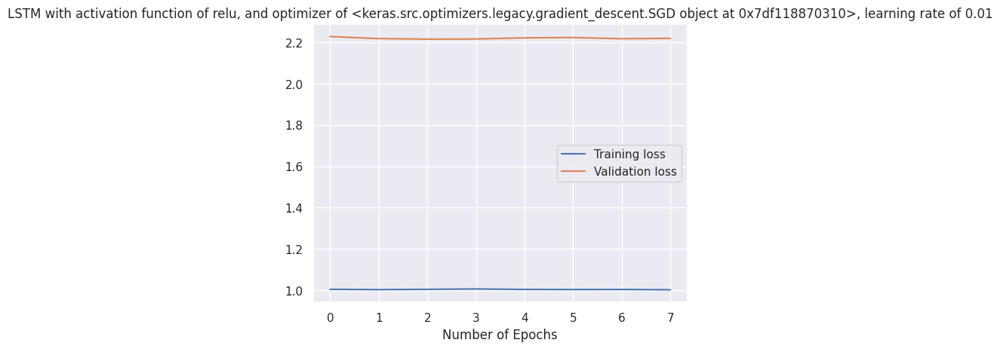

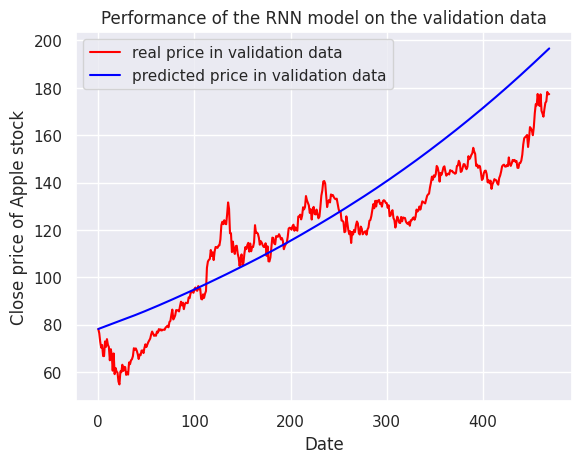

Model: "sequential_79"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_289 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_290 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_291 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_292 (LSTM)             (None, 50)                20200     
                                                                 
 dense_79 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 23s 233ms/step - loss: 1.0041 - val_loss: 2.2154
Epoch 2/100
83/83 [==============================] - 17s 210ms/step - loss: 1.0013 - val_loss: 2.2186
Epoch 3/100
83/83 [==============================] - 18s 223ms/step - loss: 1.0008 - val_loss: 2.2148
Epoch 4/100
83/83 [==============================] - 17s 205ms/step - loss: 1.0003 - val_loss: 2.2212
Epoch 5/100
83/83 [==============================] - 18s 214ms/step - loss: 1.0015 - val_loss: 2.2164
Epoch 6/100
83/83 [==============================] - 17s 209ms/step - loss: 1.0012 - val_loss: 2.2154
Epoch 7/100
83/83 [==============================] - 17s 209ms/step - loss: 1.0010 - val_loss: 2.2171
Epoch 8/100
15/15 [==============================] - 1s 22ms/step


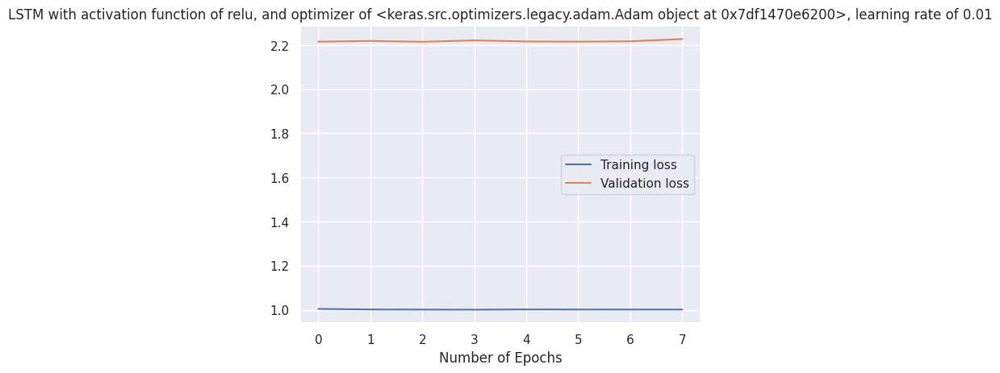

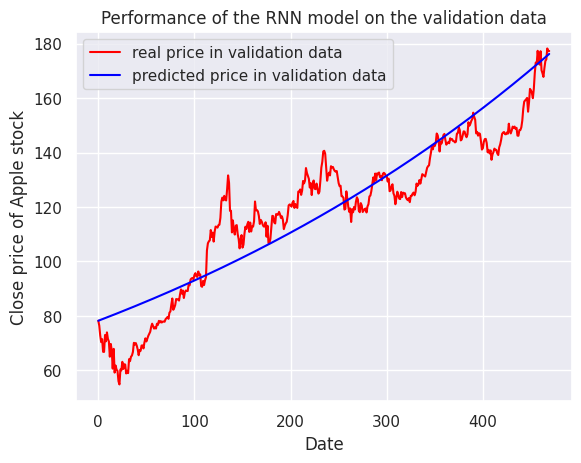

Model: "sequential_80"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_293 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_294 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_295 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_296 (LSTM)             (None, 50)                20200     
                                                                 
 dense_80 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 24s 231ms/step - loss: 27182.4590 - val_loss: 2.2148
Epoch 2/100
83/83 [==============================] - 17s 210ms/step - loss: 1.0022 - val_loss: 2.2149
Epoch 3/100
83/83 [==============================] - 19s 225ms/step - loss: 1.0017 - val_loss: 2.2160
Epoch 4/100
83/83 [==============================] - 18s 214ms/step - loss: 1.0011 - val_loss: 2.2187
Epoch 5/100
83/83 [==============================] - 19s 231ms/step - loss: 1.0013 - val_loss: 2.2178
Epoch 6/100
15/15 [==============================] - 1s 21ms/step


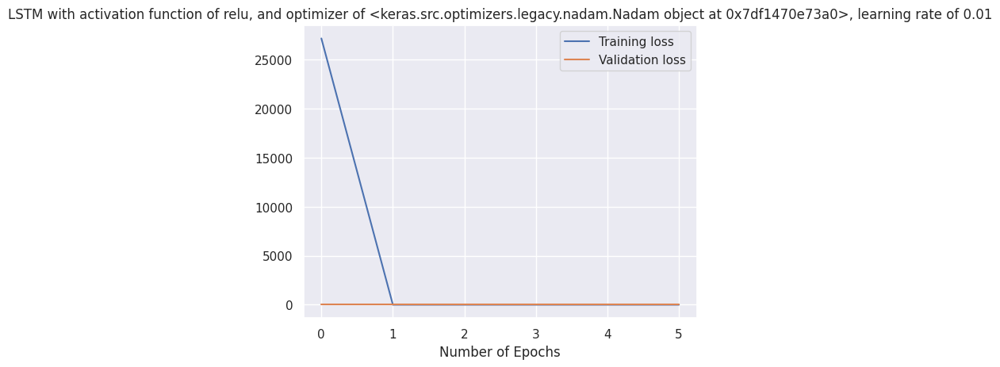

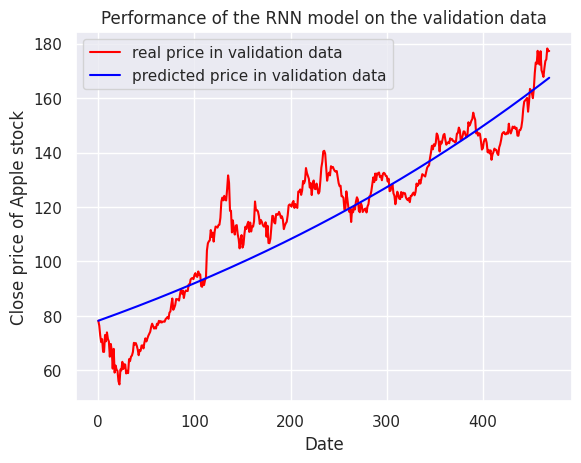

Model: "sequential_81"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_297 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_298 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_299 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_300 (LSTM)             (None, 50)                20200     
                                                                 
 dense_81 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 23s 231ms/step - loss: 1.0004 - val_loss: 2.2173
Epoch 2/100
83/83 [==============================] - 18s 211ms/step - loss: 1.0008 - val_loss: 2.2158
Epoch 3/100
83/83 [==============================] - 19s 226ms/step - loss: 1.0009 - val_loss: 2.2155
Epoch 4/100
83/83 [==============================] - 17s 210ms/step - loss: 1.0007 - val_loss: 2.2175
Epoch 5/100
83/83 [==============================] - 19s 224ms/step - loss: 1.0002 - val_loss: 2.2183
Epoch 6/100
83/83 [==============================] - 17s 210ms/step - loss: 1.0005 - val_loss: 2.2174
Epoch 7/100
83/83 [==============================] - 18s 220ms/step - loss: 1.0005 - val_loss: 2.2162
Epoch 8/100
83/83 [==============================] - 18s 211ms/step - loss: 1.0006 - val_loss: 2.2154
Epoch 9/100
83/83 [==============================] - 17s 207ms/step - loss: 1.0005 - val_loss: 2.2153
Epoch 10/100
83/83 [==============================] - 19s 228ms/step - loss: 1.000

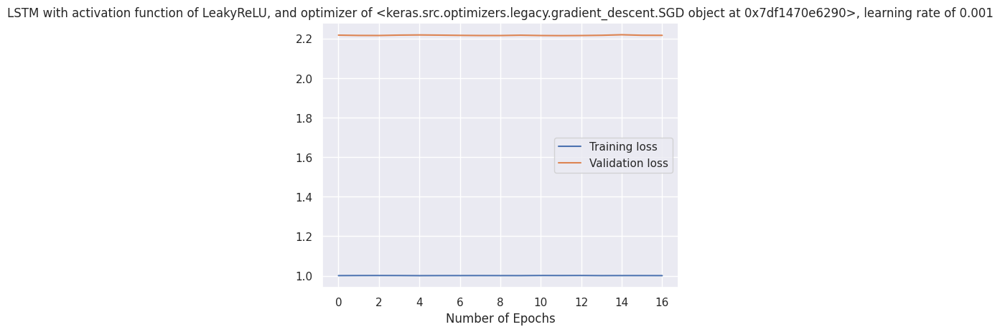

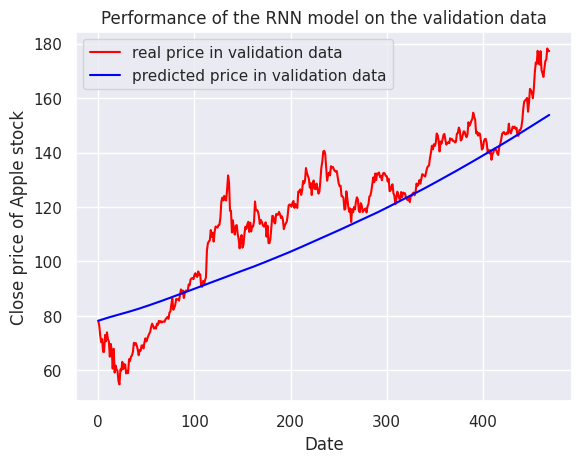

Model: "sequential_82"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_301 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_302 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_303 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_304 (LSTM)             (None, 50)                20200     
                                                                 
 dense_82 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 23s 219ms/step - loss: 1.0011 - val_loss: 2.2152
Epoch 2/100
83/83 [==============================] - 18s 222ms/step - loss: 1.0004 - val_loss: 2.2167
Epoch 3/100
83/83 [==============================] - 18s 213ms/step - loss: 1.0001 - val_loss: 2.2169
Epoch 4/100
83/83 [==============================] - 20s 241ms/step - loss: 1.0001 - val_loss: 2.2167
Epoch 5/100
83/83 [==============================] - 19s 226ms/step - loss: 1.0002 - val_loss: 2.2173
Epoch 6/100
15/15 [==============================] - 1s 23ms/step


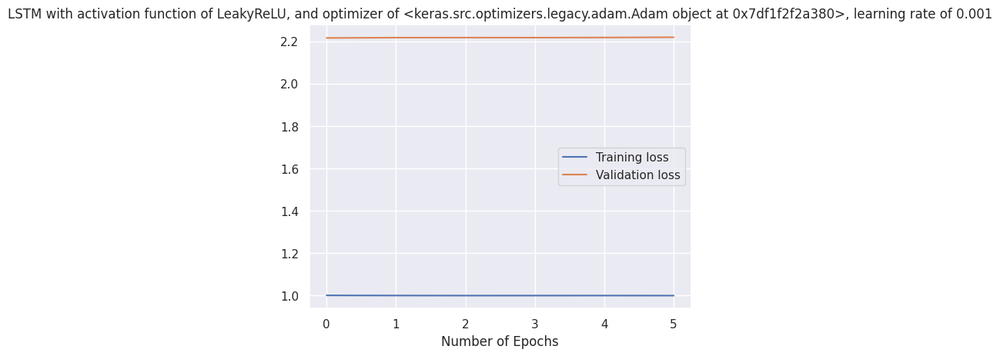

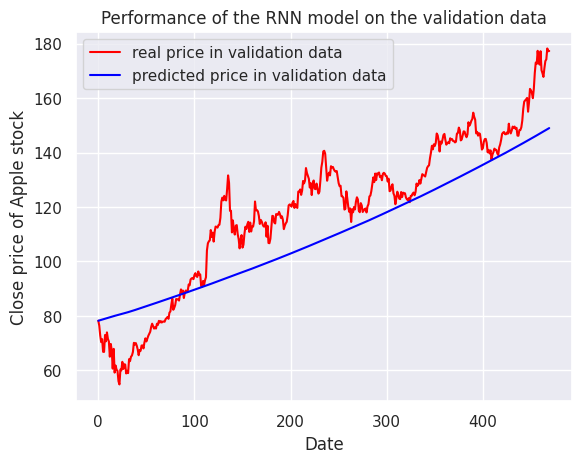

Model: "sequential_83"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_305 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_306 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_307 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_308 (LSTM)             (None, 50)                20200     
                                                                 
 dense_83 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 25s 252ms/step - loss: 1.0002 - val_loss: 2.2155
Epoch 2/100
83/83 [==============================] - 20s 237ms/step - loss: 1.0009 - val_loss: 2.2167
Epoch 3/100
83/83 [==============================] - 22s 266ms/step - loss: 1.0004 - val_loss: 2.2164
Epoch 4/100
83/83 [==============================] - 20s 247ms/step - loss: 1.0002 - val_loss: 2.2164
Epoch 5/100
83/83 [==============================] - 18s 213ms/step - loss: 1.0002 - val_loss: 2.2168
Epoch 6/100
15/15 [==============================] - 1s 26ms/step


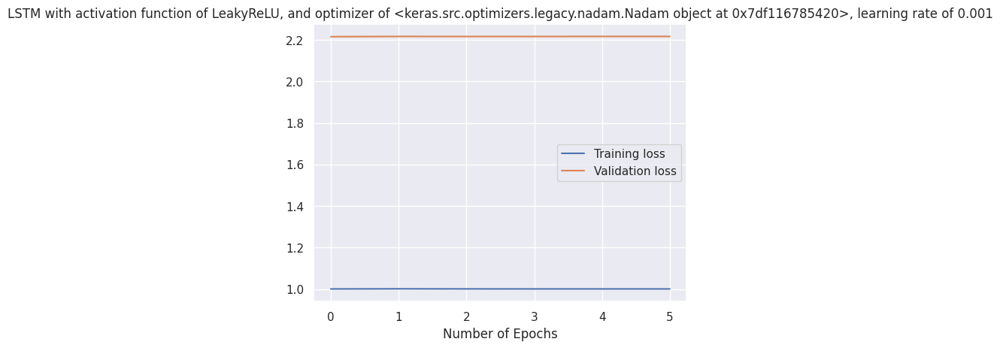

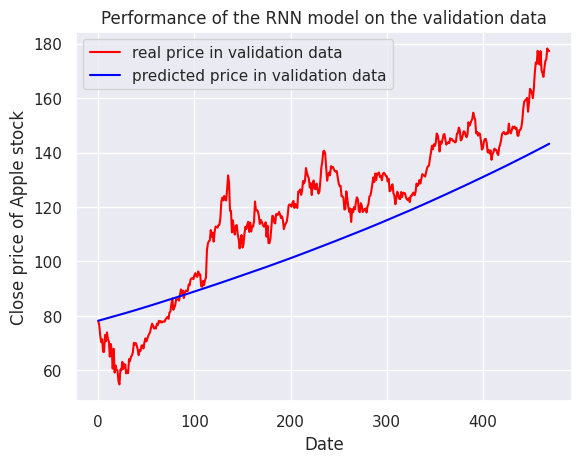

Model: "sequential_84"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_309 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_310 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_311 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_312 (LSTM)             (None, 50)                20200     
                                                                 
 dense_84 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 25s 250ms/step - loss: 1.0008 - val_loss: 2.2151
Epoch 2/100
83/83 [==============================] - 18s 220ms/step - loss: 1.0049 - val_loss: 2.2149
Epoch 3/100
83/83 [==============================] - 20s 237ms/step - loss: 1.0027 - val_loss: 2.2153
Epoch 4/100
83/83 [==============================] - 18s 220ms/step - loss: 1.0041 - val_loss: 2.2156
Epoch 5/100
83/83 [==============================] - 20s 237ms/step - loss: 1.0030 - val_loss: 2.2211
Epoch 6/100
83/83 [==============================] - 18s 220ms/step - loss: 1.0040 - val_loss: 2.2176
Epoch 7/100
15/15 [==============================] - 1s 32ms/step


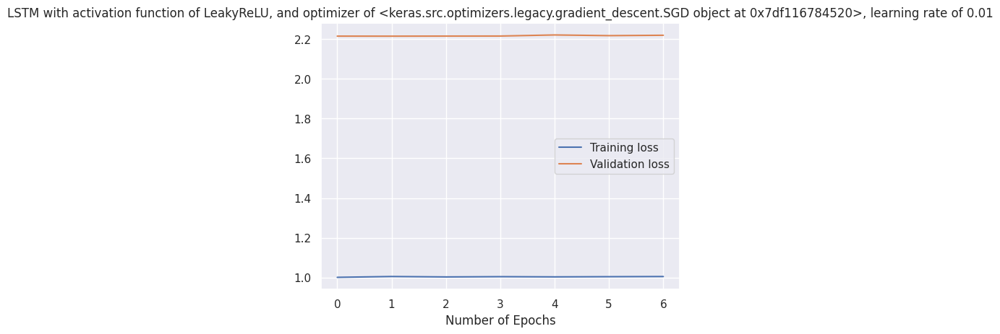

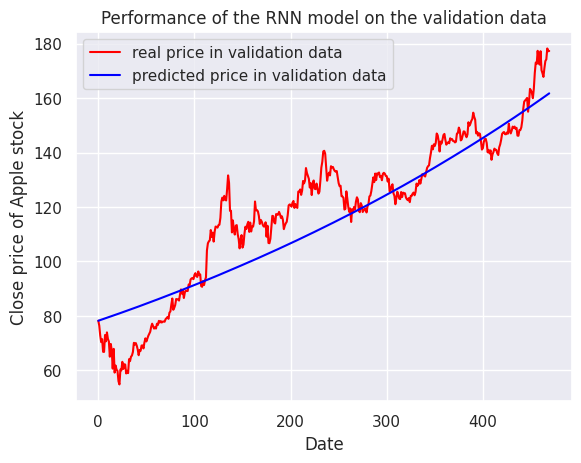

Model: "sequential_85"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_313 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_314 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_315 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_316 (LSTM)             (None, 50)                20200     
                                                                 
 dense_85 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 23s 229ms/step - loss: 1.0023 - val_loss: 2.2160
Epoch 2/100
83/83 [==============================] - 20s 238ms/step - loss: 1.0015 - val_loss: 2.2178
Epoch 3/100
83/83 [==============================] - 19s 225ms/step - loss: 1.0028 - val_loss: 2.2175
Epoch 4/100
83/83 [==============================] - 20s 236ms/step - loss: 1.0010 - val_loss: 2.2182
Epoch 5/100
83/83 [==============================] - 17s 210ms/step - loss: 1.0008 - val_loss: 2.2218
Epoch 6/100
83/83 [==============================] - 20s 240ms/step - loss: 1.0007 - val_loss: 2.2151
Epoch 7/100
83/83 [==============================] - 18s 214ms/step - loss: 1.0008 - val_loss: 2.2172
Epoch 8/100
83/83 [==============================] - 19s 235ms/step - loss: 1.0003 - val_loss: 2.2411
Epoch 9/100
83/83 [==============================] - 17s 210ms/step - loss: 23785.6172 - val_loss: 2.2166
Epoch 10/100
83/83 [==============================] - 19s 229ms/step - loss: 1

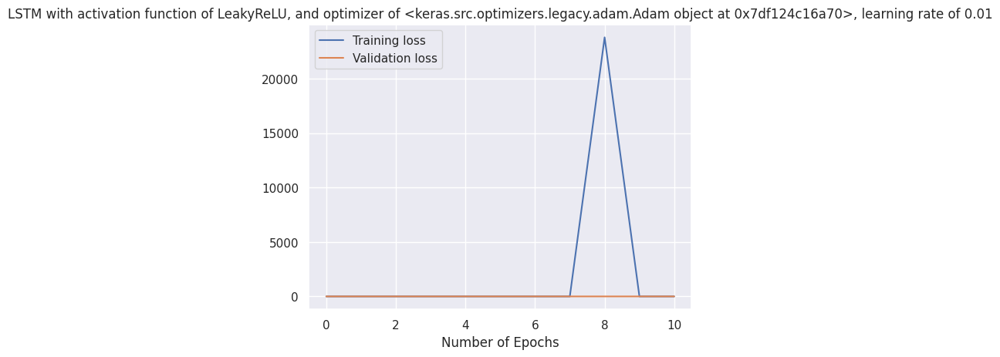

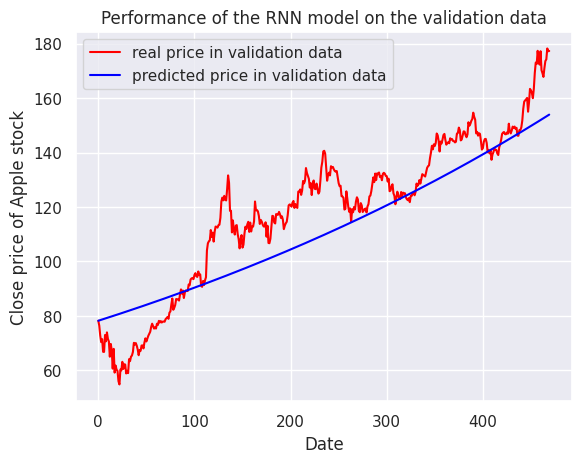

Model: "sequential_86"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_317 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_318 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_319 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_320 (LSTM)             (None, 50)                20200     
                                                                 
 dense_86 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 24s 224ms/step - loss: 1.1071 - val_loss: 2.2151
Epoch 2/100
83/83 [==============================] - 19s 226ms/step - loss: 1.0012 - val_loss: 2.2186
Epoch 3/100
83/83 [==============================] - 18s 215ms/step - loss: 100.1241 - val_loss: 2.2205
Epoch 4/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0016 - val_loss: 2.2167
Epoch 5/100
83/83 [==============================] - 19s 228ms/step - loss: 1.0023 - val_loss: 2.2172
Epoch 6/100
15/15 [==============================] - 1s 23ms/step


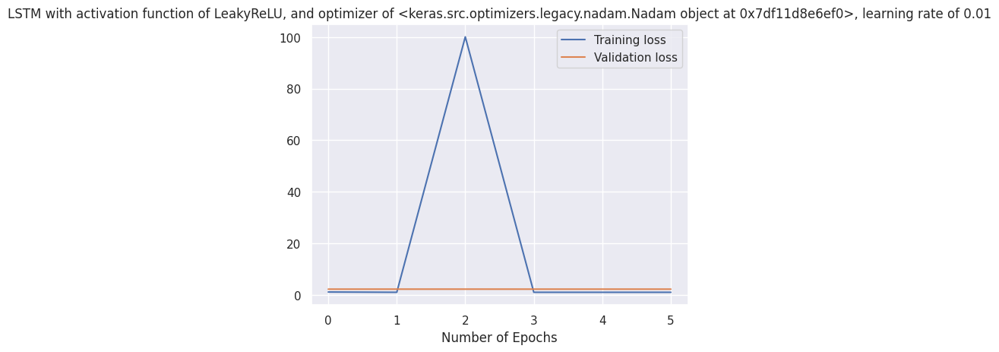

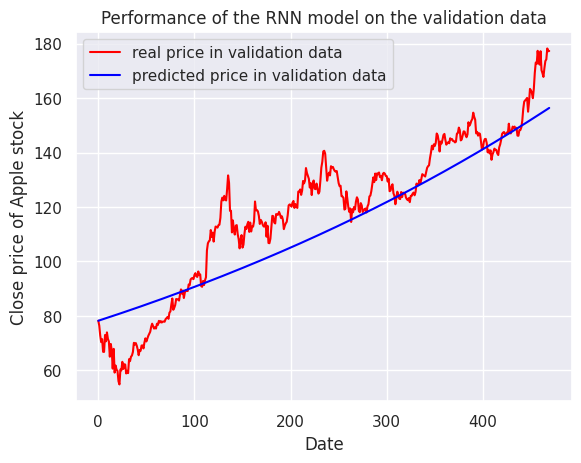

Model: "sequential_87"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_321 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_322 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_323 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_324 (LSTM)             (None, 50)                20200     
                                                                 
 dense_87 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 23s 224ms/step - loss: 1.0014 - val_loss: 2.2156
Epoch 2/100
83/83 [==============================] - 19s 232ms/step - loss: 1.0008 - val_loss: 2.2162
Epoch 3/100
83/83 [==============================] - 18s 218ms/step - loss: 1.0038 - val_loss: 2.2239
Epoch 4/100
83/83 [==============================] - 19s 228ms/step - loss: 1.0012 - val_loss: 2.2161
Epoch 5/100
83/83 [==============================] - 18s 218ms/step - loss: 1.0007 - val_loss: 2.2149
Epoch 6/100
83/83 [==============================] - 19s 225ms/step - loss: 1.0006 - val_loss: 2.2190
Epoch 7/100
83/83 [==============================] - 18s 212ms/step - loss: 1.0018 - val_loss: 2.2149
Epoch 8/100
83/83 [==============================] - 18s 215ms/step - loss: 1.0005 - val_loss: 2.2147
Epoch 9/100
83/83 [==============================] - 19s 224ms/step - loss: 1.0012 - val_loss: 2.2169
Epoch 10/100
83/83 [==============================] - 18s 220ms/step - loss: 1.000

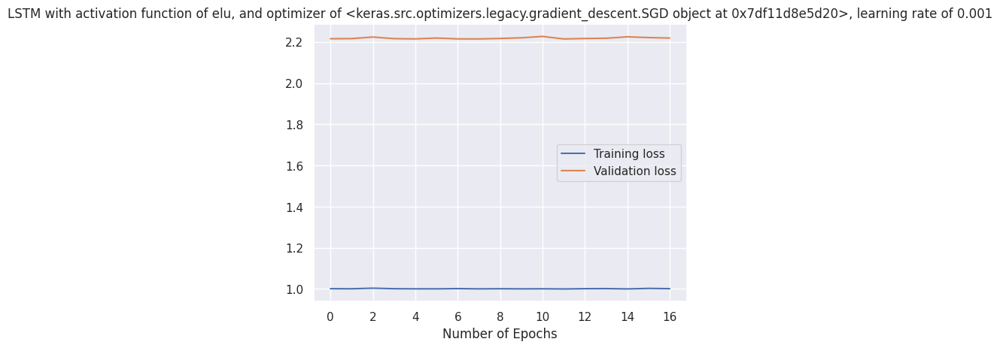

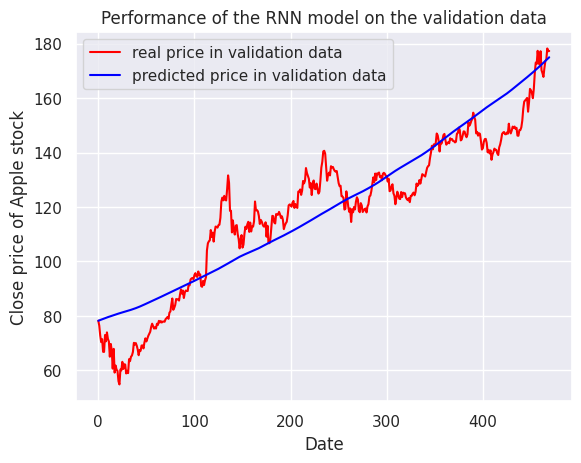

Model: "sequential_88"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_325 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_326 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_327 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_328 (LSTM)             (None, 50)                20200     
                                                                 
 dense_88 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 23s 226ms/step - loss: 1.0030 - val_loss: 2.2171
Epoch 2/100
83/83 [==============================] - 19s 235ms/step - loss: 1.0013 - val_loss: 2.2159
Epoch 3/100
83/83 [==============================] - 18s 215ms/step - loss: 1.0004 - val_loss: 2.2168
Epoch 4/100
83/83 [==============================] - 19s 229ms/step - loss: 1.0008 - val_loss: 2.2151
Epoch 5/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0010 - val_loss: 2.2164
Epoch 6/100
83/83 [==============================] - 19s 231ms/step - loss: 1.0009 - val_loss: 2.2172
Epoch 7/100
83/83 [==============================] - 18s 218ms/step - loss: 1.0006 - val_loss: 2.2150
Epoch 8/100
83/83 [==============================] - 19s 230ms/step - loss: 1.0008 - val_loss: 2.2174
Epoch 9/100
83/83 [==============================] - 18s 218ms/step - loss: 1.0006 - val_loss: 2.2167
Epoch 10/100
83/83 [==============================] - 19s 229ms/step - loss: 1.000

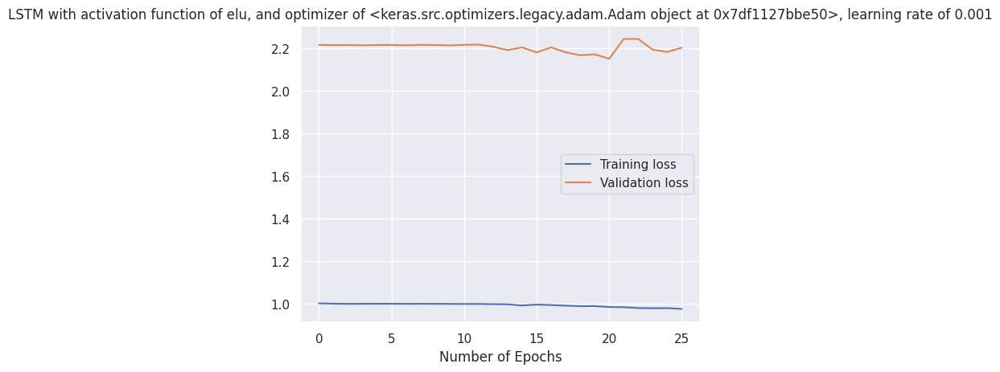

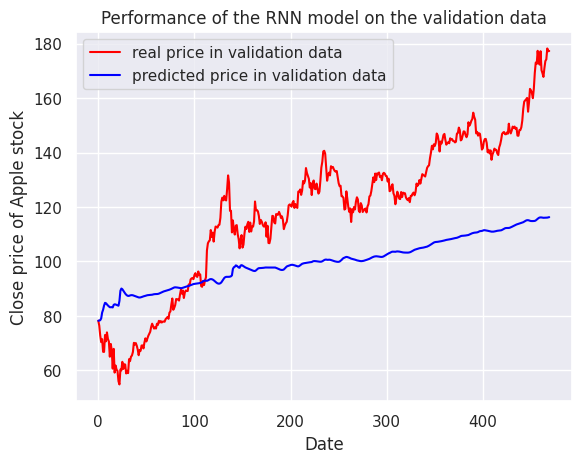

Model: "sequential_89"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_329 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_330 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_331 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_332 (LSTM)             (None, 50)                20200     
                                                                 
 dense_89 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 25s 237ms/step - loss: 1.0019 - val_loss: 2.2163
Epoch 2/100
83/83 [==============================] - 18s 222ms/step - loss: 1.0008 - val_loss: 2.2152
Epoch 3/100
83/83 [==============================] - 19s 226ms/step - loss: 1.0009 - val_loss: 2.2162
Epoch 4/100
83/83 [==============================] - 19s 224ms/step - loss: 1.0008 - val_loss: 2.2185
Epoch 5/100
83/83 [==============================] - 19s 229ms/step - loss: 1.0010 - val_loss: 2.2165
Epoch 6/100
83/83 [==============================] - 18s 221ms/step - loss: 1.0002 - val_loss: 2.2160
Epoch 7/100
15/15 [==============================] - 1s 25ms/step


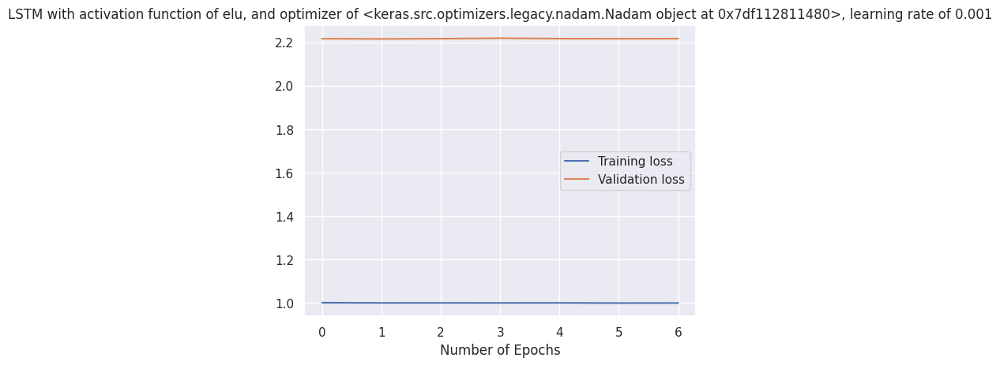

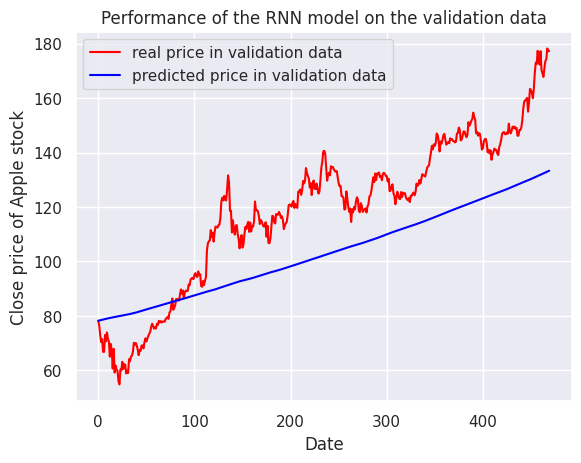

Model: "sequential_90"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_333 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_334 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_335 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_336 (LSTM)             (None, 50)                20200     
                                                                 
 dense_90 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 24s 239ms/step - loss: 1.0170 - val_loss: 2.2157
Epoch 2/100
83/83 [==============================] - 18s 215ms/step - loss: 1.0052 - val_loss: 2.2197
Epoch 3/100
83/83 [==============================] - 19s 231ms/step - loss: 1.0043 - val_loss: 2.2759
Epoch 4/100
83/83 [==============================] - 18s 222ms/step - loss: 1.0084 - val_loss: 2.2467
Epoch 5/100
83/83 [==============================] - 19s 234ms/step - loss: 1.0067 - val_loss: 2.2208
Epoch 6/100
15/15 [==============================] - 1s 25ms/step


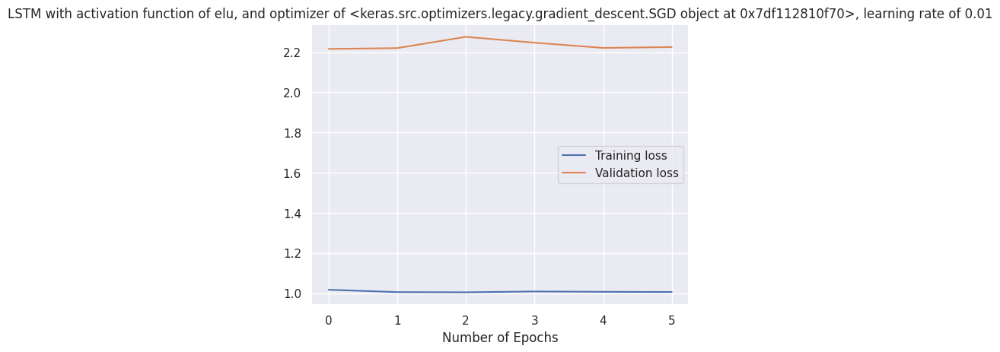

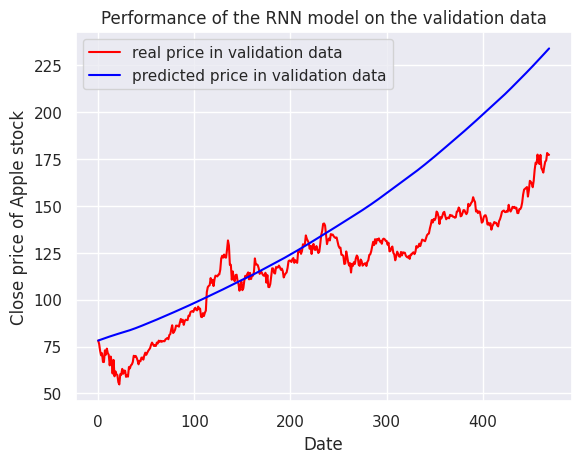

Model: "sequential_91"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_337 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_338 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_339 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_340 (LSTM)             (None, 50)                20200     
                                                                 
 dense_91 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 24s 241ms/step - loss: 1.0112 - val_loss: 2.2193
Epoch 2/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0013 - val_loss: 2.2156
Epoch 3/100
83/83 [==============================] - 19s 235ms/step - loss: 1.0031 - val_loss: 2.2177
Epoch 4/100
83/83 [==============================] - 18s 221ms/step - loss: 1.0017 - val_loss: 2.2155
Epoch 5/100
83/83 [==============================] - 19s 233ms/step - loss: 0.9999 - val_loss: 2.2195
Epoch 6/100
83/83 [==============================] - 19s 224ms/step - loss: 1.0012 - val_loss: 2.2152
Epoch 7/100
83/83 [==============================] - 20s 237ms/step - loss: 1.0005 - val_loss: 2.2173
Epoch 8/100
83/83 [==============================] - 18s 222ms/step - loss: 1.0016 - val_loss: 2.2163
Epoch 9/100
83/83 [==============================] - 19s 231ms/step - loss: 1.0015 - val_loss: 2.2149
Epoch 10/100
83/83 [==============================] - 18s 219ms/step - loss: 1.002

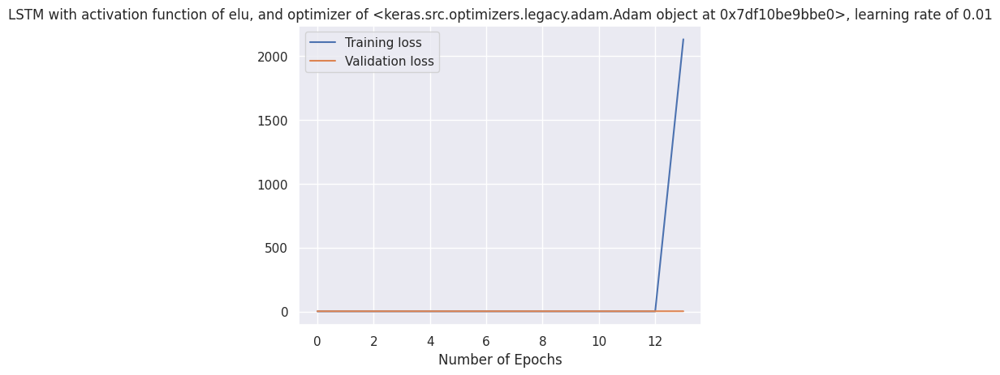

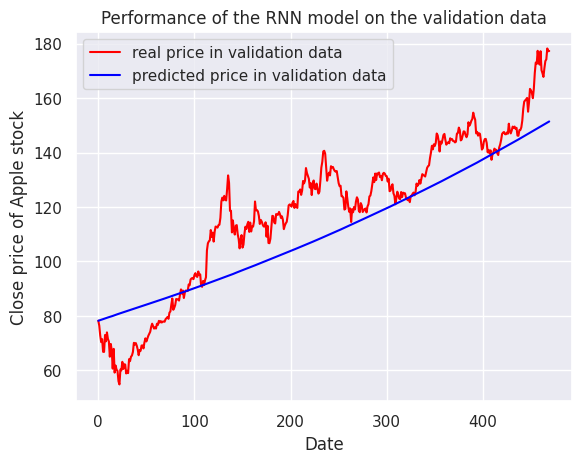

Model: "sequential_92"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_341 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_342 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_343 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_344 (LSTM)             (None, 50)                20200     
                                                                 
 dense_92 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 24s 229ms/step - loss: 1.0079 - val_loss: 2.2221
Epoch 2/100
83/83 [==============================] - 19s 235ms/step - loss: 1.0029 - val_loss: 2.2158
Epoch 3/100
83/83 [==============================] - 18s 221ms/step - loss: 1.0054 - val_loss: 2.2156
Epoch 4/100
83/83 [==============================] - 19s 235ms/step - loss: 1.0015 - val_loss: 2.2157
Epoch 5/100
83/83 [==============================] - 18s 222ms/step - loss: 1.0017 - val_loss: 2.2187
Epoch 6/100
83/83 [==============================] - 19s 234ms/step - loss: 1.0011 - val_loss: 2.2155
Epoch 7/100
83/83 [==============================] - 18s 223ms/step - loss: 1.0013 - val_loss: 2.2174
Epoch 8/100
83/83 [==============================] - 20s 235ms/step - loss: 1.0015 - val_loss: 2.2156
Epoch 9/100
83/83 [==============================] - 18s 220ms/step - loss: 1.0014 - val_loss: 2.2189
Epoch 10/100
83/83 [==============================] - 20s 239ms/step - loss: 1.001

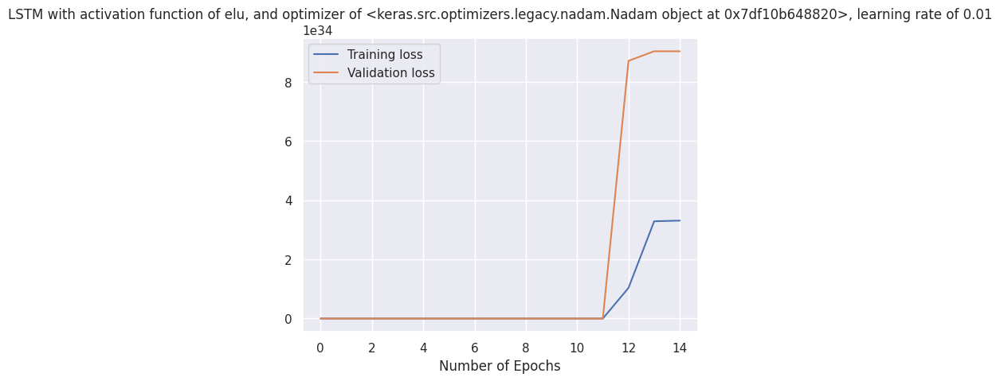

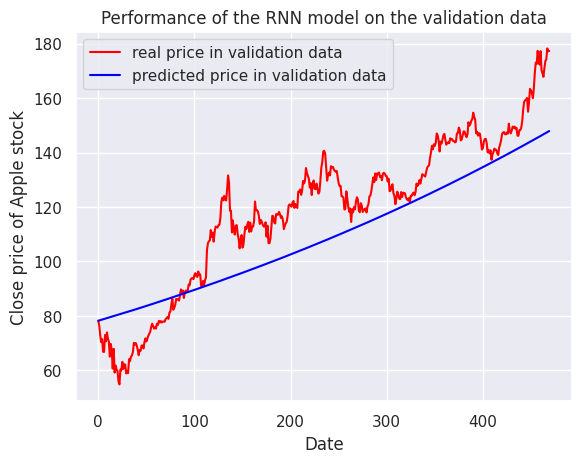

Model: "sequential_93"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_345 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_346 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_347 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_348 (LSTM)             (None, 50)                20200     
                                                                 
 dense_93 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 24s 240ms/step - loss: 1.0405 - val_loss: 2.2398
Epoch 2/100
83/83 [==============================] - 18s 222ms/step - loss: 1.0261 - val_loss: 2.2466
Epoch 3/100
83/83 [==============================] - 19s 235ms/step - loss: 1.0107 - val_loss: 2.2203
Epoch 4/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0214 - val_loss: 2.2289
Epoch 5/100
83/83 [==============================] - 20s 239ms/step - loss: 1.0124 - val_loss: 2.2650
Epoch 6/100
83/83 [==============================] - 18s 219ms/step - loss: 1.0033 - val_loss: 2.2119
Epoch 7/100
83/83 [==============================] - 20s 237ms/step - loss: 1.0123 - val_loss: 2.2357
Epoch 8/100
83/83 [==============================] - 18s 220ms/step - loss: 1.0109 - val_loss: 2.2180
Epoch 9/100
83/83 [==============================] - 19s 235ms/step - loss: 1.0039 - val_loss: 2.2182
Epoch 10/100
83/83 [==============================] - 18s 222ms/step - loss: 1.004

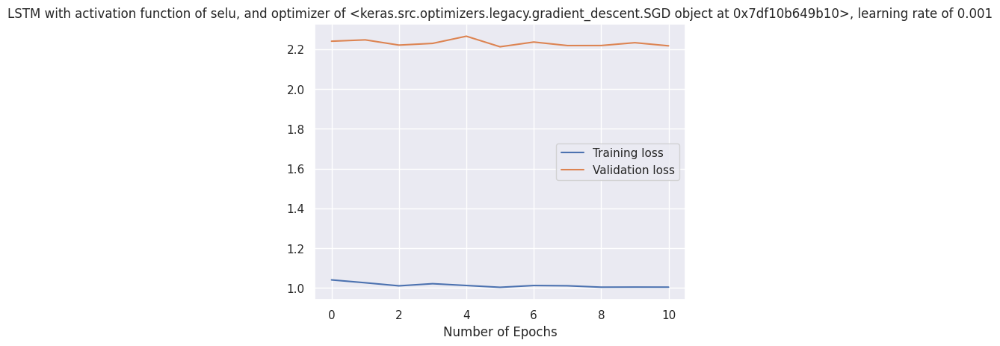

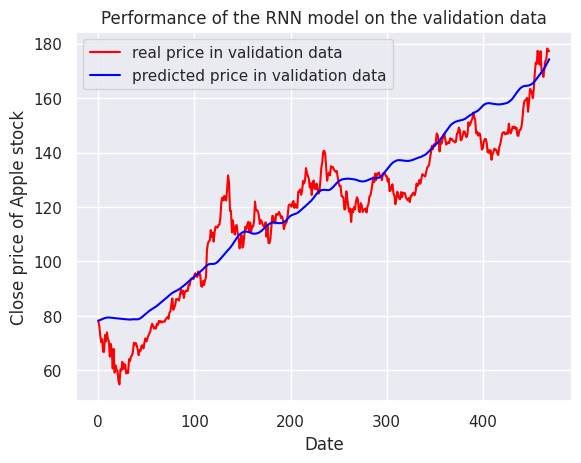

Model: "sequential_94"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_349 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_350 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_351 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_352 (LSTM)             (None, 50)                20200     
                                                                 
 dense_94 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 23s 232ms/step - loss: 1.0362 - val_loss: 2.2154
Epoch 2/100
83/83 [==============================] - 20s 235ms/step - loss: 1.0156 - val_loss: 2.2178
Epoch 3/100
83/83 [==============================] - 18s 219ms/step - loss: 1.0073 - val_loss: 2.2061
Epoch 4/100
83/83 [==============================] - 20s 238ms/step - loss: 1.0053 - val_loss: 2.2190
Epoch 5/100
83/83 [==============================] - 19s 223ms/step - loss: 1.0076 - val_loss: 2.2155
Epoch 6/100
83/83 [==============================] - 20s 236ms/step - loss: 1.0055 - val_loss: 2.2192
Epoch 7/100
83/83 [==============================] - 19s 233ms/step - loss: 1.0003 - val_loss: 2.2238
Epoch 8/100
15/15 [==============================] - 1s 26ms/step


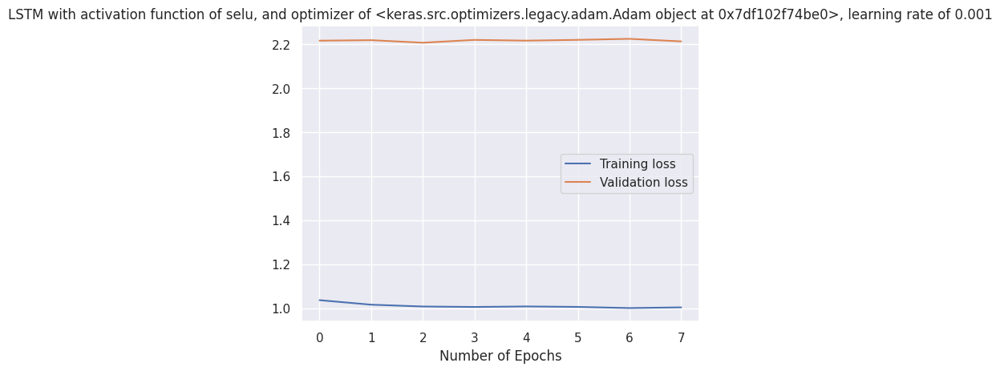

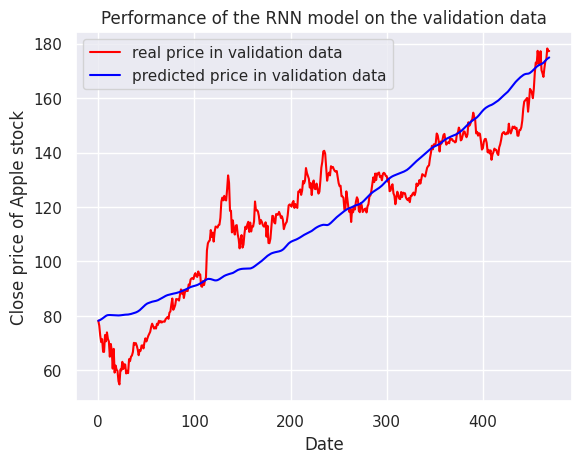

Model: "sequential_95"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_353 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_354 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_355 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_356 (LSTM)             (None, 50)                20200     
                                                                 
 dense_95 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 31s 248ms/step - loss: 1.0309 - val_loss: 2.2282
Epoch 2/100
83/83 [==============================] - 19s 228ms/step - loss: 1.0090 - val_loss: 2.2157
Epoch 3/100
83/83 [==============================] - 20s 244ms/step - loss: 1.0050 - val_loss: 2.2136
Epoch 4/100
83/83 [==============================] - 19s 234ms/step - loss: 1.0062 - val_loss: 2.2205
Epoch 5/100
83/83 [==============================] - 19s 231ms/step - loss: 1.0050 - val_loss: 2.2216
Epoch 6/100
83/83 [==============================] - 20s 246ms/step - loss: 1.0039 - val_loss: 2.2132
Epoch 7/100
83/83 [==============================] - 19s 231ms/step - loss: 1.0006 - val_loss: 2.2211
Epoch 8/100
83/83 [==============================] - 21s 248ms/step - loss: 1.0039 - val_loss: 2.2174
Epoch 9/100
83/83 [==============================] - 19s 228ms/step - loss: 1.0006 - val_loss: 2.2160
Epoch 10/100
83/83 [==============================] - 20s 239ms/step - loss: 0.998

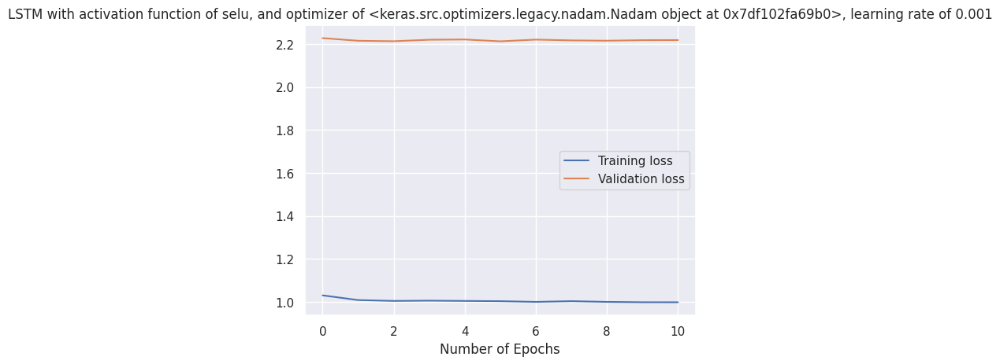

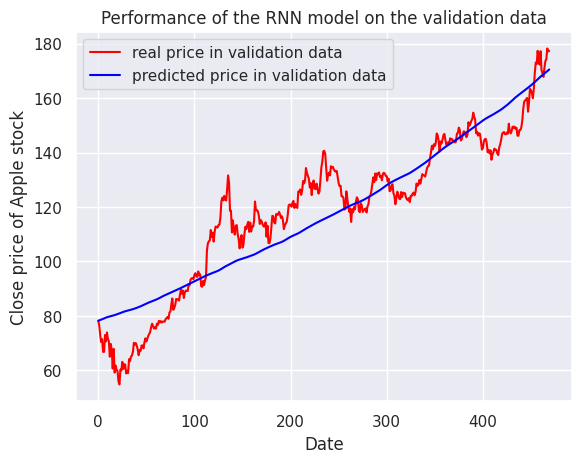

Model: "sequential_96"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_357 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_358 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_359 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_360 (LSTM)             (None, 50)                20200     
                                                                 
 dense_96 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 23s 231ms/step - loss: 1.0765 - val_loss: 2.2200
Epoch 2/100
83/83 [==============================] - 20s 240ms/step - loss: 1.0215 - val_loss: 2.2667
Epoch 3/100
83/83 [==============================] - 19s 226ms/step - loss: 1.0196 - val_loss: 2.2401
Epoch 4/100
83/83 [==============================] - 20s 237ms/step - loss: 1.0089 - val_loss: 2.2253
Epoch 5/100
83/83 [==============================] - 18s 222ms/step - loss: 1.0084 - val_loss: 2.2188
Epoch 6/100
83/83 [==============================] - 20s 233ms/step - loss: 1.0151 - val_loss: 2.2150
Epoch 7/100
83/83 [==============================] - 19s 229ms/step - loss: 1.0097 - val_loss: 2.2148
Epoch 8/100
83/83 [==============================] - 19s 228ms/step - loss: 1.0020 - val_loss: 2.2156
Epoch 9/100
83/83 [==============================] - 20s 236ms/step - loss: 1.0066 - val_loss: 2.2225
Epoch 10/100
83/83 [==============================] - 19s 224ms/step - loss: 1.012

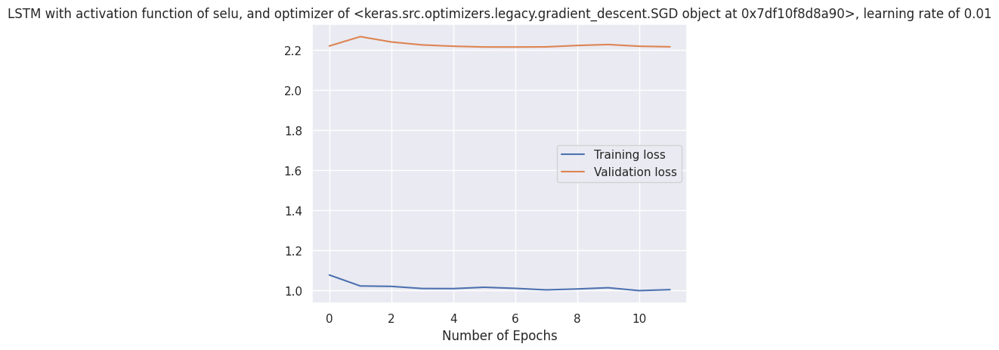

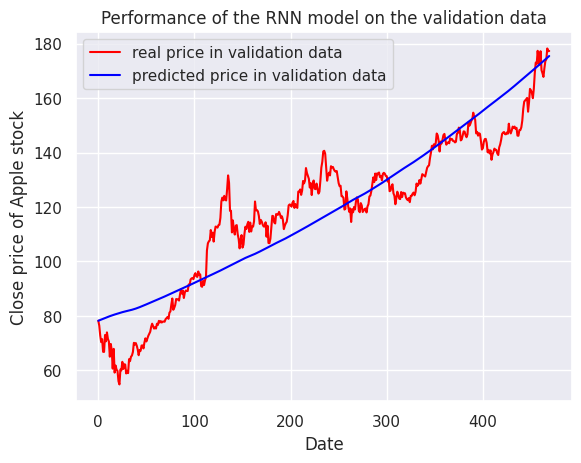

Model: "sequential_97"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_361 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_362 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_363 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_364 (LSTM)             (None, 50)                20200     
                                                                 
 dense_97 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 25s 242ms/step - loss: 1.3155 - val_loss: 2.2424
Epoch 2/100
83/83 [==============================] - 20s 245ms/step - loss: 1.0068 - val_loss: 2.2150
Epoch 3/100
83/83 [==============================] - 19s 230ms/step - loss: 1.0010 - val_loss: 2.2178
Epoch 4/100
83/83 [==============================] - 20s 239ms/step - loss: 1.0043 - val_loss: 2.2206
Epoch 5/100
83/83 [==============================] - 20s 242ms/step - loss: 1.0040 - val_loss: 2.2236
Epoch 6/100
83/83 [==============================] - 20s 236ms/step - loss: 1.0017 - val_loss: 2.2173
Epoch 7/100
15/15 [==============================] - 1s 28ms/step


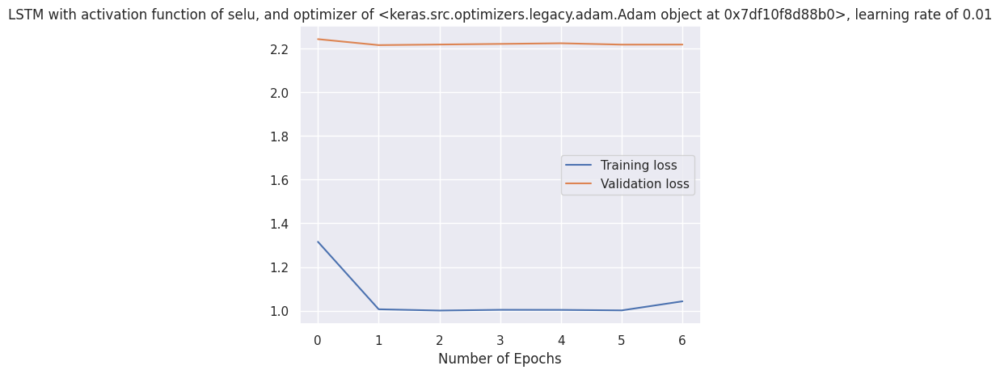

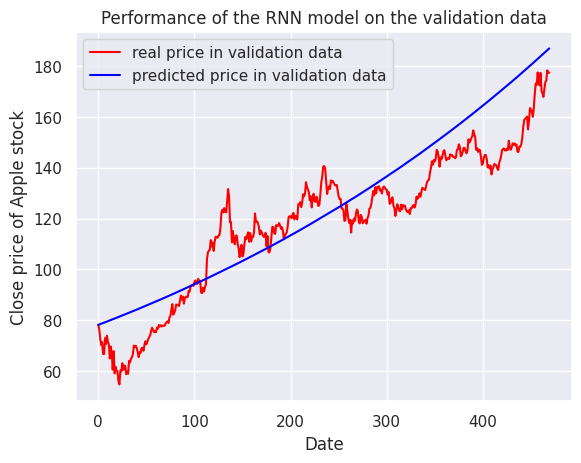

Model: "sequential_98"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_365 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_366 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_367 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_368 (LSTM)             (None, 50)                20200     
                                                                 
 dense_98 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Epoch 1/100
83/83 [==============================] - 26s 252ms/step - loss: 278590.9375 - val_loss: 2.2198
Epoch 2/100
83/83 [==============================] - 20s 237ms/step - loss: 1.0066 - val_loss: 2.2185
Epoch 3/100
83/83 [==============================] - 20s 235ms/step - loss: 1.0029 - val_loss: 2.2238
Epoch 4/100
83/83 [==============================] - 20s 243ms/step - loss: 1.0018 - val_loss: 2.2183
Epoch 5/100
83/83 [==============================] - 19s 229ms/step - loss: 1.0028 - val_loss: 2.2216
Epoch 6/100
83/83 [==============================] - 20s 246ms/step - loss: 1.0012 - val_loss: 2.2199
Epoch 7/100
83/83 [==============================] - 20s 240ms/step - loss: 1.0023 - val_loss: 2.2155
Epoch 8/100
83/83 [==============================] - 20s 243ms/step - loss: 1.0015 - val_loss: 2.2196
Epoch 9/100
83/83 [==============================] - 20s 237ms/step - loss: 1.0013 - val_loss: 2.2150
Epoch 10/100
83/83 [==============================] - 19s 233ms/step - loss: 

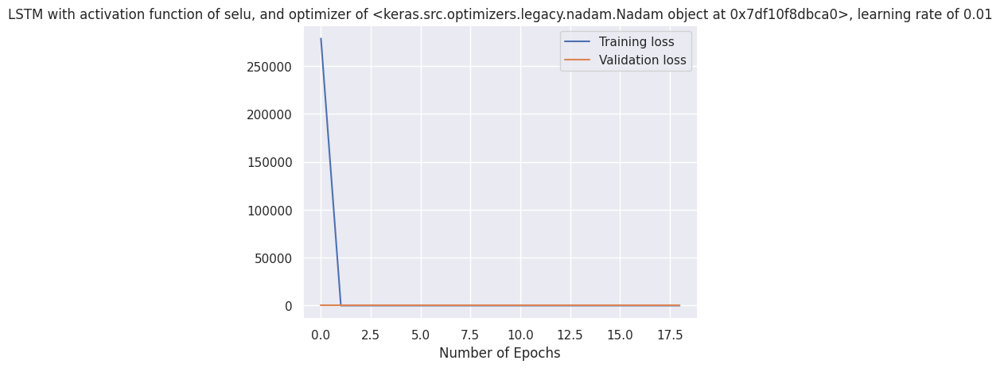

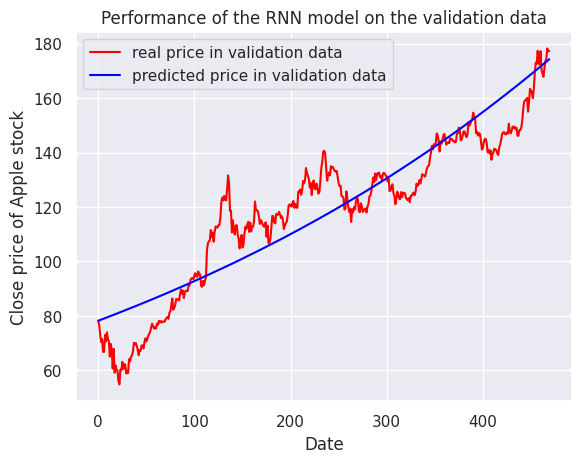

Model: "sequential_99"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_369 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_370 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_371 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_372 (LSTM)             (None, 50)                20200     
                                                                 
 dense_99 (Dense)            (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

In [236]:
# Run hyperparameters tuning
mse = []
actfn_col = []
lr_col = []
opt_col = []

for a in actfn_list:
  for l in lr:
    # Generate optimizers with each learning rate
    optimizer_sgd = keras.optimizers.legacy.SGD(learning_rate=l, decay=1e-7, momentum = 0.9, clipnorm=1.0,nesterov=False)
    optimizer_adam = keras.optimizers.legacy.Adam(learning_rate=l, decay=1e-7, clipnorm=1.0)
    optimizer_nadam = keras.optimizers.legacy.Nadam(learning_rate=l, decay=1e-7, clipnorm=1.0)
    optimizer_list = [optimizer_sgd, optimizer_adam, optimizer_nadam]
    for o in optimizer_list:
      # Built networks
      hist, model = create_gru(o,a)

      # Inverse transform standard scaled dataset
      temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
      temp_pred_1[:,-1] = model.predict(X_val_30_std)[:,0]
      y_val_pred_lstm_30_inverse = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

      # Transform data back to close prices
      y_pred_lstm_30_backtransform_final_1 = np.exp(np.cumsum(y_val_pred_lstm_30_inverse/100)) * apple_val_ts.close[30]
      y_pred_lstm_30_backtransform_final_1 = np.insert(y_pred_lstm_30_backtransform_final_1, 0, apple_val_ts.close[30])

      y_lstm_30_backtransform_1 = np.exp(np.cumsum(y_val_inv_30/100)) * apple_val_ts.close[30]
      y_lstm_30_backtransform_1 = np.insert(y_lstm_30_backtransform_1, 0, apple_val_ts.close[30])

      # Traning loss, validation loss plot
      pd.DataFrame(hist.history).plot()
      plt.xlabel("Number of Epochs")
      plt.title(f'LSTM with activation function of {a}, and optimizer of {o}, learning rate of {l}')
      plt.legend(['Training loss', 'Validation loss'])
      plt.show()

      # Performance plot of networks
      plot_real_price(y_lstm_30_backtransform_1, y_pred_lstm_30_backtransform_final_1)

      actfn_col.append(a)
      lr_col.append(l)
      opt_col.append(o)

      # Compute MSE
      mse_v = mean_squared_error(y_lstm_30_backtransform_1, y_pred_lstm_30_backtransform_final_1)
      if np.isnan(mse_v):
        mse.append('NaN')
      else:
        mse.append(mean_squared_error(y_lstm_30_backtransform_1, y_pred_lstm_30_backtransform_final_1))

      # Show model summary
      display(model.summary())


In [238]:
# Dataframe of tuning results
res_tune = pd.DataFrame({'Activation_function': actfn_col, 'Optimizer':opt_col, 'Learning_rate': lr_col, 'Mean squared error (actual price)':mse})
res_tune.sort_values('Mean squared error (actual price)')

,Activation_function,Optimizer,Learning_rate,Mean squared error (actual price)
24,selu,<keras.src.optimizers.legacy.gradient_descent....,0.001,87.908946
26,selu,<keras.src.optimizers.legacy.nadam.Nadam objec...,0.001,118.515467
18,elu,<keras.src.optimizers.legacy.gradient_descent....,0.001,123.645732
11,relu,<keras.src.optimizers.legacy.nadam.Nadam objec...,0.010,125.584980
3,tanh,<keras.src.optimizers.legacy.gradient_descent....,0.010,127.396714
29,selu,<keras.src.optimizers.legacy.nadam.Nadam objec...,0.010,130.175277
27,selu,<keras.src.optimizers.legacy.gradient_descent....,0.010,132.500600
5,tanh,<keras.src.optimizers.legacy.nadam.Nadam objec...,0.010,134.260698
10,relu,<keras.src.optimizers.legacy.adam.Adam object ...,0.010,135.249389
15,LeakyReLU,<keras.src.optimizers.legacy.gradient_descent....,0.010,138.601784


Epoch 1/100
83/83 [==============================] - 21s 204ms/step - loss: 1.0307 - val_loss: 2.2291
Epoch 2/100
83/83 [==============================] - 16s 199ms/step - loss: 1.0117 - val_loss: 2.2186
Epoch 3/100
83/83 [==============================] - 18s 214ms/step - loss: 1.0162 - val_loss: 2.2229
Epoch 4/100
83/83 [==============================] - 17s 201ms/step - loss: 1.0087 - val_loss: 2.2202
Epoch 5/100
83/83 [==============================] - 16s 199ms/step - loss: 1.0072 - val_loss: 2.2157
Epoch 6/100
83/83 [==============================] - 18s 214ms/step - loss: 1.0038 - val_loss: 2.2177
Epoch 7/100
83/83 [==============================] - 17s 202ms/step - loss: 1.0100 - val_loss: 2.2129
Epoch 8/100
83/83 [==============================] - 17s 203ms/step - loss: 1.0149 - val_loss: 2.2256
Epoch 9/100
83/83 [==============================] - 18s 211ms/step - loss: 1.0067 - val_loss: 2.2661
Epoch 10/100
83/83 [==============================] - 17s 202ms/step - loss: 1.006

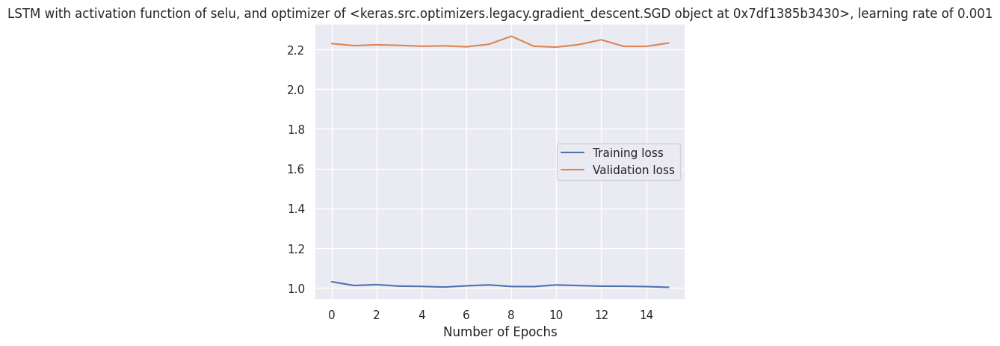

Model: "sequential_100"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_373 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_374 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_375 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_376 (LSTM)             (None, 50)                20200     
                                                                 
 dense_100 (Dense)           (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

In [239]:
# The best LSTM model, assessed on validation data
lr_tuned = 0.001
opt_tuned = keras.optimizers.legacy.SGD(learning_rate=lr_tuned, decay=1e-7, momentum = 0.9, clipnorm=1.0,nesterov=False)
actfn_tuned = 'selu'

lstm_final = keras.models.Sequential()
lstm_final.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_final.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned))
lstm_final.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned))
lstm_final.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_final.add(keras.layers.Dense(units=1))

lstm_final.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_final = lstm_final.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_final.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'LSTM with activation function of {actfn_tuned}, and optimizer of {opt_tuned}, learning rate of {lr_tuned}')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_final.summary())


In [240]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_final.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 19ms/step


15/15 [==============================] - 0s 19ms/step


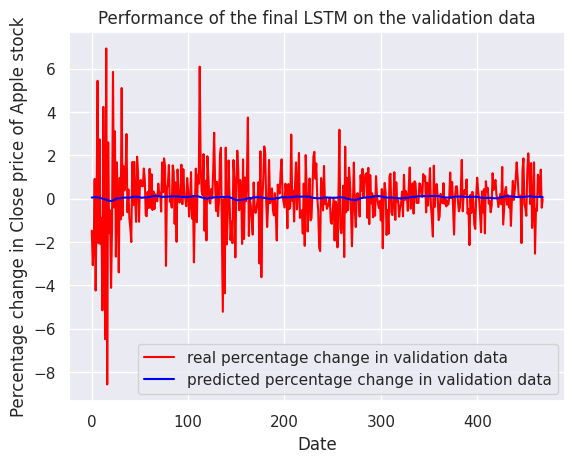

In [242]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_final.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [243]:
# # Inverse transform the datasets
# temp_pred = np.zeros(shape=(len(X_val_10_std), val_10.shape[1]))
# temp_pred[:,-1] = y_val_10_std
# y_val_inv_10 = std_scaler_10.inverse_transform(temp_pred)[:,-1]

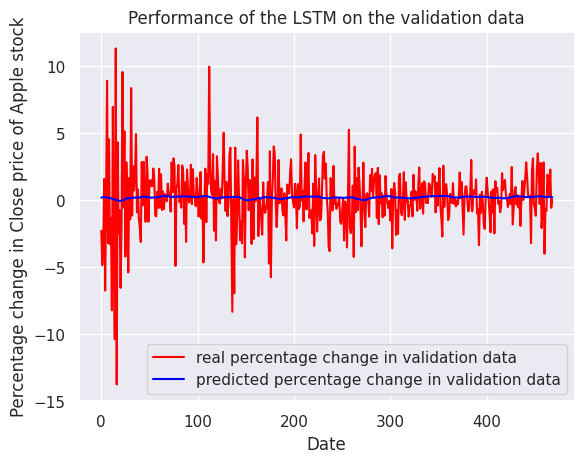

In [244]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final)

In [245]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_final.predict(X_val_30_std))

15/15 [==============================] - 0s 30ms/step


2.21130823599686

In [246]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final)
y_pred_lstm_30_backtransform_final = np.exp(np.cumsum(y_val_pred_lstm_inv_final/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final = np.insert(y_pred_lstm_30_backtransform_final, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final

array([ 78.19675446,  78.34061874,  78.49587234,  78.65686713,
        78.82472313,  78.99162618,  79.15289254,  79.31222616,
        79.45940705,  79.5939535 ,  79.71065544,  79.80698646,
        79.88186814,  79.94090198,  79.98453217,  80.00728407,
        80.01553538,  80.01559478,  79.98803667,  79.95024933,
        79.89473308,  79.83743844,  79.79895876,  79.76983916,
        79.77150508,  79.79629122,  79.87828513,  79.9689237 ,
        80.07089577,  80.17276646,  80.27541632,  80.38044035,
        80.50341105,  80.64305834,  80.79339984,  80.94090885,
        81.08557388,  81.23616789,  81.371937  ,  81.52994111,
        81.6568108 ,  81.81584459,  81.98685999,  82.18738461,
        82.37364657,  82.58737781,  82.78737701,  82.99500549,
        83.1566122 ,  83.35408255,  83.53506448,  83.71254238,
        83.85450585,  83.99702793,  84.14903784,  84.30498062,
        84.4737801 ,  84.62938664,  84.80031515,  84.98123578,
        85.15924892,  85.35255807,  85.55833535,  85.79

In [252]:
# Tranform back percentage change to price (y_val_inv_30)
y_lstm_30_backtransform = np.exp(np.cumsum(y_val_inv_30/100)) * apple_val_ts.close[30]
y_lstm_30_backtransform = np.insert(y_lstm_30_backtransform, 0, apple_val_ts.close[30])
y_lstm_30_backtransform

array([ 78.19675446,  76.42679596,  72.79649353,  70.33071136,
        71.44641876,  66.7760849 ,  66.73704529,  72.95029449,
        70.63343048,  73.90974426,  71.51233673,  70.5626297 ,
        64.98171997,  69.66178131,  67.24237823,  60.60189056,
        67.86248016,  59.13219833,  61.73223877,  60.22104263,
        59.75962448,  55.96574783,  54.77680969,  60.27231216,
        59.94028473,  63.09452438,  60.4822731 ,  62.20830917,
        62.08135223,  58.81481171,  59.79624176,  58.93688202,
        64.07839203,  63.33620834,  64.95727539,  65.4260025 ,
        66.71017456,  70.07925415,  69.43961334,  69.99137878,
        69.04167938,  67.60857391,  65.51879883,  67.40596771,
        67.14473724,  69.08317566,  69.13200378,  68.01141357,
        70.24526215,  71.72714996,  70.57239532,  71.57093048,
        72.64512634,  73.3946228 ,  74.15386963,  75.91886139,
        77.11346436,  76.23221588,  75.31177521,  75.77443695,
        75.32645416,  77.10122681,  76.65569305,  78.14

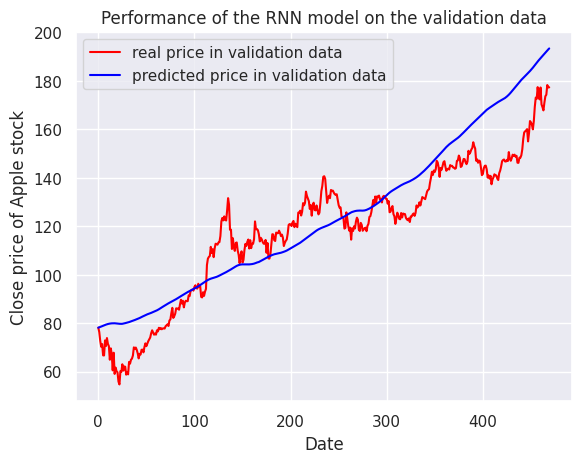

In [253]:
# Performance plot of the best LSTM after tuning
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final)

In [254]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final)

5.780609831020256

In [255]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final)

198.26257427071312

## Batch Normalization


#### 1 Batch normalization layer


Epoch 1/100
83/83 [==============================] - 21s 207ms/step - loss: 1.1063 - val_loss: 2.2239
Epoch 2/100
83/83 [==============================] - 18s 214ms/step - loss: 1.0253 - val_loss: 2.3238
Epoch 3/100
83/83 [==============================] - 17s 202ms/step - loss: 1.0335 - val_loss: 2.4165
Epoch 4/100
83/83 [==============================] - 18s 214ms/step - loss: 1.0126 - val_loss: 2.2191
Epoch 5/100
83/83 [==============================] - 17s 201ms/step - loss: 1.0144 - val_loss: 2.2575
Epoch 6/100
83/83 [==============================] - 17s 204ms/step - loss: 1.0058 - val_loss: 2.2604
Epoch 7/100
83/83 [==============================] - 18s 216ms/step - loss: 1.0079 - val_loss: 2.2125
Epoch 8/100
83/83 [==============================] - 16s 197ms/step - loss: 1.0076 - val_loss: 2.2145
Epoch 9/100
83/83 [==============================] - 16s 199ms/step - loss: 1.0091 - val_loss: 2.2360
Epoch 10/100
83/83 [==============================] - 18s 216ms/step - loss: 1.004

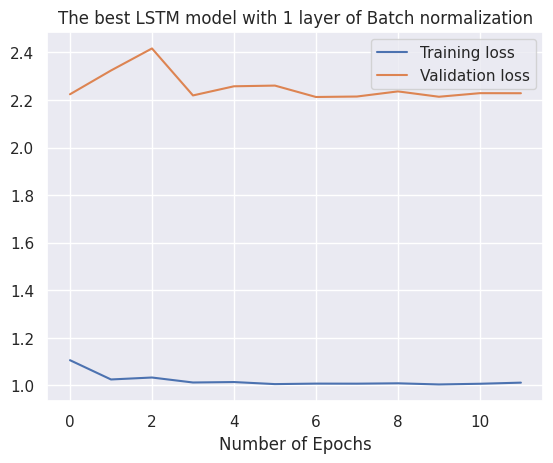

Model: "sequential_101"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_377 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_378 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_379 (LSTM)             (None, 30, 50)            20200     
                                                                 
 batch_normalization (Batch  (None, 30, 50)            200       
 Normalization)                                                  
                                                                 
 lstm_380 (LSTM)             (None, 50)                20200     
                                                                 
 dense_101 (Dense)           (None, 1)                 51        
                                                    

None

In [256]:
## Batch Normalization - 1 layer
lstm_30_norm = keras.models.Sequential()
lstm_30_norm.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned))
lstm_30_norm.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned))
lstm_30_norm.add(keras.layers.BatchNormalization())
lstm_30_norm.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm.add(keras.layers.Dense(units=1))

lstm_30_norm.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm = lstm_30_norm.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with 1 layer of Batch normalization')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm.summary())

In [259]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_norm = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 19ms/step


15/15 [==============================] - 0s 19ms/step


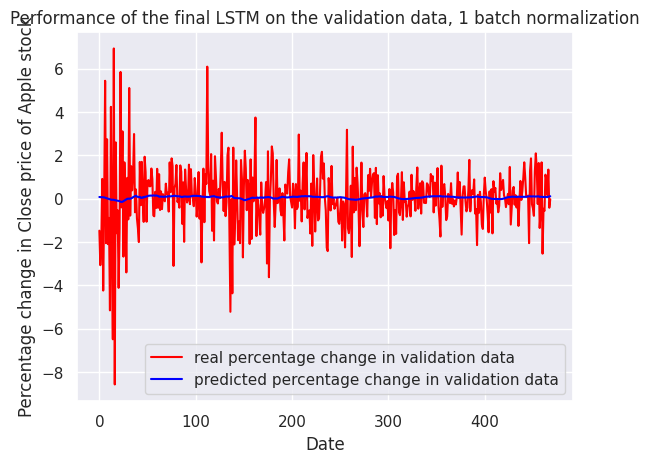

In [260]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, 1 batch normalization")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

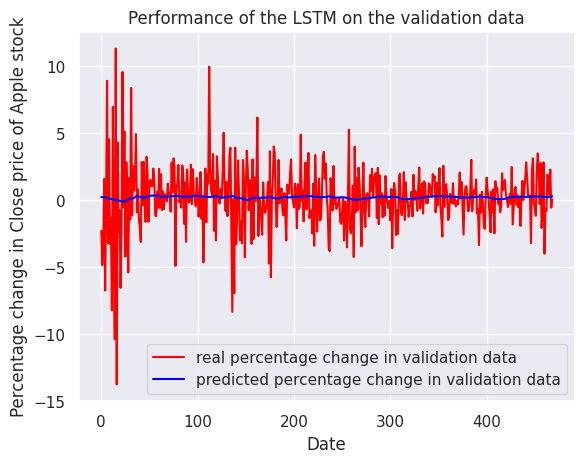

In [261]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_norm)

In [262]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_30_norm.predict(X_val_30_std))

15/15 [==============================] - 0s 19ms/step


2.212498890722266

In [263]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_norm)
y_pred_lstm_30_backtransform_final_norm = np.exp(np.cumsum(y_val_pred_lstm_inv_final_norm/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_norm = np.insert(y_pred_lstm_30_backtransform_final_norm, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_norm

array([ 78.19675446,  78.37229542,  78.54332119,  78.71076425,
        78.87194087,  79.02577749,  79.17966172,  79.31343376,
        79.4324513 ,  79.5291953 ,  79.59937253,  79.65796314,
        79.699929  ,  79.73033134,  79.74041471,  79.75862549,
        79.77094905,  79.75988667,  79.74725602,  79.70749273,
        79.66965698,  79.61912285,  79.55041424,  79.44661769,
        79.33719934,  79.2327011 ,  79.16423636,  79.12677376,
        79.13067657,  79.16314943,  79.23522394,  79.31464482,
        79.3966507 ,  79.47129833,  79.5663896 ,  79.69292581,
        79.86274475,  80.06259914,  80.29533883,  80.55228065,
        80.75054516,  80.94252788,  81.11186054,  81.30746276,
        81.43877363,  81.56484298,  81.73600353,  81.88571046,
        82.08630233,  82.28063627,  82.50138939,  82.73755885,
        83.00211212,  83.26994813,  83.54467912,  83.82327629,
        84.0895678 ,  84.3808165 ,  84.66427463,  84.93765593,
        85.2257861 ,  85.49440633,  85.75310418,  85.96

In [264]:
# Tranform back percentage change to price (y_val_inv_30)
y_lstm_30_backtransform = np.exp(np.cumsum(y_val_inv_30/100)) * apple_val_ts.close[30]
y_lstm_30_backtransform = np.insert(y_lstm_30_backtransform, 0, apple_val_ts.close[30])
y_lstm_30_backtransform

array([ 78.19675446,  76.42679596,  72.79649353,  70.33071136,
        71.44641876,  66.7760849 ,  66.73704529,  72.95029449,
        70.63343048,  73.90974426,  71.51233673,  70.5626297 ,
        64.98171997,  69.66178131,  67.24237823,  60.60189056,
        67.86248016,  59.13219833,  61.73223877,  60.22104263,
        59.75962448,  55.96574783,  54.77680969,  60.27231216,
        59.94028473,  63.09452438,  60.4822731 ,  62.20830917,
        62.08135223,  58.81481171,  59.79624176,  58.93688202,
        64.07839203,  63.33620834,  64.95727539,  65.4260025 ,
        66.71017456,  70.07925415,  69.43961334,  69.99137878,
        69.04167938,  67.60857391,  65.51879883,  67.40596771,
        67.14473724,  69.08317566,  69.13200378,  68.01141357,
        70.24526215,  71.72714996,  70.57239532,  71.57093048,
        72.64512634,  73.3946228 ,  74.15386963,  75.91886139,
        77.11346436,  76.23221588,  75.31177521,  75.77443695,
        75.32645416,  77.10122681,  76.65569305,  78.14

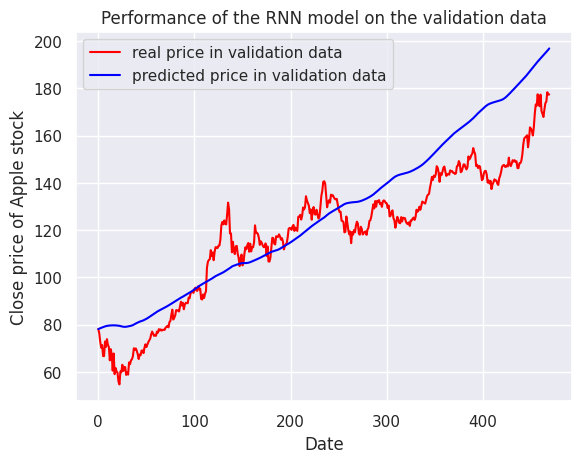

In [265]:
# Performance plot of LSTM, 1 BN layer
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_norm)

In [266]:
# MSE of dataset, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_norm)

5.783722337137219

In [267]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_norm)

245.66886295760813

#### 2 Batch normalization layers


Epoch 1/100
83/83 [==============================] - 21s 209ms/step - loss: 1.3361 - val_loss: 2.2353
Epoch 2/100
83/83 [==============================] - 17s 207ms/step - loss: 1.0421 - val_loss: 2.2687
Epoch 3/100
83/83 [==============================] - 17s 202ms/step - loss: 1.0288 - val_loss: 2.2321
Epoch 4/100
83/83 [==============================] - 18s 212ms/step - loss: 1.0233 - val_loss: 2.2593
Epoch 5/100
83/83 [==============================] - 17s 200ms/step - loss: 1.0247 - val_loss: 2.2269
Epoch 6/100
83/83 [==============================] - 16s 199ms/step - loss: 1.0187 - val_loss: 2.2825
Epoch 7/100
83/83 [==============================] - 18s 213ms/step - loss: 1.0176 - val_loss: 2.3869
Epoch 8/100
83/83 [==============================] - 16s 198ms/step - loss: 1.0065 - val_loss: 2.4880
Epoch 9/100
83/83 [==============================] - 17s 201ms/step - loss: 1.0069 - val_loss: 2.3265
Epoch 10/100
83/83 [==============================] - 18s 213ms/step - loss: 1.001

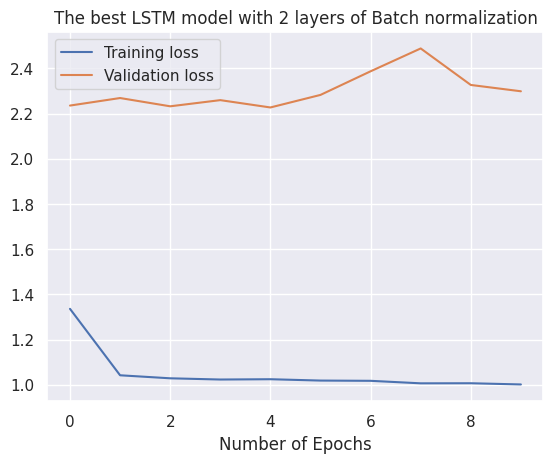

Model: "sequential_102"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_381 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_382 (LSTM)             (None, 30, 50)            20200     
                                                                 
 batch_normalization_1 (Bat  (None, 30, 50)            200       
 chNormalization)                                                
                                                                 
 lstm_383 (LSTM)             (None, 30, 50)            20200     
                                                                 
 batch_normalization_2 (Bat  (None, 30, 50)            200       
 chNormalization)                                                
                                                                 
 lstm_384 (LSTM)             (None, 50)             

None

In [257]:
## Batch Normalization - 2 layer
lstm_30_norm_2 = keras.models.Sequential()
lstm_30_norm_2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm_2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned))
lstm_30_norm_2.add(keras.layers.BatchNormalization())
lstm_30_norm_2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned))
lstm_30_norm_2.add(keras.layers.BatchNormalization())
lstm_30_norm_2.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm_2.add(keras.layers.Dense(units=1))

lstm_30_norm_2.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm_2 = lstm_30_norm_2.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm_2.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with 2 layers of Batch normalization')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm_2.summary())

In [268]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_2.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_norm_2 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 19ms/step


15/15 [==============================] - 0s 30ms/step


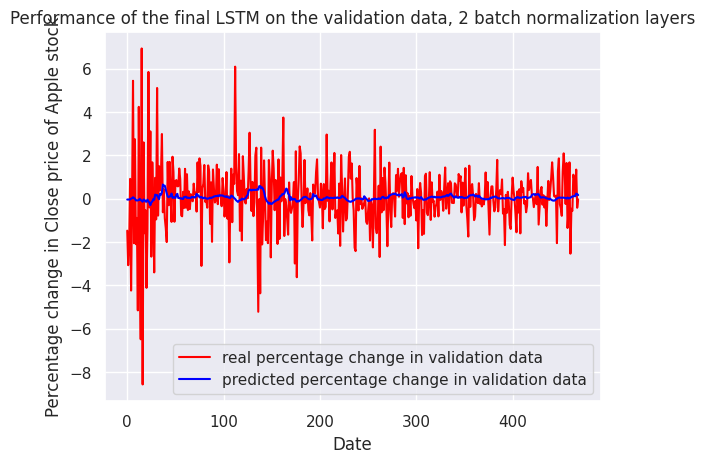

In [269]:
# Plot of percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm_2.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, 2 batch normalization layers")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

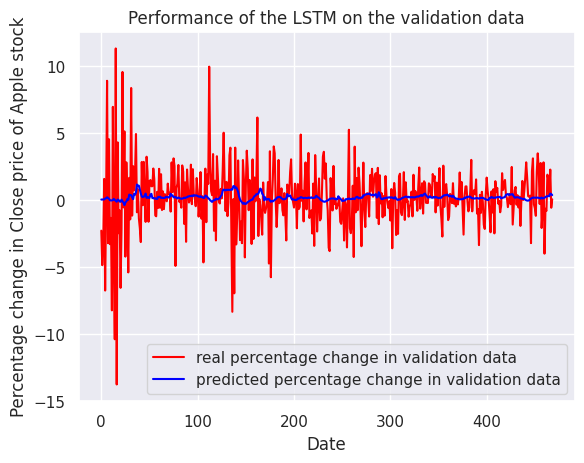

In [270]:
# Plot of percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_norm_2)

In [271]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_30_norm_2.predict(X_val_30_std))

15/15 [==============================] - 0s 19ms/step


2.2269192012948227

In [272]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_norm_2)
y_pred_lstm_30_backtransform_final_norm_2 = np.exp(np.cumsum(y_val_pred_lstm_inv_final_norm_2/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_norm_2 = np.insert(y_pred_lstm_30_backtransform_final_norm_2, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_norm_2

array([ 78.19675446,  78.22375586,  78.24888954,  78.27828832,
        78.31340996,  78.39330713,  78.49918408,  78.65792161,
        78.78025234,  78.84436433,  78.82934972,  78.80351771,
        78.77859521,  78.7805756 ,  78.8464087 ,  78.84938976,
        78.80666808,  78.70717456,  78.73733303,  78.73280835,
        78.64385595,  78.54129124,  78.56343462,  78.49420021,
        78.33500029,  78.03556314,  77.89971043,  77.81229062,
        77.86159841,  77.87689987,  78.1930695 ,  78.48126028,
        78.76968843,  78.93273573,  78.97901869,  79.34216123,
        79.65104721,  80.10786443,  81.03816392,  81.90767582,
        82.78498199,  83.43402258,  83.84522665,  84.0622461 ,
        84.24316338,  84.46547687,  84.70040885,  85.10953486,
        85.24945969,  85.43705872,  85.58440045,  85.71563126,
        86.06534966,  86.46050162,  86.58959993,  86.71696976,
        86.81504291,  86.9310222 ,  87.0065171 ,  87.073774  ,
        87.27562382,  87.46013697,  87.6789658 ,  87.81

In [273]:
# Tranform back percentage change to price (y_val_inv_30)
y_lstm_30_backtransform = np.exp(np.cumsum(y_val_inv_30/100)) * apple_val_ts.close[30]
y_lstm_30_backtransform = np.insert(y_lstm_30_backtransform, 0, apple_val_ts.close[30])
y_lstm_30_backtransform

array([ 78.19675446,  76.42679596,  72.79649353,  70.33071136,
        71.44641876,  66.7760849 ,  66.73704529,  72.95029449,
        70.63343048,  73.90974426,  71.51233673,  70.5626297 ,
        64.98171997,  69.66178131,  67.24237823,  60.60189056,
        67.86248016,  59.13219833,  61.73223877,  60.22104263,
        59.75962448,  55.96574783,  54.77680969,  60.27231216,
        59.94028473,  63.09452438,  60.4822731 ,  62.20830917,
        62.08135223,  58.81481171,  59.79624176,  58.93688202,
        64.07839203,  63.33620834,  64.95727539,  65.4260025 ,
        66.71017456,  70.07925415,  69.43961334,  69.99137878,
        69.04167938,  67.60857391,  65.51879883,  67.40596771,
        67.14473724,  69.08317566,  69.13200378,  68.01141357,
        70.24526215,  71.72714996,  70.57239532,  71.57093048,
        72.64512634,  73.3946228 ,  74.15386963,  75.91886139,
        77.11346436,  76.23221588,  75.31177521,  75.77443695,
        75.32645416,  77.10122681,  76.65569305,  78.14

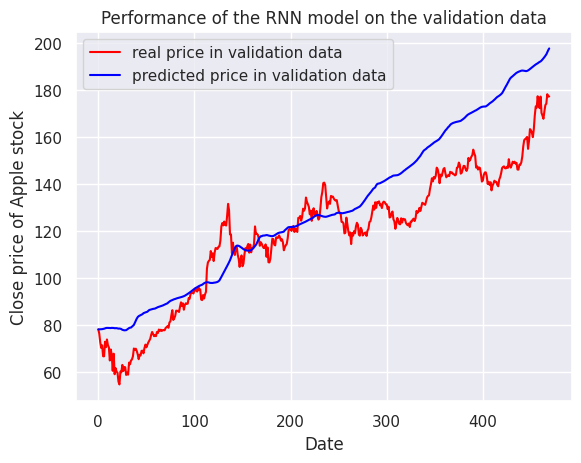

In [274]:
# Performance plot of LSTM, 2 BN layers
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_norm_2)

In [275]:
# MSE of data, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_norm_2)

5.821418659931634

In [276]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_norm_2)

299.57685426557657

#### 3 Batch normalization layers


Epoch 1/100
83/83 [==============================] - 22s 210ms/step - loss: 1.3717 - val_loss: 2.3725
Epoch 2/100
83/83 [==============================] - 18s 211ms/step - loss: 1.1226 - val_loss: 2.3966
Epoch 3/100
83/83 [==============================] - 17s 199ms/step - loss: 1.0546 - val_loss: 2.2793
Epoch 4/100
83/83 [==============================] - 19s 224ms/step - loss: 1.0286 - val_loss: 2.4071
Epoch 5/100
83/83 [==============================] - 17s 207ms/step - loss: 1.0119 - val_loss: 2.2640
Epoch 6/100
83/83 [==============================] - 17s 204ms/step - loss: 0.9999 - val_loss: 2.2704
Epoch 7/100
83/83 [==============================] - 18s 213ms/step - loss: 0.9856 - val_loss: 2.2759
Epoch 8/100
83/83 [==============================] - 17s 203ms/step - loss: 0.9801 - val_loss: 2.2839
Epoch 9/100
83/83 [==============================] - 18s 217ms/step - loss: 1.0002 - val_loss: 2.6533
Epoch 10/100
83/83 [==============================] - 17s 200ms/step - loss: 0.990

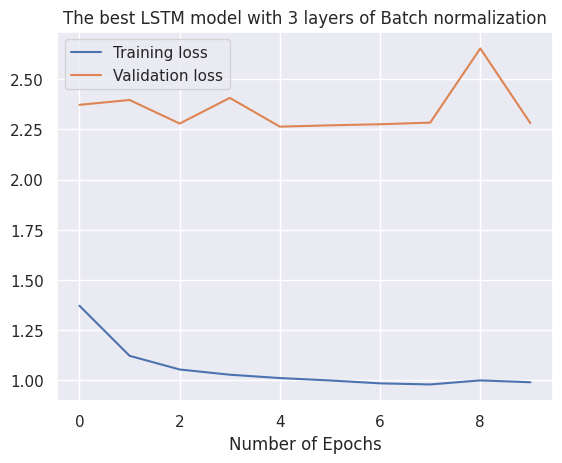

Model: "sequential_104"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_389 (LSTM)             (None, 30, 50)            10400     
                                                                 
 batch_normalization_6 (Bat  (None, 30, 50)            200       
 chNormalization)                                                
                                                                 
 lstm_390 (LSTM)             (None, 30, 50)            20200     
                                                                 
 batch_normalization_7 (Bat  (None, 30, 50)            200       
 chNormalization)                                                
                                                                 
 lstm_391 (LSTM)             (None, 30, 50)            20200     
                                                                 
 batch_normalization_8 (Bat  (None, 30, 50)         

None

In [277]:
## Batch Normalization - 3 layer
lstm_30_norm_3 = keras.models.Sequential()
lstm_30_norm_3.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm_3.add(keras.layers.BatchNormalization())
lstm_30_norm_3.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned))
lstm_30_norm_3.add(keras.layers.BatchNormalization())
lstm_30_norm_3.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned))
lstm_30_norm_3.add(keras.layers.BatchNormalization())
lstm_30_norm_3.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm_3.add(keras.layers.Dense(units=1))

lstm_30_norm_3.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm_3 = lstm_30_norm_3.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm_3.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with 3 layers of Batch normalization')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm_3.summary())

In [278]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_3.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_norm_3 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 21ms/step


15/15 [==============================] - 0s 19ms/step


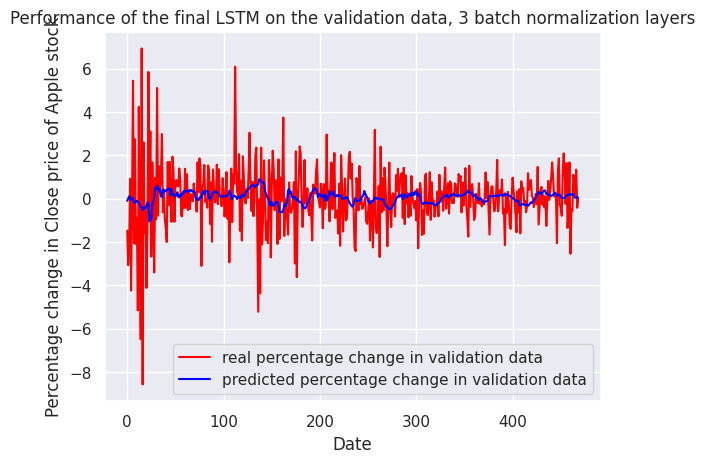

In [279]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm_3.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, 3 batch normalization layers")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

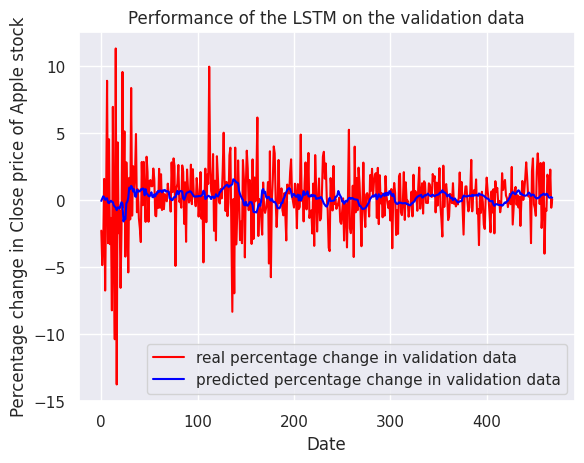

In [280]:
# Plot of percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_norm_3)

In [281]:
# MSE of standard scaled data
mean_squared_error(y_val_30_std, lstm_30_norm_3.predict(X_val_30_std))

15/15 [==============================] - 0s 21ms/step


2.2639754758791746

In [282]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_norm_3)
y_pred_lstm_30_backtransform_final_norm_3 = np.exp(np.cumsum(y_val_pred_lstm_inv_final_norm_3/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_norm_3 = np.insert(y_pred_lstm_30_backtransform_final_norm_3, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_norm_3

array([ 78.19675446,  78.14502322,  78.22285662,  78.43926682,
        78.60981018,  78.62381574,  78.70330596,  78.80259484,
        78.65614779,  78.47402073,  78.37134312,  78.32887582,
        78.22602397,  78.10217321,  77.78283357,  77.40157089,
        76.95620245,  76.37515035,  75.95766601,  75.52475981,
        75.04417218,  74.77004624,  74.64163397,  74.43486514,
        73.254687  ,  72.31122255,  71.27720026,  71.10566326,
        71.01489435,  71.13670638,  71.79924865,  72.38146314,
        73.14904871,  73.84858435,  74.32311295,  74.92215592,
        75.13161908,  75.31078363,  75.88815234,  76.36200291,
        76.87815002,  77.37043079,  77.98655926,  78.59523747,
        79.27497915,  79.93600478,  80.22129459,  80.87286662,
        81.2514555 ,  81.59935561,  81.84887967,  82.06954618,
        82.36794639,  82.84500075,  83.03659585,  83.20532973,
        83.5543437 ,  83.77503592,  84.18475541,  84.57993368,
        85.15553701,  85.66971442,  86.27947409,  86.86

In [283]:
# Tranform back percentage change to price (y_val_inv_30)
y_lstm_30_backtransform = np.exp(np.cumsum(y_val_inv_30/100)) * apple_val_ts.close[30]
y_lstm_30_backtransform = np.insert(y_lstm_30_backtransform, 0, apple_val_ts.close[30])
y_lstm_30_backtransform

array([ 78.19675446,  76.42679596,  72.79649353,  70.33071136,
        71.44641876,  66.7760849 ,  66.73704529,  72.95029449,
        70.63343048,  73.90974426,  71.51233673,  70.5626297 ,
        64.98171997,  69.66178131,  67.24237823,  60.60189056,
        67.86248016,  59.13219833,  61.73223877,  60.22104263,
        59.75962448,  55.96574783,  54.77680969,  60.27231216,
        59.94028473,  63.09452438,  60.4822731 ,  62.20830917,
        62.08135223,  58.81481171,  59.79624176,  58.93688202,
        64.07839203,  63.33620834,  64.95727539,  65.4260025 ,
        66.71017456,  70.07925415,  69.43961334,  69.99137878,
        69.04167938,  67.60857391,  65.51879883,  67.40596771,
        67.14473724,  69.08317566,  69.13200378,  68.01141357,
        70.24526215,  71.72714996,  70.57239532,  71.57093048,
        72.64512634,  73.3946228 ,  74.15386963,  75.91886139,
        77.11346436,  76.23221588,  75.31177521,  75.77443695,
        75.32645416,  77.10122681,  76.65569305,  78.14

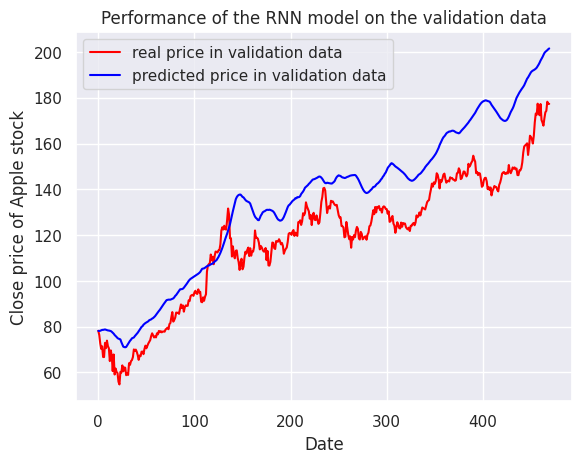

In [284]:
# Performance plot of LSTM, 3 BN layers
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_norm_3)

In [285]:
# MSE of data, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_norm_3)

5.918287952812792

In [286]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_norm_3)

354.3302842251617

## Reducing overfitting problem


### 1. L1 regularization


Epoch 1/100
83/83 [==============================] - 22s 221ms/step - loss: 75.4133 - val_loss: 72.8551
Epoch 2/100
83/83 [==============================] - 16s 199ms/step - loss: 67.7783 - val_loss: 65.1837
Epoch 3/100
83/83 [==============================] - 16s 198ms/step - loss: 60.3786 - val_loss: 57.9898
Epoch 4/100
83/83 [==============================] - 18s 214ms/step - loss: 53.4311 - val_loss: 51.2816
Epoch 5/100
83/83 [==============================] - 16s 197ms/step - loss: 46.8938 - val_loss: 44.9427
Epoch 6/100
83/83 [==============================] - 16s 197ms/step - loss: 40.8023 - val_loss: 39.0934
Epoch 7/100
83/83 [==============================] - 18s 217ms/step - loss: 35.1637 - val_loss: 33.6632
Epoch 8/100
83/83 [==============================] - 17s 200ms/step - loss: 29.9254 - val_loss: 28.6492
Epoch 9/100
83/83 [==============================] - 17s 201ms/step - loss: 25.1233 - val_loss: 24.0455
Epoch 10/100
83/83 [==============================] - 18s 209ms/

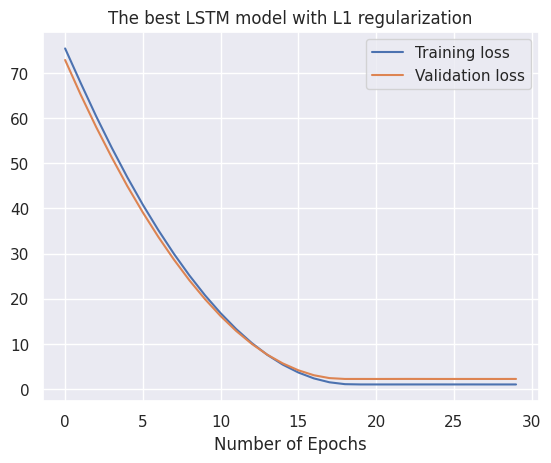

Model: "sequential_105"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_393 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_394 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_395 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_396 (LSTM)             (None, 50)                20200     
                                                                 
 dense_105 (Dense)           (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

In [287]:
## L1 regularization
lstm_30_norm_l1 = keras.models.Sequential()
lstm_30_norm_l1.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm_l1.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_l1.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_l1.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm_l1.add(keras.layers.Dense(units=1))

lstm_30_norm_l1.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm_l1 = lstm_30_norm_l1.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm_l1.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with L1 regularization')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm_l1.summary())

In [288]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_l1.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_l1 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 19ms/step


15/15 [==============================] - 0s 19ms/step


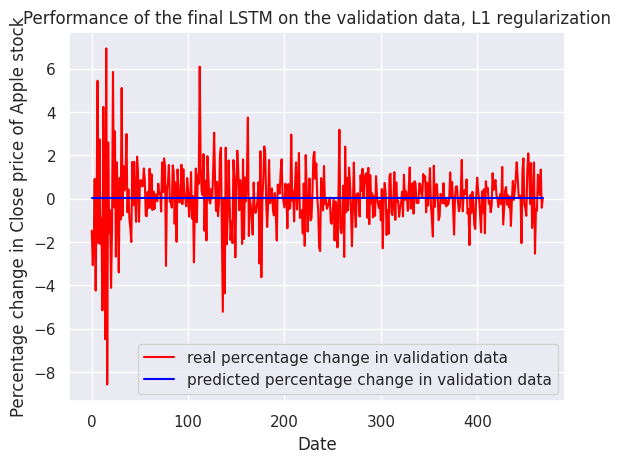

In [289]:
# Plot of percentage changs in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm_l1.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, L1 regularization")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

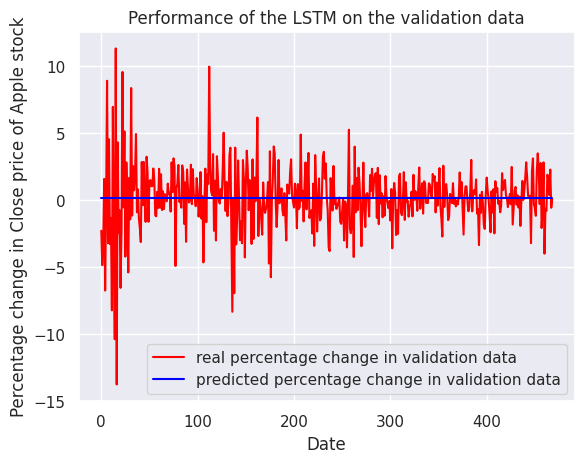

In [290]:
# Plot of percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_l1)

In [291]:
# MSE of standard scaled data
mean_squared_error(y_val_30_std, lstm_30_norm_l1.predict(X_val_30_std))

15/15 [==============================] - 0s 28ms/step


2.2149318063433694

In [292]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_l1)
y_pred_lstm_30_backtransform_final_l1 = np.exp(np.cumsum(y_val_pred_lstm_inv_final_l1/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_l1 = np.insert(y_pred_lstm_30_backtransform_final_l1, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_l1

array([ 78.19675446,  78.31832262,  78.44007977,  78.56202619,
        78.68416222,  78.80648812,  78.92900416,  79.05171067,
        79.17460795,  79.29769628,  79.420976  ,  79.54444737,
        79.66811069,  79.79196624,  79.91601437,  80.04025534,
        80.16468945,  80.28931702,  80.41413833,  80.5391537 ,
        80.6643634 ,  80.78976777,  80.91536709,  81.04116167,
        81.16715181,  81.29333783,  81.41972002,  81.54629868,
        81.67307414,  81.80004668,  81.92721662,  82.05458429,
        82.18214994,  82.30991393,  82.43787653,  82.56603807,
        82.69439883,  82.82295917,  82.95171938,  83.08067977,
        83.20984064,  83.33920231,  83.46876511,  83.59852935,
        83.72849531,  83.85866335,  83.98903374,  84.11960681,
        84.25038293,  84.38136232,  84.51254531,  84.64393224,
        84.77552346,  84.9073193 ,  85.03931999,  85.17152588,
        85.3039373 ,  85.4365546 ,  85.56937805,  85.70240802,
        85.8356448 ,  85.96908873,  86.10274009,  86.23

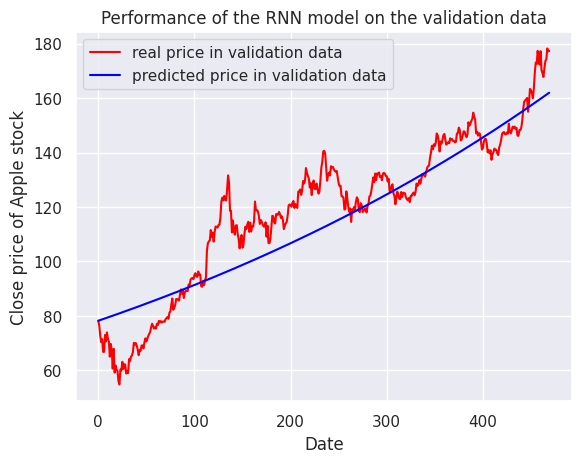

In [293]:
# Performance plot of LSTM, L1
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_l1)

In [294]:
# MSE of data, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_l1)

5.790082253737021

In [295]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_l1)

138.15219000161244

### 2. L2 regularization


Epoch 1/100
83/83 [==============================] - 21s 202ms/step - loss: 8.7359 - val_loss: 9.5121
Epoch 2/100
83/83 [==============================] - 17s 210ms/step - loss: 7.8274 - val_loss: 8.5376
Epoch 3/100
83/83 [==============================] - 16s 196ms/step - loss: 6.8703 - val_loss: 7.6343
Epoch 4/100
83/83 [==============================] - 16s 195ms/step - loss: 6.0203 - val_loss: 6.8314
Epoch 5/100
83/83 [==============================] - 18s 214ms/step - loss: 5.2737 - val_loss: 6.1374
Epoch 6/100
83/83 [==============================] - 17s 199ms/step - loss: 4.6234 - val_loss: 5.5467
Epoch 7/100
83/83 [==============================] - 17s 199ms/step - loss: 4.0785 - val_loss: 5.0454
Epoch 8/100
83/83 [==============================] - 17s 211ms/step - loss: 3.6006 - val_loss: 4.6078
Epoch 9/100
83/83 [==============================] - 16s 195ms/step - loss: 3.2059 - val_loss: 4.2349
Epoch 10/100
83/83 [==============================] - 17s 200ms/step - loss: 2.864

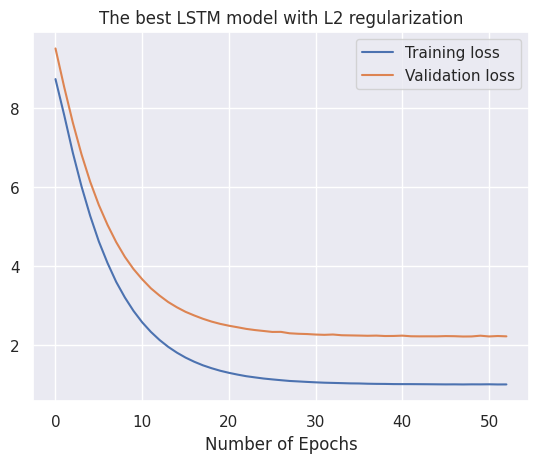

Model: "sequential_106"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_397 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_398 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_399 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_400 (LSTM)             (None, 50)                20200     
                                                                 
 dense_106 (Dense)           (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71051 (277.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

In [296]:
## L2 regularization
lstm_30_norm_l2 = keras.models.Sequential()
lstm_30_norm_l2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm_l2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L2(0.05)))
lstm_30_norm_l2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L2(0.05)))
lstm_30_norm_l2.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm_l2.add(keras.layers.Dense(units=1))

lstm_30_norm_l2.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm_l2 = lstm_30_norm_l2.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm_l2.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with L2 regularization')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm_l2.summary())

In [297]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_l2.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_l2 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 30ms/step


15/15 [==============================] - 0s 20ms/step


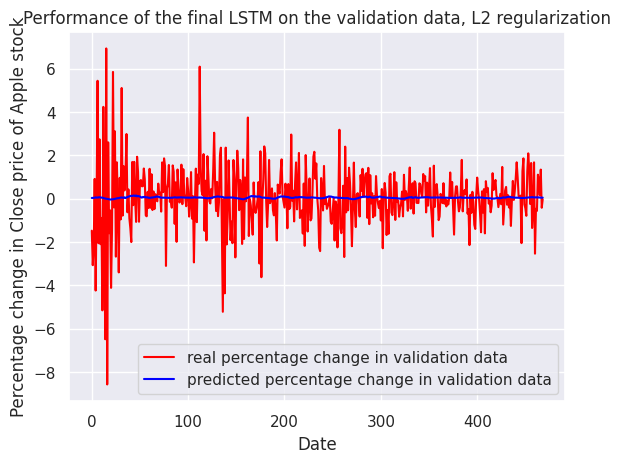

In [298]:
# Plot of percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm_l2.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, L2 regularization")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

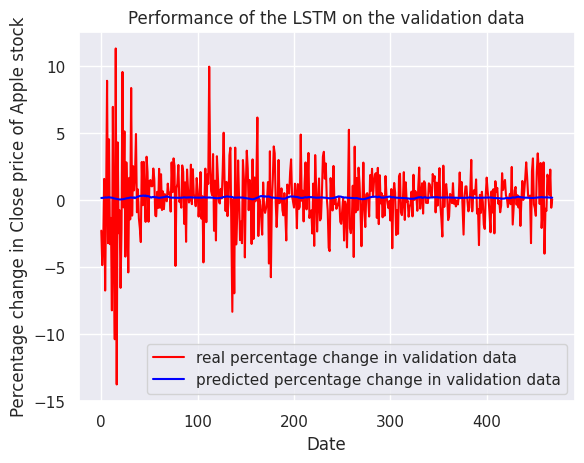

In [299]:
# Plot of percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_l2)

In [300]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_30_norm_l2.predict(X_val_30_std))

15/15 [==============================] - 0s 19ms/step


2.212990918862045

In [301]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_l2)
y_pred_lstm_30_backtransform_final_l2 = np.exp(np.cumsum(y_val_pred_lstm_inv_final_l2/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_l2 = np.insert(y_pred_lstm_30_backtransform_final_l2, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_l2

array([ 78.19675446,  78.31609886,  78.43825538,  78.56649499,
        78.70026528,  78.85244728,  78.996121  ,  79.14075435,
        79.29380299,  79.45670878,  79.60541479,  79.74938263,
        79.88644618,  80.00944681,  80.1080758 ,  80.19922465,
        80.27799821,  80.34439884,  80.39721432,  80.44046536,
        80.47133286,  80.50275009,  80.54462614,  80.58640107,
        80.64164052,  80.70362237,  80.78995471,  80.88578203,
        80.99669977,  81.1098797 ,  81.24397874,  81.39078205,
        81.54529588,  81.68983281,  81.82186047,  81.98629792,
        82.10694584,  82.25077394,  82.4455566 ,  82.64858917,
        82.87831919,  83.12183305,  83.38248596,  83.63429373,
        83.90962398,  84.18917489,  84.43835507,  84.72499435,
        84.9562453 ,  85.21503583,  85.45039401,  85.67153354,
        85.84154119,  85.99916796,  86.19371527,  86.37515867,
        86.58410786,  86.74878284,  86.92339215,  87.09099208,
        87.23438813,  87.3806695 ,  87.52575606,  87.68

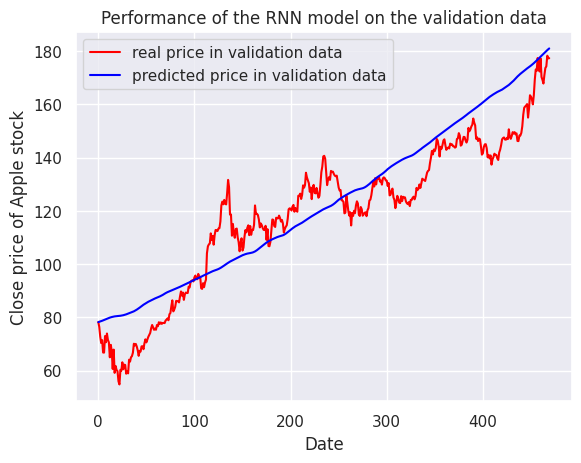

In [302]:
# Performance plot of LSTM, L2
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_l2)

In [303]:
# MSE of data, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_l2)

5.785008554343689

In [304]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_l2)

152.4191241673309

### 3. Dropout regularization


#### 1 Dropout layer


Epoch 1/100
83/83 [==============================] - 22s 223ms/step - loss: 75.7790 - val_loss: 73.1990
Epoch 2/100
83/83 [==============================] - 16s 198ms/step - loss: 68.3348 - val_loss: 65.8127
Epoch 3/100
83/83 [==============================] - 18s 214ms/step - loss: 61.0844 - val_loss: 58.7525
Epoch 4/100
83/83 [==============================] - 17s 202ms/step - loss: 54.1901 - val_loss: 52.0306
Epoch 5/100
83/83 [==============================] - 17s 200ms/step - loss: 47.6621 - val_loss: 45.6875
Epoch 6/100
83/83 [==============================] - 18s 211ms/step - loss: 41.5346 - val_loss: 39.7843
Epoch 7/100
83/83 [==============================] - 17s 201ms/step - loss: 35.8184 - val_loss: 34.2714
Epoch 8/100
83/83 [==============================] - 17s 200ms/step - loss: 30.5219 - val_loss: 29.1983
Epoch 9/100
83/83 [==============================] - 18s 217ms/step - loss: 25.6571 - val_loss: 24.5443
Epoch 10/100
83/83 [==============================] - 16s 198ms/

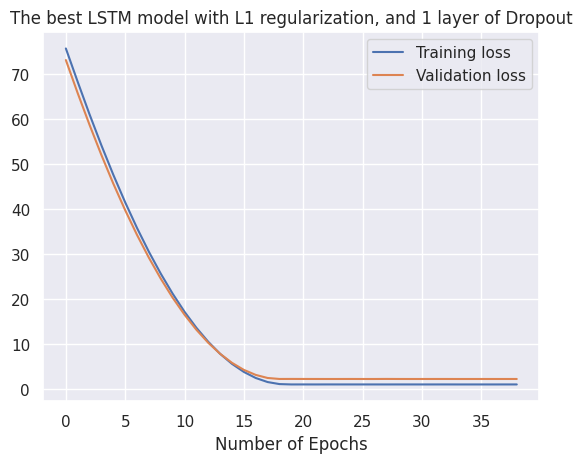

Model: "sequential_107"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_401 (LSTM)             (None, 30, 50)            10400     
                                                                 
 lstm_402 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_403 (LSTM)             (None, 30, 50)            20200     
                                                                 
 lstm_404 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_2 (Dropout)         (None, 50)                0         
                                                                 
 dense_107 (Dense)           (None, 1)                 51        
                                                                 
Total params: 71051 (277.54 KB)
Trainable params: 71

None

In [305]:
## Dropout regularization (1 of dropout layers)
lstm_30_norm_dr = keras.models.Sequential()
lstm_30_norm_dr.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm_dr.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_dr.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_dr.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm_dr.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr.add(keras.layers.Dense(units=1))

lstm_30_norm_dr.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm_dr = lstm_30_norm_dr.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm_dr.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with L1 regularization, and 1 layer of Dropout')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm_dr.summary())

In [306]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_dr.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_dr = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 19ms/step


15/15 [==============================] - 0s 19ms/step


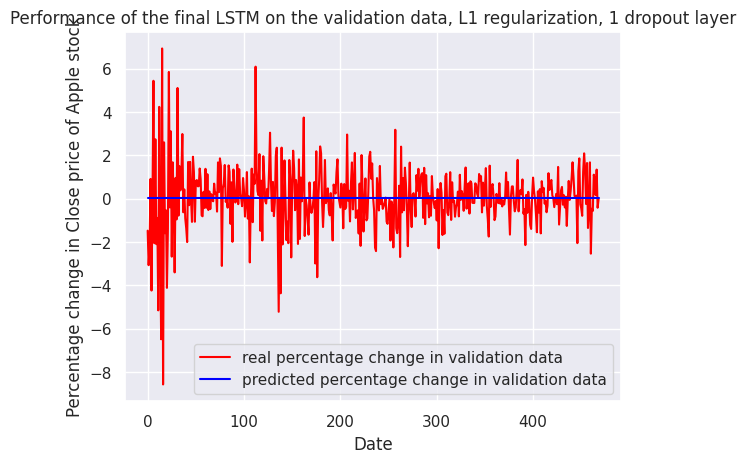

In [307]:
# Plot of percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm_dr.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, L1 regularization, 1 dropout layer")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

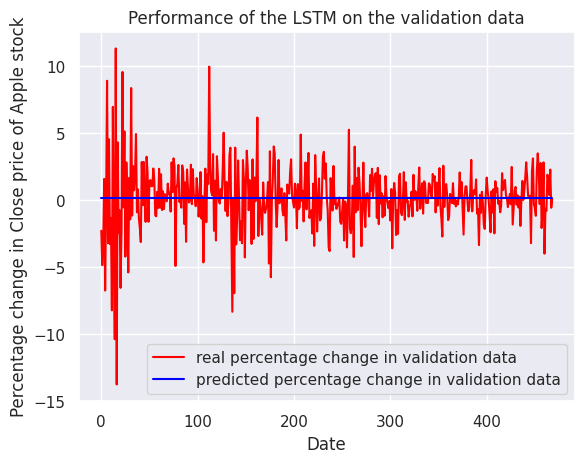

In [308]:
# Plot of percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_dr)

In [309]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_30_norm_dr.predict(X_val_30_std))

15/15 [==============================] - 0s 19ms/step


2.2149389200132656

In [310]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_dr)
y_pred_lstm_30_backtransform_final_dr = np.exp(np.cumsum(y_val_pred_lstm_inv_final_dr/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_dr = np.insert(y_pred_lstm_30_backtransform_final_dr, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_dr

array([ 78.19675446,  78.31794908,  78.43933159,  78.56090222,
        78.68266124,  78.80460897,  78.92674572,  79.04907176,
        79.17158739,  79.2942929 ,  79.41718859,  79.54027476,
        79.66355169,  79.78701967,  79.91067901,  80.03453002,
        80.15857298,  80.2828082 ,  80.40723595,  80.53185656,
        80.65667032,  80.7816775 ,  80.90687845,  81.03227345,
        81.15786279,  81.28364677,  81.40962571,  81.5357999 ,
        81.66216964,  81.78873523,  81.91549698,  82.0424552 ,
        82.16961019,  82.29696224,  82.42451169,  82.55225882,
        82.68020393,  82.80834734,  82.93668936,  83.06523028,
        83.19397041,  83.32291007,  83.45204961,  83.58138925,
        83.71092936,  83.84067026,  83.97061224,  84.1007556 ,
        84.23110069,  84.36164777,  84.4923972 ,  84.62334926,
        84.75450429,  84.8858626 ,  85.01742447,  85.14919024,
        85.28116023,  85.4133348 ,  85.54571417,  85.67829874,
        85.81108879,  85.94408465,  86.07728666,  86.21

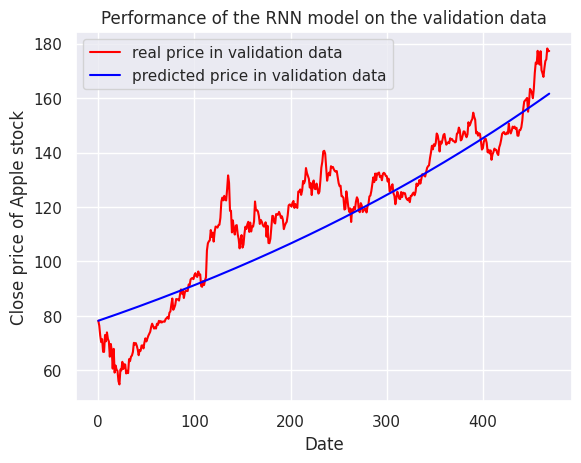

In [311]:
# Performance plot of LSTM, 1 Dropout
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_dr)

In [312]:
# MSE of data, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_dr)

5.790100849674696

In [313]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_dr)

139.50146840692187

#### 2 Dropout layers


Epoch 1/100
83/83 [==============================] - 19s 94ms/step - loss: 75.3489 - val_loss: 72.6823
Epoch 2/100
83/83 [==============================] - 5s 64ms/step - loss: 67.7398 - val_loss: 65.1340
Epoch 3/100
83/83 [==============================] - 5s 61ms/step - loss: 60.3156 - val_loss: 57.9040
Epoch 4/100
83/83 [==============================] - 6s 68ms/step - loss: 53.3031 - val_loss: 51.1076
Epoch 5/100
83/83 [==============================] - 5s 56ms/step - loss: 46.7158 - val_loss: 44.7503
Epoch 6/100
83/83 [==============================] - 4s 51ms/step - loss: 40.5832 - val_loss: 38.8357
Epoch 7/100
83/83 [==============================] - 6s 70ms/step - loss: 34.8953 - val_loss: 33.3641
Epoch 8/100
83/83 [==============================] - 5s 61ms/step - loss: 29.6276 - val_loss: 28.3302
Epoch 9/100
83/83 [==============================] - 4s 51ms/step - loss: 24.8131 - val_loss: 23.7412
Epoch 10/100
83/83 [==============================] - 8s 94ms/step - loss: 20.442

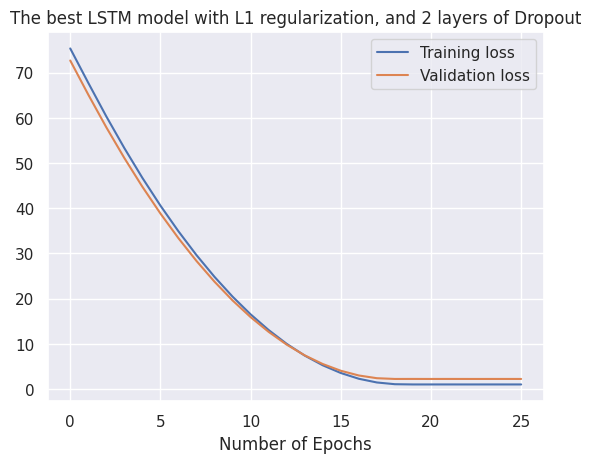

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 30, 50)            10400     
                                                                 
 lstm_13 (LSTM)              (None, 30, 50)            20200     
                                                                 
 lstm_14 (LSTM)              (None, 30, 50)            20200     
                                                                 
 dropout_6 (Dropout)         (None, 30, 50)            0         
                                                                 
 lstm_15 (LSTM)              (None, 50)                20200     
                                                                 
 dropout_7 (Dropout)         (None, 50)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                

None

In [53]:
## Dropout regularization (2 dropout layers)
from tensorflow import keras
lr_tuned = 0.001
opt_tuned = keras.optimizers.legacy.SGD(learning_rate=lr_tuned, decay=1e-7, momentum = 0.9, clipnorm=1.0,nesterov=False)
actfn_tuned = 'selu'

lstm_30_norm_dr_2 = keras.models.Sequential()
lstm_30_norm_dr_2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm_dr_2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_dr_2.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_dr_2.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_2.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm_dr_2.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_2.add(keras.layers.Dense(units=1))

lstm_30_norm_dr_2.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm_dr_2 = lstm_30_norm_dr_2.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm_dr_2.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with L1 regularization, and 2 layers of Dropout')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm_dr_2.summary())

In [54]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_dr_2.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_dr_2 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 14ms/step


15/15 [==============================] - 0s 14ms/step


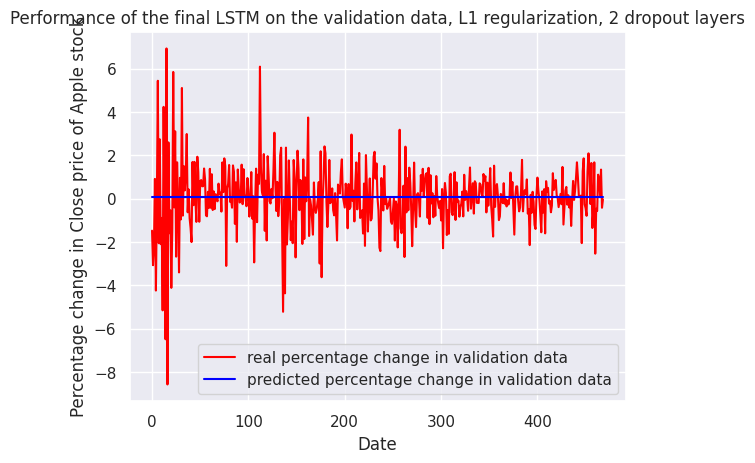

In [55]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm_dr_2.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, L1 regularization, 2 dropout layers")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

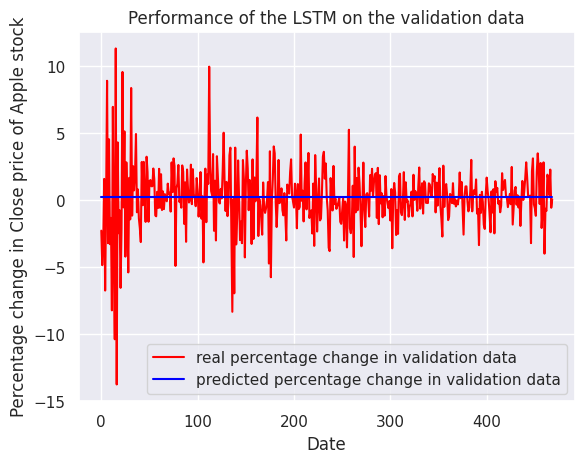

In [59]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_dr_2)

In [60]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_30_norm_dr_2.predict(X_val_30_std))

15/15 [==============================] - 0s 14ms/step


2.2148746344896297

In [61]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_dr_2)
y_pred_lstm_30_backtransform_final_dr_2 = np.exp(np.cumsum(y_val_pred_lstm_inv_final_dr_2/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_dr_2 = np.insert(y_pred_lstm_30_backtransform_final_dr_2, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_dr_2

array([ 78.19675446,  78.34507735,  78.49368158,  78.64256768,
        78.79173618,  78.94118764,  79.09092258,  79.24094152,
        79.39124501,  79.54183359,  79.69270781,  79.84386822,
        79.99531534,  80.14704972,  80.29907193,  80.45138248,
        80.60398194,  80.75687084,  80.91004976,  81.0635192 ,
        81.21727974,  81.37133194,  81.52567634,  81.68031351,
        81.83524399,  81.99046832,  82.1459871 ,  82.30180088,
        82.45791019,  82.61431563,  82.77101773,  82.92801705,
        83.08531416,  83.24290965,  83.40080405,  83.55899795,
        83.71749192,  83.8762865 ,  84.0353823 ,  84.19477986,
        84.35447976,  84.51448256,  84.67478887,  84.83539923,
        84.99631425,  85.15753449,  85.31906053,  85.48089295,
        85.64303231,  85.80547923,  85.96823428,  86.13129804,
        86.29467111,  86.45835405,  86.62234747,  86.78665195,
        86.95126808,  87.11619647,  87.28143768,  87.4469923 ,
        87.61286095,  87.77904422,  87.94554271,  88.11

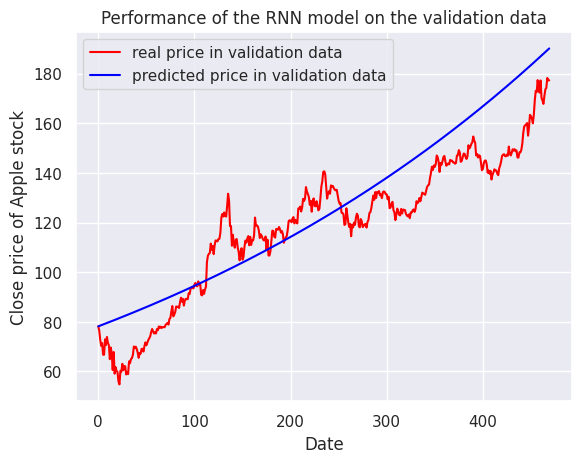

In [62]:
# Performance plot of LSTM, 2 dropout
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_dr_2)

In [63]:
# MSE of data, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_dr_2)

5.7899328000451264

In [64]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_dr_2)

223.7469258878209

#### 3 Dropout layers


Epoch 1/100
83/83 [==============================] - 10s 68ms/step - loss: 74.4956 - val_loss: 71.8739
Epoch 2/100
83/83 [==============================] - 5s 63ms/step - loss: 66.9345 - val_loss: 64.3467
Epoch 3/100
83/83 [==============================] - 4s 54ms/step - loss: 59.5501 - val_loss: 57.1465
Epoch 4/100
83/83 [==============================] - 6s 68ms/step - loss: 52.5821 - val_loss: 50.4261
Epoch 5/100
83/83 [==============================] - 5s 57ms/step - loss: 46.0660 - val_loss: 44.1361
Epoch 6/100
83/83 [==============================] - 4s 53ms/step - loss: 39.9976 - val_loss: 38.2869
Epoch 7/100
83/83 [==============================] - 6s 73ms/step - loss: 34.3596 - val_loss: 32.8712
Epoch 8/100
83/83 [==============================] - 4s 53ms/step - loss: 29.1666 - val_loss: 27.8994
Epoch 9/100
83/83 [==============================] - 4s 53ms/step - loss: 24.4071 - val_loss: 23.3585
Epoch 10/100
83/83 [==============================] - 6s 75ms/step - loss: 20.089

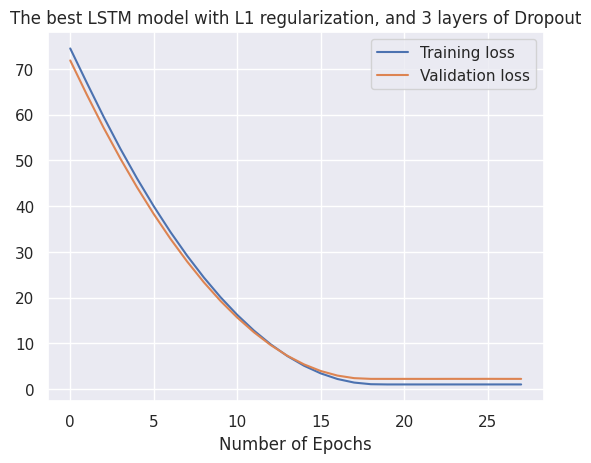

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (None, 30, 50)            10400     
                                                                 
 lstm_17 (LSTM)              (None, 30, 50)            20200     
                                                                 
 dropout_8 (Dropout)         (None, 30, 50)            0         
                                                                 
 lstm_18 (LSTM)              (None, 30, 50)            20200     
                                                                 
 dropout_9 (Dropout)         (None, 30, 50)            0         
                                                                 
 lstm_19 (LSTM)              (None, 50)                20200     
                                                                 
 dropout_10 (Dropout)        (None, 50)               

None

In [65]:
## Dropout regularization (3 dropout layers)
lstm_30_norm_dr_3 = keras.models.Sequential()
lstm_30_norm_dr_3.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm_dr_3.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_dr_3.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_3.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_dr_3.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_3.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm_dr_3.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_3.add(keras.layers.Dense(units=1))

lstm_30_norm_dr_3.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm_dr_3 = lstm_30_norm_dr_3.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm_dr_3.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with L1 regularization, and 3 layers of Dropout')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm_dr_3.summary())

In [66]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_dr_3.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_dr_3 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 14ms/step


15/15 [==============================] - 0s 14ms/step


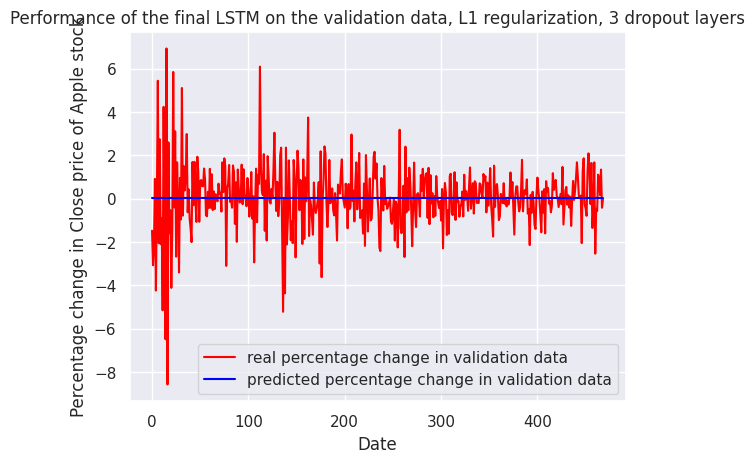

In [67]:
# Plot of percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm_dr_3.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, L1 regularization, 3 dropout layers")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

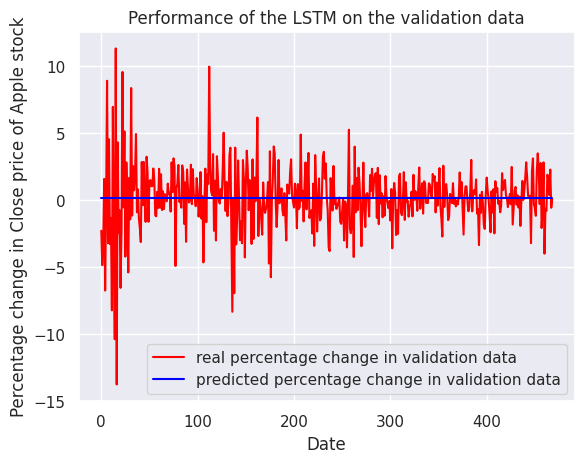

In [68]:
# Plot of percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_dr_3)

In [69]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_30_norm_dr_3.predict(X_val_30_std))

15/15 [==============================] - 0s 13ms/step


2.215283697093045

In [70]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_dr_3)
y_pred_lstm_30_backtransform_final_dr_3 = np.exp(np.cumsum(y_val_pred_lstm_inv_final_dr_3/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_dr_3 = np.insert(y_pred_lstm_30_backtransform_final_dr_3, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_dr_3

array([ 78.19675446,  78.30527139,  78.41393891,  78.52275724,
        78.63172658,  78.74084714,  78.85011914,  78.95954277,
        79.06911825,  79.1788458 ,  79.28872563,  79.39875792,
        79.50894292,  79.61928082,  79.72977185,  79.8404162 ,
        79.9512141 ,  80.06216576,  80.1732714 ,  80.28453122,
        80.39594545,  80.50751429,  80.61923795,  80.73111666,
        80.84315063,  80.95534007,  81.0676852 ,  81.18018625,
        81.29284342,  81.40565692,  81.51862698,  81.63175381,
        81.74503764,  81.85847867,  81.97207712,  82.08583323,
        82.1997472 ,  82.31381925,  82.42804959,  82.54243846,
        82.65698607,  82.77169265,  82.88655841,  83.00158357,
        83.11676837,  83.23211301,  83.34761772,  83.46328272,
        83.57910824,  83.69509449,  83.8112417 ,  83.9275501 ,
        84.0440199 ,  84.16065132,  84.27744461,  84.39439997,
        84.51151764,  84.62879784,  84.74624079,  84.86384672,
        84.98161586,  85.09954843,  85.21764466,  85.33

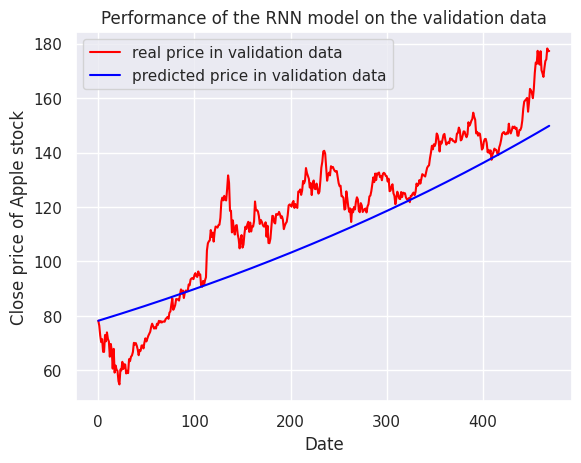

In [71]:
# Performance plot of LSTM, 3 Dropout
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_dr_3)

In [72]:
# MSE of data, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_dr_3)

5.7910021359560195

In [73]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_dr_3)

219.47757421853137

#### 4 Dropout layers


Epoch 1/100
83/83 [==============================] - 11s 65ms/step - loss: 75.5449 - val_loss: 72.8764
Epoch 2/100
83/83 [==============================] - 6s 69ms/step - loss: 67.9236 - val_loss: 65.3153
Epoch 3/100
83/83 [==============================] - 5s 57ms/step - loss: 60.5427 - val_loss: 58.1294
Epoch 4/100
83/83 [==============================] - 4s 53ms/step - loss: 53.5446 - val_loss: 51.3523
Epoch 5/100
83/83 [==============================] - 6s 75ms/step - loss: 47.0003 - val_loss: 45.0378
Epoch 6/100
83/83 [==============================] - 7s 87ms/step - loss: 40.8790 - val_loss: 39.1324
Epoch 7/100
83/83 [==============================] - 9s 111ms/step - loss: 35.1798 - val_loss: 33.6614
Epoch 8/100
83/83 [==============================] - 8s 96ms/step - loss: 29.9244 - val_loss: 28.6248
Epoch 9/100
83/83 [==============================] - 10s 115ms/step - loss: 25.1037 - val_loss: 24.0227
Epoch 10/100
83/83 [==============================] - 10s 116ms/step - loss: 2

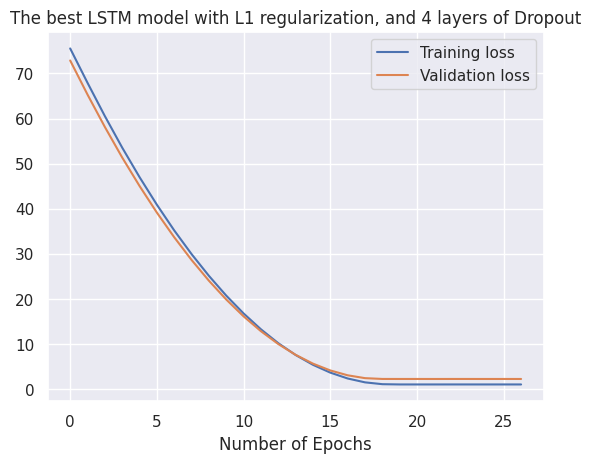

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_20 (LSTM)              (None, 30, 50)            10400     
                                                                 
 dropout_11 (Dropout)        (None, 30, 50)            0         
                                                                 
 lstm_21 (LSTM)              (None, 30, 50)            20200     
                                                                 
 dropout_12 (Dropout)        (None, 30, 50)            0         
                                                                 
 lstm_22 (LSTM)              (None, 30, 50)            20200     
                                                                 
 dropout_13 (Dropout)        (None, 30, 50)            0         
                                                                 
 lstm_23 (LSTM)              (None, 50)               

None

In [74]:
## Dropout regularization (4 dropout layers)
lstm_30_norm_dr_4 = keras.models.Sequential()
lstm_30_norm_dr_4.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, input_shape=(X_train_30_std.shape[1],1)))
lstm_30_norm_dr_4.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_4.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_dr_4.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_4.add(keras.layers.LSTM(units=50, return_sequences=True, activation = actfn_tuned, kernel_regularizer=keras.regularizers.L1(0.05)))
lstm_30_norm_dr_4.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_4.add(keras.layers.LSTM(units=50, return_sequences=False, activation = actfn_tuned))
lstm_30_norm_dr_4.add(keras.layers.Dropout(0.2))
lstm_30_norm_dr_4.add(keras.layers.Dense(units=1))

lstm_30_norm_dr_4.compile(optimizer=opt_tuned, loss = "mean_squared_error")
history_lstm_30_norm_dr_4 = lstm_30_norm_dr_4.fit(X_train_30_std, y_train_30_std, epochs = n_epoch_bs, batch_size = batch_size_bs, validation_data = (X_val_30_std, y_val_30_std),callbacks=early_stopping)

pd.DataFrame(history_lstm_30_norm_dr_4.history).plot()
plt.xlabel("Number of Epochs")
plt.title(f'The best LSTM model with L1 regularization, and 4 layers of Dropout')
plt.legend(['Training loss', 'Validation loss'])
plt.show()

display(lstm_30_norm_dr_4.summary())

In [75]:
# Inverse transform the datasets
temp_pred_1 = np.zeros(shape=(len(X_val_30_std), val_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_dr_4.predict(X_val_30_std)[:,0]
y_val_pred_lstm_inv_final_dr_4 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

15/15 [==============================] - 1s 14ms/step


15/15 [==============================] - 0s 15ms/step


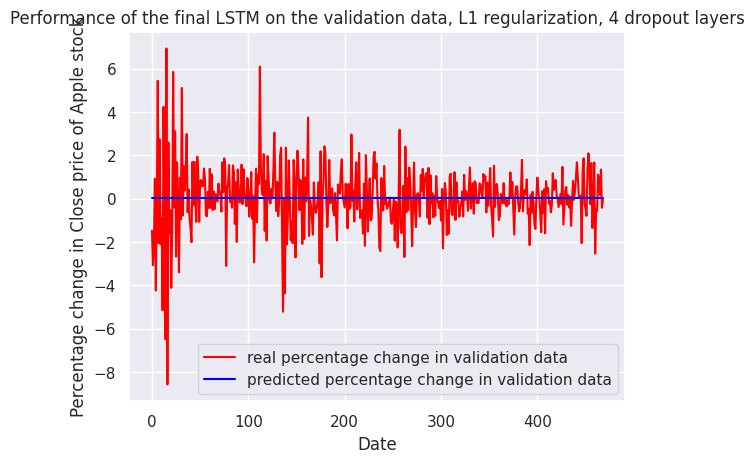

In [76]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_val_30_std, color="red", label="real percentage change in validation data")
plt.plot(lstm_30_norm_dr_4.predict(X_val_30_std), color="blue", label="predicted percentage change in validation data")
plt.title("Performance of the final LSTM on the validation data, L1 regularization, 4 dropout layers")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

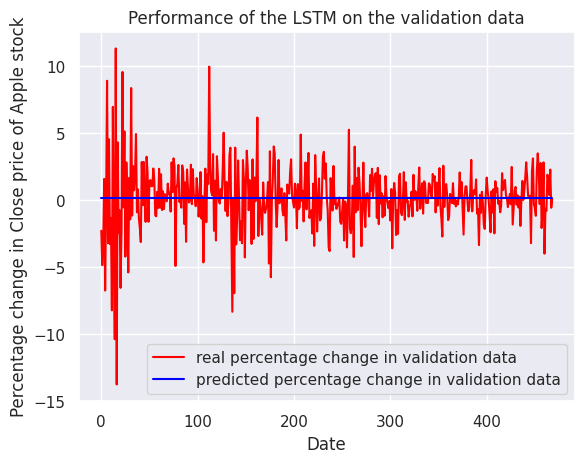

In [77]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_val_inv_30, y_val_pred_lstm_inv_final_dr_4)

In [78]:
# MSE of standard scaled dataset
mean_squared_error(y_val_30_std, lstm_30_norm_dr_4.predict(X_val_30_std))

15/15 [==============================] - 0s 15ms/step


2.214820095920352

In [79]:
# Tranform back percentage change to price of prediction (y_val_pred_lstm_inv_final_dr_4)
y_pred_lstm_30_backtransform_final_dr_4 = np.exp(np.cumsum(y_val_pred_lstm_inv_final_dr_4/100)) * apple_val_ts.close[30]
y_pred_lstm_30_backtransform_final_dr_4 = np.insert(y_pred_lstm_30_backtransform_final_dr_4, 0, apple_val_ts.close[30])
y_pred_lstm_30_backtransform_final_dr_4

array([ 78.19675446,  78.32644361,  78.45634784,  78.58646755,
        78.71680305,  78.8473547 ,  78.97812284,  79.10910789,
        79.24031017,  79.37173007,  79.50336792,  79.63522409,
        79.76729892,  79.89959281,  80.03210609,  80.1648392 ,
        80.29779241,  80.43096613,  80.5643607 ,  80.69797653,
        80.83181395,  80.96587334,  81.10015508,  81.23465953,
        81.36938706,  81.50433802,  81.63951281,  81.77491182,
        81.91053532,  82.04638376,  82.1824575 ,  82.31875694,
        82.45528247,  82.59203439,  82.72901312,  82.86621899,
        83.00365245,  83.14131386,  83.27920356,  83.41732193,
        83.55566937,  83.6942463 ,  83.83305303,  83.97209   ,
        84.11135755,  84.2508561 ,  84.390586  ,  84.53054764,
        84.67074139,  84.81116762,  84.95182678,  85.09271922,
        85.23384532,  85.37520547,  85.51680007,  85.65862955,
        85.8006942 ,  85.94299446,  86.08553072,  86.22830341,
        86.37131288,  86.51455953,  86.65804373,  86.80

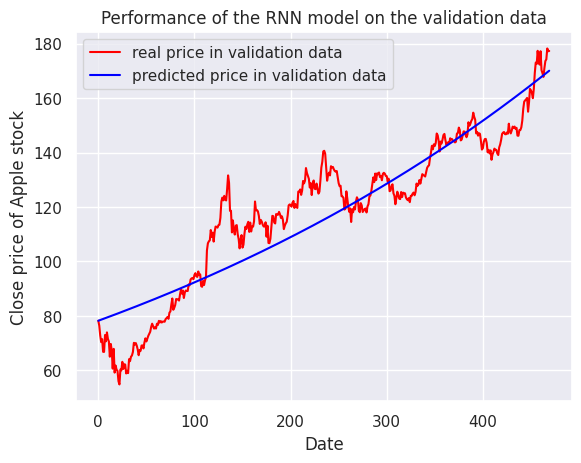

In [80]:
# Performance plot of LSTM, 4 dropout
plot_real_price(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_dr_4)

In [81]:
# MSE of the data, after inverse transform
mean_squared_error(y_val_inv_30, y_val_pred_lstm_inv_final_dr_4)

5.789790230056645

In [82]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform,y_pred_lstm_30_backtransform_final_dr_4)

124.60765939261991

## Price Prediction


In [83]:
# Inverse transform the prediction on test set
temp_pred_1 = np.zeros(shape=(len(X_test_30_std), test_30.shape[1]))
temp_pred_1[:,-1] = lstm_30_norm_dr_4.predict(X_test_30_std)[:,0]
y_test_lstm_inv_final = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

13/13 [==============================] - 0s 22ms/step


13/13 [==============================] - 0s 22ms/step


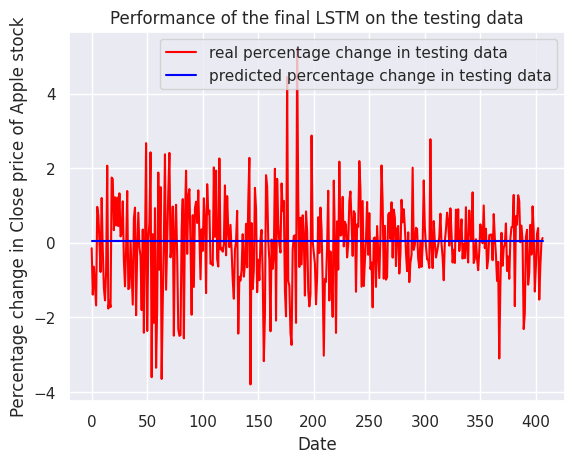

In [84]:
# Plot percentage changes in close price, standard scaled datasets
plt.plot(y_test_30_std, color="red", label="real percentage change in testing data")
plt.plot(lstm_30_norm_dr_4.predict(X_test_30_std), color="blue", label="predicted percentage change in testing data")
plt.title("Performance of the final LSTM on the testing data")
plt.xlabel("Date")
plt.ylabel("Percentage change in Close price of Apple stock")
plt.legend()
plt.show()

In [85]:
# Inverse transform the y_test
temp_pred = np.zeros(shape=(len(X_test_30_std), test_30.shape[1]))
temp_pred[:,-1] = y_test_30_std
y_test_inv_30 = std_scaler_30.inverse_transform(temp_pred)[:,-1]

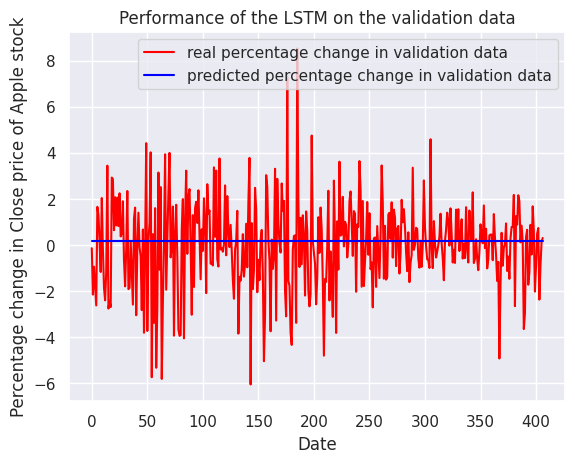

In [86]:
# Plot percentage changes in close price, after inverse transform
plot_lstm(y_test_inv_30, y_test_lstm_inv_final)

In [87]:
# MSE of standard scaled dataset
mean_squared_error(y_test_30_std, lstm_30_norm_dr_4.predict(X_test_30_std))

13/13 [==============================] - 1s 35ms/step


1.4226483336127598

In [88]:
# Tranform back percentage change to price of prediction (y_test_lstm_inv_final)
y_pred_lstm_30_backtransform_final_test = np.exp(np.cumsum(y_test_lstm_inv_final/100)) * apple_test_ts.close[30]
y_pred_lstm_30_backtransform_final_test = np.insert(y_pred_lstm_30_backtransform_final_test, 0, apple_test_ts.close[30])
y_pred_lstm_30_backtransform_final_test

array([171.05569458, 171.33939008, 171.62355605, 171.9081934 ,
       172.19330281, 172.4788851 , 172.76494094, 173.05147122,
       173.33847672, 173.62595819, 173.91391655, 174.20235243,
       174.49126666, 174.78066008, 175.07053336, 175.36088747,
       175.65172315, 175.94304115, 176.23484225, 176.52712733,
       176.81989718, 177.1131527 , 177.40689447, 177.70112344,
       177.99584044, 178.29104621, 178.58674157, 178.88292732,
       179.17960425, 179.47677326, 179.77443517, 180.07259071,
       180.37124074, 180.67038605, 180.9700275 , 181.27016591,
       181.57080213, 181.87193696, 182.17357122, 182.4757057 ,
       182.77834129, 183.08147883, 183.38511913, 183.68926298,
       183.99391125, 184.29906476, 184.60472435, 184.91089086,
       185.21756518, 185.52474812, 185.83244049, 186.14064324,
       186.44935706, 186.75858289, 187.06832167, 187.37857413,
       187.68934111, 188.00062351, 188.31242218, 188.62473796,
       188.9375717 , 189.25092429, 189.56479661, 189.87

In [90]:
# Tranform back percentage change to price (y_test_inv_30)
y_lstm_30_backtransform_test = np.exp(np.cumsum(y_test_inv_30/100)) * apple_test_ts.close[30]
y_lstm_30_backtransform_test = np.insert(y_lstm_30_backtransform_test, 0, apple_test_ts.close[30])
y_lstm_30_backtransform_test

array([171.05569458, 170.81813049, 167.18495178, 165.62080383,
       162.67071533, 158.46337891, 161.10658264, 163.19540405,
       163.46270752, 161.56196594, 164.88824463, 164.56155396,
       161.53224182, 157.70111084, 155.85977173, 161.31446838,
       156.92893982, 153.17697144, 149.10820007, 153.53335571,
       157.98817444, 159.00785828, 162.3341217 , 163.72009277,
       167.12554932, 168.50163269, 172.32287598, 172.96635437,
       173.8374939 , 177.16378784, 175.98571777, 172.85745239,
       172.56045532, 176.64901733, 173.30291748, 170.10533142,
       170.41223145, 168.3828125 , 164.08638   , 165.97721863,
       168.68969727, 163.6309967 , 163.41319275, 165.7197876 ,
       165.55151367, 164.74963379, 160.16609192, 161.24519348,
       155.22622681, 154.99853516, 161.99755859, 156.06765747,
       156.37457275, 157.87930298, 164.35366821, 155.19650269,
       155.93014526, 150.75494385, 153.18389893, 145.24266052,
       141.33647156, 145.84744263, 144.29090881, 147.95

In [91]:
# MSE of close prices
mean_squared_error(y_lstm_30_backtransform_test,y_pred_lstm_30_backtransform_final_test)

8936.62065715743

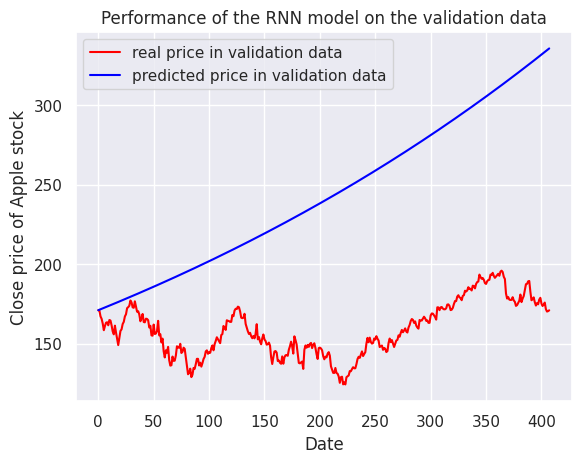

In [92]:
# Performance plot of the final LSTM on test set
plot_real_price(y_lstm_30_backtransform_test,y_pred_lstm_30_backtransform_final_test)

In [94]:
# Dataframe a difference of y_test and prediction
y_lstm_30_backtransform_df = pd.DataFrame(y_lstm_30_backtransform)
y_lstm_30_backtransform_df.columns = ["val"]
y_lstm_30_backtransform_df['type_v'] = "Real_validation"

y_lstm_30_backtransform_test_df = pd.DataFrame(y_lstm_30_backtransform_test)
y_lstm_30_backtransform_test_df.columns = ["val"]
y_lstm_30_backtransform_test_df['type_v'] = "Real_testing"

y_pred_lstm_30_backtransform_df = pd.DataFrame(y_pred_lstm_30_backtransform_final_dr_4)
y_pred_lstm_30_backtransform_df.columns = ["val"]
y_pred_lstm_30_backtransform_df['type_v'] = "Predicted_validation"

y_pred_lstm_30_backtransform_final_test_df = pd.DataFrame(y_pred_lstm_30_backtransform_final_test)
y_pred_lstm_30_backtransform_final_test_df.columns = ["val"]
y_pred_lstm_30_backtransform_final_test_df['type_v'] = "Predicted_testing"

y_real = pd.concat([y_lstm_30_backtransform_df, y_lstm_30_backtransform_test_df], axis = 0).reset_index(drop = True)
y_real['type_v'] = y_real['type_v'].astype('category')
y_pred = pd.concat([y_pred_lstm_30_backtransform_df, y_pred_lstm_30_backtransform_final_test_df], axis = 0).reset_index(drop = True)
y_pred['type_v'] = y_pred['type_v'].astype('category')

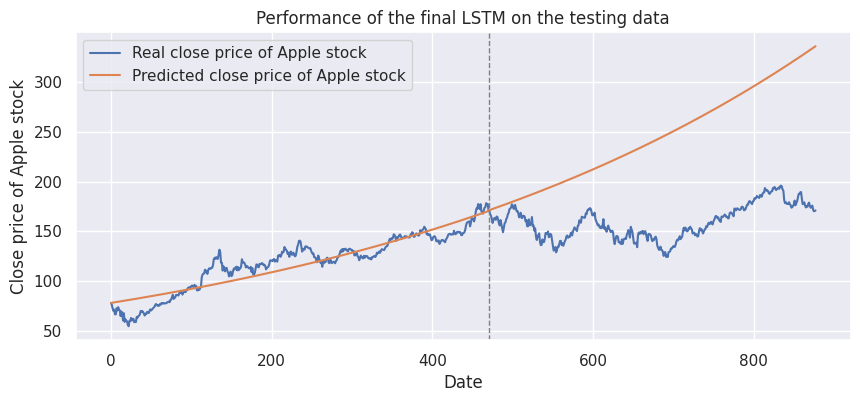

In [97]:
# Plot model performance on validation and testing set
fig,ax = plt.subplots(figsize = (10,4))
y_real.val.plot(label = 'Real close price of Apple stock')
y_pred.val.plot(label = 'Predicted close price of Apple stock')
plt.axvline(x = len(y_lstm_30_backtransform), color = 'gray', linestyle = '--', linewidth = '1')
plt.title("Performance of the final LSTM on the testing data")
plt.xlabel("Date")
plt.ylabel("Close price of Apple stock")
plt.legend()
plt.show()

## Evaluate model performance on other stocks


In [98]:
# List of stocks in the dataset
list_of_stock = list(test_data.tic.unique())
list_of_stock

['AAPL',
 'AMGN',
 'AXP',
 'BA',
 'CAT',
 'CRM',
 'CSCO',
 'CVX',
 'DIS',
 'DOW',
 'GS',
 'HD',
 'HON',
 'IBM',
 'INTC',
 'JNJ',
 'JPM',
 'KO',
 'MCD',
 'MMM',
 'MRK',
 'MSFT',
 'NKE',
 'PG',
 'TRV',
 'UNH',
 'V',
 'VZ',
 'WBA',
 'WMT']

13/13 [==============================] - 0s 22ms/step


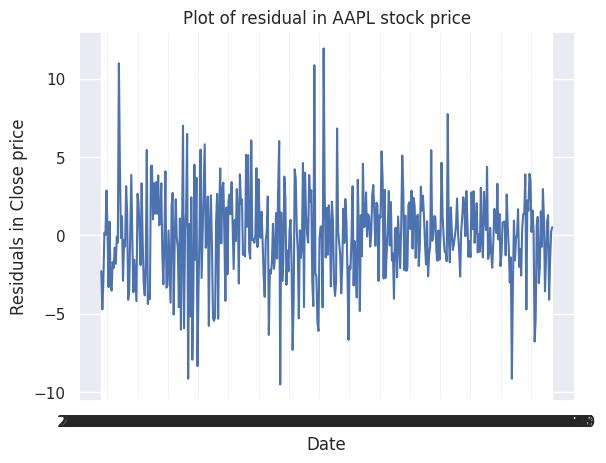

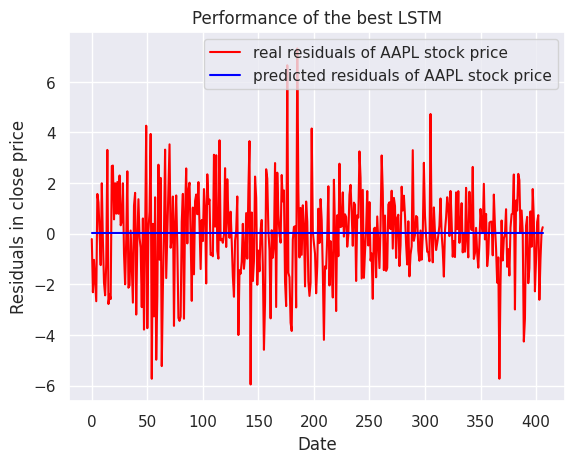

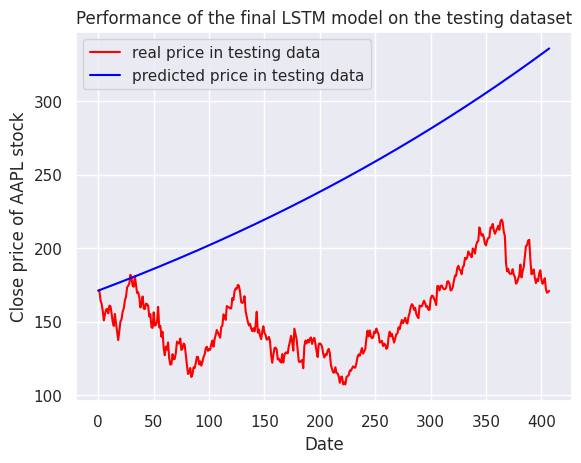

13/13 [==============================] - 0s 14ms/step


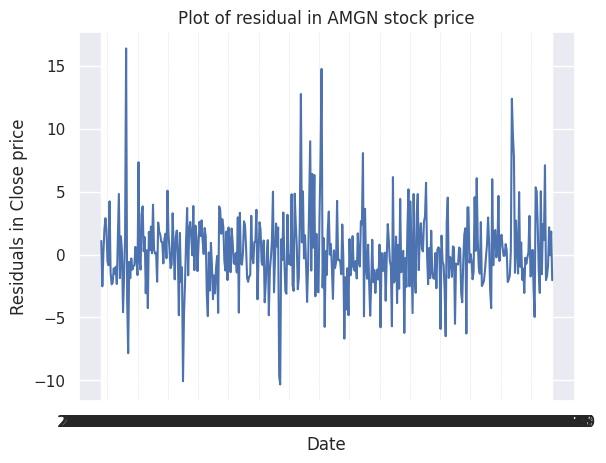

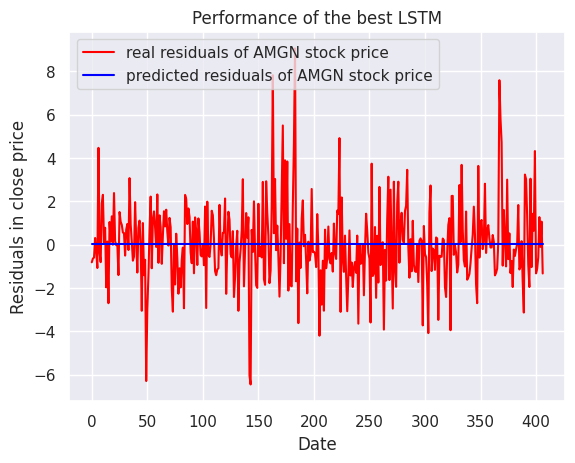

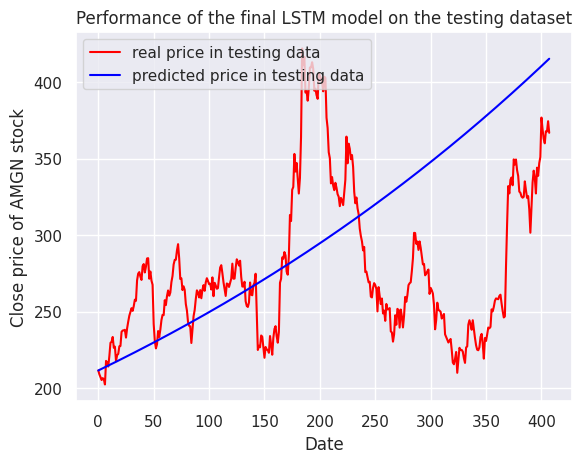

13/13 [==============================] - 0s 15ms/step


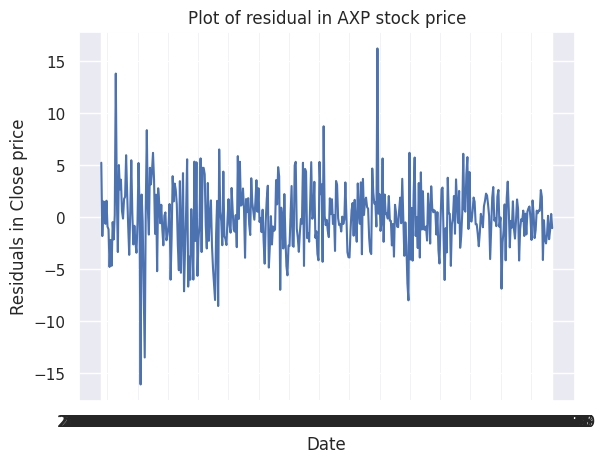

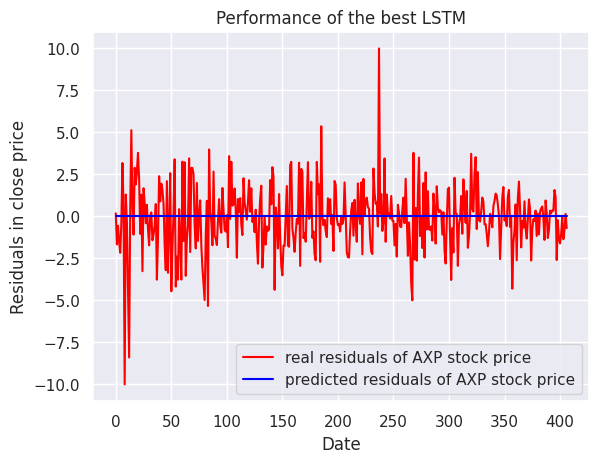

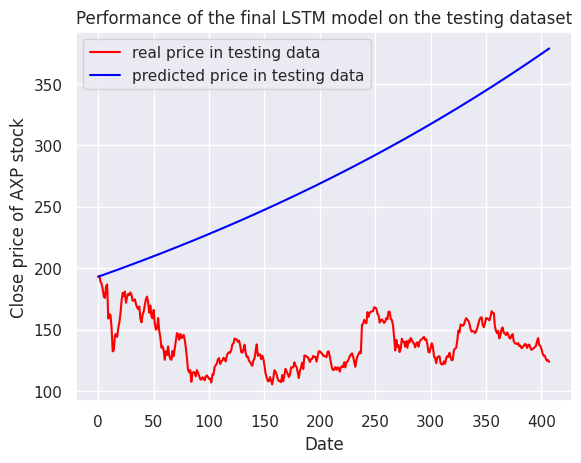

13/13 [==============================] - 0s 16ms/step


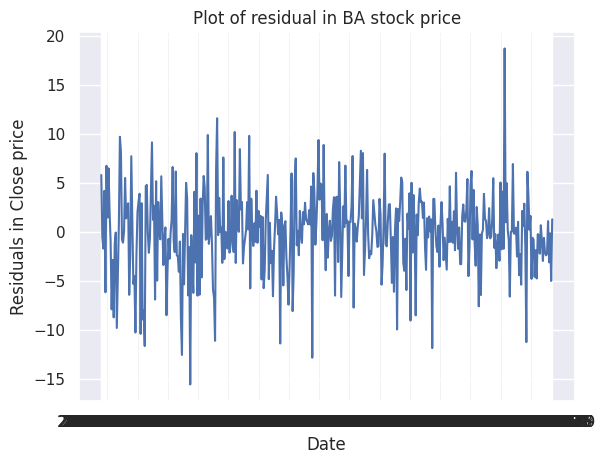

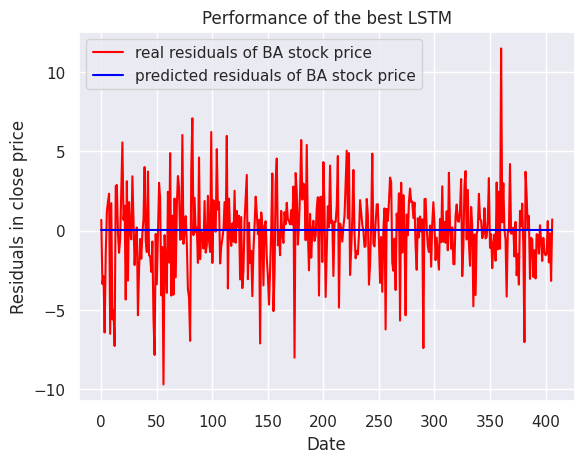

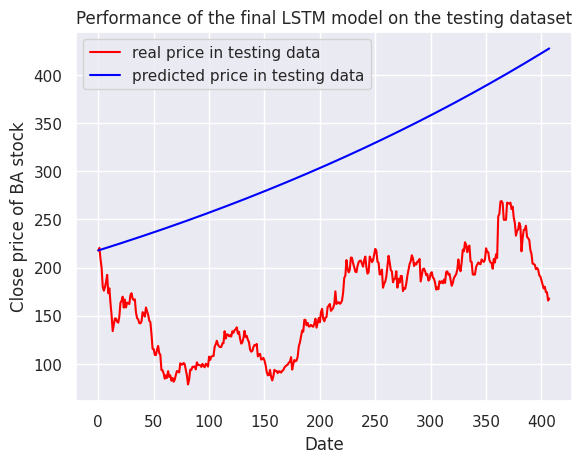

13/13 [==============================] - 0s 18ms/step


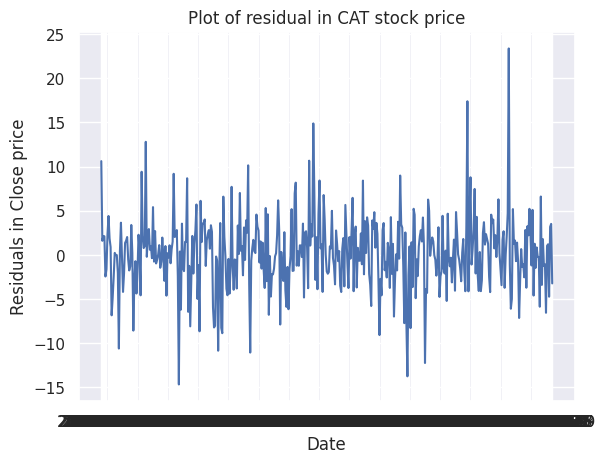

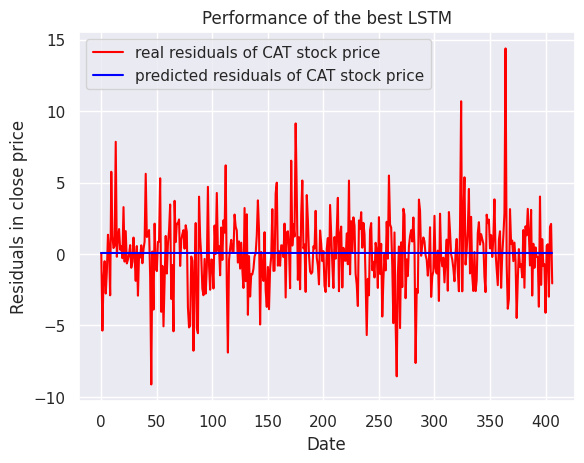

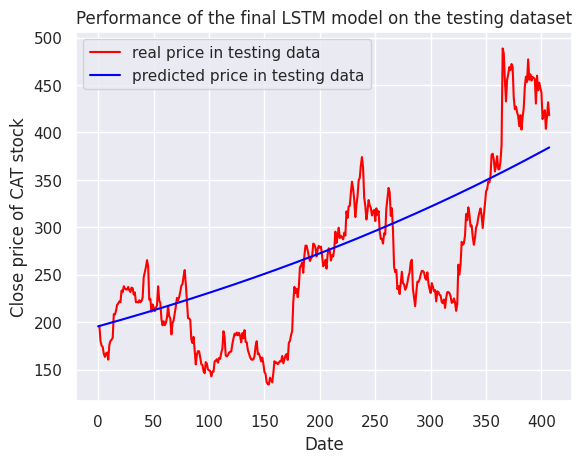

13/13 [==============================] - 0s 24ms/step


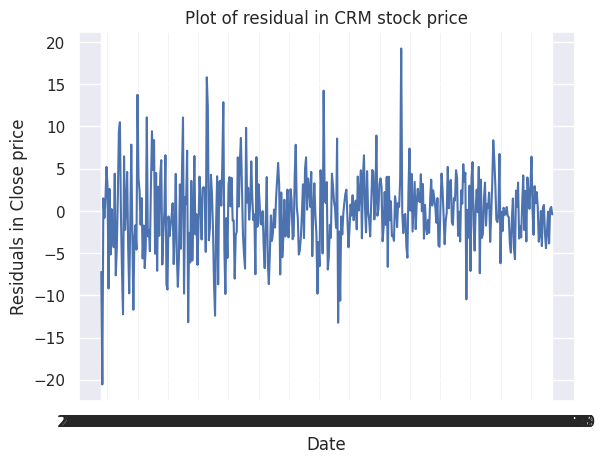

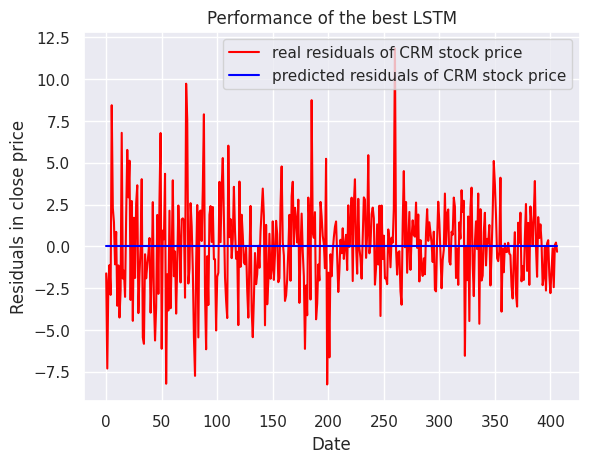

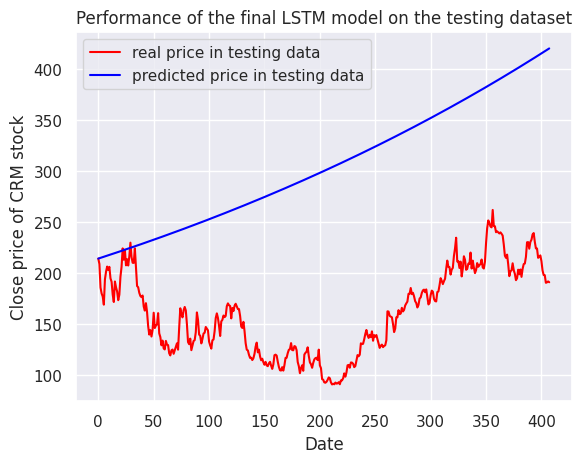

13/13 [==============================] - 0s 24ms/step


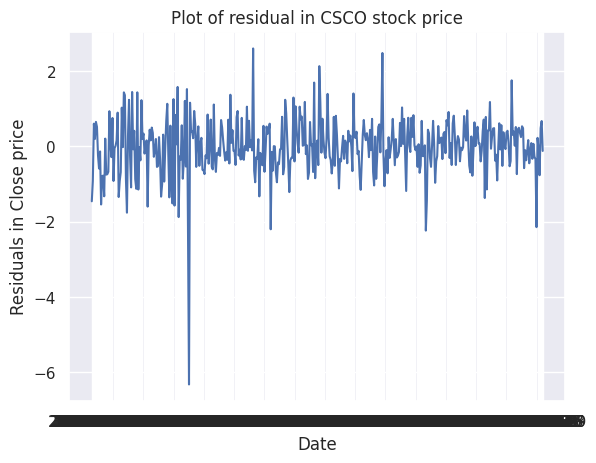

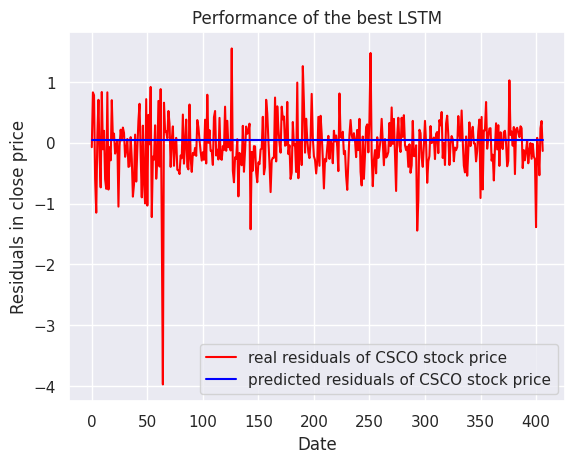

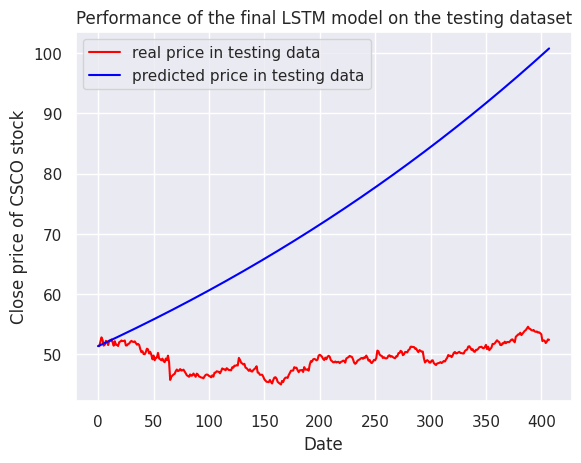

13/13 [==============================] - 0s 18ms/step


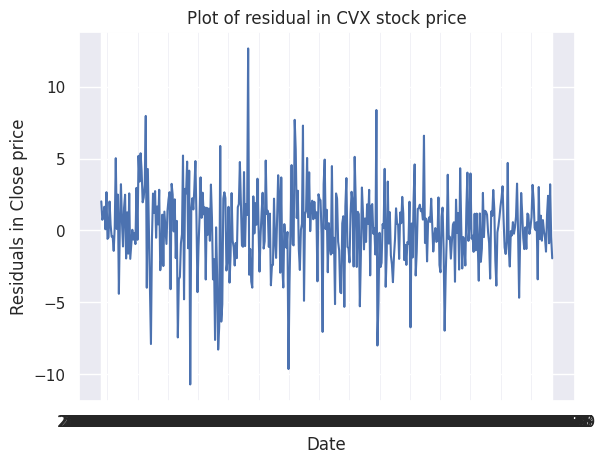

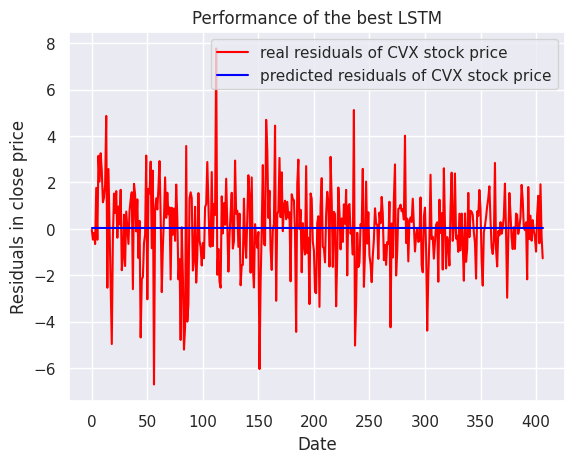

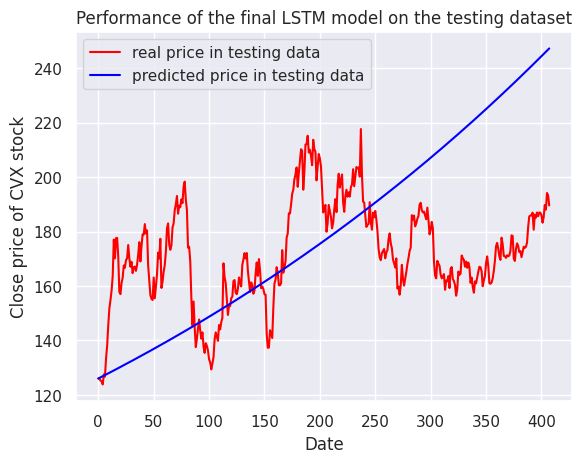

13/13 [==============================] - 0s 21ms/step


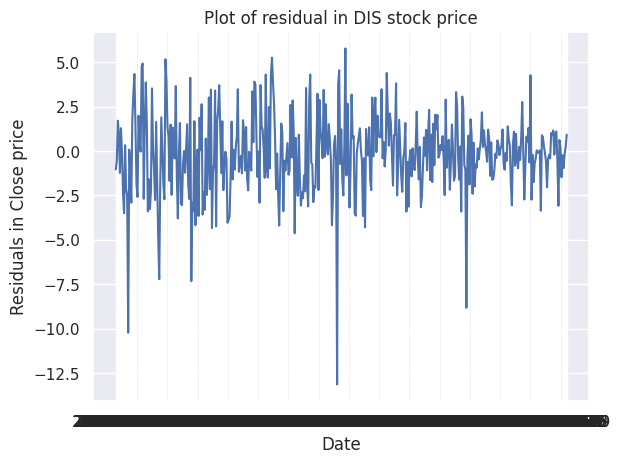

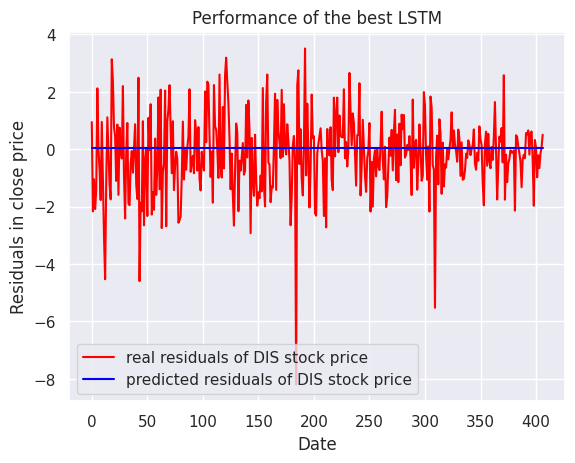

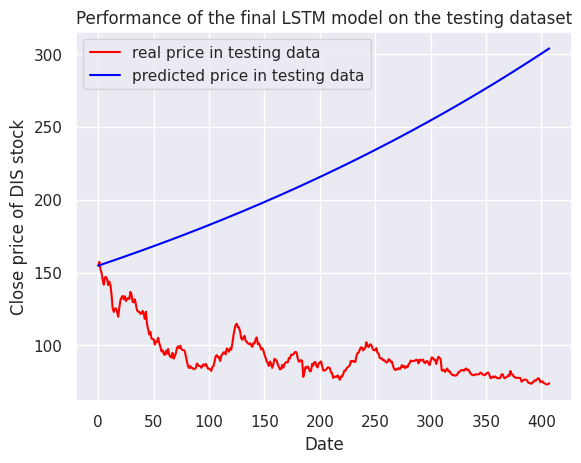

13/13 [==============================] - 0s 19ms/step


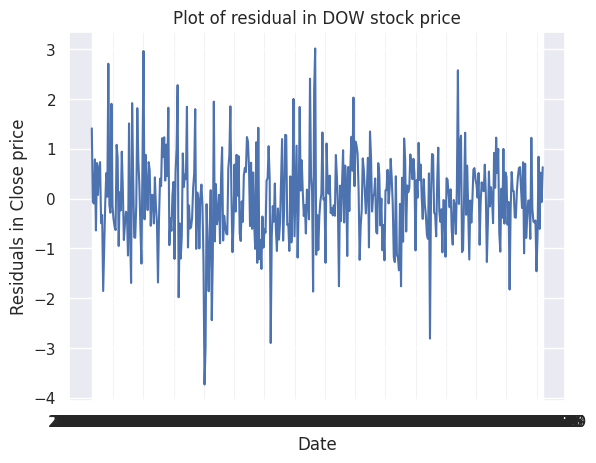

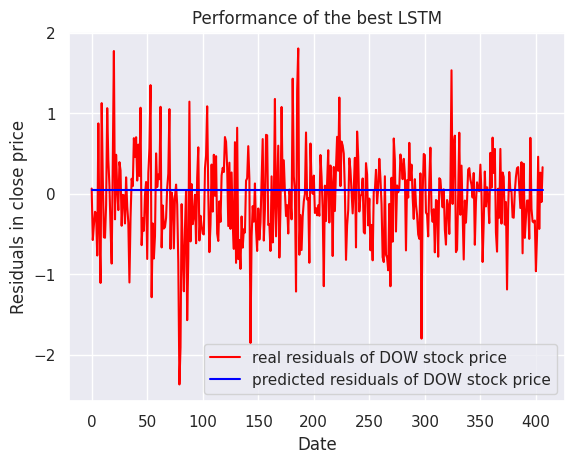

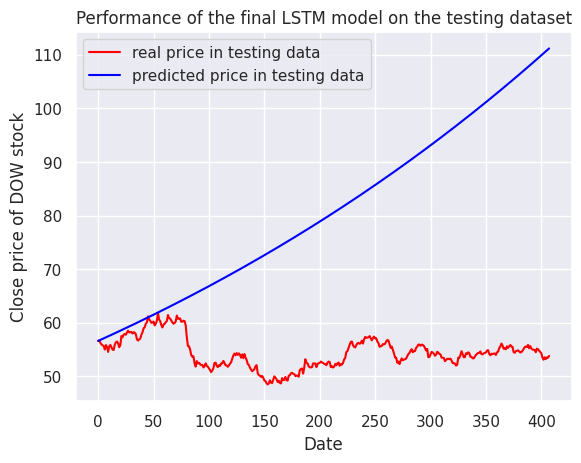

13/13 [==============================] - 0s 21ms/step


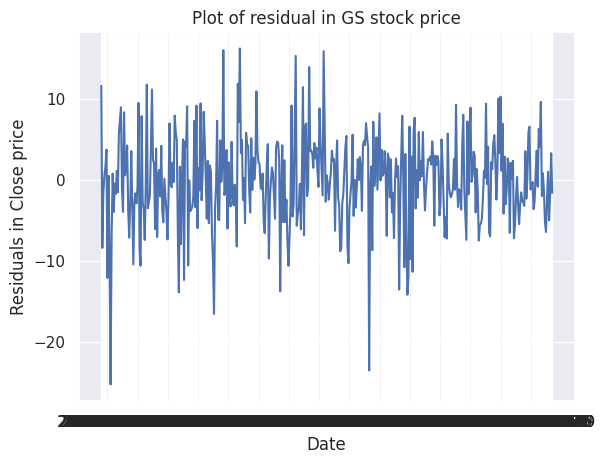

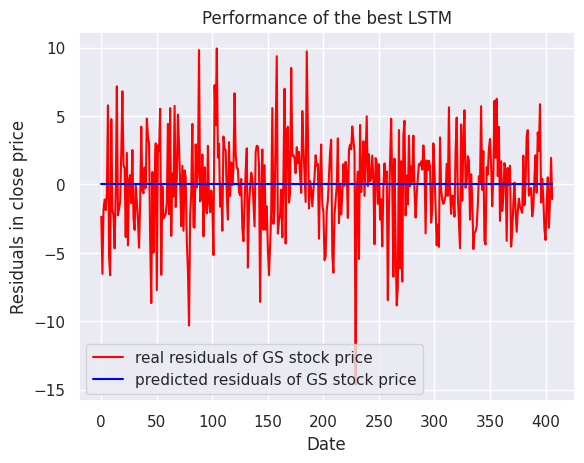

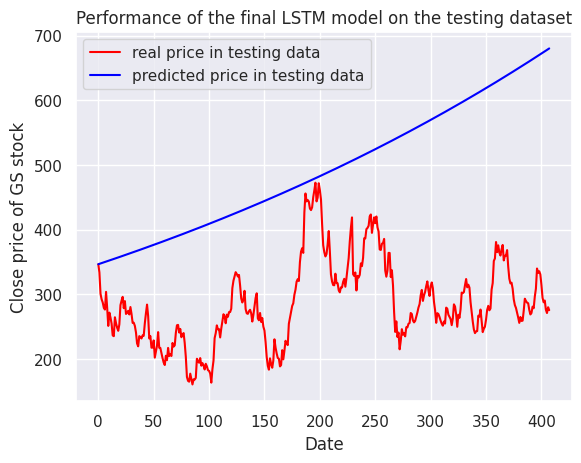

13/13 [==============================] - 0s 21ms/step


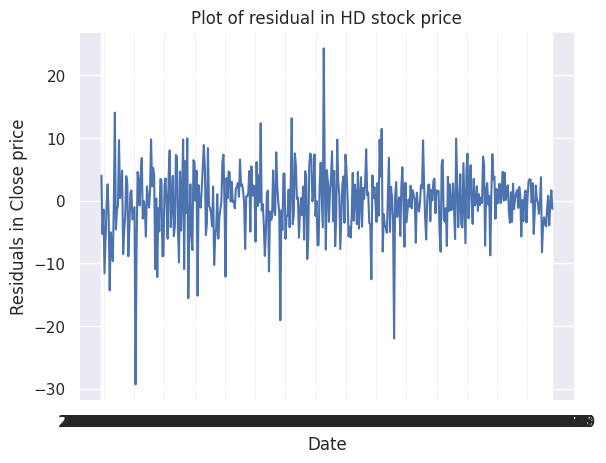

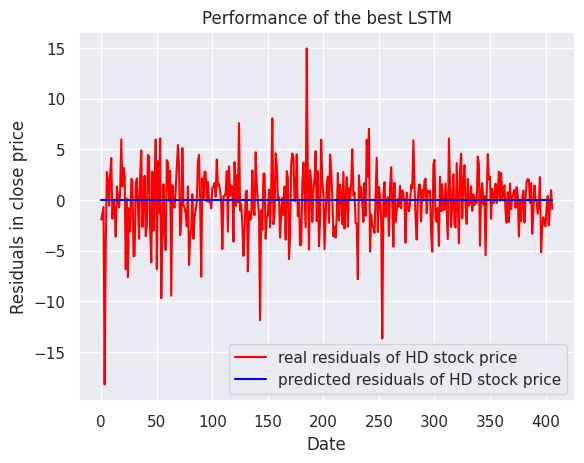

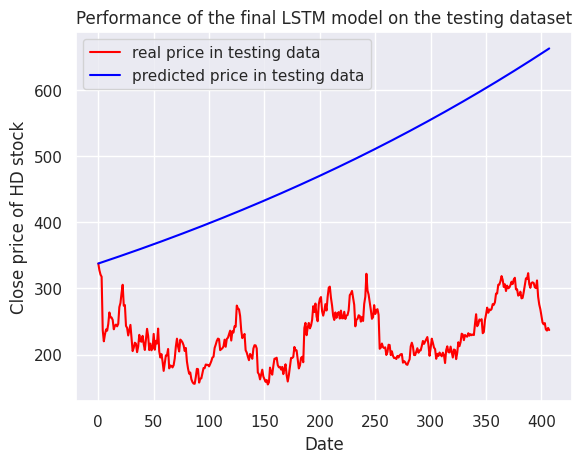

13/13 [==============================] - 0s 24ms/step


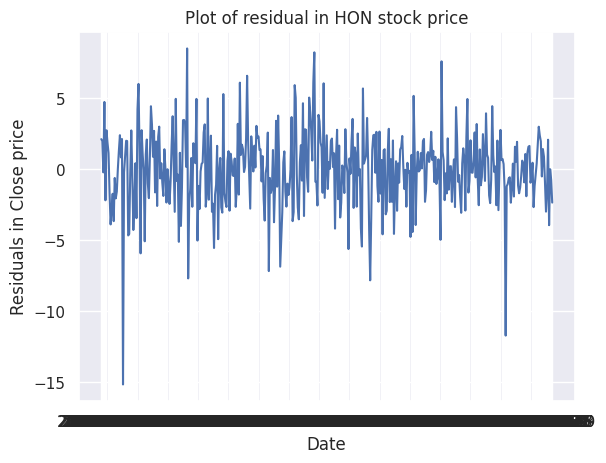

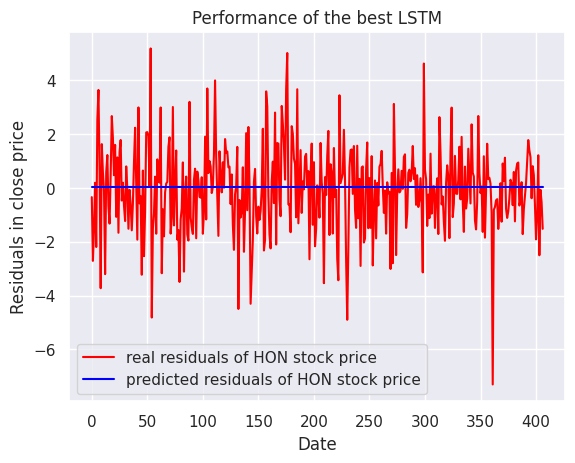

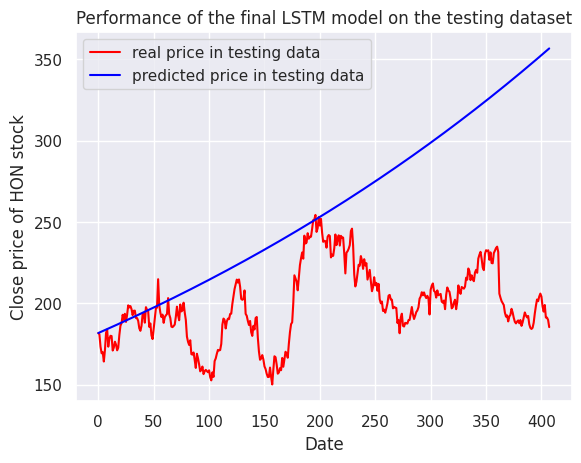

13/13 [==============================] - 0s 21ms/step


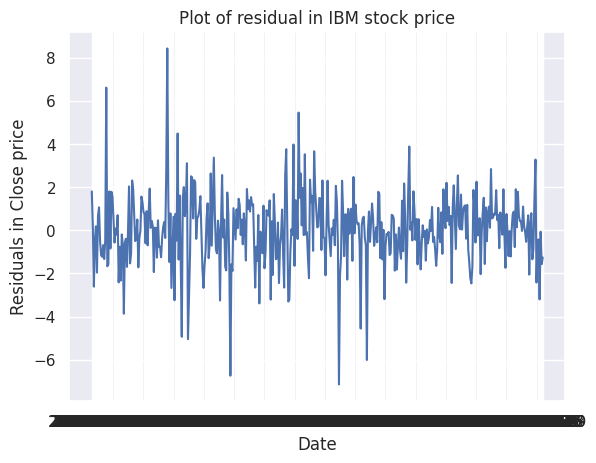

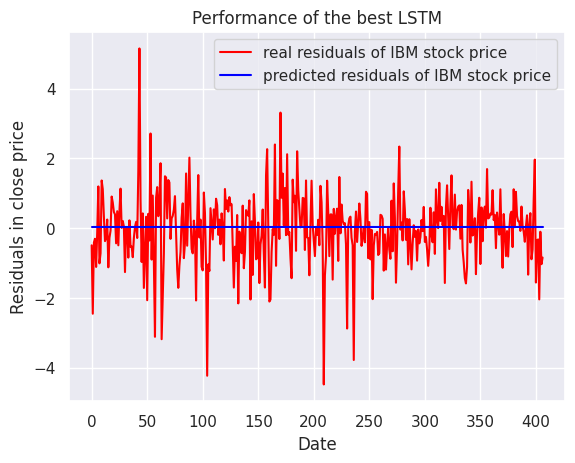

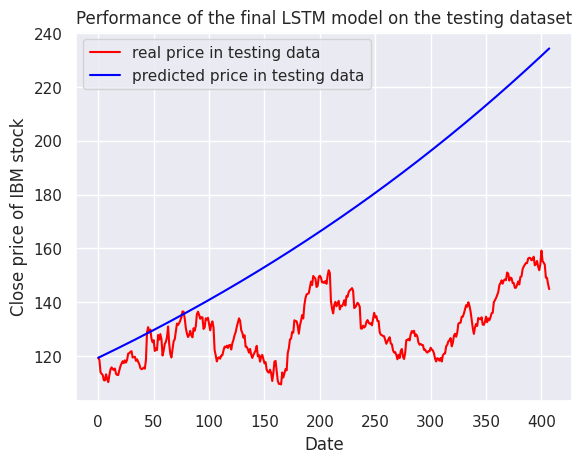

13/13 [==============================] - 0s 21ms/step


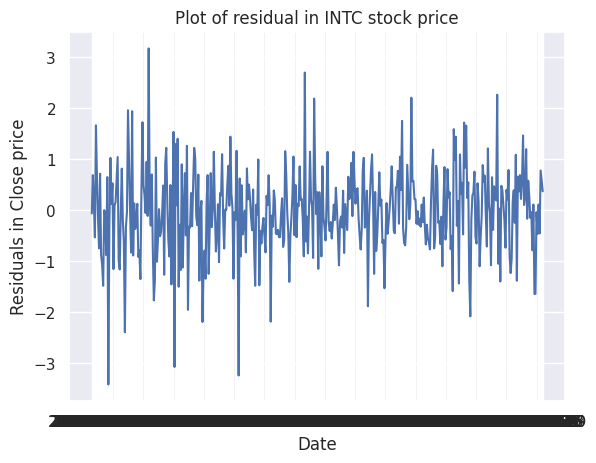

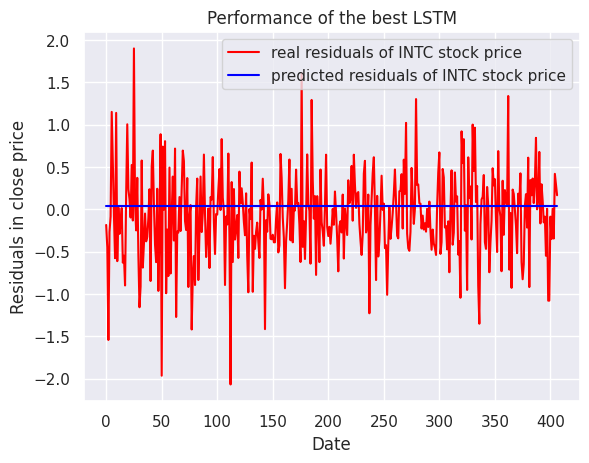

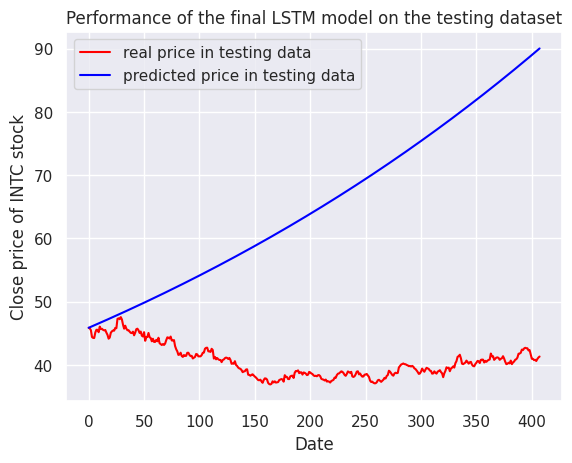

13/13 [==============================] - 0s 21ms/step


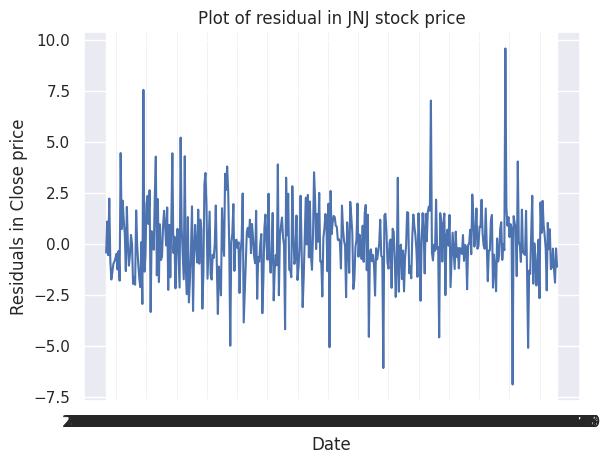

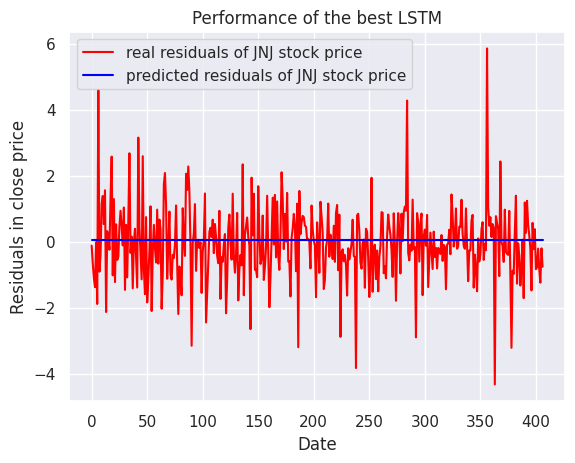

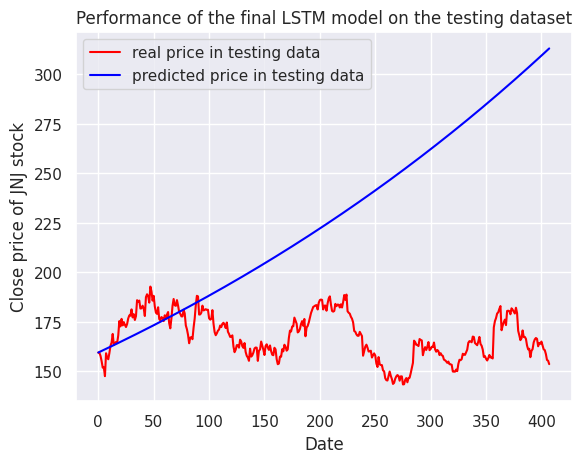

13/13 [==============================] - 0s 23ms/step


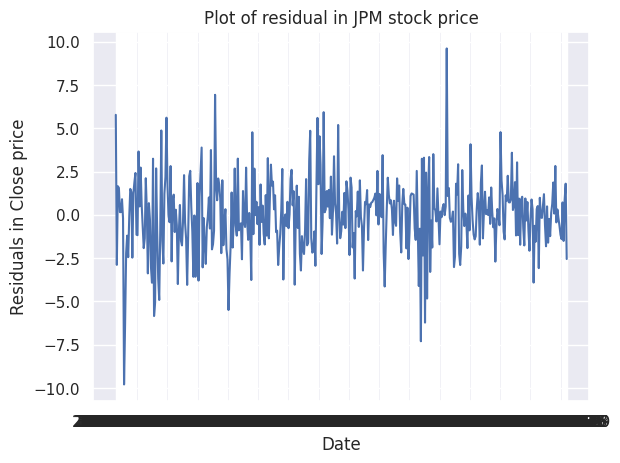

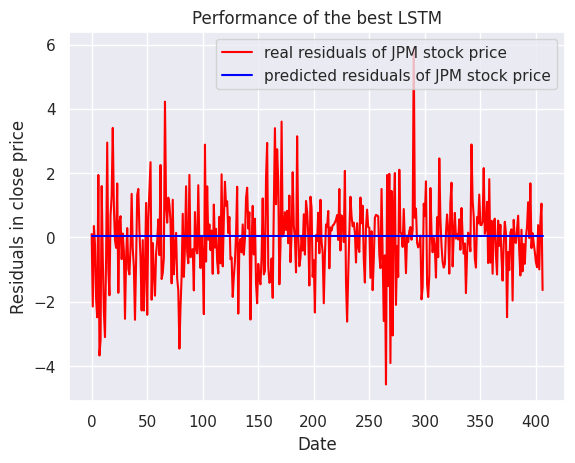

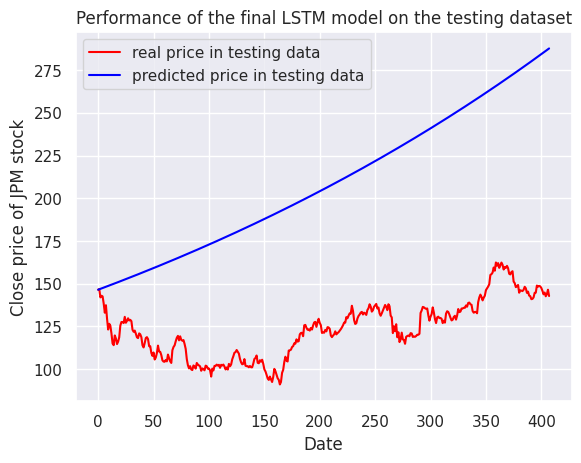

13/13 [==============================] - 0s 22ms/step


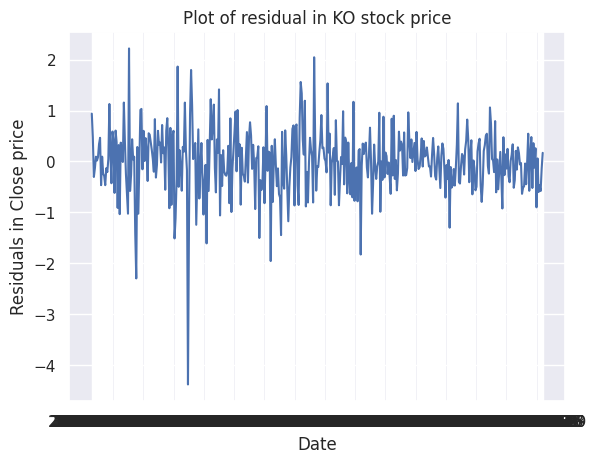

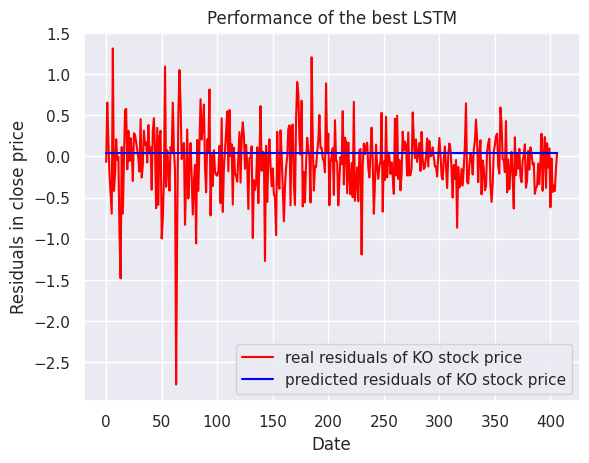

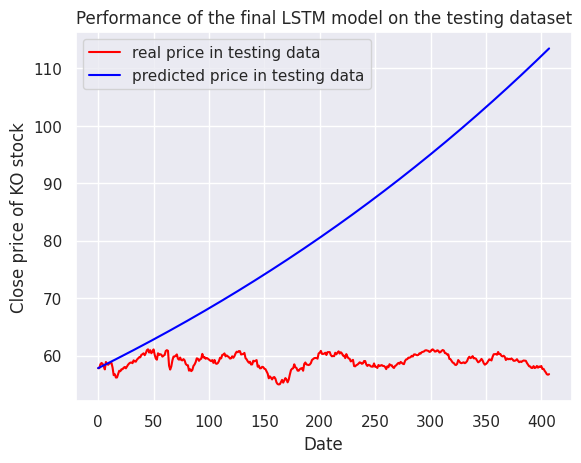

13/13 [==============================] - 0s 28ms/step


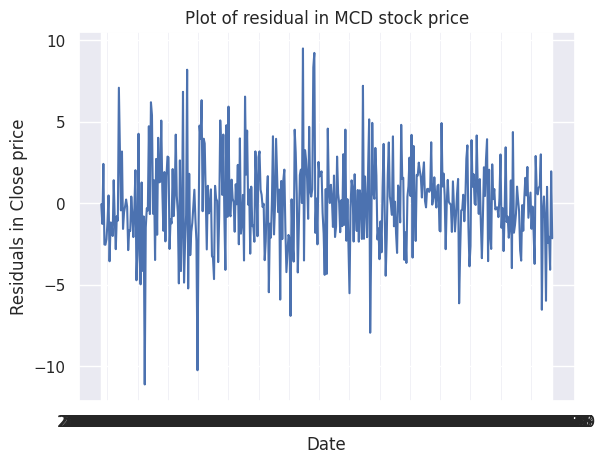

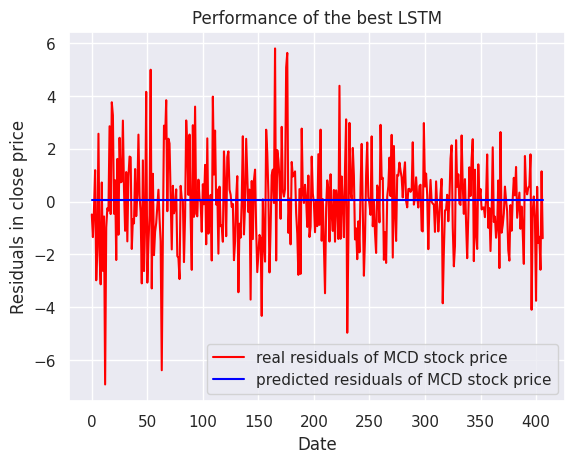

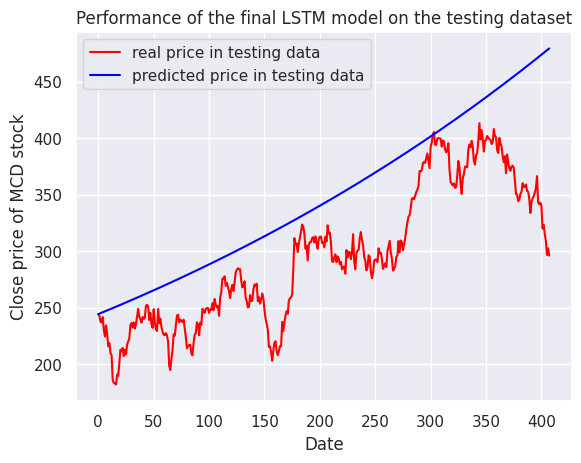

13/13 [==============================] - 0s 21ms/step


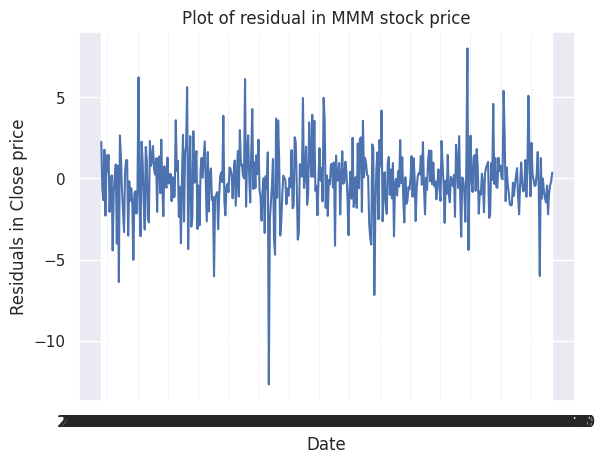

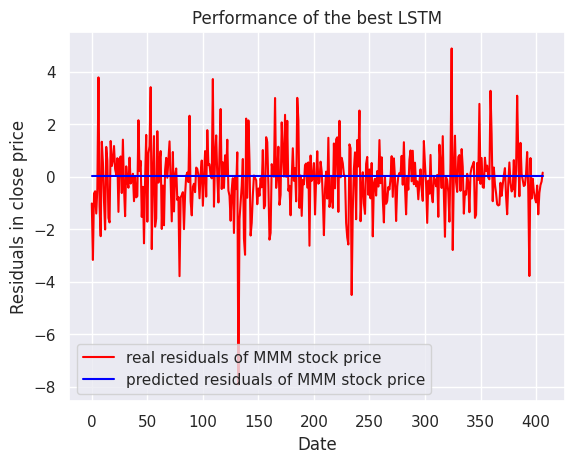

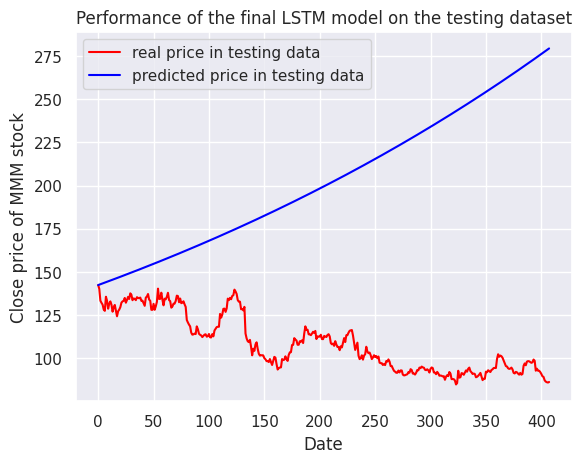

13/13 [==============================] - 0s 21ms/step


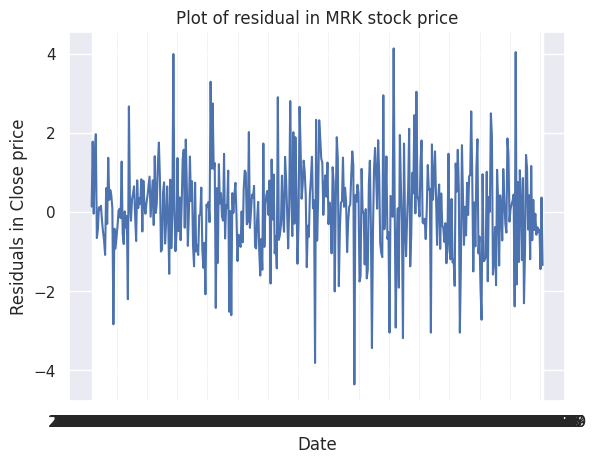

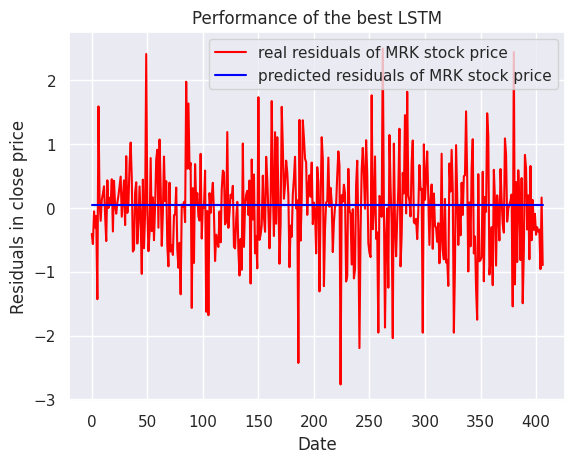

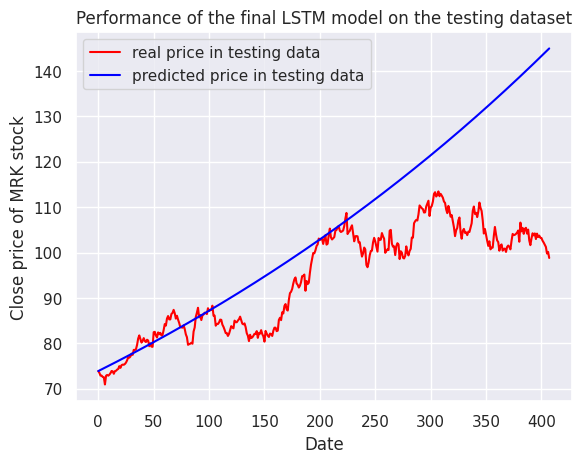

13/13 [==============================] - 0s 21ms/step


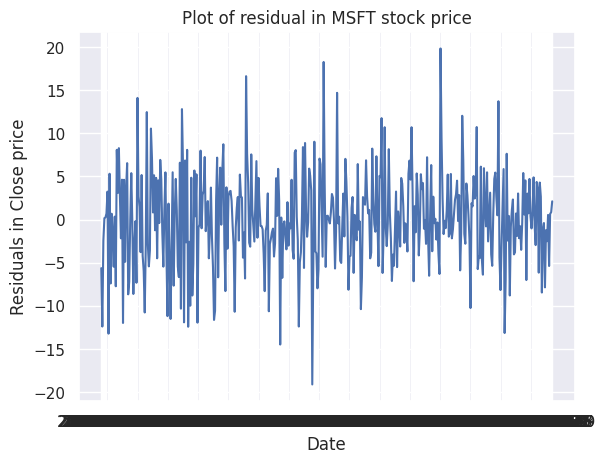

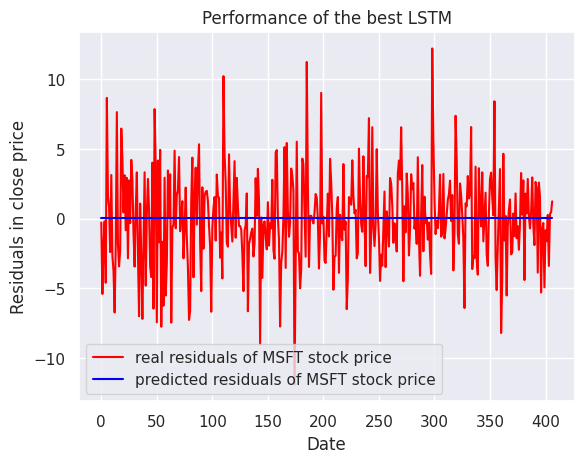

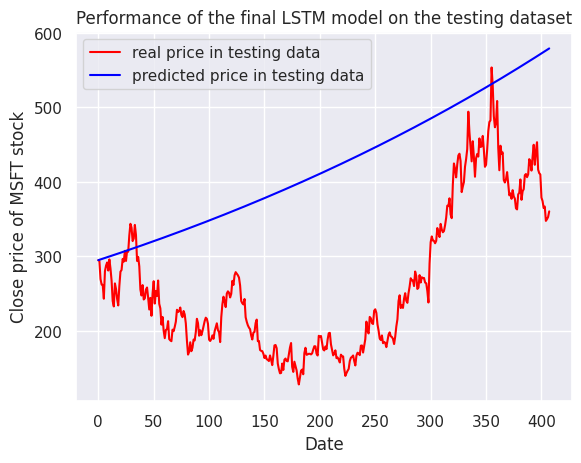

13/13 [==============================] - 0s 20ms/step


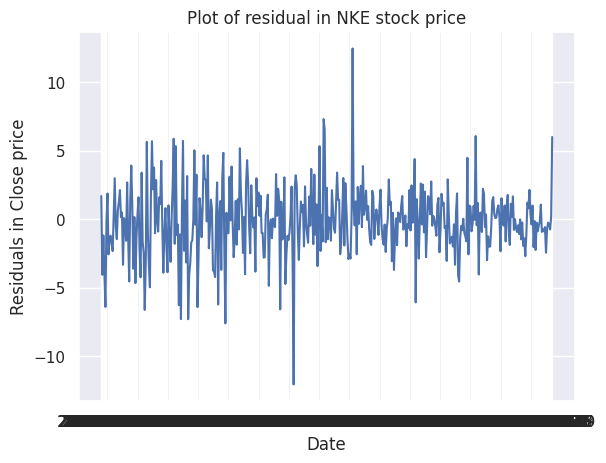

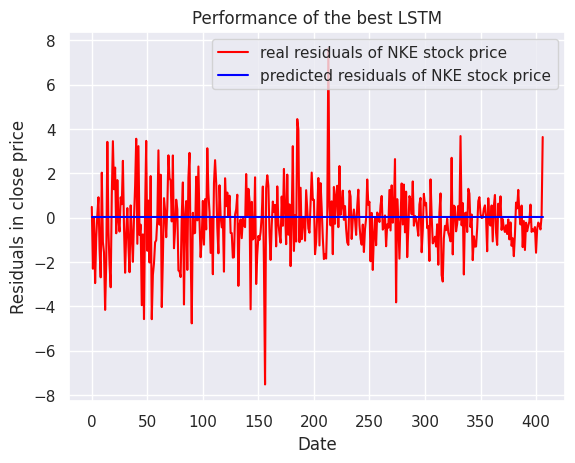

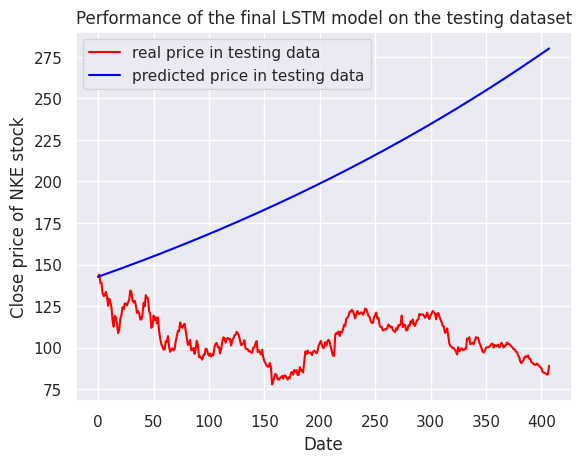

13/13 [==============================] - 0s 21ms/step


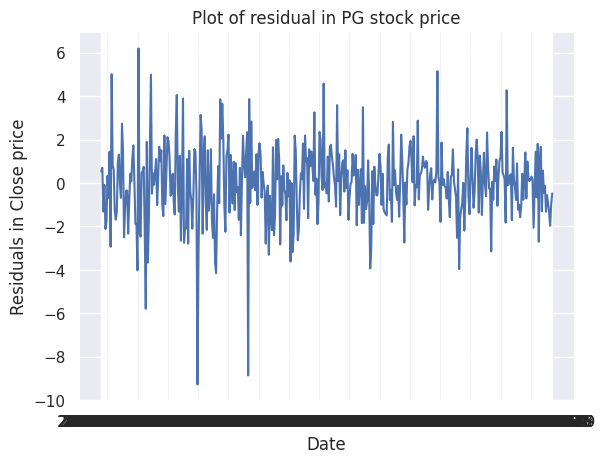

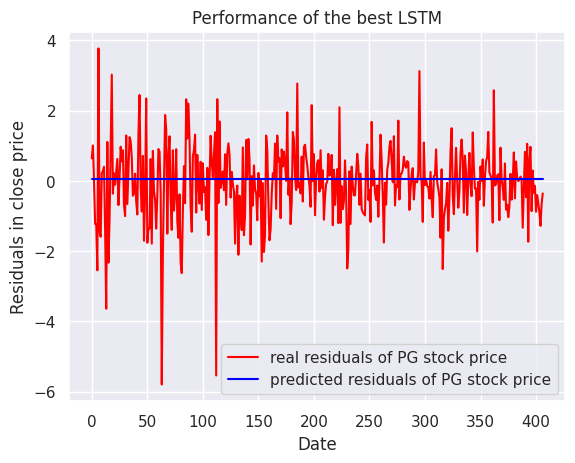

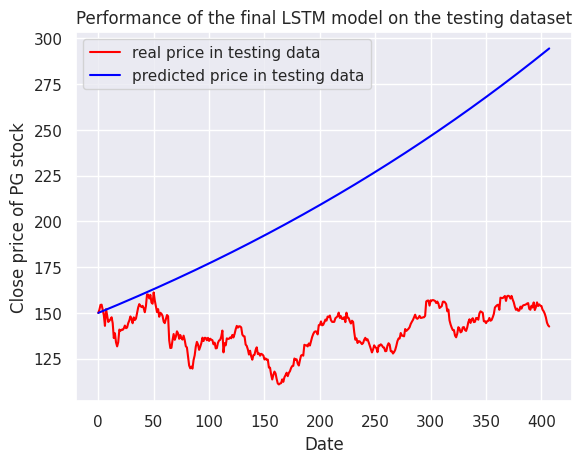

13/13 [==============================] - 0s 21ms/step


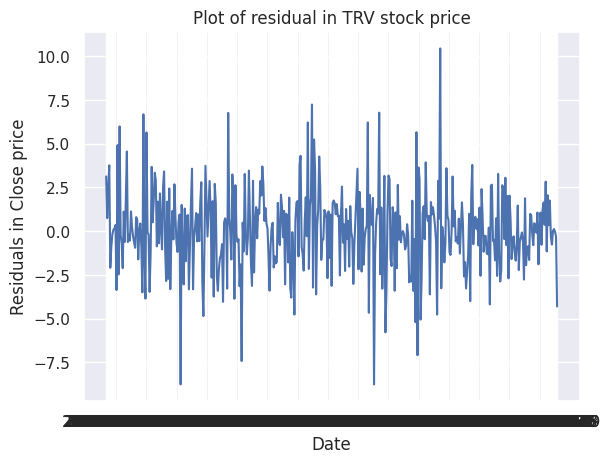

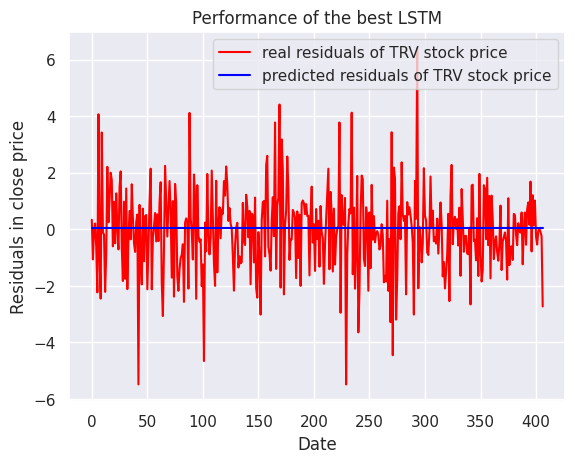

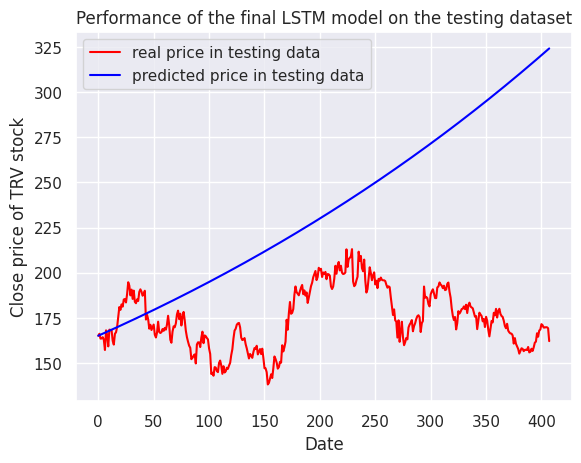

13/13 [==============================] - 0s 22ms/step


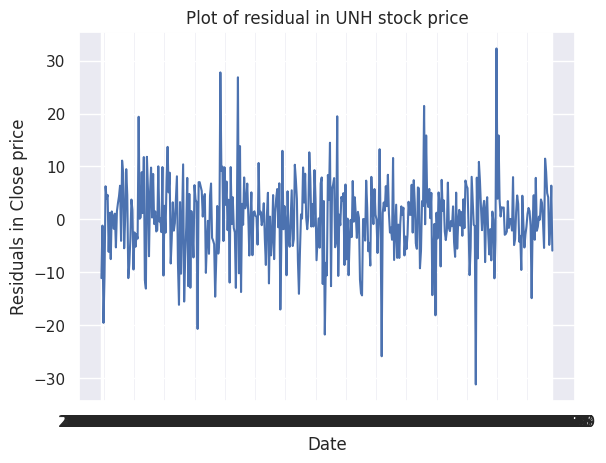

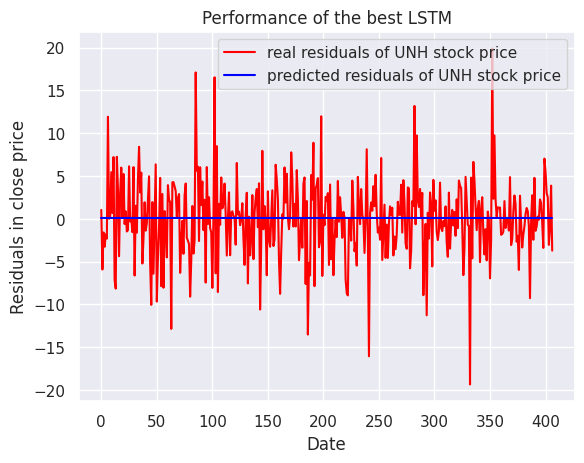

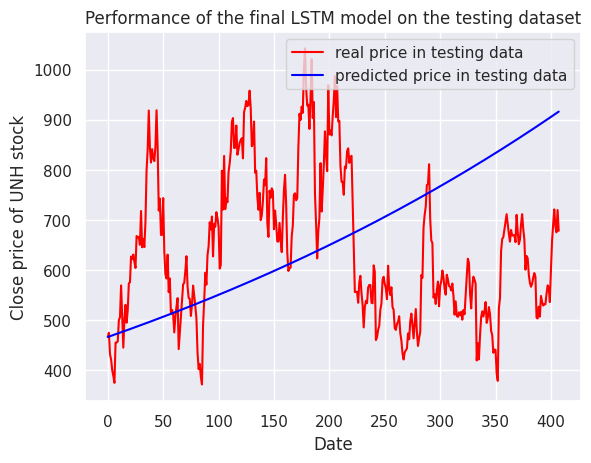

13/13 [==============================] - 0s 26ms/step


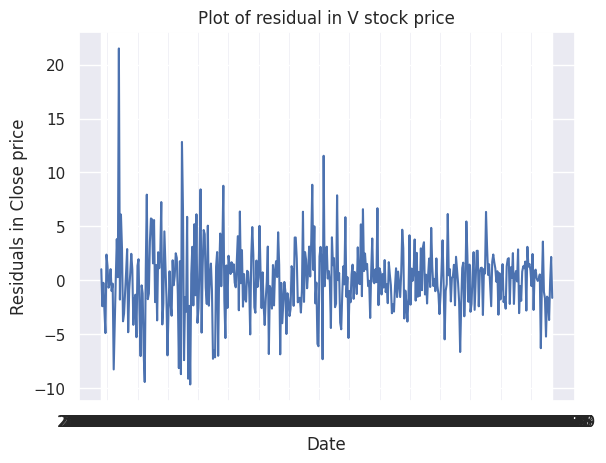

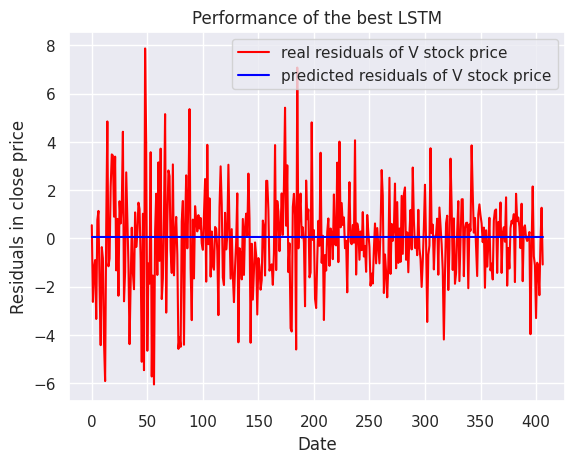

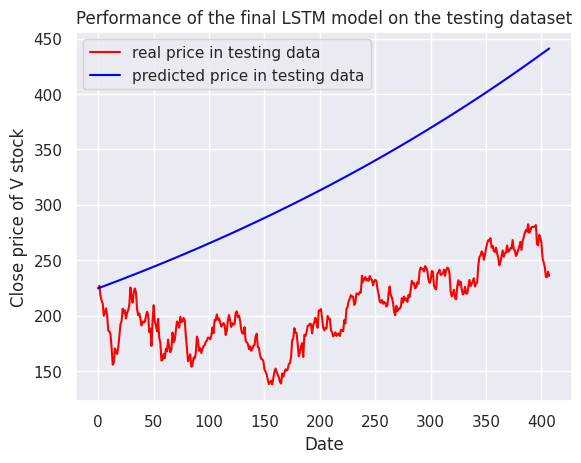

13/13 [==============================] - 0s 21ms/step


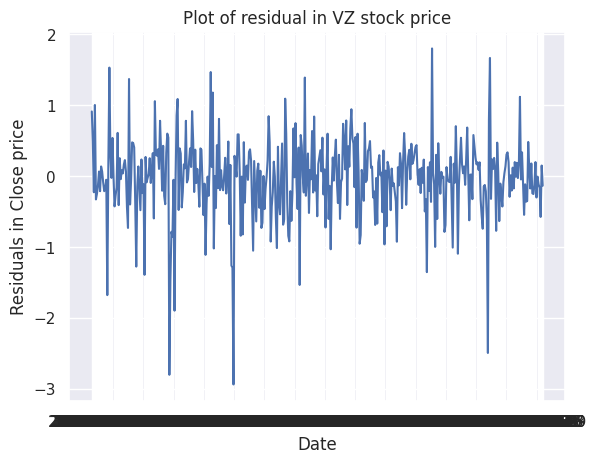

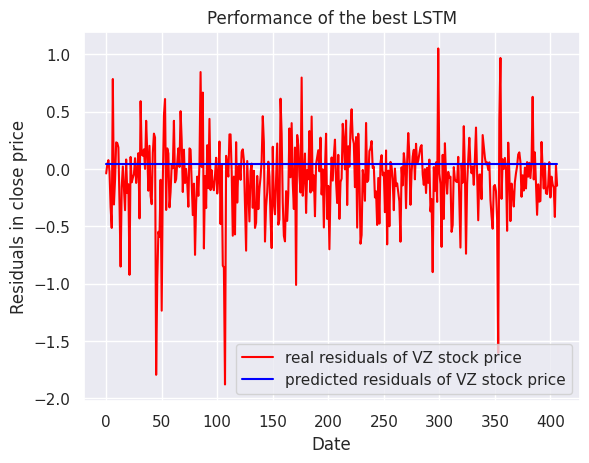

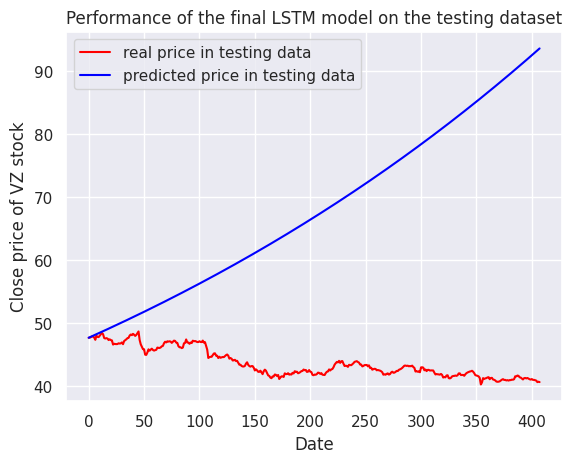

13/13 [==============================] - 0s 21ms/step


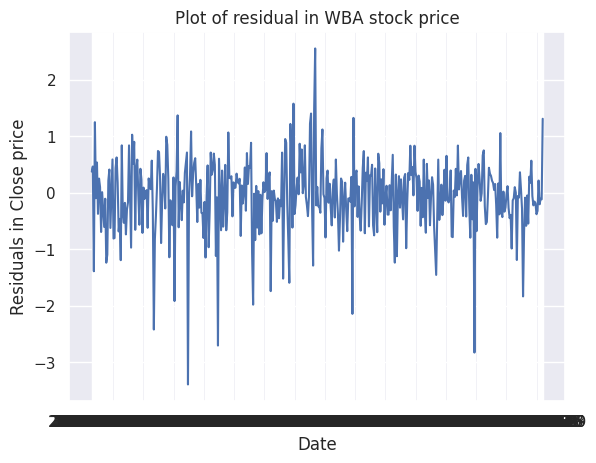

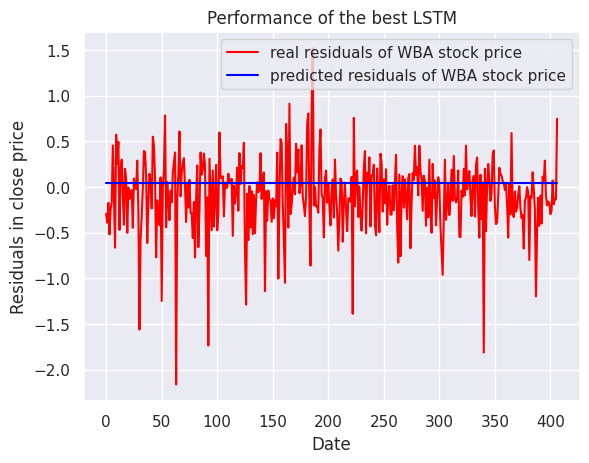

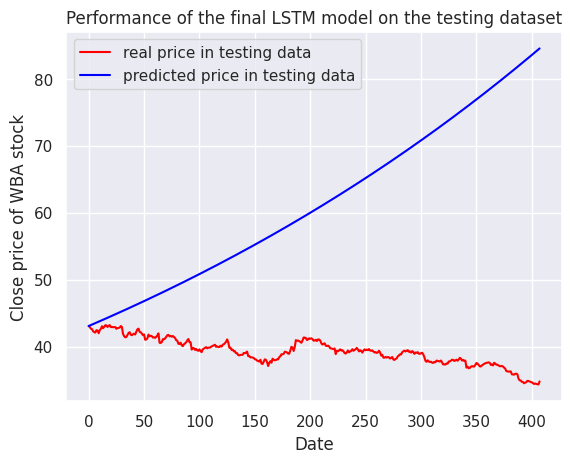

13/13 [==============================] - 0s 21ms/step


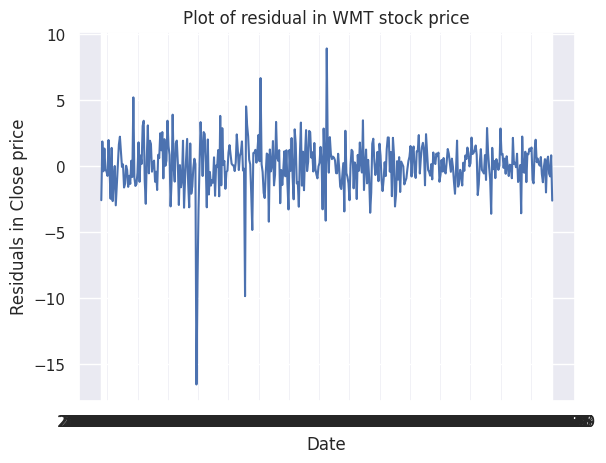

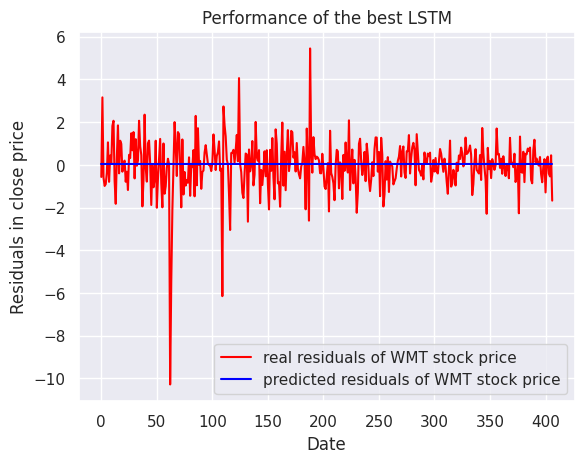

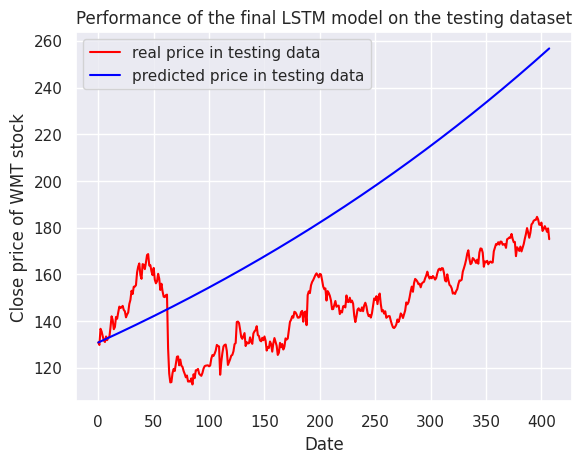

In [101]:
# Evaluate the final model on other stocks
name = []
mse_list = []
mse_real = []

for i in list_of_stock:
  name.append(i)
  df = test_data[test_data['tic'] == i].reset_index(drop = True)
  df_close = df[['date','close']]
  test_ts = df_close.set_index('date')
  test_ts_diff = np.diff(test_ts.close)
  test_ts_df = pd.DataFrame(test_ts_diff)
  test_ts_df.index = np.array(df_close.date[1:])
  test_ts_df.columns = ["close"]

  test_set = np.reshape(test_ts_df.close.values, (-1,1))
  X_test = []
  y_test = []
  for j in range(30, len(test_set)):
    X_test.append(test_set[j-30:j,0])
    y_test.append(test_set[j,0])

  X_test, y_test = np.array(X_test), np.array(y_test)
  X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1],1))
  y_test = np.reshape(y_test, (y_test.shape[0],1))
  test = pd.concat([pd.DataFrame(np.reshape(X_test, (-1, X_test.shape[1]))),pd.DataFrame(y_test)], axis =1)
  test_std = std_scaler_30.transform(test)

  X_test_std = np.reshape(test_std[:,0:-1], (-1, X_test.shape[1]))
  y_test_std = np.array(test_std[:,-1])

  y_pred_test = lstm_30_norm_dr_4.predict(X_test_std)
  mse = mean_squared_error(y_test_std, y_pred_test)
  mse_list.append(mse)

  temp_pred = np.zeros(shape=(len(X_test), test.shape[1]))
  temp_pred[:,-1] = y_test_std
  y_test_inv_10_1 = std_scaler_30.inverse_transform(temp_pred)[:,-1]

  temp_pred_1 = np.zeros(shape=(len(X_test_std), test.shape[1]))
  temp_pred_1[:,-1] = lstm_30_norm_dr_4.predict(X_test_std)[:,0]
  y_test_lstm_inv_final_1 = std_scaler_30.inverse_transform(temp_pred_1)[:,-1]

  plt.plot(test_ts_df.index, test_ts_df.close)
  plt.title(f'Plot of residual in {i} stock price')
  plt.xlabel('Date')
  plt.ylabel('Residuals in Close price')
  plt.show()

  plt.plot(y_test_std, color="red", label=f'real residuals of {i} stock price')
  plt.plot(y_pred_test, color="blue", label=f'predicted residuals of {i} stock price')
  plt.title("Performance of the best LSTM")
  plt.xlabel("Date")
  plt.ylabel("Residuals in close price")
  plt.legend()
  plt.show()

  y_pred_lstm_backtransform_final_test_1 = np.exp(np.cumsum(y_test_lstm_inv_final_1/100)) * test_ts.close[30]
  y_pred_lstm_backtransform_final_test_1 = np.insert(y_pred_lstm_backtransform_final_test_1, 0, test_ts.close[30])

  y_lstm_backtransform_test_1 = np.exp(np.cumsum(y_test_inv_10_1/100)) * test_ts.close[30]
  y_lstm_backtransform_test_1 = np.insert(y_lstm_backtransform_test_1, 0, test_ts.close[30])

  plt.plot(y_lstm_backtransform_test_1, color="red", label="real price in testing data")
  plt.plot(y_pred_lstm_backtransform_final_test_1, color="blue", label="predicted price in testing data")
  plt.title("Performance of the final LSTM model on the testing dataset")
  plt.xlabel("Date")
  plt.ylabel(f'Close price of {i} stock')
  plt.legend()
  plt.show()

  mse_1 = mean_squared_error(y_lstm_backtransform_test_1, y_pred_lstm_backtransform_final_test_1)
  mse_real.append(mse_1)


In [102]:
# Dataframe of the final model's performance on other stocks
import pandas as pd

res = pd.DataFrame({'Stock': name, 'Mean squared error (standardized price)':mse_list, 'Mean squared error (actual price)':mse_real})
res.sort_values('Mean squared error (actual price)')

,Stock,Mean squared error (standardized price),Mean squared error (actual price)
20,MRK,0.571992,271.940352
28,WBA,0.174507,682.552201
6,CSCO,0.227612,749.228075
17,KO,0.168243,811.974420
14,INTC,0.274827,819.545748
27,VZ,0.131766,830.481676
9,DOW,0.315299,969.052584
7,CVX,3.087748,1272.238287
29,WMT,1.433154,2225.868444
13,IBM,1.026170,2380.529802
